<a href="https://colab.research.google.com/github/AndreiAf02/Transfer_Learning_Fine_Tuning_Update/blob/main/Simulation_Fine_Tuning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##Simulated Data - Fine-tuning Transfer Learning

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from time import perf_counter



from sklearn.preprocessing import StandardScaler, MinMaxScaler
from imblearn.over_sampling import SMOTE
from imblearn.combine import SMOTETomek
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import RandomOverSampler
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import roc_curve, roc_auc_score, confusion_matrix, ConfusionMatrixDisplay, classification_report
import matplotlib.pyplot as plt
# !pip install pytorch-tabnet

# from pytorch_tabnet.tab_model import TabNetClassifier
import tensorflow as tf
from tensorflow.keras import layers, models
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay


from sklearn.datasets import make_classification
import random

from imblearn.datasets import make_imbalance


In [2]:
dataset_size = 50000
nfeatures = 20
ninformative = 20

k = 5


X, y = make_classification(n_samples=dataset_size, n_features=nfeatures, n_informative=ninformative,
                           n_redundant=nfeatures-ninformative, n_classes=2, random_state=42)

X, y = make_imbalance(X, y, sampling_strategy={0: int(dataset_size/2), 1:int(dataset_size/(2*k))},
                              random_state=42)

X = X.astype(int)

# X[:,:int(ninformative/2)] = X[:,:int(ninformative/2)].astype(int)

X = pd.DataFrame(X)
y = pd.DataFrame(y)

y

## Creating binary features:
X.iloc[:,0]= (X.iloc[:,0] >= -1.5).astype(int)
X.iloc[:,1]= (X.iloc[:,1] >= -1.).astype(int)
X.iloc[:,2:5]= (X.iloc[:,2:5] >= 0).astype(int)


## Creating categorical features:
bins1 = [-15, -5, 5, 15]
labels1 = [0, 1, 2]
X.iloc[:, 5] = (pd.cut(X.iloc[:, 5], bins=bins1, labels=labels1, right=False).astype(int)).astype('category')
for i in range(2):
  X.iloc[:, i+6] = (pd.cut(X.iloc[:, i+6], bins=bins1, labels=labels1, right=False).astype(int) +int(10-2*i)).astype('category')

## Second group of categorical features:
bins2 = [-15, -3, 0, 3, 15]
labels2 = [0, 1, 2, 3]
for i in range(2):
  X.iloc[:, i+8] = (pd.cut(X.iloc[:, i+8], bins=bins2, labels=labels2, right=False).astype(int) +int(5+i)).astype('category')


data_total = X
data_total['Y'] = y
data_total = data_total.dropna().reset_index(drop=True)
data_total





##  -------------------- Creating source label y2 using related information and noise from y: ------------------------

weighting = [0.9, 0.1]

length1 = len(data_total[data_total['Y']==0])
length2 = len(data_total[data_total['Y']==1])

## Creating random noise around y to create similar information for y2:
random.seed(42)
range1 = random.choices([0, 1], weights = weighting, k=length1)
range2 = random.choices([0, -1], weights = weighting, k=length2)
range_total = range1+range2

## Converting the original y-feature to source label y2, and creating new y-feature with noise
data_total['Y2'] = data_total['Y']
data_total['Y'] = data_total['Y'] + range_total

data_total


<ipython-input-2-fdc592739d5b>:32: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '0        1
1        1
2        1
3        1
4        0
        ..
29995    1
29996    1
29997    1
29998    1
29999    1
Name: 5, Length: 30000, dtype: category
Categories (3, int64): [0, 1, 2]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.iloc[:, 5] = (pd.cut(X.iloc[:, 5], bins=bins1, labels=labels1, right=False).astype(int)).astype('category')
<ipython-input-2-fdc592739d5b>:34: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '0        11
1        11
2        11
3        11
4        11
         ..
29995    11
29996    11
29997    11
29998    11
29999    11
Name: 6, Length: 30000, dtype: category
Categories (3, int64): [10, 11, 12]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.

,0,1,2,3,4,5,6,7,8,9,...,12,13,14,15,16,17,18,19,Y,Y2
0,1,1,1,0,1,1,11,9,7,8,...,2,-1,-2,-3,1,1,0,2,0,0
1,1,1,1,1,0,1,11,9,7,7,...,1,-1,0,0,-1,2,2,0,0,0
2,0,1,1,0,1,1,11,9,7,8,...,-1,0,0,0,0,-1,-2,0,0,0
3,1,1,1,1,1,1,11,9,7,8,...,2,2,4,1,0,-3,-3,2,0,0
4,0,1,1,1,0,0,11,9,7,6,...,4,-4,-1,-1,-3,2,4,3,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,1,1,1,0,1,1,11,9,8,8,...,0,3,0,4,3,3,-4,5,1,1
29996,0,1,1,1,0,1,11,9,7,8,...,-3,1,-4,0,0,3,0,-2,1,1
29997,1,1,0,1,1,1,11,9,7,7,...,6,-2,2,2,-2,3,-3,-1,1,1
29998,1,0,1,1,0,1,11,9,7,8,...,1,-2,-2,0,3,1,0,-3,1,1


In [3]:
data_total['Y'].value_counts()

,count
Y,
0,23016
1,6984


In [4]:
data_total['Y2'].value_counts()

,count
Y2,
0,25000
1,5000


In [5]:
X = data_total.iloc[:, :-2]
y = data_total.iloc[:,-2]
y2 = data_total.iloc[:,-1]
y

,Y
0,0
1,0
2,0
3,0
4,0
...,...
29995,1
29996,1
29997,1
29998,1


In [6]:
y.corr(y2)

np.float64(0.7075148912774233)

In [7]:
y.value_counts()

,count
Y,
0,23016
1,6984


In [8]:
y2.value_counts()

,count
Y2,
0,25000
1,5000


In [9]:
X.iloc[:,0].value_counts()

,count
0,
1,23310
0,6690


In [10]:
## Scaling the predictive data

scaler = MinMaxScaler()
scaler.fit(X)
X_scaled = scaler.transform(X)
X_scaled = pd.DataFrame(X_scaled)

In [11]:
data2 = pd.concat([X_scaled, y, y2], axis=1)
data2

,0,1,2,3,4,5,6,7,8,9,...,12,13,14,15,16,17,18,19,Y,Y2
0,1.0,1.0,1.0,0.0,1.0,0.5,0.5,0.5,0.666667,0.666667,...,0.583333,0.476190,0.409091,0.380952,0.50,0.523810,0.541667,0.545455,0,0
1,1.0,1.0,1.0,1.0,0.0,0.5,0.5,0.5,0.666667,0.333333,...,0.541667,0.476190,0.500000,0.523810,0.40,0.571429,0.625000,0.454545,0,0
2,0.0,1.0,1.0,0.0,1.0,0.5,0.5,0.5,0.666667,0.666667,...,0.458333,0.523810,0.500000,0.523810,0.45,0.428571,0.458333,0.454545,0,0
3,1.0,1.0,1.0,1.0,1.0,0.5,0.5,0.5,0.666667,0.666667,...,0.583333,0.619048,0.681818,0.571429,0.45,0.333333,0.416667,0.545455,0,0
4,0.0,1.0,1.0,1.0,0.0,0.0,0.5,0.5,0.666667,0.000000,...,0.666667,0.333333,0.454545,0.476190,0.30,0.571429,0.708333,0.590909,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,1.0,1.0,1.0,0.0,1.0,0.5,0.5,0.5,1.000000,0.666667,...,0.500000,0.666667,0.500000,0.714286,0.60,0.619048,0.375000,0.681818,1,1
29996,0.0,1.0,1.0,1.0,0.0,0.5,0.5,0.5,0.666667,0.666667,...,0.375000,0.571429,0.318182,0.523810,0.45,0.619048,0.541667,0.363636,1,1
29997,1.0,1.0,0.0,1.0,1.0,0.5,0.5,0.5,0.666667,0.333333,...,0.750000,0.428571,0.590909,0.619048,0.35,0.619048,0.416667,0.409091,1,1
29998,1.0,0.0,1.0,1.0,0.0,0.5,0.5,0.5,0.666667,0.666667,...,0.541667,0.428571,0.409091,0.523810,0.60,0.523810,0.541667,0.318182,1,1


In [12]:
y.corr(y2)

np.float64(0.7075148912774233)

In [13]:
y.value_counts()

,count
Y,
0,23016
1,6984


In [14]:
y2.value_counts()

,count
Y2,
0,25000
1,5000


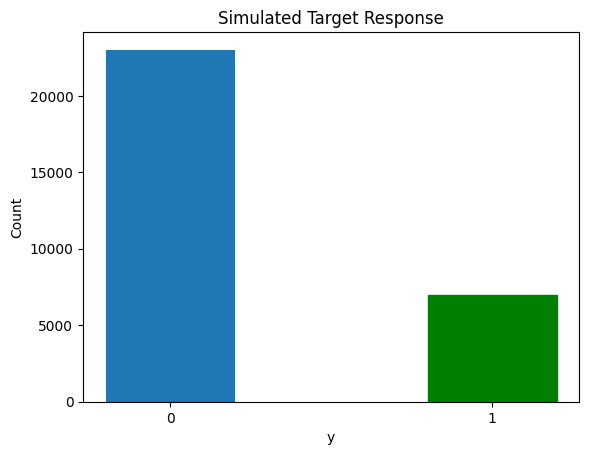

In [15]:
barlist = plt.bar([str(0),str(1)], y.value_counts(), width = 0.4)
barlist[1].set_color('g')

plt.xlabel("y")
plt.ylabel("Count")
plt.title("Simulated Target Response")
plt.show()

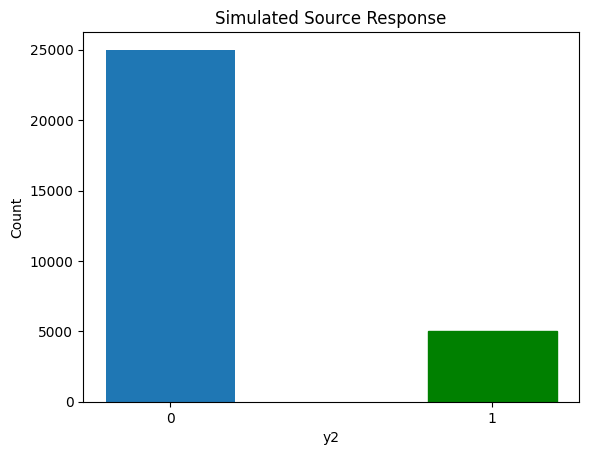

In [16]:
barlist = plt.bar([str(0),str(1)], y2.value_counts(), width = 0.4)
barlist[1].set_color('g')

plt.xlabel("y2")
plt.ylabel("Count")
plt.title("Simulated Source Response")
plt.show()

# Splitting for Source and Target Domains:


# Full Dataset:


In [17]:
data2.iloc[:,0].value_counts()

,count
0,
1.0,23310
0.0,6690


In [18]:
data_S = data2[data2[0] >= 0.5].reset_index(drop=True)  ## Source domain and classification - Men
data_S_X = data_S.iloc[:,:-2]
data_S_y = data_S.iloc[:, -1]

data_S_full = pd.concat([data_S_X, data_S_y], axis=1)

data_T = data2[data2[0] < 0.5].reset_index(drop=True) ## Target domain and classification - Women

data_T_X = data_T.iloc[:,:-2]
data_T_y = data_T.iloc[:, -2]    ## Response variable of interest in Default

data_T_full = pd.concat([data_T_X, data_T_y], axis=1)

In [19]:
data_S_full

,0,1,2,3,4,5,6,7,8,9,...,11,12,13,14,15,16,17,18,19,Y2
0,1.0,1.0,1.0,0.0,1.0,0.5,0.5,0.5,0.666667,0.666667,...,0.50,0.583333,0.476190,0.409091,0.380952,0.50,0.523810,0.541667,0.545455,0
1,1.0,1.0,1.0,1.0,0.0,0.5,0.5,0.5,0.666667,0.333333,...,0.45,0.541667,0.476190,0.500000,0.523810,0.40,0.571429,0.625000,0.454545,0
2,1.0,1.0,1.0,1.0,1.0,0.5,0.5,0.5,0.666667,0.666667,...,0.55,0.583333,0.619048,0.681818,0.571429,0.45,0.333333,0.416667,0.545455,0
3,1.0,1.0,1.0,1.0,1.0,0.5,0.5,0.5,0.666667,0.666667,...,0.30,0.375000,0.523810,0.318182,0.619048,0.25,0.571429,0.541667,0.500000,0
4,1.0,1.0,0.0,1.0,1.0,0.5,0.5,0.5,0.333333,0.333333,...,0.50,0.500000,0.619048,0.500000,0.619048,0.55,0.476190,0.500000,0.454545,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23305,1.0,1.0,0.0,0.0,1.0,0.5,0.5,0.5,0.333333,0.666667,...,0.75,0.625000,0.619048,0.454545,0.523810,0.60,0.333333,0.541667,0.318182,1
23306,1.0,1.0,1.0,0.0,0.0,0.5,0.5,0.5,0.666667,0.333333,...,0.50,0.500000,0.476190,0.500000,0.523810,0.50,0.619048,0.541667,0.500000,1
23307,1.0,1.0,1.0,0.0,1.0,0.5,0.5,0.5,1.000000,0.666667,...,0.55,0.500000,0.666667,0.500000,0.714286,0.60,0.619048,0.375000,0.681818,1
23308,1.0,1.0,0.0,1.0,1.0,0.5,0.5,0.5,0.666667,0.333333,...,0.50,0.750000,0.428571,0.590909,0.619048,0.35,0.619048,0.416667,0.409091,1


In [20]:
data_T_full

,0,1,2,3,4,5,6,7,8,9,...,11,12,13,14,15,16,17,18,19,Y
0,0.0,1.0,1.0,0.0,1.0,0.5,0.5,0.5,0.666667,0.666667,...,0.35,0.458333,0.523810,0.500000,0.523810,0.45,0.428571,0.458333,0.454545,0
1,0.0,1.0,1.0,1.0,0.0,0.0,0.5,0.5,0.666667,0.000000,...,0.15,0.666667,0.333333,0.454545,0.476190,0.30,0.571429,0.708333,0.590909,0
2,0.0,1.0,1.0,0.0,1.0,0.5,0.5,0.5,0.666667,0.666667,...,0.75,0.583333,0.476190,0.454545,0.476190,0.70,0.571429,0.291667,0.727273,0
3,0.0,1.0,1.0,1.0,1.0,0.5,0.5,0.5,0.666667,0.000000,...,0.35,0.625000,0.523810,0.454545,0.619048,0.45,0.523810,0.833333,0.500000,0
4,0.0,1.0,0.0,0.0,1.0,0.5,0.5,0.5,0.666667,0.333333,...,0.65,0.416667,0.666667,0.636364,0.619048,0.65,0.333333,0.541667,0.409091,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6685,0.0,0.0,1.0,1.0,1.0,0.5,0.5,0.5,0.666667,1.000000,...,0.50,0.500000,0.571429,0.545455,0.619048,0.45,0.571429,0.375000,0.500000,1
6686,0.0,1.0,0.0,1.0,1.0,0.5,0.5,0.0,0.666667,1.000000,...,0.50,0.458333,0.523810,0.500000,0.476190,0.30,0.476190,0.333333,0.681818,1
6687,0.0,1.0,0.0,0.0,1.0,0.5,0.5,0.5,0.666667,0.666667,...,0.60,0.416667,0.523810,0.500000,0.619048,0.40,0.523810,0.458333,0.363636,1
6688,0.0,1.0,1.0,1.0,0.0,0.5,0.5,0.5,0.666667,0.666667,...,0.55,0.375000,0.571429,0.318182,0.523810,0.45,0.619048,0.541667,0.363636,1


## Source domain and task labels:

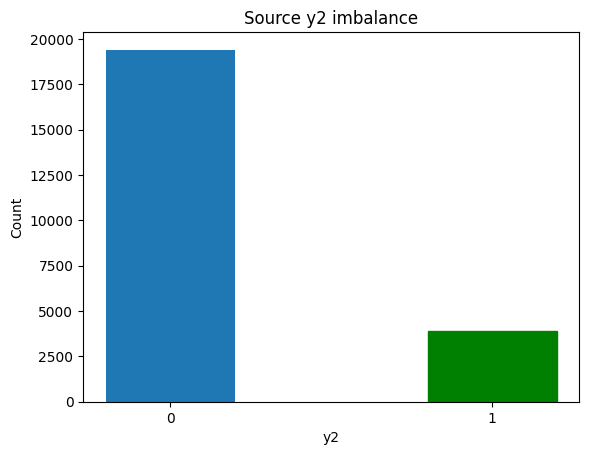

In [21]:
barlist_S = plt.bar([str(0),str(1)], data_S_y.value_counts(), width = 0.4)
barlist_S[1].set_color('g')

plt.xlabel("y2")
plt.ylabel("Count")
plt.title("Source y2 imbalance")
plt.show()

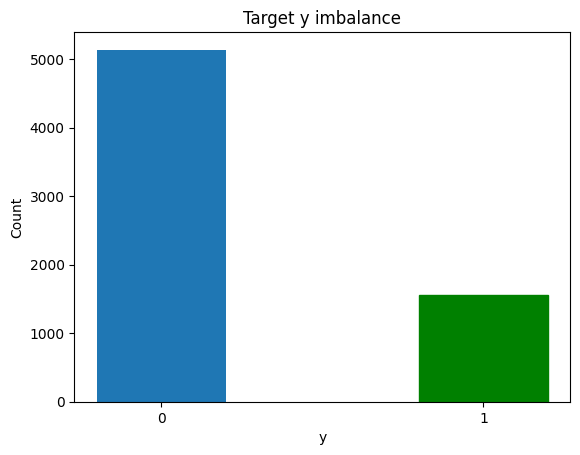

In [22]:
barlist_T = plt.bar([str(0),str(1)], data_T_y.value_counts(), width = 0.4)
barlist_T[1].set_color('g')

plt.xlabel("y")
plt.ylabel("Count")
plt.title("Target y imbalance")
plt.show()

## Updated Code (Modified from Shreya's code):

In [23]:
def create_dnn_model(input_shape):
  model = models.Sequential([layers.Dense(64, activation='relu', input_dim=input_shape),
        layers.Dense(32, activation='relu'),
        layers.Dense(32, activation='relu'),
        layers.Dense(32, activation='relu'),
        layers.Dense(32, activation='relu'),
        layers.Dense(32, activation='relu'),
        layers.Dense(1, activation='sigmoid')  # For binary classification (yes/no diabetes)
    ])
  model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['AUC'])

  model.summary()
  print(len(model.layers))

  return model

# def create_dnn_model(input_shape):
#   model = models.Sequential([layers.Dense(64, activation='relu', input_dim=input_shape),
#         layers.Dense(32, activation='relu'),
#         layers.Dense(1, activation='sigmoid')  # For binary classification (yes/no diabetes)
#     ])

#   model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['AUC'])

#   return model



def train_and_evaluate(model, X_train, X_test, y_train, y_test, domain):

    time_start = perf_counter()

    # Training and validation
    model.fit(X_train, y_train, epochs=10, batch_size=32, validation_split=0.2)

    # Predict probabilities and calculate AUC
    y_pred_prob = model.predict(X_test).ravel()
    auc = roc_auc_score(y_test, y_pred_prob)
    print(f"AUC-ROC: {auc}")

    # Compute ROC curve
    fpr, tpr, _ = roc_curve(y_test, y_pred_prob)

    # Convert probabilities to binary predictions for confusion matrix
    y_pred_class = (y_pred_prob >= 0.5).astype(int)

    # Compute and print classification report
    class_report = classification_report(y_test, y_pred_class)
    print("Classification Report:")
    print(class_report)

    # Compute confusion matrix
    conf_matrix = confusion_matrix(y_test, y_pred_class)
    conf_disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix)

    # Plot ROC curve and Confusion Matrix side by side
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

    # ROC Curve
    ax1.plot(fpr, tpr, color='blue', label=f'AUC-ROC = {auc:.2f}')
    ax1.plot([0, 1], [0, 1], color='gray', linestyle='--')
    ax1.set_xlabel('False Positive Rate')
    ax1.set_ylabel('True Positive Rate')
    ax1.set_title('Receiver Operating Characteristic (ROC) Curve')
    ax1.legend(loc='lower right')
    ax1.grid()

    # Confusion Matrix
    conf_disp.plot(ax=ax2, cmap='Blues')
    ax2.set_title('Confusion Matrix')
    plt.tight_layout()
    plt.show()

    # Calculate precision and recall for different thresholds
    precision, recall, thresholds = precision_recall_curve(y_test, y_pred_prob)

    # Find the threshold where precision and recall are balanced
    f1_scores = 2 * (precision * recall) / (precision + recall)
    best_threshold = thresholds[f1_scores.argmax()]

    print(f"Best threshold based on F1-score: {best_threshold}")

    time_stop = perf_counter()

    print('Time elapsed (performance):', time_stop-time_start)

    model.save('model.h5')
    model.save_weights('model_wt.weights.h5')

    return model


In [24]:
def train_and_evaluate_nosave(model, X_train, X_test, y_train, y_test, domain):

    time_start = perf_counter()

    # Training and validation
    model.fit(X_train, y_train, epochs=10, batch_size=32, validation_split=0.2)

    # Predict probabilities and calculate AUC
    y_pred_prob = model.predict(X_test).ravel()
    auc = roc_auc_score(y_test, y_pred_prob)
    print(f"AUC-ROC: {auc}")

    # Compute ROC curve
    fpr, tpr, _ = roc_curve(y_test, y_pred_prob)

    # Convert probabilities to binary predictions for confusion matrix
    y_pred_class = (y_pred_prob >= 0.5).astype(int)

    # Compute and print classification report
    class_report = classification_report(y_test, y_pred_class)
    print("Classification Report:")
    print(class_report)

    # Compute confusion matrix
    conf_matrix = confusion_matrix(y_test, y_pred_class)
    conf_disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix)

    fpr = conf_matrix[0][1]/(conf_matrix[0][0]+conf_matrix[0][1])
    fnr = conf_matrix[1][0]/(conf_matrix[1][0] + conf_matrix[1][1])

    print(fpr)
    print(fnr)

    time_stop = perf_counter()

    print('Time elapsed (performance):', time_stop-time_start)

    return fpr, fnr


In [25]:
def fine_tuning(X_train, X_test, y_train, y_test, llim, ulim):
    new_model = create_dnn_model(X_S_train.shape[1])
    # new_model = tf.keras.models.load_model('model.h5')
    new_model.load_weights('model_wt.weights.h5')

    for layer in new_model.layers[llim:ulim]:
        layer.trainable = False
    for layer in new_model.layers[-1:]:
        layer.trainable = False

    for layer in new_model.layers:
        if layer.trainable == True:
          print("Trainable")
        else:
          print("Not Trainable")

    fpr, fnr = train_and_evaluate_nosave(new_model, X_train, X_test, y_train, y_test, "Target")
    return fpr, fnr

In [26]:
def Transductive_TL(model, X_test, y_test, domain):

    time_start = perf_counter()

    # Predict probabilities and calculate AUC
    y_pred_prob = model.predict(X_test).ravel()
    auc = roc_auc_score(y_test, y_pred_prob)
    print(f"AUC-ROC: {auc}")

    # Compute ROC curve
    fpr, tpr, _ = roc_curve(y_test, y_pred_prob)

    # Convert probabilities to binary predictions for confusion matrix
    y_pred_class = (y_pred_prob >= 0.5).astype(int)

    # Compute and print classification report
    class_report = classification_report(y_test, y_pred_class)
    print("Classification Report:")
    print(class_report)

    # Compute confusion matrix
    conf_matrix = confusion_matrix(y_test, y_pred_class)
    conf_disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix)

    # Plot ROC curve and Confusion Matrix side by side
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

    # ROC Curve
    ax1.plot(fpr, tpr, color='blue', label=f'AUC-ROC = {auc:.2f}')
    ax1.plot([0, 1], [0, 1], color='gray', linestyle='--')
    ax1.set_xlabel('False Positive Rate')
    ax1.set_ylabel('True Positive Rate')
    ax1.set_title('Receiver Operating Characteristic (ROC) Curve')
    ax1.legend(loc='lower right')
    ax1.grid()

    # Confusion Matrix
    # print('Confusion matrix:', conf_matrix)
    fpr = conf_matrix[0][1]/(conf_matrix[0][0]+conf_matrix[0][1])
    tnr = 1-fpr

    fnr = conf_matrix[1][0]/(conf_matrix[1][0] + conf_matrix[1][1])
    tpr = 1 - fnr
    print('FPR', fpr, 'TPR:', tpr, 'FNR:', fnr, 'TNR:', tnr)
    conf_disp.plot(ax=ax2, cmap='Blues')
    ax2.set_title('Confusion Matrix')
    plt.tight_layout()
    plt.show()

    # Calculate precision and recall for different thresholds
    precision, recall, thresholds = precision_recall_curve(y_test, y_pred_prob)

    # Find the threshold where precision and recall are balanced
    f1_scores = 2 * (precision * recall) / (precision + recall)
    best_threshold = thresholds[f1_scores.argmax()]

    print(f"Best threshold based on F1-score: {best_threshold}")
    print('False Negative Rate:', fnr)

    time_stop = perf_counter()

    print('Time elapsed (performance):', time_stop-time_start)

# Over/undersampling functions:

## Undersampling functions:

In [27]:
import random

def SRS_undersampler(data, data_column):
    data_majority = data[data_column.isin([0])]
    data_minority = data[data_column.isin([1])]
    undersample_size = len(data_minority)
    oversample_size = len(data_majority)

    print(undersample_size)
    print(oversample_size)

    np.random.seed(123)
    data_maj_rus = data_majority.sample(n=undersample_size, replace=False)
    data_SRS_RUS = pd.concat([data_maj_rus, data_minority])
    X_SRS = data_SRS_RUS.iloc[:, :-1]
    y_SRS = data_SRS_RUS.iloc[:, -1]

    return X_SRS, y_SRS


def SRSwR_undersampler(data, data_column):
    data_majority = data[data_column.isin([0])]
    data_minority = data[data_column.isin([1])]
    undersample_size = len(data_minority)
    oversample_size = len(data_majority)

    print(undersample_size)
    print(oversample_size)

    np.random.seed(123)
    data_maj_rus = data_majority.sample(n=undersample_size, replace=True)
    data_SRS_RUS = pd.concat([data_maj_rus, data_minority])
    X_SRS = data_SRS_RUS.iloc[:, :-1]
    y_SRS = data_SRS_RUS.iloc[:, -1]

    return X_SRS, y_SRS


def systematic_undersampler(data, data_column):
    data_majority = data[data_column.isin([0])]
    data_minority = data[data_column.isin([1])]
    undersample_size = len(data_minority)
    oversample_size = len(data_majority)
    print(undersample_size)
    print(oversample_size)

    k = oversample_size/undersample_size
    print(k)
    np.random.seed(123)
    start = random.randint(1, int(k))
    print(start)
    Row = []
    for i in range(undersample_size):
      row = start+int(k*i)-1
      Row.append(row)
    print(Row)
    data_maj_rus = pd.DataFrame()
    data_maj_rus = data_majority.iloc[Row]
    data_maj_rus
    data_Sy_RUS = pd.concat([data_maj_rus, data_minority])

    X_Sy = data_Sy_RUS.iloc[:, :-1]
    y_Sy = data_Sy_RUS.iloc[:, -1]

    return X_Sy, y_Sy



def multi_systematic_undersampler(data, data_column, m):
    data_majority = data[data_column.isin([0])]
    data_minority = data[data_column.isin([1])]
    undersample_size = len(data_minority)
    oversample_size = len(data_majority)
    print(undersample_size)
    print(oversample_size)

    k = oversample_size/undersample_size
    print(k)
    np.random.seed(123)
    start = random.sample(range(1, int(k*m)), m)
    Row = []
    for j in range(len(start)):
      for i in range(int(undersample_size/m)):
        row = start[j]+int(k*i)-1
        Row.append(row)
    print(Row)
    data_maj_rus = pd.DataFrame()
    data_maj_rus = data_majority.iloc[Row]
    data_maj_rus
    data_Sy_RUS = pd.concat([data_maj_rus, data_minority])

    X_Sy = data_Sy_RUS.iloc[:, :-1]
    y_Sy = data_Sy_RUS.iloc[:, -1]

    return X_Sy, y_Sy

## Oversampling functions:

In [28]:
def SRSwR_oversampler(data, data_column):
    data_majority = data[data_column.isin([0])]
    data_minority = data[data_column.isin([1])]
    undersample_size = len(data_minority)
    oversample_size = len(data_majority)

    print(undersample_size)
    print(oversample_size)

    np.random.seed(123)
    data_min_ros = data_minority.sample(n=oversample_size - undersample_size, replace=True)
    data_SRS_ROS = pd.concat([data_majority, data_minority, data_min_ros])
    X_SRS = data_SRS_ROS.iloc[:, :-1]
    y_SRS = data_SRS_ROS.iloc[:, -1]

    return X_SRS, y_SRS

# data_S_min_ros = data_S_minority.sample(n=oversample_size - undersample_size, replace=True)


def systematic_resampler(data, data_column, k):
    data_majority = data[data_column.isin([0])]
    data_minority = data[data_column.isin([1])]
    undersample_size = len(data_minority)
    oversample_size = len(data_majority)

    print(undersample_size)
    print(oversample_size)

    Nsamples = k*(oversample_size-undersample_size)/undersample_size
    print('Nsamples=', Nsamples)

    np.random.seed(123)
    start = np.random.choice(int(k), int(Nsamples), replace=True)
    Row = []
    for j in range(len(start)):
      for i in range(int(undersample_size/k)):
        row = start[j]+int(k*i)-1
        Row.append(row)
    data_min_ros = pd.DataFrame()
    data_min_ros = data_minority.iloc[Row]

    data_Sy_ROS = pd.concat([data_majority, data_minority, data_min_ros])
    X_Sy = data_Sy_ROS.iloc[:, :-1]
    y_Sy = data_Sy_ROS.iloc[:, -1]

    return X_Sy, y_Sy



In [29]:
X_S_train, X_S_test, y_S_train, y_S_test = train_test_split(data_S_X, data_S_y, test_size=0.20, random_state=0)
X_T_train, X_T_test, y_T_train, y_T_test = train_test_split(data_T_X, data_T_y, test_size=0.20, random_state=0)

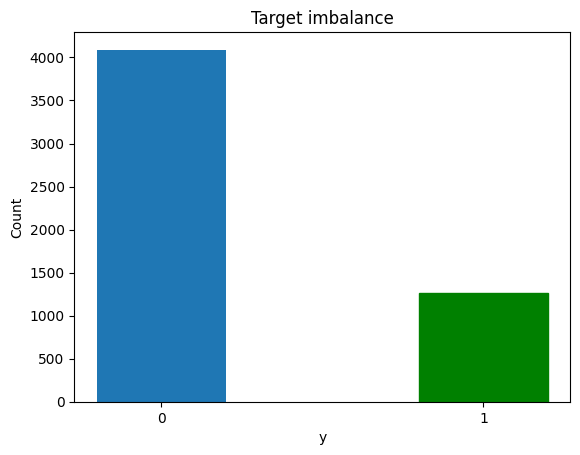

In [30]:
barlist = plt.bar([str(0),str(1)], y_T_train.value_counts(), width = 0.4)
barlist[1].set_color('g')

plt.xlabel("y")
plt.ylabel("Count")
plt.title("Target imbalance")
plt.show()

In [31]:
print('X_S_train:',np.shape(X_S_train))
print('y_S_train:',np.shape(y_S_train))
print('X_S_test:',np.shape(X_S_test))
print('y_S_test:',np.shape(y_S_test))

X_S_train: (18648, 20)
y_S_train: (18648,)
X_S_test: (4662, 20)
y_S_test: (4662,)


# Original (Imbalanced) dataset:

## Standard Machine Learning:

In [33]:
model_source = create_dnn_model(X_S_train.shape[1])
train_and_evaluate_nosave(model_source, X_T_train, X_T_test, y_T_train, y_T_test, "Target")

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - AUC: 0.4884 - loss: 0.5891 - val_AUC: 0.6266 - val_loss: 0.5492
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.5867 - loss: 0.5502 - val_AUC: 0.7217 - val_loss: 0.5218
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7039 - loss: 0.5078 - val_AUC: 0.7490 - val_loss: 0.4614
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7337 - loss: 0.4733 - val_AUC: 0.7514 - val_loss: 0.4668
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7583 - loss: 0.4448 - val_AUC: 0.7586 - val_loss: 0.4381
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7439 - loss: 0.4507 - val_AUC: 0.7617 - val_loss: 0.4459
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7673 - loss: 0.4368 - val_AUC: 0.7632 - val_loss: 0.4485
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7595 - loss: 0.4387 - val_AUC: 0.7684 - val_loss: 0.4420
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

(np.float64(0.027645376549094377), np.float64(0.6020761245674741))

## With Transfer Learning:

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_7 (Dense)                 │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - AUC: 0.6401 - loss: 0.4543 - val_AUC: 0.8646 - val_loss: 0.3200
Epoch 2/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.8708 - loss: 0.3019 - val_AUC: 0.9002 - val_loss: 0.2788
Epoch 3/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.9133 - loss: 0.2597 - val_AUC: 0.9217 - val_loss: 0.2494
Epoch 4/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.9224 - loss: 0.2409 - val_AUC: 0.9345 - val_loss: 0.2253
Epoch 5/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.9374 - loss: 0.2132 - val_AUC: 0.9516 - val_loss: 0.1947
Epoch 6/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.9485 - loss: 0.1975 - val_AUC: 0.9510 - val_loss: 0.1988
Epoch 7/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.9589 - loss: 0.1805 - val_AUC: 0.9591 - val_loss: 0.1796
Epoch 8/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.9611 - loss: 0.1730 - val_AUC: 0.9643 - val_loss: 0.1717
Epoch 9/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step -

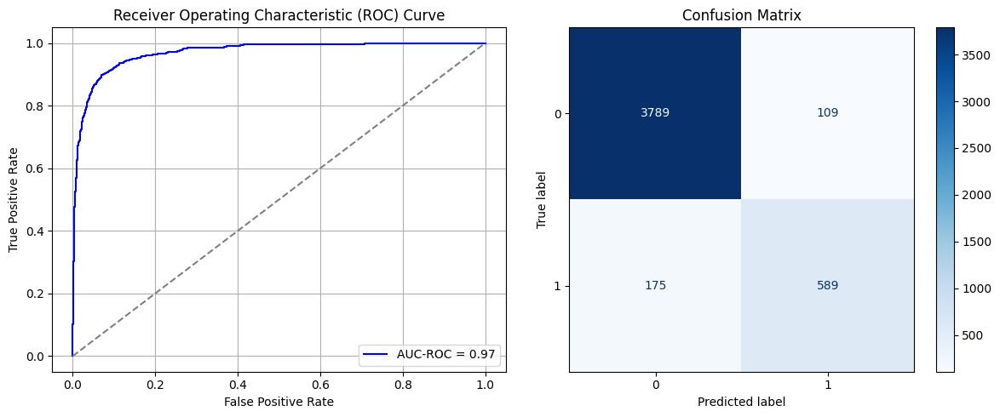

Best threshold based on F1-score: 0.36299803853034973
Time elapsed (performance): 26.18020414


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_14 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_15 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_16 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_17 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_18 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_19 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_20 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - AUC: 0.7432 - loss: 0.5988 - val_AUC: 0.7311 - val_loss: 0.4903
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7513 - loss: 0.4628 - val_AUC: 0.7352 - val_loss: 0.4740
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7378 - loss: 0.4627 - val_AUC: 0.7382 - val_loss: 0.4662
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7433 - loss: 0.4551 - val_AUC: 0.7406 - val_loss: 0.4628
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7557 - loss: 0.4430 - val_AUC: 0.7441 - val_loss: 0.4580
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7499 - loss: 0.4552 - val_AUC: 0.7457 - val_loss: 0.4563
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7543 - loss: 0.4459 - val_AUC: 0.7463 - val_loss: 0.4585
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7702 - loss: 0.4353 - val_AUC: 0.7493 - val_loss: 0.4548
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - A

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_21 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_22 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_23 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_24 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_25 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_26 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_27 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - AUC: 0.7438 - loss: 0.5940 - val_AUC: 0.7302 - val_loss: 0.4904
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7497 - loss: 0.4670 - val_AUC: 0.7359 - val_loss: 0.4722
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7541 - loss: 0.4483 - val_AUC: 0.7391 - val_loss: 0.4641
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7507 - loss: 0.4579 - val_AUC: 0.7421 - val_loss: 0.4609
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7481 - loss: 0.4469 - val_AUC: 0.7451 - val_loss: 0.4577
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7447 - loss: 0.4483 - val_AUC: 0.7468 - val_loss: 0.4580
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7531 - loss: 0.4546 - val_AUC: 0.7468 - val_loss: 0.4663
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7527 - loss: 0.4538 - val_AUC: 0.7485 - val_loss: 0.4608
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7523 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_28 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_29 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_30 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_31 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_32 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_33 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_34 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - AUC: 0.7424 - loss: 0.5858 - val_AUC: 0.7300 - val_loss: 0.4920
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7318 - loss: 0.4764 - val_AUC: 0.7345 - val_loss: 0.4753
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7430 - loss: 0.4659 - val_AUC: 0.7379 - val_loss: 0.4672
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7310 - loss: 0.4583 - val_AUC: 0.7414 - val_loss: 0.4626
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7600 - loss: 0.4392 - val_AUC: 0.7444 - val_loss: 0.4599
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7582 - loss: 0.4526 - val_AUC: 0.7454 - val_loss: 0.4566
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7494 - loss: 0.4625 - val_AUC: 0.7463 - val_loss: 0.4550
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7620 - loss: 0.4328 - val_AUC: 0.7478 - val_loss: 0.4544
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7470 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_35 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_36 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_37 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_38 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_39 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_40 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_41 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.7248 - loss: 0.6209 - val_AUC: 0.7309 - val_loss: 0.4912
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7363 - loss: 0.4794 - val_AUC: 0.7346 - val_loss: 0.4776
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7439 - loss: 0.4610 - val_AUC: 0.7382 - val_loss: 0.4681
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7506 - loss: 0.4637 - val_AUC: 0.7399 - val_loss: 0.4629
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7674 - loss: 0.4493 - val_AUC: 0.7426 - val_loss: 0.4626
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7467 - loss: 0.4544 - val_AUC: 0.7449 - val_loss: 0.4580
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7529 - loss: 0.4555 - val_AUC: 0.7457 - val_loss: 0.4553
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7685 - loss: 0.4453 - val_AUC: 0.7480 - val_loss: 0.4544
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7569 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_42 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_43 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_44 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_45 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_46 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_47 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_48 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.7476 - loss: 0.5786 - val_AUC: 0.7310 - val_loss: 0.4903
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7354 - loss: 0.4757 - val_AUC: 0.7362 - val_loss: 0.4727
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7530 - loss: 0.4640 - val_AUC: 0.7385 - val_loss: 0.4652
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7440 - loss: 0.4496 - val_AUC: 0.7402 - val_loss: 0.4639
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7567 - loss: 0.4432 - val_AUC: 0.7433 - val_loss: 0.4573
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7599 - loss: 0.4564 - val_AUC: 0.7446 - val_loss: 0.4582
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7606 - loss: 0.4396 - val_AUC: 0.7467 - val_loss: 0.4539
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7583 - loss: 0.4532 - val_AUC: 0.7469 - val_loss: 0.4599
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7448

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_49 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_50 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_51 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_52 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_53 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_54 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_55 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.7292 - loss: 0.6048 - val_AUC: 0.7281 - val_loss: 0.5042
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7327 - loss: 0.4752 - val_AUC: 0.7327 - val_loss: 0.4769
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7559 - loss: 0.4608 - val_AUC: 0.7361 - val_loss: 0.4750
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7447 - loss: 0.4763 - val_AUC: 0.7398 - val_loss: 0.4631
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7658 - loss: 0.4442 - val_AUC: 0.7433 - val_loss: 0.4583
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7627 - loss: 0.4528 - val_AUC: 0.7451 - val_loss: 0.4564
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7605 - loss: 0.4368 - val_AUC: 0.7457 - val_loss: 0.4542
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7523 - loss: 0.4449 - val_AUC: 0.7461 - val_loss: 0.4668
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7572 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_56 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_57 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_58 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_59 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_60 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_61 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_62 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - AUC: 0.7251 - loss: 0.6312 - val_AUC: 0.7307 - val_loss: 0.4925
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7474 - loss: 0.4589 - val_AUC: 0.7335 - val_loss: 0.4781
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7493 - loss: 0.4684 - val_AUC: 0.7380 - val_loss: 0.4670
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7413 - loss: 0.4629 - val_AUC: 0.7410 - val_loss: 0.4615
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7578 - loss: 0.4568 - val_AUC: 0.7425 - val_loss: 0.4624
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7387 - loss: 0.4749 - val_AUC: 0.7422 - val_loss: 0.4768
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7477 - loss: 0.4526 - val_AUC: 0.7473 - val_loss: 0.4542
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7578 - loss: 0.4397 - val_AUC: 0.7472 - val_loss: 0.4532
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7568 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_63 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_64 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_65 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_66 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_67 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_68 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_69 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - AUC: 0.7373 - loss: 0.6232 - val_AUC: 0.7302 - val_loss: 0.4926
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7558 - loss: 0.4513 - val_AUC: 0.7342 - val_loss: 0.4758
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7572 - loss: 0.4495 - val_AUC: 0.7394 - val_loss: 0.4668
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7393 - loss: 0.4628 - val_AUC: 0.7424 - val_loss: 0.4613
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7466 - loss: 0.4603 - val_AUC: 0.7442 - val_loss: 0.4589
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7432 - loss: 0.4497 - val_AUC: 0.7450 - val_loss: 0.4558
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7338 - loss: 0.4618 - val_AUC: 0.7473 - val_loss: 0.4539
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7568 - loss: 0.4347 - val_AUC: 0.7522 - val_loss: 0.4574
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7728 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_10"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_70 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_71 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_72 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_73 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_74 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_75 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_76 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.7311 - loss: 0.5980 - val_AUC: 0.7302 - val_loss: 0.4936
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7348 - loss: 0.4743 - val_AUC: 0.7323 - val_loss: 0.4805
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7484 - loss: 0.4568 - val_AUC: 0.7363 - val_loss: 0.4715
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7410 - loss: 0.4525 - val_AUC: 0.7398 - val_loss: 0.4623
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7495 - loss: 0.4470 - val_AUC: 0.7420 - val_loss: 0.4592
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7482 - loss: 0.4628 - val_AUC: 0.7429 - val_loss: 0.4656
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7510 - loss: 0.4587 - val_AUC: 0.7443 - val_loss: 0.4571
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7641 - loss: 0.4542 - val_AUC: 0.7468 - val_loss: 0.4543
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7710 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_77 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_78 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_79 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_80 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_81 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_82 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_83 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.7367 - loss: 0.6159 - val_AUC: 0.7303 - val_loss: 0.4924
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7386 - loss: 0.4786 - val_AUC: 0.7363 - val_loss: 0.4726
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7497 - loss: 0.4505 - val_AUC: 0.7386 - val_loss: 0.4649
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7580 - loss: 0.4646 - val_AUC: 0.7391 - val_loss: 0.4720
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7552 - loss: 0.4417 - val_AUC: 0.7426 - val_loss: 0.4650
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7700 - loss: 0.4435 - val_AUC: 0.7461 - val_loss: 0.4554
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7559 - loss: 0.4461 - val_AUC: 0.7471 - val_loss: 0.4547
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7472 - loss: 0.4514 - val_AUC: 0.7469 - val_loss: 0.4562
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7629 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_12"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_84 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_85 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_86 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_87 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_88 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_89 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_90 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - AUC: 0.7448 - loss: 0.5997 - val_AUC: 0.7297 - val_loss: 0.4942
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7309 - loss: 0.4766 - val_AUC: 0.7331 - val_loss: 0.4778
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7562 - loss: 0.4469 - val_AUC: 0.7380 - val_loss: 0.4676
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7465 - loss: 0.4540 - val_AUC: 0.7406 - val_loss: 0.4621
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7522 - loss: 0.4570 - val_AUC: 0.7427 - val_loss: 0.4595
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7542 - loss: 0.4464 - val_AUC: 0.7455 - val_loss: 0.4563
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7604 - loss: 0.4496 - val_AUC: 0.7463 - val_loss: 0.4552
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7597 - loss: 0.4469 - val_AUC: 0.7476 - val_loss: 0.4531
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7464 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_13"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_91 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_92 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_93 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_94 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_95 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_96 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_97 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.7343 - loss: 0.6059 - val_AUC: 0.7308 - val_loss: 0.4931
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7559 - loss: 0.4716 - val_AUC: 0.7334 - val_loss: 0.4806
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7410 - loss: 0.4613 - val_AUC: 0.7369 - val_loss: 0.4738
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7427 - loss: 0.4551 - val_AUC: 0.7399 - val_loss: 0.4667
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7528 - loss: 0.4472 - val_AUC: 0.7442 - val_loss: 0.4580
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7441 - loss: 0.4586 - val_AUC: 0.7439 - val_loss: 0.4662
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7330 - loss: 0.4572 - val_AUC: 0.7462 - val_loss: 0.4543
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7512 - loss: 0.4416 - val_AUC: 0.7476 - val_loss: 0.4563
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7623 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_14"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_98 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_99 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_100 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_101 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_102 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_103 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_104 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 5s 18ms/step - AUC: 0.7271 - loss: 0.6136 - val_AUC: 0.7306 - val_loss: 0.4922
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7486 - loss: 0.4616 - val_AUC: 0.7337 - val_loss: 0.4758
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7538 - loss: 0.4677 - val_AUC: 0.7371 - val_loss: 0.4680
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7533 - loss: 0.4460 - val_AUC: 0.7419 - val_loss: 0.4621
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7328 - loss: 0.4600 - val_AUC: 0.7429 - val_loss: 0.4588
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7372 - loss: 0.4625 - val_AUC: 0.7430 - val_loss: 0.4650
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7384 - loss: 0.4610 - val_AUC: 0.7469 - val_loss: 0.4561
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7573 - loss: 0.4471 - val_AUC: 0.7479 - val_loss: 0.4529
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7350 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_15"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_105 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_106 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_107 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_108 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_109 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_110 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_111 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 5s 18ms/step - AUC: 0.7407 - loss: 0.6070 - val_AUC: 0.7305 - val_loss: 0.4929
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7539 - loss: 0.4614 - val_AUC: 0.7346 - val_loss: 0.4773
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7464 - loss: 0.4650 - val_AUC: 0.7359 - val_loss: 0.4717
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7437 - loss: 0.4662 - val_AUC: 0.7406 - val_loss: 0.4630
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7389 - loss: 0.4591 - val_AUC: 0.7435 - val_loss: 0.4586
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7383 - loss: 0.4577 - val_AUC: 0.7449 - val_loss: 0.4588
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7398 - loss: 0.4599 - val_AUC: 0.7467 - val_loss: 0.4554
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7566 - loss: 0.4586 - val_AUC: 0.7488 - val_loss: 0.4535
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7609 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_112 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_113 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_114 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_115 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_116 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_117 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_118 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - AUC: 0.7289 - loss: 0.6258 - val_AUC: 0.7308 - val_loss: 0.4902
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7335 - loss: 0.4850 - val_AUC: 0.7346 - val_loss: 0.4740
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7350 - loss: 0.4747 - val_AUC: 0.7387 - val_loss: 0.4654
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7563 - loss: 0.4508 - val_AUC: 0.7422 - val_loss: 0.4603
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7727 - loss: 0.4364 - val_AUC: 0.7428 - val_loss: 0.4620
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7476 - loss: 0.4495 - val_AUC: 0.7458 - val_loss: 0.4580
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7527 - loss: 0.4455 - val_AUC: 0.7472 - val_loss: 0.4533
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7699 - loss: 0.4440 - val_AUC: 0.7471 - val_loss: 0.4568
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7537 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_17"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_119 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_120 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_121 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_122 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_123 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_124 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_125 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - AUC: 0.7270 - loss: 0.6081 - val_AUC: 0.7304 - val_loss: 0.4919
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7435 - loss: 0.4649 - val_AUC: 0.7343 - val_loss: 0.4760
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7564 - loss: 0.4546 - val_AUC: 0.7381 - val_loss: 0.4683
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7404 - loss: 0.4635 - val_AUC: 0.7395 - val_loss: 0.4638
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7443 - loss: 0.4642 - val_AUC: 0.7421 - val_loss: 0.4600
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7614 - loss: 0.4442 - val_AUC: 0.7450 - val_loss: 0.4564
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7613 - loss: 0.4482 - val_AUC: 0.7469 - val_loss: 0.4552
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7585 - loss: 0.4355 - val_AUC: 0.7474 - val_loss: 0.4533
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7593 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_18"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_126 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_127 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_128 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_129 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_130 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_131 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_132 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - AUC: 0.7355 - loss: 0.6106 - val_AUC: 0.7304 - val_loss: 0.4935
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7422 - loss: 0.4681 - val_AUC: 0.7364 - val_loss: 0.4806
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7418 - loss: 0.4514 - val_AUC: 0.7387 - val_loss: 0.4664
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7348 - loss: 0.4621 - val_AUC: 0.7410 - val_loss: 0.4640
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7565 - loss: 0.4473 - val_AUC: 0.7441 - val_loss: 0.4588
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7531 - loss: 0.4526 - val_AUC: 0.7454 - val_loss: 0.4563
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7535 - loss: 0.4545 - val_AUC: 0.7456 - val_loss: 0.4617
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7516 - loss: 0.4465 - val_AUC: 0.7475 - val_loss: 0.4597
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7588 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_19"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_133 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_134 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_135 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_136 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_137 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_138 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_139 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 15ms/step - AUC: 0.7260 - loss: 0.5944 - val_AUC: 0.7300 - val_loss: 0.4928
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7410 - loss: 0.4731 - val_AUC: 0.7329 - val_loss: 0.4781
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7368 - loss: 0.4783 - val_AUC: 0.7371 - val_loss: 0.4675
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7322 - loss: 0.4669 - val_AUC: 0.7408 - val_loss: 0.4616
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7419 - loss: 0.4600 - val_AUC: 0.7425 - val_loss: 0.4592
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7611 - loss: 0.4390 - val_AUC: 0.7448 - val_loss: 0.4603
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7710 - loss: 0.4373 - val_AUC: 0.7476 - val_loss: 0.4550
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7633 - loss: 0.4526 - val_AUC: 0.7470 - val_loss: 0.4535
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7618 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_20"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_140 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_141 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_142 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_143 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_144 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_145 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_146 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.7306 - loss: 0.6117 - val_AUC: 0.7301 - val_loss: 0.4916
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7208 - loss: 0.4897 - val_AUC: 0.7335 - val_loss: 0.4761
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7595 - loss: 0.4513 - val_AUC: 0.7380 - val_loss: 0.4669
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7389 - loss: 0.4733 - val_AUC: 0.7394 - val_loss: 0.4668
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7348 - loss: 0.4650 - val_AUC: 0.7419 - val_loss: 0.4616
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7307 - loss: 0.4683 - val_AUC: 0.7448 - val_loss: 0.4564
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7521 - loss: 0.4493 - val_AUC: 0.7463 - val_loss: 0.4543
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7644 - loss: 0.4425 - val_AUC: 0.7469 - val_loss: 0.4532
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7599 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_21"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_147 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_148 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_149 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_150 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_151 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_152 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_153 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.7504 - loss: 0.5815 - val_AUC: 0.7295 - val_loss: 0.4934
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7389 - loss: 0.4625 - val_AUC: 0.7340 - val_loss: 0.4763
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7315 - loss: 0.4706 - val_AUC: 0.7371 - val_loss: 0.4688
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7524 - loss: 0.4458 - val_AUC: 0.7422 - val_loss: 0.4627
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7497 - loss: 0.4500 - val_AUC: 0.7424 - val_loss: 0.4595
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7563 - loss: 0.4476 - val_AUC: 0.7439 - val_loss: 0.4599
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7526 - loss: 0.4492 - val_AUC: 0.7456 - val_loss: 0.4578
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7698 - loss: 0.4352 - val_AUC: 0.7469 - val_loss: 0.4538
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7680 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_22"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_154 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_155 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_156 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_157 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_158 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_159 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_160 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 7s 8ms/step - AUC: 0.6813 - loss: 0.4177 - val_AUC: 0.8828 - val_loss: 0.3076
Epoch 2/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8717 - loss: 0.3013 - val_AUC: 0.9095 - val_loss: 0.2847
Epoch 3/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.9217 - loss: 0.2458 - val_AUC: 0.9307 - val_loss: 0.2588
Epoch 4/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.9374 - loss: 0.2237 - val_AUC: 0.9413 - val_loss: 0.2153
Epoch 5/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.9475 - loss: 0.2016 - val_AUC: 0.9412 - val_loss: 0.2185
Epoch 6/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.9538 - loss: 0.1901 - val_AUC: 0.9624 - val_loss: 0.1773
Epoch 7/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.9615 - loss: 0.1769 - val_AUC: 0.9681 - val_loss: 0.1661
Epoch 8/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.9641 - loss: 0.1669 - val_AUC: 0.9637 - val_loss: 0.2083
Epoch 9/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - 

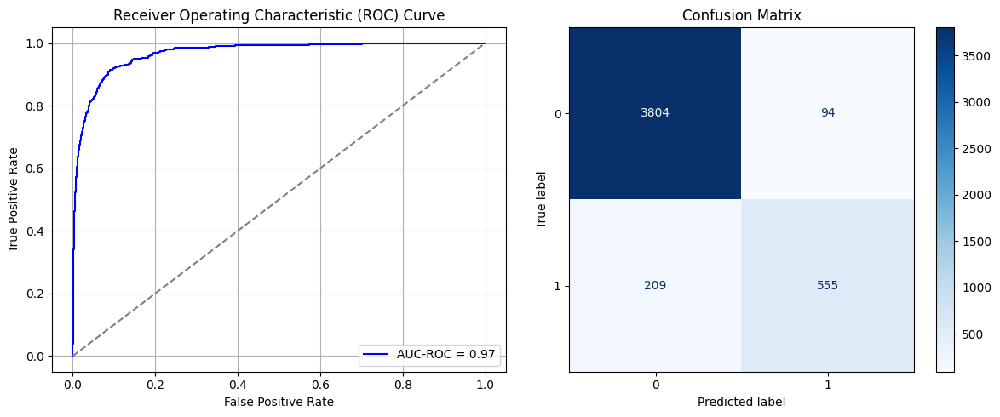

Best threshold based on F1-score: 0.32486692070961
Time elapsed (performance): 24.329600115000005


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_23"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_161 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_162 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_163 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_164 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_165 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_166 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_167 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.6937 - loss: 0.6520 - val_AUC: 0.7125 - val_loss: 0.4978
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7143 - loss: 0.4842 - val_AUC: 0.7224 - val_loss: 0.4859
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7355 - loss: 0.4691 - val_AUC: 0.7285 - val_loss: 0.4825
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7204 - loss: 0.4812 - val_AUC: 0.7338 - val_loss: 0.4790
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7494 - loss: 0.4564 - val_AUC: 0.7432 - val_loss: 0.4729
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7478 - loss: 0.4540 - val_AUC: 0.7460 - val_loss: 0.4708
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7405 - loss: 0.4589 - val_AUC: 0.7516 - val_loss: 0.4665
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7418 - loss: 0.4635 - val_AUC: 0.7567 - val_loss: 0.4653
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - A

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_24"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_168 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_169 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_170 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_171 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_172 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_173 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_174 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.6975 - loss: 0.6721 - val_AUC: 0.7126 - val_loss: 0.4991
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7295 - loss: 0.4760 - val_AUC: 0.7231 - val_loss: 0.4858
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7262 - loss: 0.4751 - val_AUC: 0.7289 - val_loss: 0.4834
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7354 - loss: 0.4726 - val_AUC: 0.7383 - val_loss: 0.4769
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7163 - loss: 0.4820 - val_AUC: 0.7441 - val_loss: 0.4733
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7339 - loss: 0.4736 - val_AUC: 0.7430 - val_loss: 0.4769
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7366 - loss: 0.4767 - val_AUC: 0.7511 - val_loss: 0.4674
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7685 - loss: 0.4494 - val_AUC: 0.7590 - val_loss: 0.4706
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7467 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_25"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_175 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_176 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_177 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_178 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_179 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_180 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_181 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.6945 - loss: 0.6877 - val_AUC: 0.7127 - val_loss: 0.5010
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7165 - loss: 0.4861 - val_AUC: 0.7238 - val_loss: 0.4875
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7267 - loss: 0.4813 - val_AUC: 0.7301 - val_loss: 0.4806
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7182 - loss: 0.4851 - val_AUC: 0.7325 - val_loss: 0.4819
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7308 - loss: 0.4666 - val_AUC: 0.7406 - val_loss: 0.4732
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7477 - loss: 0.4684 - val_AUC: 0.7445 - val_loss: 0.4716
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7494 - loss: 0.4484 - val_AUC: 0.7456 - val_loss: 0.4768
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7453 - loss: 0.4628 - val_AUC: 0.7588 - val_loss: 0.4735
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7468 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_26"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_182 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_183 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_184 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_185 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_186 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_187 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_188 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.6821 - loss: 0.7299 - val_AUC: 0.7120 - val_loss: 0.5027
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7097 - loss: 0.4928 - val_AUC: 0.7215 - val_loss: 0.4870
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7244 - loss: 0.4699 - val_AUC: 0.7263 - val_loss: 0.4844
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7112 - loss: 0.4885 - val_AUC: 0.7344 - val_loss: 0.4771
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7099 - loss: 0.4777 - val_AUC: 0.7386 - val_loss: 0.4751
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7331 - loss: 0.4711 - val_AUC: 0.7447 - val_loss: 0.4711
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7387 - loss: 0.4691 - val_AUC: 0.7458 - val_loss: 0.4728
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7279 - loss: 0.4741 - val_AUC: 0.7553 - val_loss: 0.4660
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7564 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_27"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_189 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_190 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_191 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_192 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_193 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_194 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_195 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 5s 19ms/step - AUC: 0.6797 - loss: 0.7134 - val_AUC: 0.7114 - val_loss: 0.5039
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7125 - loss: 0.4953 - val_AUC: 0.7196 - val_loss: 0.4898
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7202 - loss: 0.4840 - val_AUC: 0.7298 - val_loss: 0.4814
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7323 - loss: 0.4765 - val_AUC: 0.7360 - val_loss: 0.4771
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7190 - loss: 0.4755 - val_AUC: 0.7378 - val_loss: 0.4782
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7246 - loss: 0.4786 - val_AUC: 0.7429 - val_loss: 0.4733
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7539 - loss: 0.4544 - val_AUC: 0.7501 - val_loss: 0.4681
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7491 - loss: 0.4615 - val_AUC: 0.7565 - val_loss: 0.4674
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7392 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_28"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_196 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_197 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_198 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_199 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_200 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_201 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_202 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.6918 - loss: 0.7097 - val_AUC: 0.7137 - val_loss: 0.5038
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7285 - loss: 0.4825 - val_AUC: 0.7206 - val_loss: 0.4885
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7126 - loss: 0.4796 - val_AUC: 0.7276 - val_loss: 0.4823
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7240 - loss: 0.4714 - val_AUC: 0.7365 - val_loss: 0.4780
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7285 - loss: 0.4678 - val_AUC: 0.7429 - val_loss: 0.4757
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7272 - loss: 0.4710 - val_AUC: 0.7481 - val_loss: 0.4741
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7449 - loss: 0.4634 - val_AUC: 0.7500 - val_loss: 0.4682
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7468 - loss: 0.4555 - val_AUC: 0.7533 - val_loss: 0.4653
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7610 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_29"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_203 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_204 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_205 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_206 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_207 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_208 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_209 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.6965 - loss: 0.6788 - val_AUC: 0.7114 - val_loss: 0.5024
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7129 - loss: 0.4856 - val_AUC: 0.7224 - val_loss: 0.4863
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7273 - loss: 0.4732 - val_AUC: 0.7301 - val_loss: 0.4808
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7295 - loss: 0.4690 - val_AUC: 0.7359 - val_loss: 0.4770
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7370 - loss: 0.4545 - val_AUC: 0.7397 - val_loss: 0.4742
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7388 - loss: 0.4582 - val_AUC: 0.7458 - val_loss: 0.4705
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7561 - loss: 0.4558 - val_AUC: 0.7491 - val_loss: 0.4684
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7492 - loss: 0.4601 - val_AUC: 0.7558 - val_loss: 0.4651
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7538 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_30"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_210 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_211 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_212 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_213 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_214 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_215 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_216 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - AUC: 0.6890 - loss: 0.6835 - val_AUC: 0.7115 - val_loss: 0.5021
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7214 - loss: 0.4859 - val_AUC: 0.7220 - val_loss: 0.4869
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7231 - loss: 0.4752 - val_AUC: 0.7307 - val_loss: 0.4809
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7267 - loss: 0.4734 - val_AUC: 0.7340 - val_loss: 0.4792
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7481 - loss: 0.4612 - val_AUC: 0.7415 - val_loss: 0.4745
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7202 - loss: 0.4848 - val_AUC: 0.7436 - val_loss: 0.4718
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7425 - loss: 0.4678 - val_AUC: 0.7493 - val_loss: 0.4690
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7544 - loss: 0.4589 - val_AUC: 0.7541 - val_loss: 0.4656
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7540 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_31"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_217 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_218 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_219 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_220 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_221 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_222 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_223 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.6706 - loss: 0.7190 - val_AUC: 0.7121 - val_loss: 0.5007
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7050 - loss: 0.4773 - val_AUC: 0.7194 - val_loss: 0.4903
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7404 - loss: 0.4600 - val_AUC: 0.7289 - val_loss: 0.4814
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7219 - loss: 0.4809 - val_AUC: 0.7368 - val_loss: 0.4769
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7309 - loss: 0.4779 - val_AUC: 0.7399 - val_loss: 0.4756
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7506 - loss: 0.4556 - val_AUC: 0.7503 - val_loss: 0.4735
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7459 - loss: 0.4579 - val_AUC: 0.7519 - val_loss: 0.4671
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7477 - loss: 0.4613 - val_AUC: 0.7545 - val_loss: 0.4654
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7512 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_32"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_224 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_225 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_226 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_227 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_228 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_229 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_230 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.6928 - loss: 0.6873 - val_AUC: 0.7132 - val_loss: 0.5000
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7172 - loss: 0.4776 - val_AUC: 0.7214 - val_loss: 0.4881
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7048 - loss: 0.4939 - val_AUC: 0.7309 - val_loss: 0.4804
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7173 - loss: 0.4705 - val_AUC: 0.7346 - val_loss: 0.4780
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7252 - loss: 0.4681 - val_AUC: 0.7382 - val_loss: 0.4761
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7588 - loss: 0.4460 - val_AUC: 0.7447 - val_loss: 0.4714
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7590 - loss: 0.4532 - val_AUC: 0.7521 - val_loss: 0.4676
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7502 - loss: 0.4645 - val_AUC: 0.7553 - val_loss: 0.4648
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7508 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_33"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_231 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_232 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_233 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_234 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_235 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_236 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_237 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.6770 - loss: 0.7220 - val_AUC: 0.7123 - val_loss: 0.5023
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7091 - loss: 0.4868 - val_AUC: 0.7212 - val_loss: 0.4874
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7311 - loss: 0.4737 - val_AUC: 0.7283 - val_loss: 0.4822
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7362 - loss: 0.4649 - val_AUC: 0.7351 - val_loss: 0.4779
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7348 - loss: 0.4618 - val_AUC: 0.7436 - val_loss: 0.4793
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7355 - loss: 0.4636 - val_AUC: 0.7418 - val_loss: 0.4740
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7377 - loss: 0.4560 - val_AUC: 0.7508 - val_loss: 0.4683
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7557 - loss: 0.4467 - val_AUC: 0.7497 - val_loss: 0.4700
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7501 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_34"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_238 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_239 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_240 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_241 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_242 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_243 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_244 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.6693 - loss: 0.7217 - val_AUC: 0.7109 - val_loss: 0.5015
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7243 - loss: 0.4857 - val_AUC: 0.7194 - val_loss: 0.4885
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7241 - loss: 0.4796 - val_AUC: 0.7236 - val_loss: 0.4910
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7126 - loss: 0.4913 - val_AUC: 0.7319 - val_loss: 0.4806
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7321 - loss: 0.4758 - val_AUC: 0.7405 - val_loss: 0.4741
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7512 - loss: 0.4690 - val_AUC: 0.7441 - val_loss: 0.4749
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7297 - loss: 0.4730 - val_AUC: 0.7497 - val_loss: 0.4672
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7431 - loss: 0.4650 - val_AUC: 0.7567 - val_loss: 0.4667
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7420 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_35"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_245 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_246 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_247 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_248 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_249 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_250 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_251 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - AUC: 0.6822 - loss: 0.7087 - val_AUC: 0.7124 - val_loss: 0.5010
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7221 - loss: 0.4830 - val_AUC: 0.7215 - val_loss: 0.4869
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7222 - loss: 0.4831 - val_AUC: 0.7275 - val_loss: 0.4850
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7275 - loss: 0.4794 - val_AUC: 0.7374 - val_loss: 0.4772
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7322 - loss: 0.4655 - val_AUC: 0.7365 - val_loss: 0.4788
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7290 - loss: 0.4609 - val_AUC: 0.7469 - val_loss: 0.4701
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7561 - loss: 0.4578 - val_AUC: 0.7496 - val_loss: 0.4709
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7291 - loss: 0.4675 - val_AUC: 0.7545 - val_loss: 0.4645
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7546 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_36"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_252 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_253 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_254 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_255 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_256 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_257 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_258 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 5s 18ms/step - AUC: 0.6761 - loss: 0.6976 - val_AUC: 0.7116 - val_loss: 0.5028
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7154 - loss: 0.4879 - val_AUC: 0.7235 - val_loss: 0.4867
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7241 - loss: 0.4841 - val_AUC: 0.7272 - val_loss: 0.4854
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7461 - loss: 0.4646 - val_AUC: 0.7377 - val_loss: 0.4770
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7279 - loss: 0.4796 - val_AUC: 0.7375 - val_loss: 0.4805
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7303 - loss: 0.4773 - val_AUC: 0.7453 - val_loss: 0.4709
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7694 - loss: 0.4486 - val_AUC: 0.7539 - val_loss: 0.4702
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7521 - loss: 0.4508 - val_AUC: 0.7511 - val_loss: 0.4651
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7465 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_37"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_259 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_260 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_261 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_262 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_263 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_264 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_265 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.6863 - loss: 0.6897 - val_AUC: 0.7126 - val_loss: 0.4992
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7205 - loss: 0.4770 - val_AUC: 0.7246 - val_loss: 0.4879
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7167 - loss: 0.4696 - val_AUC: 0.7309 - val_loss: 0.4806
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7326 - loss: 0.4699 - val_AUC: 0.7331 - val_loss: 0.4786
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7404 - loss: 0.4552 - val_AUC: 0.7436 - val_loss: 0.4754
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7293 - loss: 0.4703 - val_AUC: 0.7438 - val_loss: 0.4757
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7368 - loss: 0.4710 - val_AUC: 0.7514 - val_loss: 0.4684
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7405 - loss: 0.4616 - val_AUC: 0.7479 - val_loss: 0.4797
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7480 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_38"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_266 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_267 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_268 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_269 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_270 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_271 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_272 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 19ms/step - AUC: 0.6656 - loss: 0.7649 - val_AUC: 0.7106 - val_loss: 0.5074
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7004 - loss: 0.5005 - val_AUC: 0.7222 - val_loss: 0.4870
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7247 - loss: 0.4685 - val_AUC: 0.7278 - val_loss: 0.4817
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7324 - loss: 0.4624 - val_AUC: 0.7370 - val_loss: 0.4773
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7484 - loss: 0.4618 - val_AUC: 0.7437 - val_loss: 0.4760
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7519 - loss: 0.4582 - val_AUC: 0.7436 - val_loss: 0.4752
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7411 - loss: 0.4688 - val_AUC: 0.7481 - val_loss: 0.4699
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7450 - loss: 0.4635 - val_AUC: 0.7534 - val_loss: 0.4647
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7472 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_39"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_273 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_274 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_275 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_276 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_277 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_278 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_279 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 5s 18ms/step - AUC: 0.6979 - loss: 0.6616 - val_AUC: 0.7118 - val_loss: 0.4998
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7167 - loss: 0.4864 - val_AUC: 0.7196 - val_loss: 0.4899
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7230 - loss: 0.4651 - val_AUC: 0.7306 - val_loss: 0.4814
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7296 - loss: 0.4811 - val_AUC: 0.7370 - val_loss: 0.4768
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7338 - loss: 0.4589 - val_AUC: 0.7427 - val_loss: 0.4737
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7443 - loss: 0.4671 - val_AUC: 0.7478 - val_loss: 0.4702
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7468 - loss: 0.4686 - val_AUC: 0.7507 - val_loss: 0.4692
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7581 - loss: 0.4422 - val_AUC: 0.7556 - val_loss: 0.4636
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7536 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_40"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_280 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_281 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_282 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_283 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_284 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_285 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_286 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.6877 - loss: 0.7128 - val_AUC: 0.7115 - val_loss: 0.5007
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7282 - loss: 0.4711 - val_AUC: 0.7192 - val_loss: 0.4890
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7325 - loss: 0.4709 - val_AUC: 0.7270 - val_loss: 0.4834
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7219 - loss: 0.4673 - val_AUC: 0.7341 - val_loss: 0.4778
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7207 - loss: 0.4672 - val_AUC: 0.7392 - val_loss: 0.4746
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7439 - loss: 0.4779 - val_AUC: 0.7454 - val_loss: 0.4718
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7447 - loss: 0.4649 - val_AUC: 0.7492 - val_loss: 0.4686
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7394 - loss: 0.4618 - val_AUC: 0.7550 - val_loss: 0.4660
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7457 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_41"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_287 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_288 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_289 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_290 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_291 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_292 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_293 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.6949 - loss: 0.6941 - val_AUC: 0.7138 - val_loss: 0.5012
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6993 - loss: 0.5059 - val_AUC: 0.7214 - val_loss: 0.4868
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7201 - loss: 0.4835 - val_AUC: 0.7265 - val_loss: 0.4877
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7064 - loss: 0.4878 - val_AUC: 0.7367 - val_loss: 0.4766
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7361 - loss: 0.4730 - val_AUC: 0.7421 - val_loss: 0.4732
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7576 - loss: 0.4525 - val_AUC: 0.7475 - val_loss: 0.4698
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7502 - loss: 0.4509 - val_AUC: 0.7527 - val_loss: 0.4690
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7391 - loss: 0.4658 - val_AUC: 0.7517 - val_loss: 0.4659
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7603 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_42"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_294 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_295 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_296 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_297 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_298 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_299 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_300 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - AUC: 0.6832 - loss: 0.7372 - val_AUC: 0.7115 - val_loss: 0.5032
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7155 - loss: 0.4917 - val_AUC: 0.7182 - val_loss: 0.4944
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7233 - loss: 0.4719 - val_AUC: 0.7299 - val_loss: 0.4805
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7309 - loss: 0.4724 - val_AUC: 0.7374 - val_loss: 0.4774
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7275 - loss: 0.4742 - val_AUC: 0.7427 - val_loss: 0.4730
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7504 - loss: 0.4642 - val_AUC: 0.7504 - val_loss: 0.4721
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7585 - loss: 0.4613 - val_AUC: 0.7521 - val_loss: 0.4672
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7617 - loss: 0.4477 - val_AUC: 0.7539 - val_loss: 0.4646
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7576 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_43"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_301 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_302 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_303 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_304 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_305 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_306 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_307 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - AUC: 0.6478 - loss: 0.4420 - val_AUC: 0.8631 - val_loss: 0.3158
Epoch 2/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8622 - loss: 0.3146 - val_AUC: 0.9002 - val_loss: 0.2942
Epoch 3/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.9015 - loss: 0.2701 - val_AUC: 0.9220 - val_loss: 0.2451
Epoch 4/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.9208 - loss: 0.2447 - val_AUC: 0.9373 - val_loss: 0.2233
Epoch 5/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.9398 - loss: 0.2198 - val_AUC: 0.9467 - val_loss: 0.2045
Epoch 6/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.9483 - loss: 0.1970 - val_AUC: 0.9545 - val_loss: 0.1881
Epoch 7/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.9431 - loss: 0.2091 - val_AUC: 0.9536 - val_loss: 0.2239
Epoch 8/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.9563 - loss: 0.1864 - val_AUC: 0.9590 - val_loss: 0.1779
Epoch 9/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - 

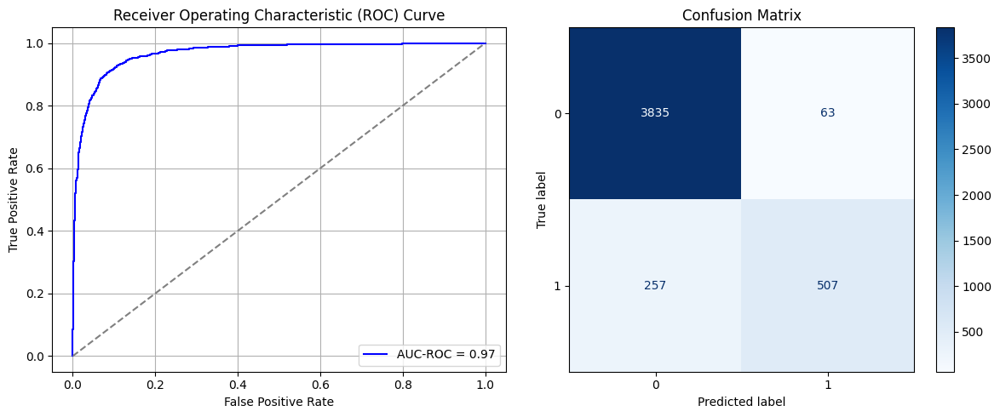

Best threshold based on F1-score: 0.2578410804271698
Time elapsed (performance): 26.840896804999943


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_44"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_308 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_309 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_310 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_311 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_312 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_313 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_314 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - AUC: 0.6642 - loss: 0.6154 - val_AUC: 0.6901 - val_loss: 0.5006
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6789 - loss: 0.4935 - val_AUC: 0.6964 - val_loss: 0.4953
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7051 - loss: 0.4754 - val_AUC: 0.7071 - val_loss: 0.4924
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6978 - loss: 0.4972 - val_AUC: 0.7098 - val_loss: 0.4920
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7008 - loss: 0.4940 - val_AUC: 0.7176 - val_loss: 0.4869
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7171 - loss: 0.4748 - val_AUC: 0.7239 - val_loss: 0.4872
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7142 - loss: 0.4803 - val_AUC: 0.7309 - val_loss: 0.4836
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7345 - loss: 0.4666 - val_AUC: 0.7329 - val_loss: 0.4830
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - A

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_45"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_315 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_316 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_317 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_318 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_319 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_320 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_321 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.6625 - loss: 0.6069 - val_AUC: 0.6892 - val_loss: 0.5029
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6870 - loss: 0.4992 - val_AUC: 0.6966 - val_loss: 0.4954
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6894 - loss: 0.4955 - val_AUC: 0.7033 - val_loss: 0.4933
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7072 - loss: 0.4855 - val_AUC: 0.7127 - val_loss: 0.4894
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6934 - loss: 0.4973 - val_AUC: 0.7210 - val_loss: 0.4870
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7130 - loss: 0.4803 - val_AUC: 0.7262 - val_loss: 0.4860
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7253 - loss: 0.4894 - val_AUC: 0.7321 - val_loss: 0.4860
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7295 - loss: 0.4682 - val_AUC: 0.7329 - val_loss: 0.4807
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7192 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_46"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_322 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_323 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_324 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_325 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_326 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_327 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_328 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.6705 - loss: 0.6105 - val_AUC: 0.6895 - val_loss: 0.5017
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6797 - loss: 0.4986 - val_AUC: 0.6995 - val_loss: 0.4937
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6813 - loss: 0.5013 - val_AUC: 0.7065 - val_loss: 0.4898
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7101 - loss: 0.4869 - val_AUC: 0.7158 - val_loss: 0.4885
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6963 - loss: 0.4844 - val_AUC: 0.7200 - val_loss: 0.4868
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7104 - loss: 0.4818 - val_AUC: 0.7265 - val_loss: 0.4852
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7215 - loss: 0.4875 - val_AUC: 0.7308 - val_loss: 0.4847
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7200 - loss: 0.4802 - val_AUC: 0.7370 - val_loss: 0.4828
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7381 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_47"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_329 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_330 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_331 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_332 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_333 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_334 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_335 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - AUC: 0.6840 - loss: 0.5881 - val_AUC: 0.6900 - val_loss: 0.5007
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6816 - loss: 0.4881 - val_AUC: 0.6987 - val_loss: 0.4940
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6965 - loss: 0.4913 - val_AUC: 0.7070 - val_loss: 0.4918
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6976 - loss: 0.4949 - val_AUC: 0.7150 - val_loss: 0.4881
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6996 - loss: 0.4806 - val_AUC: 0.7223 - val_loss: 0.4864
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6992 - loss: 0.5033 - val_AUC: 0.7235 - val_loss: 0.4870
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7086 - loss: 0.4852 - val_AUC: 0.7285 - val_loss: 0.4836
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7253 - loss: 0.4820 - val_AUC: 0.7307 - val_loss: 0.4851
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7266 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_48"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_336 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_337 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_338 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_339 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_340 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_341 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_342 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 15ms/step - AUC: 0.6721 - loss: 0.6014 - val_AUC: 0.6896 - val_loss: 0.5017
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6780 - loss: 0.4976 - val_AUC: 0.6991 - val_loss: 0.4938
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6987 - loss: 0.4879 - val_AUC: 0.7075 - val_loss: 0.4899
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7117 - loss: 0.4849 - val_AUC: 0.7138 - val_loss: 0.4899
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7044 - loss: 0.4958 - val_AUC: 0.7157 - val_loss: 0.4925
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7130 - loss: 0.4984 - val_AUC: 0.7244 - val_loss: 0.4873
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7169 - loss: 0.5013 - val_AUC: 0.7281 - val_loss: 0.4868
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7127 - loss: 0.4864 - val_AUC: 0.7379 - val_loss: 0.4831
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7321 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_49"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_343 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_344 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_345 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_346 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_347 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_348 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_349 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.6695 - loss: 0.6192 - val_AUC: 0.6889 - val_loss: 0.5039
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.6848 - loss: 0.4882 - val_AUC: 0.6951 - val_loss: 0.4956
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6802 - loss: 0.4843 - val_AUC: 0.7022 - val_loss: 0.4924
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6992 - loss: 0.4910 - val_AUC: 0.7091 - val_loss: 0.4906
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6875 - loss: 0.4914 - val_AUC: 0.7150 - val_loss: 0.4883
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6878 - loss: 0.4816 - val_AUC: 0.7233 - val_loss: 0.4852
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7062 - loss: 0.4929 - val_AUC: 0.7278 - val_loss: 0.4855
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7120 - loss: 0.4912 - val_AUC: 0.7347 - val_loss: 0.4835
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7220 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_50"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_350 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_351 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_352 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_353 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_354 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_355 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_356 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.6751 - loss: 0.5908 - val_AUC: 0.6888 - val_loss: 0.5031
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.6798 - loss: 0.4935 - val_AUC: 0.6959 - val_loss: 0.4985
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6808 - loss: 0.5002 - val_AUC: 0.7032 - val_loss: 0.4920
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6971 - loss: 0.4945 - val_AUC: 0.7112 - val_loss: 0.4902
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7068 - loss: 0.4871 - val_AUC: 0.7203 - val_loss: 0.4866
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7109 - loss: 0.4902 - val_AUC: 0.7301 - val_loss: 0.4848
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7305 - loss: 0.4772 - val_AUC: 0.7310 - val_loss: 0.4832
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7009 - loss: 0.4965 - val_AUC: 0.7323 - val_loss: 0.4814
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7153 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_51"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_357 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_358 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_359 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_360 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_361 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_362 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_363 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - AUC: 0.6657 - loss: 0.5981 - val_AUC: 0.6897 - val_loss: 0.5028
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6776 - loss: 0.5105 - val_AUC: 0.6961 - val_loss: 0.4957
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6915 - loss: 0.4891 - val_AUC: 0.7032 - val_loss: 0.4919
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7011 - loss: 0.4769 - val_AUC: 0.7125 - val_loss: 0.4887
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6904 - loss: 0.4948 - val_AUC: 0.7171 - val_loss: 0.4866
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6975 - loss: 0.4952 - val_AUC: 0.7238 - val_loss: 0.4845
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7176 - loss: 0.4826 - val_AUC: 0.7312 - val_loss: 0.4829
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7098 - loss: 0.4903 - val_AUC: 0.7289 - val_loss: 0.4895
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7414 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_52"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_364 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_365 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_366 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_367 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_368 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_369 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_370 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - AUC: 0.6654 - loss: 0.6001 - val_AUC: 0.6896 - val_loss: 0.5019
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6881 - loss: 0.4945 - val_AUC: 0.6981 - val_loss: 0.4986
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6943 - loss: 0.4952 - val_AUC: 0.7082 - val_loss: 0.4912
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7038 - loss: 0.4939 - val_AUC: 0.7167 - val_loss: 0.4890
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7000 - loss: 0.4948 - val_AUC: 0.7217 - val_loss: 0.4886
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7045 - loss: 0.4813 - val_AUC: 0.7249 - val_loss: 0.4855
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7105 - loss: 0.4761 - val_AUC: 0.7321 - val_loss: 0.4849
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7251 - loss: 0.4706 - val_AUC: 0.7354 - val_loss: 0.4819
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7333 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_53"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_371 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_372 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_373 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_374 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_375 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_376 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_377 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.6712 - loss: 0.5985 - val_AUC: 0.6891 - val_loss: 0.5032
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7033 - loss: 0.4809 - val_AUC: 0.6960 - val_loss: 0.4961
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6817 - loss: 0.4881 - val_AUC: 0.7045 - val_loss: 0.4905
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6942 - loss: 0.4930 - val_AUC: 0.7129 - val_loss: 0.4887
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6981 - loss: 0.4866 - val_AUC: 0.7176 - val_loss: 0.4868
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7123 - loss: 0.4650 - val_AUC: 0.7290 - val_loss: 0.4882
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7134 - loss: 0.4869 - val_AUC: 0.7285 - val_loss: 0.4836
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7224 - loss: 0.4865 - val_AUC: 0.7318 - val_loss: 0.4847
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7226 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_54"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_378 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_379 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_380 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_381 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_382 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_383 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_384 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - AUC: 0.6804 - loss: 0.5903 - val_AUC: 0.6894 - val_loss: 0.5029
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6762 - loss: 0.5074 - val_AUC: 0.6963 - val_loss: 0.4962
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7086 - loss: 0.4744 - val_AUC: 0.7042 - val_loss: 0.4931
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7167 - loss: 0.4725 - val_AUC: 0.7115 - val_loss: 0.4893
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7100 - loss: 0.4831 - val_AUC: 0.7224 - val_loss: 0.4882
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7199 - loss: 0.4747 - val_AUC: 0.7271 - val_loss: 0.4873
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7107 - loss: 0.4952 - val_AUC: 0.7291 - val_loss: 0.4843
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7311 - loss: 0.4665 - val_AUC: 0.7390 - val_loss: 0.4832
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7150 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_55"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_385 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_386 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_387 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_388 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_389 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_390 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_391 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - AUC: 0.6684 - loss: 0.6206 - val_AUC: 0.6887 - val_loss: 0.5031
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6881 - loss: 0.4941 - val_AUC: 0.6959 - val_loss: 0.4961
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6893 - loss: 0.4965 - val_AUC: 0.7032 - val_loss: 0.4921
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6976 - loss: 0.4971 - val_AUC: 0.7099 - val_loss: 0.4894
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6986 - loss: 0.4735 - val_AUC: 0.7181 - val_loss: 0.4868
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6915 - loss: 0.4896 - val_AUC: 0.7245 - val_loss: 0.4850
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7027 - loss: 0.4963 - val_AUC: 0.7252 - val_loss: 0.4850
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7084 - loss: 0.4970 - val_AUC: 0.7332 - val_loss: 0.4853
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7122 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_56"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_392 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_393 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_394 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_395 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_396 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_397 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_398 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.6817 - loss: 0.5796 - val_AUC: 0.6889 - val_loss: 0.5033
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6765 - loss: 0.4915 - val_AUC: 0.6960 - val_loss: 0.4957
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7102 - loss: 0.4942 - val_AUC: 0.7030 - val_loss: 0.4932
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6976 - loss: 0.4804 - val_AUC: 0.7118 - val_loss: 0.4884
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6784 - loss: 0.4985 - val_AUC: 0.7177 - val_loss: 0.4882
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7232 - loss: 0.4718 - val_AUC: 0.7214 - val_loss: 0.4875
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7282 - loss: 0.4821 - val_AUC: 0.7267 - val_loss: 0.4868
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7231 - loss: 0.4775 - val_AUC: 0.7306 - val_loss: 0.4846
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7271 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_57"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_399 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_400 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_401 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_402 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_403 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_404 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_405 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - AUC: 0.6635 - loss: 0.5977 - val_AUC: 0.6893 - val_loss: 0.5028
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7049 - loss: 0.4854 - val_AUC: 0.6964 - val_loss: 0.4974
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6777 - loss: 0.4992 - val_AUC: 0.7034 - val_loss: 0.4923
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6963 - loss: 0.4928 - val_AUC: 0.7110 - val_loss: 0.4880
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7031 - loss: 0.4859 - val_AUC: 0.7199 - val_loss: 0.4869
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7084 - loss: 0.4827 - val_AUC: 0.7272 - val_loss: 0.4858
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7252 - loss: 0.4775 - val_AUC: 0.7288 - val_loss: 0.4863
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7240 - loss: 0.4768 - val_AUC: 0.7321 - val_loss: 0.4850
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - A

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_58"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_406 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_407 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_408 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_409 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_410 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_411 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_412 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - AUC: 0.6649 - loss: 0.6433 - val_AUC: 0.6889 - val_loss: 0.5039
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6578 - loss: 0.5243 - val_AUC: 0.6955 - val_loss: 0.4958
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6856 - loss: 0.4896 - val_AUC: 0.7033 - val_loss: 0.4912
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6873 - loss: 0.4970 - val_AUC: 0.7092 - val_loss: 0.4892
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7143 - loss: 0.4783 - val_AUC: 0.7168 - val_loss: 0.4888
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6969 - loss: 0.4903 - val_AUC: 0.7215 - val_loss: 0.4882
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7118 - loss: 0.4740 - val_AUC: 0.7275 - val_loss: 0.4843
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7145 - loss: 0.4864 - val_AUC: 0.7313 - val_loss: 0.4819
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7275 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_59"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_413 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_414 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_415 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_416 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_417 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_418 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_419 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - AUC: 0.6685 - loss: 0.6236 - val_AUC: 0.6895 - val_loss: 0.5026
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6832 - loss: 0.5017 - val_AUC: 0.6981 - val_loss: 0.4938
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6896 - loss: 0.4826 - val_AUC: 0.7066 - val_loss: 0.4917
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7023 - loss: 0.4910 - val_AUC: 0.7125 - val_loss: 0.4900
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6993 - loss: 0.4831 - val_AUC: 0.7258 - val_loss: 0.4873
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7144 - loss: 0.4842 - val_AUC: 0.7258 - val_loss: 0.4866
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7091 - loss: 0.4869 - val_AUC: 0.7338 - val_loss: 0.4851
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7173 - loss: 0.4802 - val_AUC: 0.7334 - val_loss: 0.4821
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7083 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_60"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_420 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_421 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_422 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_423 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_424 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_425 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_426 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - AUC: 0.6645 - loss: 0.6314 - val_AUC: 0.6889 - val_loss: 0.5040
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6849 - loss: 0.4943 - val_AUC: 0.6950 - val_loss: 0.4960
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6881 - loss: 0.4928 - val_AUC: 0.7015 - val_loss: 0.4953
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6853 - loss: 0.4969 - val_AUC: 0.7101 - val_loss: 0.4886
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7131 - loss: 0.4874 - val_AUC: 0.7174 - val_loss: 0.4870
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7069 - loss: 0.4858 - val_AUC: 0.7245 - val_loss: 0.4860
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6949 - loss: 0.4868 - val_AUC: 0.7262 - val_loss: 0.4834
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7313 - loss: 0.4719 - val_AUC: 0.7349 - val_loss: 0.4855
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7179 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_61"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_427 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_428 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_429 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_430 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_431 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_432 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_433 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.6691 - loss: 0.5840 - val_AUC: 0.6893 - val_loss: 0.5022
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.6871 - loss: 0.4885 - val_AUC: 0.6979 - val_loss: 0.4957
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7058 - loss: 0.4713 - val_AUC: 0.7068 - val_loss: 0.4911
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6851 - loss: 0.4956 - val_AUC: 0.7125 - val_loss: 0.4874
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7047 - loss: 0.4851 - val_AUC: 0.7198 - val_loss: 0.4882
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7087 - loss: 0.4782 - val_AUC: 0.7283 - val_loss: 0.4864
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7282 - loss: 0.4867 - val_AUC: 0.7323 - val_loss: 0.4856
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7155 - loss: 0.4861 - val_AUC: 0.7269 - val_loss: 0.4904
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6984 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_62"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_434 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_435 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_436 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_437 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_438 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_439 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_440 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - AUC: 0.6764 - loss: 0.5823 - val_AUC: 0.6889 - val_loss: 0.5024
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7061 - loss: 0.4760 - val_AUC: 0.6961 - val_loss: 0.4957
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6872 - loss: 0.4920 - val_AUC: 0.7025 - val_loss: 0.4926
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6977 - loss: 0.4811 - val_AUC: 0.7108 - val_loss: 0.4903
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7085 - loss: 0.4789 - val_AUC: 0.7157 - val_loss: 0.4876
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6997 - loss: 0.4740 - val_AUC: 0.7243 - val_loss: 0.4874
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7106 - loss: 0.4814 - val_AUC: 0.7284 - val_loss: 0.4837
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7127 - loss: 0.4891 - val_AUC: 0.7330 - val_loss: 0.4824
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7268 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_63"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_441 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_442 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_443 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_444 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_445 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_446 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_447 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - AUC: 0.6750 - loss: 0.6030 - val_AUC: 0.6895 - val_loss: 0.5025
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6910 - loss: 0.4887 - val_AUC: 0.6989 - val_loss: 0.4945
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6962 - loss: 0.4937 - val_AUC: 0.7066 - val_loss: 0.4898
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7009 - loss: 0.5032 - val_AUC: 0.7113 - val_loss: 0.4899
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7185 - loss: 0.4742 - val_AUC: 0.7251 - val_loss: 0.4886
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7063 - loss: 0.4829 - val_AUC: 0.7252 - val_loss: 0.4847
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7080 - loss: 0.4861 - val_AUC: 0.7295 - val_loss: 0.4838
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7172 - loss: 0.4631 - val_AUC: 0.7313 - val_loss: 0.4840
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7339 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_64"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_448 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_449 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_450 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_451 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_452 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_453 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_454 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - AUC: 0.5944 - loss: 0.4707 - val_AUC: 0.8493 - val_loss: 0.3330
Epoch 2/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.8558 - loss: 0.3140 - val_AUC: 0.9075 - val_loss: 0.2630
Epoch 3/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.9063 - loss: 0.2614 - val_AUC: 0.9293 - val_loss: 0.2395
Epoch 4/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.9332 - loss: 0.2226 - val_AUC: 0.9374 - val_loss: 0.2327
Epoch 5/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.9409 - loss: 0.2127 - val_AUC: 0.9510 - val_loss: 0.1953
Epoch 6/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.9579 - loss: 0.1842 - val_AUC: 0.9557 - val_loss: 0.1938
Epoch 7/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.9574 - loss: 0.1871 - val_AUC: 0.9575 - val_loss: 0.1830
Epoch 8/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.9603 - loss: 0.1793 - val_AUC: 0.9588 - val_loss: 0.1993
Epoch 9/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - 

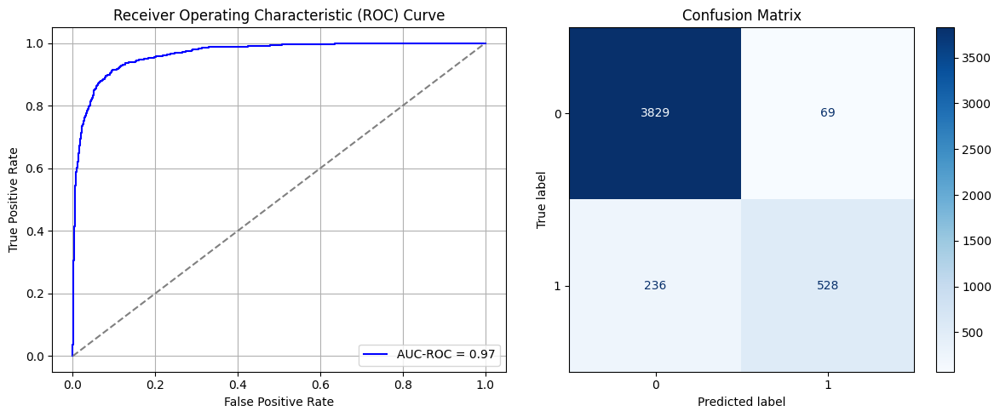

Best threshold based on F1-score: 0.25378477573394775
Time elapsed (performance): 30.048652494999942


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_65"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_455 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_456 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_457 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_458 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_459 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_460 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_461 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - AUC: 0.6849 - loss: 0.5728 - val_AUC: 0.7320 - val_loss: 0.4766
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7478 - loss: 0.4562 - val_AUC: 0.7522 - val_loss: 0.4587
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7425 - loss: 0.4621 - val_AUC: 0.7585 - val_loss: 0.4513
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7520 - loss: 0.4483 - val_AUC: 0.7578 - val_loss: 0.4514
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7682 - loss: 0.4311 - val_AUC: 0.7597 - val_loss: 0.4474
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7545 - loss: 0.4499 - val_AUC: 0.7596 - val_loss: 0.4448
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7449 - loss: 0.4462 - val_AUC: 0.7622 - val_loss: 0.4417
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7498 - loss: 0.4504 - val_AUC: 0.7614 - val_loss: 0.4437
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - A

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_66"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_462 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_463 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_464 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_465 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_466 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_467 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_468 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - AUC: 0.6920 - loss: 0.5508 - val_AUC: 0.7314 - val_loss: 0.4765
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7506 - loss: 0.4580 - val_AUC: 0.7497 - val_loss: 0.4598
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7534 - loss: 0.4510 - val_AUC: 0.7532 - val_loss: 0.4542
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7511 - loss: 0.4527 - val_AUC: 0.7582 - val_loss: 0.4490
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7565 - loss: 0.4507 - val_AUC: 0.7576 - val_loss: 0.4471
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7657 - loss: 0.4463 - val_AUC: 0.7597 - val_loss: 0.4444
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7494 - loss: 0.4438 - val_AUC: 0.7614 - val_loss: 0.4408
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7552 - loss: 0.4461 - val_AUC: 0.7608 - val_loss: 0.4406
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7492 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_67"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_469 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_470 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_471 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_472 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_473 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_474 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_475 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - AUC: 0.7072 - loss: 0.5435 - val_AUC: 0.7262 - val_loss: 0.4828
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7243 - loss: 0.4771 - val_AUC: 0.7518 - val_loss: 0.4592
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7700 - loss: 0.4412 - val_AUC: 0.7580 - val_loss: 0.4515
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7617 - loss: 0.4415 - val_AUC: 0.7610 - val_loss: 0.4480
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7622 - loss: 0.4432 - val_AUC: 0.7602 - val_loss: 0.4456
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7483 - loss: 0.4501 - val_AUC: 0.7627 - val_loss: 0.4431
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7700 - loss: 0.4413 - val_AUC: 0.7619 - val_loss: 0.4411
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7632 - loss: 0.4276 - val_AUC: 0.7604 - val_loss: 0.4417
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7626 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_68"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_476 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_477 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_478 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_479 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_480 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_481 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_482 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.7098 - loss: 0.5280 - val_AUC: 0.7330 - val_loss: 0.4738
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7429 - loss: 0.4619 - val_AUC: 0.7505 - val_loss: 0.4581
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7615 - loss: 0.4485 - val_AUC: 0.7537 - val_loss: 0.4529
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7487 - loss: 0.4623 - val_AUC: 0.7566 - val_loss: 0.4485
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7462 - loss: 0.4412 - val_AUC: 0.7584 - val_loss: 0.4457
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7490 - loss: 0.4454 - val_AUC: 0.7592 - val_loss: 0.4466
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7724 - loss: 0.4314 - val_AUC: 0.7624 - val_loss: 0.4424
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7722 - loss: 0.4281 - val_AUC: 0.7621 - val_loss: 0.4413
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7670 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_69"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_483 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_484 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_485 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_486 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_487 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_488 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_489 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.6852 - loss: 0.5631 - val_AUC: 0.7286 - val_loss: 0.4759
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7337 - loss: 0.4569 - val_AUC: 0.7488 - val_loss: 0.4612
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7533 - loss: 0.4596 - val_AUC: 0.7505 - val_loss: 0.4678
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7615 - loss: 0.4534 - val_AUC: 0.7580 - val_loss: 0.4485
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7613 - loss: 0.4416 - val_AUC: 0.7580 - val_loss: 0.4461
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7569 - loss: 0.4381 - val_AUC: 0.7602 - val_loss: 0.4426
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7654 - loss: 0.4350 - val_AUC: 0.7586 - val_loss: 0.4433
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7541 - loss: 0.4507 - val_AUC: 0.7619 - val_loss: 0.4399
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7537 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_70"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_490 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_491 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_492 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_493 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_494 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_495 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_496 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - AUC: 0.6915 - loss: 0.5561 - val_AUC: 0.7320 - val_loss: 0.4751
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7446 - loss: 0.4622 - val_AUC: 0.7532 - val_loss: 0.4577
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7604 - loss: 0.4423 - val_AUC: 0.7572 - val_loss: 0.4517
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7573 - loss: 0.4368 - val_AUC: 0.7593 - val_loss: 0.4496
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7641 - loss: 0.4382 - val_AUC: 0.7587 - val_loss: 0.4457
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7661 - loss: 0.4393 - val_AUC: 0.7600 - val_loss: 0.4439
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7616 - loss: 0.4437 - val_AUC: 0.7612 - val_loss: 0.4412
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7535 - loss: 0.4402 - val_AUC: 0.7594 - val_loss: 0.4463
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7689 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_71"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_497 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_498 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_499 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_500 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_501 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_502 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_503 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.7064 - loss: 0.5277 - val_AUC: 0.7262 - val_loss: 0.4799
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7582 - loss: 0.4472 - val_AUC: 0.7534 - val_loss: 0.4567
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7548 - loss: 0.4532 - val_AUC: 0.7586 - val_loss: 0.4505
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7487 - loss: 0.4564 - val_AUC: 0.7574 - val_loss: 0.4492
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7627 - loss: 0.4446 - val_AUC: 0.7581 - val_loss: 0.4472
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7488 - loss: 0.4547 - val_AUC: 0.7599 - val_loss: 0.4427
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7565 - loss: 0.4440 - val_AUC: 0.7564 - val_loss: 0.4508
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7561 - loss: 0.4407 - val_AUC: 0.7605 - val_loss: 0.4403
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7672 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_72"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_504 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_505 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_506 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_507 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_508 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_509 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_510 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - AUC: 0.6896 - loss: 0.5356 - val_AUC: 0.7312 - val_loss: 0.4769
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7463 - loss: 0.4668 - val_AUC: 0.7485 - val_loss: 0.4599
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7443 - loss: 0.4640 - val_AUC: 0.7567 - val_loss: 0.4511
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7686 - loss: 0.4419 - val_AUC: 0.7551 - val_loss: 0.4523
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7597 - loss: 0.4397 - val_AUC: 0.7611 - val_loss: 0.4459
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7607 - loss: 0.4472 - val_AUC: 0.7593 - val_loss: 0.4432
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7596 - loss: 0.4398 - val_AUC: 0.7608 - val_loss: 0.4422
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7612 - loss: 0.4351 - val_AUC: 0.7628 - val_loss: 0.4412
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7533 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_73"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_511 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_512 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_513 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_514 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_515 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_516 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_517 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.7129 - loss: 0.5236 - val_AUC: 0.7349 - val_loss: 0.4747
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7515 - loss: 0.4580 - val_AUC: 0.7555 - val_loss: 0.4568
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7591 - loss: 0.4480 - val_AUC: 0.7594 - val_loss: 0.4512
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7399 - loss: 0.4415 - val_AUC: 0.7610 - val_loss: 0.4478
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7580 - loss: 0.4379 - val_AUC: 0.7611 - val_loss: 0.4452
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7654 - loss: 0.4423 - val_AUC: 0.7616 - val_loss: 0.4434
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7624 - loss: 0.4394 - val_AUC: 0.7629 - val_loss: 0.4409
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7566 - loss: 0.4433 - val_AUC: 0.7595 - val_loss: 0.4462
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7758 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_74"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_518 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_519 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_520 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_521 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_522 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_523 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_524 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - AUC: 0.6970 - loss: 0.5646 - val_AUC: 0.7331 - val_loss: 0.4767
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7387 - loss: 0.4531 - val_AUC: 0.7568 - val_loss: 0.4563
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7514 - loss: 0.4518 - val_AUC: 0.7570 - val_loss: 0.4563
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7536 - loss: 0.4473 - val_AUC: 0.7590 - val_loss: 0.4497
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7722 - loss: 0.4412 - val_AUC: 0.7611 - val_loss: 0.4459
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7578 - loss: 0.4415 - val_AUC: 0.7602 - val_loss: 0.4438
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7660 - loss: 0.4439 - val_AUC: 0.7652 - val_loss: 0.4414
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7677 - loss: 0.4392 - val_AUC: 0.7651 - val_loss: 0.4379
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7580 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_75"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_525 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_526 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_527 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_528 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_529 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_530 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_531 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.7036 - loss: 0.5534 - val_AUC: 0.7259 - val_loss: 0.4792
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7359 - loss: 0.4800 - val_AUC: 0.7477 - val_loss: 0.4614
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7510 - loss: 0.4616 - val_AUC: 0.7560 - val_loss: 0.4529
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7663 - loss: 0.4424 - val_AUC: 0.7567 - val_loss: 0.4499
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7452 - loss: 0.4440 - val_AUC: 0.7571 - val_loss: 0.4489
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7705 - loss: 0.4294 - val_AUC: 0.7583 - val_loss: 0.4457
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7637 - loss: 0.4433 - val_AUC: 0.7577 - val_loss: 0.4433
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7688 - loss: 0.4372 - val_AUC: 0.7587 - val_loss: 0.4419
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7520 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_76"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_532 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_533 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_534 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_535 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_536 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_537 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_538 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - AUC: 0.6757 - loss: 0.5707 - val_AUC: 0.7336 - val_loss: 0.4780
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7576 - loss: 0.4485 - val_AUC: 0.7577 - val_loss: 0.4573
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7470 - loss: 0.4539 - val_AUC: 0.7587 - val_loss: 0.4514
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7517 - loss: 0.4583 - val_AUC: 0.7601 - val_loss: 0.4476
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7711 - loss: 0.4225 - val_AUC: 0.7594 - val_loss: 0.4458
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7509 - loss: 0.4582 - val_AUC: 0.7619 - val_loss: 0.4439
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7526 - loss: 0.4521 - val_AUC: 0.7614 - val_loss: 0.4419
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7543 - loss: 0.4365 - val_AUC: 0.7633 - val_loss: 0.4394
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7865 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_77"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_539 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_540 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_541 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_542 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_543 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_544 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_545 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - AUC: 0.6946 - loss: 0.5534 - val_AUC: 0.7310 - val_loss: 0.4750
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7529 - loss: 0.4592 - val_AUC: 0.7524 - val_loss: 0.4612
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7599 - loss: 0.4598 - val_AUC: 0.7565 - val_loss: 0.4535
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7561 - loss: 0.4422 - val_AUC: 0.7584 - val_loss: 0.4494
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7669 - loss: 0.4357 - val_AUC: 0.7612 - val_loss: 0.4450
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7721 - loss: 0.4192 - val_AUC: 0.7612 - val_loss: 0.4448
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7615 - loss: 0.4416 - val_AUC: 0.7619 - val_loss: 0.4410
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7382 - loss: 0.4559 - val_AUC: 0.7638 - val_loss: 0.4403
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7752 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_78"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_546 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_547 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_548 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_549 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_550 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_551 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_552 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - AUC: 0.6935 - loss: 0.5346 - val_AUC: 0.7302 - val_loss: 0.4775
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7436 - loss: 0.4635 - val_AUC: 0.7537 - val_loss: 0.4566
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7415 - loss: 0.4585 - val_AUC: 0.7577 - val_loss: 0.4515
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7451 - loss: 0.4577 - val_AUC: 0.7551 - val_loss: 0.4546
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7816 - loss: 0.4164 - val_AUC: 0.7575 - val_loss: 0.4503
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7629 - loss: 0.4361 - val_AUC: 0.7588 - val_loss: 0.4461
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7620 - loss: 0.4356 - val_AUC: 0.7610 - val_loss: 0.4429
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7598 - loss: 0.4404 - val_AUC: 0.7604 - val_loss: 0.4410
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - A

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_79"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_553 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_554 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_555 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_556 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_557 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_558 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_559 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - AUC: 0.6902 - loss: 0.5744 - val_AUC: 0.7269 - val_loss: 0.4787
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7541 - loss: 0.4573 - val_AUC: 0.7516 - val_loss: 0.4616
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7675 - loss: 0.4441 - val_AUC: 0.7574 - val_loss: 0.4565
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7644 - loss: 0.4320 - val_AUC: 0.7578 - val_loss: 0.4536
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7545 - loss: 0.4439 - val_AUC: 0.7622 - val_loss: 0.4458
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7744 - loss: 0.4342 - val_AUC: 0.7597 - val_loss: 0.4454
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7688 - loss: 0.4395 - val_AUC: 0.7624 - val_loss: 0.4416
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7432 - loss: 0.4457 - val_AUC: 0.7623 - val_loss: 0.4409
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7605 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_80"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_560 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_561 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_562 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_563 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_564 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_565 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_566 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - AUC: 0.6858 - loss: 0.5742 - val_AUC: 0.7296 - val_loss: 0.4793
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7410 - loss: 0.4466 - val_AUC: 0.7526 - val_loss: 0.4579
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7487 - loss: 0.4629 - val_AUC: 0.7535 - val_loss: 0.4597
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7584 - loss: 0.4467 - val_AUC: 0.7600 - val_loss: 0.4485
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7702 - loss: 0.4395 - val_AUC: 0.7594 - val_loss: 0.4477
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7482 - loss: 0.4532 - val_AUC: 0.7617 - val_loss: 0.4423
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7632 - loss: 0.4366 - val_AUC: 0.7614 - val_loss: 0.4419
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7528 - loss: 0.4462 - val_AUC: 0.7609 - val_loss: 0.4402
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7748 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_81"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_567 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_568 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_569 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_570 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_571 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_572 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_573 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - AUC: 0.7007 - loss: 0.5422 - val_AUC: 0.7315 - val_loss: 0.4763
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7458 - loss: 0.4506 - val_AUC: 0.7585 - val_loss: 0.4560
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7631 - loss: 0.4496 - val_AUC: 0.7585 - val_loss: 0.4510
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7402 - loss: 0.4496 - val_AUC: 0.7600 - val_loss: 0.4474
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7601 - loss: 0.4448 - val_AUC: 0.7603 - val_loss: 0.4467
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7489 - loss: 0.4555 - val_AUC: 0.7627 - val_loss: 0.4425
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7673 - loss: 0.4346 - val_AUC: 0.7624 - val_loss: 0.4412
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7815 - loss: 0.4300 - val_AUC: 0.7622 - val_loss: 0.4411
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7592 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_82"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_574 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_575 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_576 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_577 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_578 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_579 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_580 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - AUC: 0.7053 - loss: 0.5525 - val_AUC: 0.7288 - val_loss: 0.4792
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7383 - loss: 0.4586 - val_AUC: 0.7549 - val_loss: 0.4565
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7386 - loss: 0.4589 - val_AUC: 0.7596 - val_loss: 0.4508
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7519 - loss: 0.4366 - val_AUC: 0.7605 - val_loss: 0.4481
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7611 - loss: 0.4503 - val_AUC: 0.7586 - val_loss: 0.4467
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7656 - loss: 0.4356 - val_AUC: 0.7628 - val_loss: 0.4415
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7599 - loss: 0.4442 - val_AUC: 0.7612 - val_loss: 0.4436
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7506 - loss: 0.4505 - val_AUC: 0.7610 - val_loss: 0.4406
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7619 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_83"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_581 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_582 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_583 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_584 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_585 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_586 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_587 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - AUC: 0.6929 - loss: 0.5585 - val_AUC: 0.7251 - val_loss: 0.4830
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7419 - loss: 0.4508 - val_AUC: 0.7479 - val_loss: 0.4614
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7516 - loss: 0.4471 - val_AUC: 0.7601 - val_loss: 0.4554
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7440 - loss: 0.4609 - val_AUC: 0.7541 - val_loss: 0.4558
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7527 - loss: 0.4482 - val_AUC: 0.7607 - val_loss: 0.4455
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7432 - loss: 0.4558 - val_AUC: 0.7571 - val_loss: 0.4542
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7537 - loss: 0.4424 - val_AUC: 0.7605 - val_loss: 0.4433
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7545 - loss: 0.4488 - val_AUC: 0.7598 - val_loss: 0.4422
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7706 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_84"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_588 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_589 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_590 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_591 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_592 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_593 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_594 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - AUC: 0.7079 - loss: 0.5250 - val_AUC: 0.7344 - val_loss: 0.4736
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7377 - loss: 0.4644 - val_AUC: 0.7509 - val_loss: 0.4622
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7589 - loss: 0.4530 - val_AUC: 0.7570 - val_loss: 0.4529
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7615 - loss: 0.4431 - val_AUC: 0.7586 - val_loss: 0.4489
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7610 - loss: 0.4511 - val_AUC: 0.7573 - val_loss: 0.4489
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7575 - loss: 0.4525 - val_AUC: 0.7605 - val_loss: 0.4448
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7685 - loss: 0.4326 - val_AUC: 0.7604 - val_loss: 0.4438
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7628 - loss: 0.4325 - val_AUC: 0.7617 - val_loss: 0.4405
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7773 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_85"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_595 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_596 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_597 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_598 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_599 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_600 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_601 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 7s 8ms/step - AUC: 0.5953 - loss: 0.4702 - val_AUC: 0.8575 - val_loss: 0.3142
Epoch 2/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8720 - loss: 0.3024 - val_AUC: 0.9078 - val_loss: 0.2904
Epoch 3/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.9082 - loss: 0.2630 - val_AUC: 0.9361 - val_loss: 0.2311
Epoch 4/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.9378 - loss: 0.2185 - val_AUC: 0.9518 - val_loss: 0.2028
Epoch 5/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.9492 - loss: 0.1995 - val_AUC: 0.9599 - val_loss: 0.1812
Epoch 6/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.9530 - loss: 0.1917 - val_AUC: 0.9626 - val_loss: 0.1722
Epoch 7/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.9608 - loss: 0.1749 - val_AUC: 0.9663 - val_loss: 0.1851
Epoch 8/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.9641 - loss: 0.1699 - val_AUC: 0.9423 - val_loss: 0.2215
Epoch 9/10
467/467 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - 

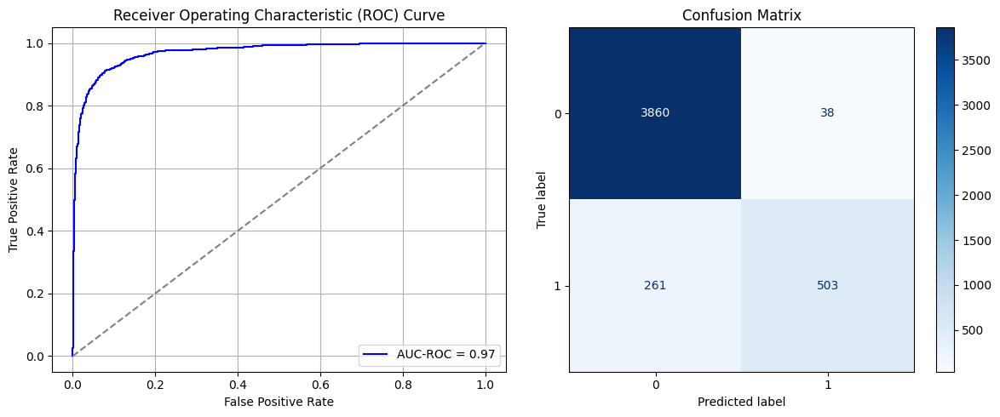

Best threshold based on F1-score: 0.2322874516248703
Time elapsed (performance): 30.036105075000023


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_86"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_602 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_603 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_604 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_605 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_606 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_607 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_608 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.7159 - loss: 0.6374 - val_AUC: 0.7085 - val_loss: 0.5004
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7167 - loss: 0.4752 - val_AUC: 0.7221 - val_loss: 0.4816
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7160 - loss: 0.4677 - val_AUC: 0.7331 - val_loss: 0.4724
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7301 - loss: 0.4766 - val_AUC: 0.7433 - val_loss: 0.4669
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7276 - loss: 0.4670 - val_AUC: 0.7456 - val_loss: 0.4627
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7304 - loss: 0.4687 - val_AUC: 0.7493 - val_loss: 0.4601
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7504 - loss: 0.4582 - val_AUC: 0.7567 - val_loss: 0.4597
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7538 - loss: 0.4613 - val_AUC: 0.7575 - val_loss: 0.4543
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - A

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_87"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_609 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_610 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_611 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_612 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_613 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_614 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_615 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.7017 - loss: 0.6682 - val_AUC: 0.7082 - val_loss: 0.4983
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7218 - loss: 0.4966 - val_AUC: 0.7287 - val_loss: 0.4780
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7285 - loss: 0.4712 - val_AUC: 0.7366 - val_loss: 0.4697
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7492 - loss: 0.4552 - val_AUC: 0.7442 - val_loss: 0.4652
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7424 - loss: 0.4677 - val_AUC: 0.7502 - val_loss: 0.4622
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7453 - loss: 0.4600 - val_AUC: 0.7525 - val_loss: 0.4589
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7513 - loss: 0.4648 - val_AUC: 0.7499 - val_loss: 0.4637
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7437 - loss: 0.4513 - val_AUC: 0.7577 - val_loss: 0.4552
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7702 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_88"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_616 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_617 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_618 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_619 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_620 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_621 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_622 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.6821 - loss: 0.6727 - val_AUC: 0.7094 - val_loss: 0.5004
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7093 - loss: 0.4807 - val_AUC: 0.7208 - val_loss: 0.4816
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7173 - loss: 0.4773 - val_AUC: 0.7320 - val_loss: 0.4764
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7326 - loss: 0.4649 - val_AUC: 0.7407 - val_loss: 0.4670
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7331 - loss: 0.4715 - val_AUC: 0.7497 - val_loss: 0.4616
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7410 - loss: 0.4697 - val_AUC: 0.7509 - val_loss: 0.4605
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7433 - loss: 0.4654 - val_AUC: 0.7544 - val_loss: 0.4576
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7551 - loss: 0.4574 - val_AUC: 0.7565 - val_loss: 0.4555
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7483 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_89"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_623 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_624 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_625 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_626 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_627 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_628 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_629 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.6772 - loss: 0.6841 - val_AUC: 0.7082 - val_loss: 0.5003
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7137 - loss: 0.4745 - val_AUC: 0.7234 - val_loss: 0.4810
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7170 - loss: 0.4846 - val_AUC: 0.7315 - val_loss: 0.4726
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7344 - loss: 0.4712 - val_AUC: 0.7394 - val_loss: 0.4666
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7415 - loss: 0.4533 - val_AUC: 0.7477 - val_loss: 0.4633
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7413 - loss: 0.4617 - val_AUC: 0.7499 - val_loss: 0.4607
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7625 - loss: 0.4445 - val_AUC: 0.7563 - val_loss: 0.4570
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7535 - loss: 0.4604 - val_AUC: 0.7521 - val_loss: 0.4582
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7559 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_90"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_630 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_631 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_632 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_633 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_634 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_635 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_636 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - AUC: 0.6884 - loss: 0.6606 - val_AUC: 0.7074 - val_loss: 0.4992
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7244 - loss: 0.4727 - val_AUC: 0.7208 - val_loss: 0.4826
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7258 - loss: 0.4672 - val_AUC: 0.7321 - val_loss: 0.4719
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7336 - loss: 0.4612 - val_AUC: 0.7421 - val_loss: 0.4667
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7376 - loss: 0.4590 - val_AUC: 0.7495 - val_loss: 0.4622
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7511 - loss: 0.4557 - val_AUC: 0.7534 - val_loss: 0.4581
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7452 - loss: 0.4525 - val_AUC: 0.7552 - val_loss: 0.4569
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7431 - loss: 0.4585 - val_AUC: 0.7553 - val_loss: 0.4560
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7572 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_91"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_637 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_638 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_639 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_640 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_641 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_642 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_643 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.7010 - loss: 0.6530 - val_AUC: 0.7080 - val_loss: 0.4965
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7227 - loss: 0.4728 - val_AUC: 0.7240 - val_loss: 0.4800
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7232 - loss: 0.4782 - val_AUC: 0.7364 - val_loss: 0.4711
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7218 - loss: 0.4692 - val_AUC: 0.7442 - val_loss: 0.4642
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7283 - loss: 0.4602 - val_AUC: 0.7511 - val_loss: 0.4608
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7393 - loss: 0.4569 - val_AUC: 0.7497 - val_loss: 0.4623
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7537 - loss: 0.4515 - val_AUC: 0.7578 - val_loss: 0.4562
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7537 - loss: 0.4596 - val_AUC: 0.7529 - val_loss: 0.4591
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7655 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_92"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_644 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_645 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_646 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_647 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_648 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_649 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_650 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 19ms/step - AUC: 0.6958 - loss: 0.6364 - val_AUC: 0.7078 - val_loss: 0.4963
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7176 - loss: 0.4756 - val_AUC: 0.7217 - val_loss: 0.4797
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7297 - loss: 0.4640 - val_AUC: 0.7359 - val_loss: 0.4715
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7052 - loss: 0.4852 - val_AUC: 0.7418 - val_loss: 0.4651
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7064 - loss: 0.4712 - val_AUC: 0.7441 - val_loss: 0.4643
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7393 - loss: 0.4584 - val_AUC: 0.7549 - val_loss: 0.4580
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7390 - loss: 0.4606 - val_AUC: 0.7576 - val_loss: 0.4558
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7453 - loss: 0.4563 - val_AUC: 0.7518 - val_loss: 0.4589
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7579 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_93"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_651 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_652 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_653 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_654 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_655 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_656 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_657 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - AUC: 0.6774 - loss: 0.6898 - val_AUC: 0.7059 - val_loss: 0.5025
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6909 - loss: 0.4870 - val_AUC: 0.7233 - val_loss: 0.4800
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7211 - loss: 0.4772 - val_AUC: 0.7360 - val_loss: 0.4706
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7347 - loss: 0.4577 - val_AUC: 0.7406 - val_loss: 0.4710
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7342 - loss: 0.4533 - val_AUC: 0.7459 - val_loss: 0.4648
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7325 - loss: 0.4643 - val_AUC: 0.7544 - val_loss: 0.4617
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7576 - loss: 0.4463 - val_AUC: 0.7569 - val_loss: 0.4569
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7379 - loss: 0.4568 - val_AUC: 0.7563 - val_loss: 0.4559
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7494 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_94"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_658 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_659 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_660 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_661 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_662 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_663 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_664 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - AUC: 0.6848 - loss: 0.6950 - val_AUC: 0.7087 - val_loss: 0.5023
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7105 - loss: 0.4799 - val_AUC: 0.7250 - val_loss: 0.4789
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7047 - loss: 0.4863 - val_AUC: 0.7319 - val_loss: 0.4748
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7387 - loss: 0.4642 - val_AUC: 0.7425 - val_loss: 0.4661
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7373 - loss: 0.4772 - val_AUC: 0.7442 - val_loss: 0.4640
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7356 - loss: 0.4726 - val_AUC: 0.7475 - val_loss: 0.4636
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7443 - loss: 0.4551 - val_AUC: 0.7547 - val_loss: 0.4578
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7661 - loss: 0.4509 - val_AUC: 0.7578 - val_loss: 0.4553
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7705 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_95"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_665 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_666 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_667 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_668 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_669 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_670 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_671 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - AUC: 0.6826 - loss: 0.6635 - val_AUC: 0.7086 - val_loss: 0.4975
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7275 - loss: 0.4641 - val_AUC: 0.7253 - val_loss: 0.4802
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7184 - loss: 0.4666 - val_AUC: 0.7349 - val_loss: 0.4702
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7285 - loss: 0.4849 - val_AUC: 0.7405 - val_loss: 0.4680
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7383 - loss: 0.4553 - val_AUC: 0.7440 - val_loss: 0.4684
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7456 - loss: 0.4653 - val_AUC: 0.7488 - val_loss: 0.4618
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7389 - loss: 0.4636 - val_AUC: 0.7518 - val_loss: 0.4607
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7406 - loss: 0.4574 - val_AUC: 0.7560 - val_loss: 0.4560
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7569 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_96"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_672 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_673 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_674 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_675 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_676 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_677 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_678 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - AUC: 0.6967 - loss: 0.6597 - val_AUC: 0.7079 - val_loss: 0.5003
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7062 - loss: 0.4817 - val_AUC: 0.7226 - val_loss: 0.4813
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7144 - loss: 0.4816 - val_AUC: 0.7351 - val_loss: 0.4703
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7289 - loss: 0.4685 - val_AUC: 0.7420 - val_loss: 0.4659
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7416 - loss: 0.4688 - val_AUC: 0.7442 - val_loss: 0.4636
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7204 - loss: 0.4772 - val_AUC: 0.7479 - val_loss: 0.4609
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7608 - loss: 0.4507 - val_AUC: 0.7530 - val_loss: 0.4582
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7520 - loss: 0.4424 - val_AUC: 0.7587 - val_loss: 0.4547
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7621 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_97"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_679 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_680 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_681 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_682 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_683 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_684 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_685 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.6846 - loss: 0.6774 - val_AUC: 0.7087 - val_loss: 0.4962
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7022 - loss: 0.4753 - val_AUC: 0.7277 - val_loss: 0.4783
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7272 - loss: 0.4651 - val_AUC: 0.7358 - val_loss: 0.4739
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7158 - loss: 0.4727 - val_AUC: 0.7439 - val_loss: 0.4650
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7368 - loss: 0.4606 - val_AUC: 0.7506 - val_loss: 0.4616
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7459 - loss: 0.4633 - val_AUC: 0.7506 - val_loss: 0.4675
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7557 - loss: 0.4458 - val_AUC: 0.7590 - val_loss: 0.4586
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7364 - loss: 0.4631 - val_AUC: 0.7561 - val_loss: 0.4562
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7480 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_98"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_686 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_687 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_688 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_689 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_690 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_691 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_692 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.6941 - loss: 0.6669 - val_AUC: 0.7084 - val_loss: 0.4992
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7201 - loss: 0.4761 - val_AUC: 0.7216 - val_loss: 0.4811
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7281 - loss: 0.4700 - val_AUC: 0.7371 - val_loss: 0.4707
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7309 - loss: 0.4628 - val_AUC: 0.7433 - val_loss: 0.4675
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7330 - loss: 0.4682 - val_AUC: 0.7474 - val_loss: 0.4614
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7437 - loss: 0.4612 - val_AUC: 0.7520 - val_loss: 0.4585
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7443 - loss: 0.4508 - val_AUC: 0.7541 - val_loss: 0.4568
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7425 - loss: 0.4556 - val_AUC: 0.7528 - val_loss: 0.4581
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7414 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_99"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_693 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_694 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_695 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_696 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_697 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_698 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_699 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.6973 - loss: 0.6414 - val_AUC: 0.7084 - val_loss: 0.4980
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7297 - loss: 0.4795 - val_AUC: 0.7292 - val_loss: 0.4756
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7322 - loss: 0.4649 - val_AUC: 0.7373 - val_loss: 0.4691
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7401 - loss: 0.4584 - val_AUC: 0.7462 - val_loss: 0.4640
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7178 - loss: 0.4696 - val_AUC: 0.7474 - val_loss: 0.4623
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7450 - loss: 0.4612 - val_AUC: 0.7535 - val_loss: 0.4588
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7581 - loss: 0.4494 - val_AUC: 0.7526 - val_loss: 0.4580
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7658 - loss: 0.4485 - val_AUC: 0.7567 - val_loss: 0.4557
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7565 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_100"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_700 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_701 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_702 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_703 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_704 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_705 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_706 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.6705 - loss: 0.7060 - val_AUC: 0.7073 - val_loss: 0.5030
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7077 - loss: 0.4876 - val_AUC: 0.7203 - val_loss: 0.4822
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7348 - loss: 0.4676 - val_AUC: 0.7347 - val_loss: 0.4716
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7255 - loss: 0.4756 - val_AUC: 0.7410 - val_loss: 0.4663
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7413 - loss: 0.4734 - val_AUC: 0.7460 - val_loss: 0.4629
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7347 - loss: 0.4435 - val_AUC: 0.7523 - val_loss: 0.4597
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7515 - loss: 0.4619 - val_AUC: 0.7522 - val_loss: 0.4594
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7372 - loss: 0.4592 - val_AUC: 0.7575 - val_loss: 0.4551
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7597 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_101"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_707 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_708 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_709 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_710 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_711 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_712 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_713 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - AUC: 0.7063 - loss: 0.6472 - val_AUC: 0.7084 - val_loss: 0.5002
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7041 - loss: 0.4888 - val_AUC: 0.7233 - val_loss: 0.4799
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7373 - loss: 0.4789 - val_AUC: 0.7358 - val_loss: 0.4727
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7120 - loss: 0.4774 - val_AUC: 0.7419 - val_loss: 0.4656
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7348 - loss: 0.4652 - val_AUC: 0.7483 - val_loss: 0.4618
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7431 - loss: 0.4582 - val_AUC: 0.7469 - val_loss: 0.4619
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7273 - loss: 0.4654 - val_AUC: 0.7579 - val_loss: 0.4553
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7539 - loss: 0.4605 - val_AUC: 0.7577 - val_loss: 0.4553
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7635 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_102"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_714 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_715 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_716 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_717 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_718 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_719 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_720 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - AUC: 0.7078 - loss: 0.6409 - val_AUC: 0.7104 - val_loss: 0.4956
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7103 - loss: 0.4923 - val_AUC: 0.7293 - val_loss: 0.4764
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7281 - loss: 0.4522 - val_AUC: 0.7392 - val_loss: 0.4689
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7366 - loss: 0.4706 - val_AUC: 0.7465 - val_loss: 0.4641
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7361 - loss: 0.4564 - val_AUC: 0.7472 - val_loss: 0.4627
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7370 - loss: 0.4605 - val_AUC: 0.7534 - val_loss: 0.4583
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7402 - loss: 0.4588 - val_AUC: 0.7546 - val_loss: 0.4569
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7565 - loss: 0.4511 - val_AUC: 0.7587 - val_loss: 0.4569
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7521 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_103"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_721 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_722 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_723 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_724 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_725 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_726 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_727 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - AUC: 0.7077 - loss: 0.6434 - val_AUC: 0.7080 - val_loss: 0.4988
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7193 - loss: 0.4754 - val_AUC: 0.7234 - val_loss: 0.4797
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7329 - loss: 0.4661 - val_AUC: 0.7353 - val_loss: 0.4733
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7280 - loss: 0.4793 - val_AUC: 0.7397 - val_loss: 0.4663
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7367 - loss: 0.4687 - val_AUC: 0.7465 - val_loss: 0.4638
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7475 - loss: 0.4524 - val_AUC: 0.7564 - val_loss: 0.4607
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7446 - loss: 0.4583 - val_AUC: 0.7511 - val_loss: 0.4600
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7562 - loss: 0.4455 - val_AUC: 0.7565 - val_loss: 0.4566
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7577 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_104"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_728 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_729 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_730 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_731 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_732 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_733 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_734 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - AUC: 0.6918 - loss: 0.6777 - val_AUC: 0.7085 - val_loss: 0.4979
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7046 - loss: 0.4870 - val_AUC: 0.7253 - val_loss: 0.4784
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7197 - loss: 0.4880 - val_AUC: 0.7338 - val_loss: 0.4719
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7269 - loss: 0.4616 - val_AUC: 0.7431 - val_loss: 0.4669
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7279 - loss: 0.4624 - val_AUC: 0.7470 - val_loss: 0.4634
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7503 - loss: 0.4612 - val_AUC: 0.7531 - val_loss: 0.4605
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7390 - loss: 0.4717 - val_AUC: 0.7551 - val_loss: 0.4570
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7546 - loss: 0.4450 - val_AUC: 0.7552 - val_loss: 0.4568
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7552 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_105"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_735 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_736 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_737 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_738 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_739 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_740 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_741 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


134/134 ━━━━━━━━━━━━━━━━━━━━ 4s 19ms/step - AUC: 0.7052 - loss: 0.6452 - val_AUC: 0.7053 - val_loss: 0.5015
Epoch 2/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7155 - loss: 0.4811 - val_AUC: 0.7226 - val_loss: 0.4812
Epoch 3/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7243 - loss: 0.4640 - val_AUC: 0.7377 - val_loss: 0.4701
Epoch 4/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7408 - loss: 0.4707 - val_AUC: 0.7446 - val_loss: 0.4656
Epoch 5/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7387 - loss: 0.4625 - val_AUC: 0.7468 - val_loss: 0.4636
Epoch 6/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7491 - loss: 0.4599 - val_AUC: 0.7504 - val_loss: 0.4605
Epoch 7/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7427 - loss: 0.4619 - val_AUC: 0.7540 - val_loss: 0.4568
Epoch 8/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7488 - loss: 0.4675 - val_AUC: 0.7560 - val_loss: 0.4559
Epoch 9/10
134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7578 

In [34]:
times_train = 5
times_fine_tune = 20


FPR = []
FNR = []

for i in range(times_train):
  model_source = create_dnn_model(X_S_train.shape[1])
  train_and_evaluate(model_source, X_S_train, X_S_test, y_S_train, y_S_test, "Source")
  for j in range(times_fine_tune):
    fpr, fnr = fine_tuning(X_T_train, X_T_test, y_T_train, y_T_test, 0, 4)
    # print(output)
    FPR.append(fpr)
    FNR.append(fnr)

ParamFit = pd.DataFrame([FPR, FNR]).T
ParamFit.columns=['FPR', 'FNR']

In [35]:
print('Mean:', ParamFit['FNR'].mean())
print('Var:', ParamFit['FNR'].var())

Mean: 0.7319031141868512
Var: 0.0032930640198273495


In [37]:
print(ParamFit)
ParamFit.to_csv('Imbalanced_Fine_Tuning.csv')

         FPR       FNR
0   0.035272  0.681661
1   0.029552  0.705882
2   0.023832  0.733564
3   0.028599  0.709343
4   0.023832  0.737024
..       ...       ...
95  0.016206  0.771626
96  0.035272  0.702422
97  0.033365  0.705882
98  0.033365  0.705882
99  0.029552  0.730104

[100 rows x 2 columns]


# Random Undersampling (RUS) to balance Dataset:

## SRS Sample without Replacement:

In [32]:
data_S_full

,0,1,2,3,4,5,6,7,8,9,...,11,12,13,14,15,16,17,18,19,Y2
0,1.0,1.0,1.0,0.0,1.0,0.5,0.5,0.5,0.666667,0.666667,...,0.50,0.583333,0.476190,0.409091,0.380952,0.50,0.523810,0.541667,0.545455,0
1,1.0,1.0,1.0,1.0,0.0,0.5,0.5,0.5,0.666667,0.333333,...,0.45,0.541667,0.476190,0.500000,0.523810,0.40,0.571429,0.625000,0.454545,0
2,1.0,1.0,1.0,1.0,1.0,0.5,0.5,0.5,0.666667,0.666667,...,0.55,0.583333,0.619048,0.681818,0.571429,0.45,0.333333,0.416667,0.545455,0
3,1.0,1.0,1.0,1.0,1.0,0.5,0.5,0.5,0.666667,0.666667,...,0.30,0.375000,0.523810,0.318182,0.619048,0.25,0.571429,0.541667,0.500000,0
4,1.0,1.0,0.0,1.0,1.0,0.5,0.5,0.5,0.333333,0.333333,...,0.50,0.500000,0.619048,0.500000,0.619048,0.55,0.476190,0.500000,0.454545,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23305,1.0,1.0,0.0,0.0,1.0,0.5,0.5,0.5,0.333333,0.666667,...,0.75,0.625000,0.619048,0.454545,0.523810,0.60,0.333333,0.541667,0.318182,1
23306,1.0,1.0,1.0,0.0,0.0,0.5,0.5,0.5,0.666667,0.333333,...,0.50,0.500000,0.476190,0.500000,0.523810,0.50,0.619048,0.541667,0.500000,1
23307,1.0,1.0,1.0,0.0,1.0,0.5,0.5,0.5,1.000000,0.666667,...,0.55,0.500000,0.666667,0.500000,0.714286,0.60,0.619048,0.375000,0.681818,1
23308,1.0,1.0,0.0,1.0,1.0,0.5,0.5,0.5,0.666667,0.333333,...,0.50,0.750000,0.428571,0.590909,0.619048,0.35,0.619048,0.416667,0.409091,1


In [33]:
X_S_SRS, y_S_SRS = SRS_undersampler(data_S_full, data_S_full['Y2'])
# print(y_S_SRS)

X_S_train, X_S_test, y_S_train, y_S_test = train_test_split(X_S_SRS, y_S_SRS, test_size=0.20, random_state=0)
X_T_train, X_T_test, y_T_train, y_T_test = train_test_split(data_T_X, data_T_y, test_size=0.20, random_state=0)
T_train = pd.concat([X_T_train, y_T_train], axis=1)

T_train['Y'].value_counts()

X_T_train_SRS, y_T_train_SRS = SRS_undersampler(T_train, T_train.iloc[:,-1])
print(y_T_train_SRS)

3910
19400
1262
4090
2199    0
4371    0
799     0
643     0
4919    0
       ..
6216    1
6458    1
3468    1
5874    1
5827    1
Name: Y, Length: 2524, dtype: int64


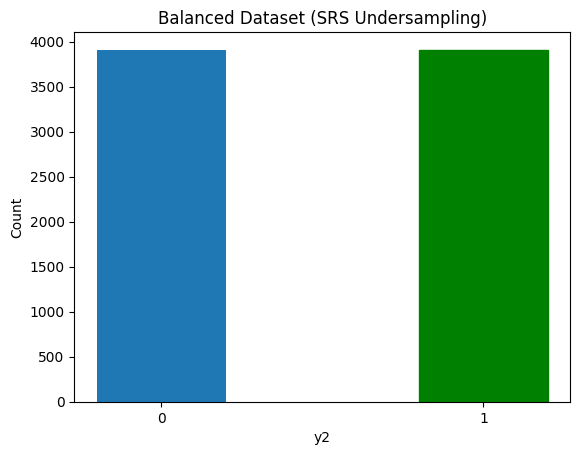

In [35]:
barlist = plt.bar([str(0),str(1)], y_S_SRS.value_counts(), width = 0.4)
barlist[1].set_color('g')

plt.xlabel("y2")
plt.ylabel("Count")
plt.title("Balanced Dataset (SRS Undersampling)")
plt.show()

In [36]:
data_T_y.value_counts()

,count
Y,
0,5139
1,1551


In [37]:
print('X_S_train:',np.shape(X_S_train))
print('y_S_train:',np.shape(y_S_train))
print('X_S_test:',np.shape(X_S_test))
print('y_S_test:',np.shape(y_S_test))

X_S_train: (6256, 20)
y_S_train: (6256,)
X_S_test: (1564, 20)
y_S_test: (1564,)


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - AUC: 0.6561 - loss: 0.6601 - val_AUC: 0.8674 - val_loss: 0.5244
Epoch 2/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8387 - loss: 0.4974 - val_AUC: 0.9034 - val_loss: 0.4215
Epoch 3/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.8791 - loss: 0.4362 - val_AUC: 0.9256 - val_loss: 0.4651
Epoch 4/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9144 - loss: 0.3763 - val_AUC: 0.9240 - val_loss: 0.3569
Epoch 5/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.9274 - loss: 0.3437 - val_AUC: 0.9392 - val_loss: 0.3674
Epoch 6/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.9264 - loss: 0.3469 - val_AUC: 0.9394 - val_loss: 0.3744
Epoch 7/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9299 - loss: 0.3400 - val_AUC: 0.9493 - val_loss: 0.2954
Epoch 8/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.9453 - loss: 0.3003 - val_AUC: 0.9488 - val_loss: 0.3170
Epoch 9/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step -

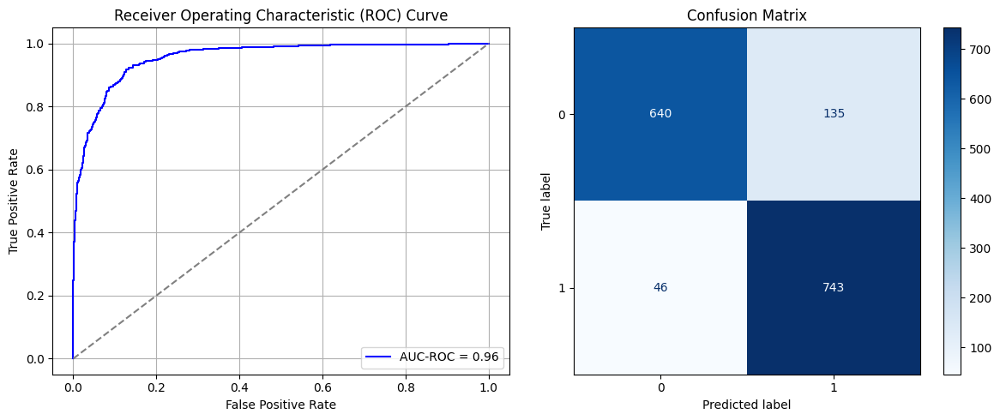

Best threshold based on F1-score: 0.6332316994667053
Time elapsed (performance): 14.514364037000007


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_7 (Dense)                 │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - AUC: 0.7112 - loss: 0.7409 - val_AUC: 0.0000e+00 - val_loss: 0.7774
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7438 - loss: 0.5738 - val_AUC: 0.0000e+00 - val_loss: 0.8990
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7216 - loss: 0.5774 - val_AUC: 0.0000e+00 - val_loss: 0.8396
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7113 - loss: 0.5847 - val_AUC: 0.0000e+00 - val_loss: 0.7107
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7408 - loss: 0.5673 - val_AUC: 0.0000e+00 - val_loss: 0.8183
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7286 - loss: 0.5689 - val_AUC: 0.0000e+00 - val_loss: 0.7456
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7711 - loss: 0.5464 - val_AUC: 0.0000e+00 - val_loss: 0.8758
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7266 - loss: 0.5831 - val_AUC: 0.0000e+00 - val_loss: 0.8366
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_14 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_15 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_16 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_17 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_18 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_19 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_20 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - AUC: 0.6981 - loss: 0.7795 - val_AUC: 0.0000e+00 - val_loss: 0.9571
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7167 - loss: 0.6056 - val_AUC: 0.0000e+00 - val_loss: 0.8359
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7294 - loss: 0.5794 - val_AUC: 0.0000e+00 - val_loss: 0.8411
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7262 - loss: 0.5743 - val_AUC: 0.0000e+00 - val_loss: 0.9195
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7266 - loss: 0.5821 - val_AUC: 0.0000e+00 - val_loss: 0.9638
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7313 - loss: 0.5753 - val_AUC: 0.0000e+00 - val_loss: 0.8456
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7573 - loss: 0.5598 - val_AUC: 0.0000e+00 - val_loss: 0.9749
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7353 - loss: 0.5815 - val_AUC: 0.0000e+00 - val_loss: 0.8393
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_21 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_22 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_23 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_24 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_25 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_26 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_27 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step - AUC: 0.7163 - loss: 0.7153 - val_AUC: 0.0000e+00 - val_loss: 0.8879
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7216 - loss: 0.5930 - val_AUC: 0.0000e+00 - val_loss: 0.8625
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7276 - loss: 0.5781 - val_AUC: 0.0000e+00 - val_loss: 0.8193
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7189 - loss: 0.5739 - val_AUC: 0.0000e+00 - val_loss: 0.8426
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7459 - loss: 0.5612 - val_AUC: 0.0000e+00 - val_loss: 0.7395
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7498 - loss: 0.5650 - val_AUC: 0.0000e+00 - val_loss: 0.8775
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7548 - loss: 0.5483 - val_AUC: 0.0000e+00 - val_loss: 0.7733
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7575 - loss: 0.5572 - val_AUC: 0.0000e+00 - val_loss: 0.8311
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_28 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_29 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_30 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_31 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_32 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_33 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_34 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.6893 - loss: 0.7615 - val_AUC: 0.0000e+00 - val_loss: 0.9150
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7048 - loss: 0.6010 - val_AUC: 0.0000e+00 - val_loss: 0.8952
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7211 - loss: 0.5812 - val_AUC: 0.0000e+00 - val_loss: 0.8268
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7282 - loss: 0.5742 - val_AUC: 0.0000e+00 - val_loss: 0.8768
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7470 - loss: 0.5591 - val_AUC: 0.0000e+00 - val_loss: 0.8408
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7466 - loss: 0.5587 - val_AUC: 0.0000e+00 - val_loss: 0.6737
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7424 - loss: 0.5669 - val_AUC: 0.0000e+00 - val_loss: 0.7589
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7543 - loss: 0.5571 - val_AUC: 0.0000e+00 - val_loss: 0.9215
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_35 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_36 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_37 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_38 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_39 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_40 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_41 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - AUC: 0.7081 - loss: 0.7354 - val_AUC: 0.0000e+00 - val_loss: 0.8343
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7294 - loss: 0.5792 - val_AUC: 0.0000e+00 - val_loss: 0.7840
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7466 - loss: 0.5676 - val_AUC: 0.0000e+00 - val_loss: 0.8318
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7505 - loss: 0.5610 - val_AUC: 0.0000e+00 - val_loss: 0.9164
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7149 - loss: 0.5872 - val_AUC: 0.0000e+00 - val_loss: 0.8763
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7489 - loss: 0.5596 - val_AUC: 0.0000e+00 - val_loss: 0.7888
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7414 - loss: 0.5672 - val_AUC: 0.0000e+00 - val_loss: 0.8148
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7530 - loss: 0.5613 - val_AUC: 0.0000e+00 - val_loss: 0.7868
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_42 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_43 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_44 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_45 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_46 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_47 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_48 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - AUC: 0.6920 - loss: 0.7445 - val_AUC: 0.0000e+00 - val_loss: 0.7505
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6992 - loss: 0.6139 - val_AUC: 0.0000e+00 - val_loss: 0.8478
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7431 - loss: 0.5738 - val_AUC: 0.0000e+00 - val_loss: 0.8082
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7522 - loss: 0.5662 - val_AUC: 0.0000e+00 - val_loss: 0.8597
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7369 - loss: 0.5756 - val_AUC: 0.0000e+00 - val_loss: 0.9252
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7442 - loss: 0.5509 - val_AUC: 0.0000e+00 - val_loss: 0.7397
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7390 - loss: 0.5716 - val_AUC: 0.0000e+00 - val_loss: 0.8824
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7269 - loss: 0.5678 - val_AUC: 0.0000e+00 - val_loss: 0.7937
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_49 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_50 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_51 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_52 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_53 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_54 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_55 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - AUC: 0.6940 - loss: 0.7538 - val_AUC: 0.0000e+00 - val_loss: 0.9357
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7223 - loss: 0.5894 - val_AUC: 0.0000e+00 - val_loss: 0.8845
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7303 - loss: 0.5761 - val_AUC: 0.0000e+00 - val_loss: 0.8283
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7637 - loss: 0.5587 - val_AUC: 0.0000e+00 - val_loss: 0.8294
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7265 - loss: 0.5844 - val_AUC: 0.0000e+00 - val_loss: 0.7908
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7480 - loss: 0.5544 - val_AUC: 0.0000e+00 - val_loss: 0.7852
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7509 - loss: 0.5582 - val_AUC: 0.0000e+00 - val_loss: 0.9265
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7499 - loss: 0.5563 - val_AUC: 0.0000e+00 - val_loss: 0.8734
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_56 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_57 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_58 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_59 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_60 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_61 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_62 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - AUC: 0.6887 - loss: 0.7810 - val_AUC: 0.0000e+00 - val_loss: 0.9529
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7082 - loss: 0.5903 - val_AUC: 0.0000e+00 - val_loss: 0.7780
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7379 - loss: 0.5746 - val_AUC: 0.0000e+00 - val_loss: 0.8388
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7313 - loss: 0.5812 - val_AUC: 0.0000e+00 - val_loss: 0.8099
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7461 - loss: 0.5585 - val_AUC: 0.0000e+00 - val_loss: 0.9074
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7439 - loss: 0.5650 - val_AUC: 0.0000e+00 - val_loss: 0.8284
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7441 - loss: 0.5541 - val_AUC: 0.0000e+00 - val_loss: 0.8527
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7480 - loss: 0.5594 - val_AUC: 0.0000e+00 - val_loss: 0.8682
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_63 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_64 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_65 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_66 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_67 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_68 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_69 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - AUC: 0.7069 - loss: 0.7514 - val_AUC: 0.0000e+00 - val_loss: 0.8732
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7062 - loss: 0.5992 - val_AUC: 0.0000e+00 - val_loss: 0.7758
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7331 - loss: 0.5735 - val_AUC: 0.0000e+00 - val_loss: 0.9143
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7451 - loss: 0.5703 - val_AUC: 0.0000e+00 - val_loss: 0.9234
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7363 - loss: 0.5689 - val_AUC: 0.0000e+00 - val_loss: 0.8429
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7344 - loss: 0.5786 - val_AUC: 0.0000e+00 - val_loss: 0.9197
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7603 - loss: 0.5499 - val_AUC: 0.0000e+00 - val_loss: 0.7874
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7208 - loss: 0.5766 - val_AUC: 0.0000e+00 - val_loss: 0.8265
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_10"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_70 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_71 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_72 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_73 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_74 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_75 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_76 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7082 - loss: 0.7644 - val_AUC: 0.0000e+00 - val_loss: 1.0244
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7255 - loss: 0.5859 - val_AUC: 0.0000e+00 - val_loss: 0.8161
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7382 - loss: 0.5724 - val_AUC: 0.0000e+00 - val_loss: 0.7585
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7390 - loss: 0.5666 - val_AUC: 0.0000e+00 - val_loss: 0.9649
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7068 - loss: 0.5866 - val_AUC: 0.0000e+00 - val_loss: 0.9560
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7249 - loss: 0.5819 - val_AUC: 0.0000e+00 - val_loss: 0.7731
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7363 - loss: 0.5719 - val_AUC: 0.0000e+00 - val_loss: 0.8787
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7552 - loss: 0.5521 - val_AUC: 0.0000e+00 - val_loss: 0.9292
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_77 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_78 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_79 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_80 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_81 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_82 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_83 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - AUC: 0.7259 - loss: 0.6962 - val_AUC: 0.0000e+00 - val_loss: 0.8359
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7150 - loss: 0.5940 - val_AUC: 0.0000e+00 - val_loss: 0.9174
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7230 - loss: 0.5853 - val_AUC: 0.0000e+00 - val_loss: 0.8975
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7330 - loss: 0.5768 - val_AUC: 0.0000e+00 - val_loss: 0.8550
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7525 - loss: 0.5600 - val_AUC: 0.0000e+00 - val_loss: 0.9710
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7356 - loss: 0.5779 - val_AUC: 0.0000e+00 - val_loss: 0.8201
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7491 - loss: 0.5644 - val_AUC: 0.0000e+00 - val_loss: 0.8070
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7608 - loss: 0.5526 - val_AUC: 0.0000e+00 - val_loss: 0.7968
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_12"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_84 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_85 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_86 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_87 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_88 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_89 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_90 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.6967 - loss: 0.7914 - val_AUC: 0.0000e+00 - val_loss: 0.9482
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7284 - loss: 0.5803 - val_AUC: 0.0000e+00 - val_loss: 0.8638
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7380 - loss: 0.5722 - val_AUC: 0.0000e+00 - val_loss: 0.8156
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7363 - loss: 0.5710 - val_AUC: 0.0000e+00 - val_loss: 1.0046
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7261 - loss: 0.5769 - val_AUC: 0.0000e+00 - val_loss: 0.8740
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7303 - loss: 0.5744 - val_AUC: 0.0000e+00 - val_loss: 0.8349
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7473 - loss: 0.5624 - val_AUC: 0.0000e+00 - val_loss: 0.8209
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7375 - loss: 0.5687 - val_AUC: 0.0000e+00 - val_loss: 0.8016
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_13"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_91 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_92 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_93 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_94 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_95 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_96 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_97 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - AUC: 0.6981 - loss: 0.7699 - val_AUC: 0.0000e+00 - val_loss: 0.9352
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7127 - loss: 0.6015 - val_AUC: 0.0000e+00 - val_loss: 0.7917
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7279 - loss: 0.5751 - val_AUC: 0.0000e+00 - val_loss: 0.7985
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7382 - loss: 0.5676 - val_AUC: 0.0000e+00 - val_loss: 0.8957
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7373 - loss: 0.5598 - val_AUC: 0.0000e+00 - val_loss: 0.8282
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7450 - loss: 0.5697 - val_AUC: 0.0000e+00 - val_loss: 0.8718
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7349 - loss: 0.5759 - val_AUC: 0.0000e+00 - val_loss: 0.8922
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7330 - loss: 0.5791 - val_AUC: 0.0000e+00 - val_loss: 0.8180
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_14"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_98 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_99 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_100 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_101 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_102 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_103 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_104 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7075 - loss: 0.7516 - val_AUC: 0.0000e+00 - val_loss: 0.9363
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7086 - loss: 0.5989 - val_AUC: 0.0000e+00 - val_loss: 0.9052
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7419 - loss: 0.5725 - val_AUC: 0.0000e+00 - val_loss: 0.7685
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7467 - loss: 0.5696 - val_AUC: 0.0000e+00 - val_loss: 0.8730
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7485 - loss: 0.5618 - val_AUC: 0.0000e+00 - val_loss: 0.8644
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7293 - loss: 0.5707 - val_AUC: 0.0000e+00 - val_loss: 0.7419
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7415 - loss: 0.5647 - val_AUC: 0.0000e+00 - val_loss: 0.7261
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7520 - loss: 0.5593 - val_AUC: 0.0000e+00 - val_loss: 0.9230
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_15"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_105 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_106 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_107 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_108 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_109 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_110 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_111 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7259 - loss: 0.7090 - val_AUC: 0.0000e+00 - val_loss: 0.7872
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7091 - loss: 0.5990 - val_AUC: 0.0000e+00 - val_loss: 0.9235
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7140 - loss: 0.5843 - val_AUC: 0.0000e+00 - val_loss: 0.9276
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7227 - loss: 0.5816 - val_AUC: 0.0000e+00 - val_loss: 0.9074
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7103 - loss: 0.5842 - val_AUC: 0.0000e+00 - val_loss: 0.8567
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7493 - loss: 0.5568 - val_AUC: 0.0000e+00 - val_loss: 0.7557
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7384 - loss: 0.5730 - val_AUC: 0.0000e+00 - val_loss: 0.9300
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7451 - loss: 0.5660 - val_AUC: 0.0000e+00 - val_loss: 0.8813
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_112 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_113 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_114 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_115 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_116 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_117 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_118 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.6963 - loss: 0.7656 - val_AUC: 0.0000e+00 - val_loss: 0.9527
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7234 - loss: 0.5869 - val_AUC: 0.0000e+00 - val_loss: 0.7896
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7346 - loss: 0.5760 - val_AUC: 0.0000e+00 - val_loss: 0.8047
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7269 - loss: 0.5787 - val_AUC: 0.0000e+00 - val_loss: 0.9437
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7430 - loss: 0.5705 - val_AUC: 0.0000e+00 - val_loss: 0.8732
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7242 - loss: 0.5792 - val_AUC: 0.0000e+00 - val_loss: 0.8631
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7395 - loss: 0.5686 - val_AUC: 0.0000e+00 - val_loss: 0.7929
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7394 - loss: 0.5682 - val_AUC: 0.0000e+00 - val_loss: 0.8165
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_17"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_119 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_120 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_121 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_122 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_123 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_124 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_125 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - AUC: 0.7267 - loss: 0.7248 - val_AUC: 0.0000e+00 - val_loss: 0.8699
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7243 - loss: 0.5879 - val_AUC: 0.0000e+00 - val_loss: 0.8790
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7332 - loss: 0.5790 - val_AUC: 0.0000e+00 - val_loss: 0.8242
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7311 - loss: 0.5644 - val_AUC: 0.0000e+00 - val_loss: 0.8968
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7431 - loss: 0.5642 - val_AUC: 0.0000e+00 - val_loss: 0.7428
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7404 - loss: 0.5658 - val_AUC: 0.0000e+00 - val_loss: 0.7884
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7338 - loss: 0.5706 - val_AUC: 0.0000e+00 - val_loss: 0.8545
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7449 - loss: 0.5602 - val_AUC: 0.0000e+00 - val_loss: 0.7772
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_18"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_126 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_127 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_128 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_129 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_130 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_131 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_132 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - AUC: 0.7113 - loss: 0.7328 - val_AUC: 0.0000e+00 - val_loss: 0.8625
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7407 - loss: 0.5694 - val_AUC: 0.0000e+00 - val_loss: 0.8960
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7309 - loss: 0.5764 - val_AUC: 0.0000e+00 - val_loss: 0.8875
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7364 - loss: 0.5726 - val_AUC: 0.0000e+00 - val_loss: 0.9110
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7323 - loss: 0.5622 - val_AUC: 0.0000e+00 - val_loss: 0.7827
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7337 - loss: 0.5692 - val_AUC: 0.0000e+00 - val_loss: 0.7222
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7443 - loss: 0.5585 - val_AUC: 0.0000e+00 - val_loss: 0.8505
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7510 - loss: 0.5647 - val_AUC: 0.0000e+00 - val_loss: 0.8554
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_19"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_133 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_134 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_135 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_136 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_137 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_138 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_139 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.6926 - loss: 0.7690 - val_AUC: 0.0000e+00 - val_loss: 0.7961
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.6984 - loss: 0.6015 - val_AUC: 0.0000e+00 - val_loss: 0.7388
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7256 - loss: 0.5862 - val_AUC: 0.0000e+00 - val_loss: 0.7908
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7366 - loss: 0.5839 - val_AUC: 0.0000e+00 - val_loss: 0.8502
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7292 - loss: 0.5799 - val_AUC: 0.0000e+00 - val_loss: 0.8182
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7439 - loss: 0.5666 - val_AUC: 0.0000e+00 - val_loss: 0.9217
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7397 - loss: 0.5673 - val_AUC: 0.0000e+00 - val_loss: 0.7628
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7285 - loss: 0.5757 - val_AUC: 0.0000e+00 - val_loss: 0.8362
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_20"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_140 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_141 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_142 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_143 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_144 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_145 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_146 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step - AUC: 0.7176 - loss: 0.7336 - val_AUC: 0.0000e+00 - val_loss: 0.7803
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7508 - loss: 0.5679 - val_AUC: 0.0000e+00 - val_loss: 0.8376
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7325 - loss: 0.5711 - val_AUC: 0.0000e+00 - val_loss: 0.7940
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7405 - loss: 0.5658 - val_AUC: 0.0000e+00 - val_loss: 0.8091
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7391 - loss: 0.5684 - val_AUC: 0.0000e+00 - val_loss: 0.8236
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7362 - loss: 0.5705 - val_AUC: 0.0000e+00 - val_loss: 0.8158
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7211 - loss: 0.5836 - val_AUC: 0.0000e+00 - val_loss: 0.9695
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7434 - loss: 0.5617 - val_AUC: 0.0000e+00 - val_loss: 0.8990
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_21"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_147 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_148 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_149 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_150 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_151 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_152 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_153 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - AUC: 0.6303 - loss: 0.6670 - val_AUC: 0.8528 - val_loss: 0.4941
Epoch 2/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8292 - loss: 0.5099 - val_AUC: 0.8950 - val_loss: 0.4205
Epoch 3/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.8795 - loss: 0.4370 - val_AUC: 0.9153 - val_loss: 0.4683
Epoch 4/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.8938 - loss: 0.4132 - val_AUC: 0.9335 - val_loss: 0.3590
Epoch 5/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9109 - loss: 0.3781 - val_AUC: 0.9425 - val_loss: 0.3198
Epoch 6/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9208 - loss: 0.3590 - val_AUC: 0.9476 - val_loss: 0.2994
Epoch 7/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.9415 - loss: 0.3100 - val_AUC: 0.9440 - val_loss: 0.3062
Epoch 8/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9355 - loss: 0.3248 - val_AUC: 0.9530 - val_loss: 0.2827
Epoch 9/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

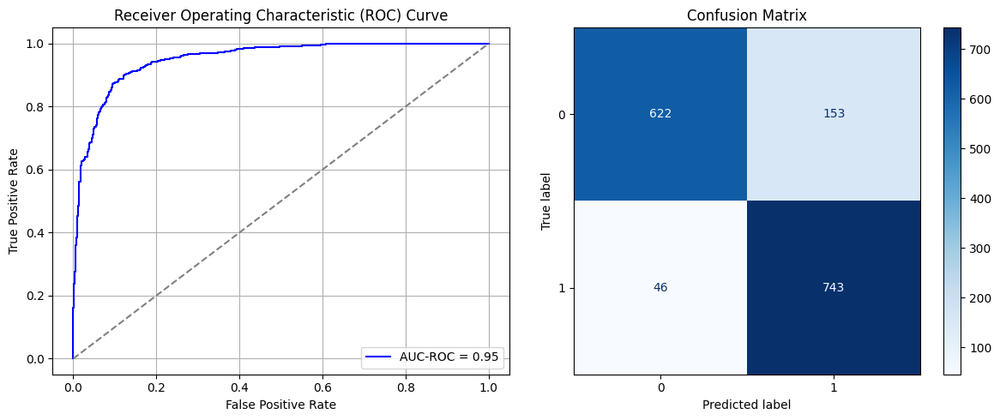

Best threshold based on F1-score: 0.6631269454956055
Time elapsed (performance): 12.438077910000004


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_22"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_154 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_155 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_156 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_157 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_158 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_159 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_160 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7093 - loss: 0.7543 - val_AUC: 0.0000e+00 - val_loss: 0.9378
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7562 - loss: 0.5504 - val_AUC: 0.0000e+00 - val_loss: 0.8139
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7367 - loss: 0.5644 - val_AUC: 0.0000e+00 - val_loss: 0.8198
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7070 - loss: 0.5928 - val_AUC: 0.0000e+00 - val_loss: 0.8819
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7438 - loss: 0.5630 - val_AUC: 0.0000e+00 - val_loss: 0.8924
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7373 - loss: 0.5765 - val_AUC: 0.0000e+00 - val_loss: 0.8582
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7399 - loss: 0.5691 - val_AUC: 0.0000e+00 - val_loss: 0.8714
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7275 - loss: 0.5804 - val_AUC: 0.0000e+00 - val_loss: 0.7898
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_23"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_161 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_162 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_163 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_164 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_165 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_166 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_167 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7245 - loss: 0.7463 - val_AUC: 0.0000e+00 - val_loss: 0.9037
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7388 - loss: 0.5642 - val_AUC: 0.0000e+00 - val_loss: 0.8228
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7257 - loss: 0.5711 - val_AUC: 0.0000e+00 - val_loss: 0.8690
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7407 - loss: 0.5709 - val_AUC: 0.0000e+00 - val_loss: 0.9038
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7462 - loss: 0.5596 - val_AUC: 0.0000e+00 - val_loss: 0.9118
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7499 - loss: 0.5516 - val_AUC: 0.0000e+00 - val_loss: 0.9522
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7376 - loss: 0.5689 - val_AUC: 0.0000e+00 - val_loss: 1.0334
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7280 - loss: 0.5913 - val_AUC: 0.0000e+00 - val_loss: 0.7134
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_24"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_168 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_169 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_170 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_171 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_172 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_173 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_174 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7258 - loss: 0.7289 - val_AUC: 0.0000e+00 - val_loss: 0.8821
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7139 - loss: 0.5882 - val_AUC: 0.0000e+00 - val_loss: 0.8918
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7159 - loss: 0.5834 - val_AUC: 0.0000e+00 - val_loss: 0.8431
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7379 - loss: 0.5721 - val_AUC: 0.0000e+00 - val_loss: 1.0111
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7267 - loss: 0.5834 - val_AUC: 0.0000e+00 - val_loss: 0.8569
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7305 - loss: 0.5718 - val_AUC: 0.0000e+00 - val_loss: 0.7743
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7420 - loss: 0.5715 - val_AUC: 0.0000e+00 - val_loss: 0.8380
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7404 - loss: 0.5712 - val_AUC: 0.0000e+00 - val_loss: 0.8223
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_25"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_175 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_176 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_177 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_178 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_179 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_180 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_181 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - AUC: 0.7250 - loss: 0.7113 - val_AUC: 0.0000e+00 - val_loss: 0.8904
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7370 - loss: 0.5838 - val_AUC: 0.0000e+00 - val_loss: 0.9138
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7339 - loss: 0.5774 - val_AUC: 0.0000e+00 - val_loss: 0.8002
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7159 - loss: 0.5747 - val_AUC: 0.0000e+00 - val_loss: 0.8271
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7341 - loss: 0.5745 - val_AUC: 0.0000e+00 - val_loss: 0.9066
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7179 - loss: 0.5768 - val_AUC: 0.0000e+00 - val_loss: 0.8934
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7233 - loss: 0.5743 - val_AUC: 0.0000e+00 - val_loss: 0.7747
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7218 - loss: 0.5796 - val_AUC: 0.0000e+00 - val_loss: 0.8444
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_26"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_182 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_183 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_184 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_185 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_186 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_187 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_188 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 5s 41ms/step - AUC: 0.6855 - loss: 0.7782 - val_AUC: 0.0000e+00 - val_loss: 0.8168
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7327 - loss: 0.5738 - val_AUC: 0.0000e+00 - val_loss: 0.7617
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7192 - loss: 0.5925 - val_AUC: 0.0000e+00 - val_loss: 0.9626
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7326 - loss: 0.5849 - val_AUC: 0.0000e+00 - val_loss: 0.9075
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7503 - loss: 0.5611 - val_AUC: 0.0000e+00 - val_loss: 0.9196
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7334 - loss: 0.5792 - val_AUC: 0.0000e+00 - val_loss: 0.8664
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7575 - loss: 0.5489 - val_AUC: 0.0000e+00 - val_loss: 0.6996
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7209 - loss: 0.5750 - val_AUC: 0.0000e+00 - val_loss: 0.8478
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_27"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_189 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_190 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_191 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_192 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_193 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_194 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_195 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - AUC: 0.7190 - loss: 0.7386 - val_AUC: 0.0000e+00 - val_loss: 0.8568
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7348 - loss: 0.5878 - val_AUC: 0.0000e+00 - val_loss: 0.9170
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7459 - loss: 0.5606 - val_AUC: 0.0000e+00 - val_loss: 0.8226
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7355 - loss: 0.5760 - val_AUC: 0.0000e+00 - val_loss: 0.8654
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7379 - loss: 0.5678 - val_AUC: 0.0000e+00 - val_loss: 0.8725
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7338 - loss: 0.5701 - val_AUC: 0.0000e+00 - val_loss: 0.7991
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7371 - loss: 0.5818 - val_AUC: 0.0000e+00 - val_loss: 0.9520
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7274 - loss: 0.5692 - val_AUC: 0.0000e+00 - val_loss: 0.8241
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_28"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_196 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_197 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_198 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_199 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_200 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_201 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_202 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - AUC: 0.7197 - loss: 0.7419 - val_AUC: 0.0000e+00 - val_loss: 0.8875
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7395 - loss: 0.5715 - val_AUC: 0.0000e+00 - val_loss: 0.8253
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7289 - loss: 0.5748 - val_AUC: 0.0000e+00 - val_loss: 0.8744
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7377 - loss: 0.5600 - val_AUC: 0.0000e+00 - val_loss: 0.8656
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7466 - loss: 0.5565 - val_AUC: 0.0000e+00 - val_loss: 0.8575
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7342 - loss: 0.5701 - val_AUC: 0.0000e+00 - val_loss: 0.8388
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7185 - loss: 0.5775 - val_AUC: 0.0000e+00 - val_loss: 0.8839
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7488 - loss: 0.5608 - val_AUC: 0.0000e+00 - val_loss: 0.7233
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_29"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_203 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_204 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_205 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_206 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_207 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_208 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_209 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7162 - loss: 0.7587 - val_AUC: 0.0000e+00 - val_loss: 0.8616
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7128 - loss: 0.5872 - val_AUC: 0.0000e+00 - val_loss: 0.8022
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7367 - loss: 0.5655 - val_AUC: 0.0000e+00 - val_loss: 0.8206
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7238 - loss: 0.5735 - val_AUC: 0.0000e+00 - val_loss: 0.8542
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7360 - loss: 0.5751 - val_AUC: 0.0000e+00 - val_loss: 0.8180
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7512 - loss: 0.5548 - val_AUC: 0.0000e+00 - val_loss: 0.7639
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7213 - loss: 0.5876 - val_AUC: 0.0000e+00 - val_loss: 0.9710
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7342 - loss: 0.5738 - val_AUC: 0.0000e+00 - val_loss: 0.8709
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_30"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_210 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_211 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_212 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_213 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_214 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_215 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_216 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7226 - loss: 0.7402 - val_AUC: 0.0000e+00 - val_loss: 0.9916
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7147 - loss: 0.5968 - val_AUC: 0.0000e+00 - val_loss: 0.9032
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7236 - loss: 0.5829 - val_AUC: 0.0000e+00 - val_loss: 0.8248
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7347 - loss: 0.5704 - val_AUC: 0.0000e+00 - val_loss: 0.9042
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7387 - loss: 0.5704 - val_AUC: 0.0000e+00 - val_loss: 0.8380
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7413 - loss: 0.5691 - val_AUC: 0.0000e+00 - val_loss: 0.8394
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7179 - loss: 0.5829 - val_AUC: 0.0000e+00 - val_loss: 0.8296
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7380 - loss: 0.5708 - val_AUC: 0.0000e+00 - val_loss: 0.8467
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_31"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_217 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_218 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_219 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_220 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_221 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_222 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_223 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - AUC: 0.7190 - loss: 0.7383 - val_AUC: 0.0000e+00 - val_loss: 0.8250
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7037 - loss: 0.6059 - val_AUC: 0.0000e+00 - val_loss: 0.9100
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7411 - loss: 0.5697 - val_AUC: 0.0000e+00 - val_loss: 0.8713
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7118 - loss: 0.5873 - val_AUC: 0.0000e+00 - val_loss: 1.0430
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7207 - loss: 0.5890 - val_AUC: 0.0000e+00 - val_loss: 0.9430
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7181 - loss: 0.5793 - val_AUC: 0.0000e+00 - val_loss: 0.8520
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7426 - loss: 0.5680 - val_AUC: 0.0000e+00 - val_loss: 0.9256
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7287 - loss: 0.5827 - val_AUC: 0.0000e+00 - val_loss: 0.8020
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_32"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_224 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_225 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_226 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_227 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_228 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_229 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_230 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7370 - loss: 0.7069 - val_AUC: 0.0000e+00 - val_loss: 0.8795
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7275 - loss: 0.5821 - val_AUC: 0.0000e+00 - val_loss: 0.8101
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7283 - loss: 0.5808 - val_AUC: 0.0000e+00 - val_loss: 0.9688
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7394 - loss: 0.5813 - val_AUC: 0.0000e+00 - val_loss: 0.8749
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7267 - loss: 0.5763 - val_AUC: 0.0000e+00 - val_loss: 0.8290
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7469 - loss: 0.5672 - val_AUC: 0.0000e+00 - val_loss: 0.9365
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7325 - loss: 0.5694 - val_AUC: 0.0000e+00 - val_loss: 0.7864
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7359 - loss: 0.5691 - val_AUC: 0.0000e+00 - val_loss: 0.9494
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_33"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_231 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_232 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_233 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_234 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_235 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_236 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_237 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7243 - loss: 0.7181 - val_AUC: 0.0000e+00 - val_loss: 0.8363
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7236 - loss: 0.5762 - val_AUC: 0.0000e+00 - val_loss: 0.9212
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7391 - loss: 0.5689 - val_AUC: 0.0000e+00 - val_loss: 0.8576
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7471 - loss: 0.5671 - val_AUC: 0.0000e+00 - val_loss: 0.8429
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7294 - loss: 0.5737 - val_AUC: 0.0000e+00 - val_loss: 0.7502
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7549 - loss: 0.5580 - val_AUC: 0.0000e+00 - val_loss: 0.8157
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7412 - loss: 0.5656 - val_AUC: 0.0000e+00 - val_loss: 0.8698
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7241 - loss: 0.5860 - val_AUC: 0.0000e+00 - val_loss: 0.9503
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_34"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_238 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_239 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_240 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_241 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_242 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_243 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_244 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 5s 41ms/step - AUC: 0.7210 - loss: 0.7470 - val_AUC: 0.0000e+00 - val_loss: 0.8213
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7232 - loss: 0.5841 - val_AUC: 0.0000e+00 - val_loss: 0.8786
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7222 - loss: 0.5817 - val_AUC: 0.0000e+00 - val_loss: 0.8503
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7347 - loss: 0.5652 - val_AUC: 0.0000e+00 - val_loss: 0.9057
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7328 - loss: 0.5743 - val_AUC: 0.0000e+00 - val_loss: 0.7190
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7381 - loss: 0.5713 - val_AUC: 0.0000e+00 - val_loss: 0.6962
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7186 - loss: 0.5911 - val_AUC: 0.0000e+00 - val_loss: 0.8102
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7307 - loss: 0.5716 - val_AUC: 0.0000e+00 - val_loss: 0.9180
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_35"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_245 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_246 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_247 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_248 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_249 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_250 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_251 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7235 - loss: 0.7037 - val_AUC: 0.0000e+00 - val_loss: 0.8421
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7317 - loss: 0.5831 - val_AUC: 0.0000e+00 - val_loss: 0.9248
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7321 - loss: 0.5712 - val_AUC: 0.0000e+00 - val_loss: 0.9052
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7187 - loss: 0.5844 - val_AUC: 0.0000e+00 - val_loss: 0.8999
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7252 - loss: 0.5840 - val_AUC: 0.0000e+00 - val_loss: 0.8411
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7253 - loss: 0.5808 - val_AUC: 0.0000e+00 - val_loss: 0.8536
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7454 - loss: 0.5648 - val_AUC: 0.0000e+00 - val_loss: 0.7596
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7331 - loss: 0.5766 - val_AUC: 0.0000e+00 - val_loss: 0.8843
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_36"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_252 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_253 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_254 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_255 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_256 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_257 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_258 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7288 - loss: 0.7189 - val_AUC: 0.0000e+00 - val_loss: 0.9146
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7340 - loss: 0.5728 - val_AUC: 0.0000e+00 - val_loss: 0.8668
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7469 - loss: 0.5633 - val_AUC: 0.0000e+00 - val_loss: 0.7108
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7119 - loss: 0.5946 - val_AUC: 0.0000e+00 - val_loss: 0.9569
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7303 - loss: 0.5737 - val_AUC: 0.0000e+00 - val_loss: 0.8131
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7163 - loss: 0.5789 - val_AUC: 0.0000e+00 - val_loss: 0.8142
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7290 - loss: 0.5761 - val_AUC: 0.0000e+00 - val_loss: 0.9283
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7382 - loss: 0.5646 - val_AUC: 0.0000e+00 - val_loss: 0.8263
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_37"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_259 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_260 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_261 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_262 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_263 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_264 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_265 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - AUC: 0.7105 - loss: 0.7698 - val_AUC: 0.0000e+00 - val_loss: 0.8957
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7319 - loss: 0.5808 - val_AUC: 0.0000e+00 - val_loss: 0.8344
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7441 - loss: 0.5653 - val_AUC: 0.0000e+00 - val_loss: 0.8084
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7211 - loss: 0.5828 - val_AUC: 0.0000e+00 - val_loss: 0.7997
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7350 - loss: 0.5575 - val_AUC: 0.0000e+00 - val_loss: 0.8250
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7286 - loss: 0.5773 - val_AUC: 0.0000e+00 - val_loss: 0.8247
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7390 - loss: 0.5735 - val_AUC: 0.0000e+00 - val_loss: 0.8825
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7292 - loss: 0.5735 - val_AUC: 0.0000e+00 - val_loss: 0.9300
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_38"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_266 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_267 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_268 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_269 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_270 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_271 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_272 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - AUC: 0.7142 - loss: 0.7056 - val_AUC: 0.0000e+00 - val_loss: 0.8694
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7213 - loss: 0.5900 - val_AUC: 0.0000e+00 - val_loss: 0.8597
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7350 - loss: 0.5688 - val_AUC: 0.0000e+00 - val_loss: 0.8698
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7340 - loss: 0.5684 - val_AUC: 0.0000e+00 - val_loss: 0.8247
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7153 - loss: 0.5884 - val_AUC: 0.0000e+00 - val_loss: 0.8817
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7336 - loss: 0.5704 - val_AUC: 0.0000e+00 - val_loss: 0.8249
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7201 - loss: 0.5712 - val_AUC: 0.0000e+00 - val_loss: 0.7919
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7377 - loss: 0.5716 - val_AUC: 0.0000e+00 - val_loss: 0.9073
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_39"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_273 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_274 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_275 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_276 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_277 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_278 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_279 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7378 - loss: 0.6925 - val_AUC: 0.0000e+00 - val_loss: 0.8630
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7324 - loss: 0.5842 - val_AUC: 0.0000e+00 - val_loss: 0.7973
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7259 - loss: 0.5855 - val_AUC: 0.0000e+00 - val_loss: 0.8562
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7396 - loss: 0.5716 - val_AUC: 0.0000e+00 - val_loss: 0.9288
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7349 - loss: 0.5702 - val_AUC: 0.0000e+00 - val_loss: 0.8297
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7291 - loss: 0.5804 - val_AUC: 0.0000e+00 - val_loss: 0.7901
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7287 - loss: 0.5720 - val_AUC: 0.0000e+00 - val_loss: 0.7080
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7222 - loss: 0.5767 - val_AUC: 0.0000e+00 - val_loss: 0.8796
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_40"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_280 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_281 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_282 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_283 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_284 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_285 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_286 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7056 - loss: 0.7818 - val_AUC: 0.0000e+00 - val_loss: 0.9173
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7256 - loss: 0.5836 - val_AUC: 0.0000e+00 - val_loss: 0.8401
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7022 - loss: 0.6024 - val_AUC: 0.0000e+00 - val_loss: 0.8785
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7345 - loss: 0.5801 - val_AUC: 0.0000e+00 - val_loss: 0.8228
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7337 - loss: 0.5634 - val_AUC: 0.0000e+00 - val_loss: 0.8079
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7362 - loss: 0.5733 - val_AUC: 0.0000e+00 - val_loss: 0.9106
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7366 - loss: 0.5738 - val_AUC: 0.0000e+00 - val_loss: 0.9624
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7497 - loss: 0.5646 - val_AUC: 0.0000e+00 - val_loss: 0.8395
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_41"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_287 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_288 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_289 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_290 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_291 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_292 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_293 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - AUC: 0.7053 - loss: 0.7791 - val_AUC: 0.0000e+00 - val_loss: 0.9343
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7404 - loss: 0.5727 - val_AUC: 0.0000e+00 - val_loss: 0.8004
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7200 - loss: 0.5827 - val_AUC: 0.0000e+00 - val_loss: 0.8599
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7368 - loss: 0.5631 - val_AUC: 0.0000e+00 - val_loss: 0.7979
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7192 - loss: 0.5807 - val_AUC: 0.0000e+00 - val_loss: 0.9540
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7147 - loss: 0.5840 - val_AUC: 0.0000e+00 - val_loss: 0.8714
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7381 - loss: 0.5626 - val_AUC: 0.0000e+00 - val_loss: 0.8540
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7288 - loss: 0.5820 - val_AUC: 0.0000e+00 - val_loss: 0.9234
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_42"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_294 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_295 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_296 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_297 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_298 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_299 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_300 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - AUC: 0.5946 - loss: 0.6748 - val_AUC: 0.8155 - val_loss: 0.5413
Epoch 2/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.8098 - loss: 0.5338 - val_AUC: 0.8903 - val_loss: 0.4394
Epoch 3/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.8682 - loss: 0.4562 - val_AUC: 0.9135 - val_loss: 0.3843
Epoch 4/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8932 - loss: 0.4119 - val_AUC: 0.9219 - val_loss: 0.3599
Epoch 5/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9133 - loss: 0.3751 - val_AUC: 0.9342 - val_loss: 0.3782
Epoch 6/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9221 - loss: 0.3561 - val_AUC: 0.9424 - val_loss: 0.3102
Epoch 7/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9399 - loss: 0.3142 - val_AUC: 0.9335 - val_loss: 0.3308
Epoch 8/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9451 - loss: 0.2985 - val_AUC: 0.9532 - val_loss: 0.3095
Epoch 9/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

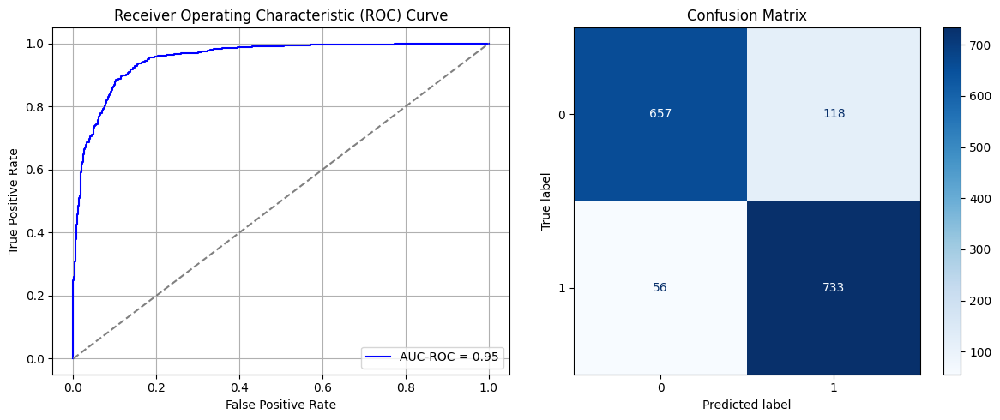

Best threshold based on F1-score: 0.48572832345962524
Time elapsed (performance): 15.320925405000025


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_43"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_301 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_302 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_303 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_304 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_305 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_306 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_307 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - AUC: 0.7381 - loss: 0.6448 - val_AUC: 0.0000e+00 - val_loss: 0.8694
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7680 - loss: 0.5480 - val_AUC: 0.0000e+00 - val_loss: 0.8349
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7273 - loss: 0.5807 - val_AUC: 0.0000e+00 - val_loss: 0.8055
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7408 - loss: 0.5594 - val_AUC: 0.0000e+00 - val_loss: 0.8405
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7398 - loss: 0.5574 - val_AUC: 0.0000e+00 - val_loss: 0.8597
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7415 - loss: 0.5643 - val_AUC: 0.0000e+00 - val_loss: 0.8463
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7492 - loss: 0.5560 - val_AUC: 0.0000e+00 - val_loss: 0.8196
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7323 - loss: 0.5705 - val_AUC: 0.0000e+00 - val_loss: 0.8769
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_44"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_308 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_309 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_310 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_311 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_312 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_313 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_314 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7590 - loss: 0.6160 - val_AUC: 0.0000e+00 - val_loss: 0.8399
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7453 - loss: 0.5730 - val_AUC: 0.0000e+00 - val_loss: 0.7988
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7618 - loss: 0.5512 - val_AUC: 0.0000e+00 - val_loss: 0.6968
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7415 - loss: 0.5641 - val_AUC: 0.0000e+00 - val_loss: 0.7340
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7418 - loss: 0.5691 - val_AUC: 0.0000e+00 - val_loss: 0.8498
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7311 - loss: 0.5657 - val_AUC: 0.0000e+00 - val_loss: 0.8480
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7468 - loss: 0.5625 - val_AUC: 0.0000e+00 - val_loss: 0.7697
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7241 - loss: 0.5734 - val_AUC: 0.0000e+00 - val_loss: 0.7815
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_45"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_315 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_316 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_317 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_318 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_319 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_320 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_321 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 5s 41ms/step - AUC: 0.7563 - loss: 0.6137 - val_AUC: 0.0000e+00 - val_loss: 0.8535
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7305 - loss: 0.5802 - val_AUC: 0.0000e+00 - val_loss: 0.8757
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7587 - loss: 0.5586 - val_AUC: 0.0000e+00 - val_loss: 0.8094
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7325 - loss: 0.5750 - val_AUC: 0.0000e+00 - val_loss: 0.8037
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7266 - loss: 0.5710 - val_AUC: 0.0000e+00 - val_loss: 0.8028
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7329 - loss: 0.5630 - val_AUC: 0.0000e+00 - val_loss: 0.8817
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7322 - loss: 0.5696 - val_AUC: 0.0000e+00 - val_loss: 0.8335
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7400 - loss: 0.5639 - val_AUC: 0.0000e+00 - val_loss: 0.8305
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_46"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_322 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_323 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_324 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_325 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_326 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_327 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_328 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7401 - loss: 0.6456 - val_AUC: 0.0000e+00 - val_loss: 0.9153
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7664 - loss: 0.5517 - val_AUC: 0.0000e+00 - val_loss: 0.8429
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7416 - loss: 0.5601 - val_AUC: 0.0000e+00 - val_loss: 0.8786
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7367 - loss: 0.5704 - val_AUC: 0.0000e+00 - val_loss: 0.8363
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7459 - loss: 0.5552 - val_AUC: 0.0000e+00 - val_loss: 0.9377
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7444 - loss: 0.5627 - val_AUC: 0.0000e+00 - val_loss: 0.7936
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7295 - loss: 0.5693 - val_AUC: 0.0000e+00 - val_loss: 0.8475
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7544 - loss: 0.5578 - val_AUC: 0.0000e+00 - val_loss: 0.8099
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_47"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_329 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_330 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_331 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_332 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_333 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_334 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_335 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7171 - loss: 0.6852 - val_AUC: 0.0000e+00 - val_loss: 0.9688
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7355 - loss: 0.5797 - val_AUC: 0.0000e+00 - val_loss: 0.8562
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7590 - loss: 0.5500 - val_AUC: 0.0000e+00 - val_loss: 0.8481
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7293 - loss: 0.5665 - val_AUC: 0.0000e+00 - val_loss: 0.8323
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7236 - loss: 0.5666 - val_AUC: 0.0000e+00 - val_loss: 0.7718
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7481 - loss: 0.5532 - val_AUC: 0.0000e+00 - val_loss: 0.8220
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7468 - loss: 0.5568 - val_AUC: 0.0000e+00 - val_loss: 0.7254
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7296 - loss: 0.5731 - val_AUC: 0.0000e+00 - val_loss: 0.8030
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_48"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_336 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_337 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_338 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_339 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_340 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_341 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_342 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - AUC: 0.7411 - loss: 0.6418 - val_AUC: 0.0000e+00 - val_loss: 0.9276
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7298 - loss: 0.5922 - val_AUC: 0.0000e+00 - val_loss: 0.8332
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7540 - loss: 0.5495 - val_AUC: 0.0000e+00 - val_loss: 0.7864
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7368 - loss: 0.5730 - val_AUC: 0.0000e+00 - val_loss: 0.8001
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7516 - loss: 0.5529 - val_AUC: 0.0000e+00 - val_loss: 0.7923
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7443 - loss: 0.5691 - val_AUC: 0.0000e+00 - val_loss: 0.8797
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7431 - loss: 0.5600 - val_AUC: 0.0000e+00 - val_loss: 0.8017
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7441 - loss: 0.5605 - val_AUC: 0.0000e+00 - val_loss: 0.8457
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_49"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_343 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_344 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_345 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_346 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_347 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_348 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_349 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 5s 41ms/step - AUC: 0.7510 - loss: 0.6216 - val_AUC: 0.0000e+00 - val_loss: 0.8769
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7521 - loss: 0.5596 - val_AUC: 0.0000e+00 - val_loss: 0.7933
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7370 - loss: 0.5772 - val_AUC: 0.0000e+00 - val_loss: 0.9459
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7201 - loss: 0.5765 - val_AUC: 0.0000e+00 - val_loss: 0.8225
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7368 - loss: 0.5694 - val_AUC: 0.0000e+00 - val_loss: 0.7599
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7499 - loss: 0.5640 - val_AUC: 0.0000e+00 - val_loss: 0.8657
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7364 - loss: 0.5611 - val_AUC: 0.0000e+00 - val_loss: 0.8556
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7463 - loss: 0.5611 - val_AUC: 0.0000e+00 - val_loss: 0.8151
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_50"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_350 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_351 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_352 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_353 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_354 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_355 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_356 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step - AUC: 0.7273 - loss: 0.6615 - val_AUC: 0.0000e+00 - val_loss: 0.9280
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7543 - loss: 0.5591 - val_AUC: 0.0000e+00 - val_loss: 0.8670
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7372 - loss: 0.5697 - val_AUC: 0.0000e+00 - val_loss: 0.8984
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7381 - loss: 0.5721 - val_AUC: 0.0000e+00 - val_loss: 0.9291
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7502 - loss: 0.5605 - val_AUC: 0.0000e+00 - val_loss: 0.7911
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7346 - loss: 0.5709 - val_AUC: 0.0000e+00 - val_loss: 0.8513
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7472 - loss: 0.5622 - val_AUC: 0.0000e+00 - val_loss: 0.8964
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7465 - loss: 0.5647 - val_AUC: 0.0000e+00 - val_loss: 0.8474
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_51"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_357 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_358 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_359 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_360 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_361 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_362 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_363 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7527 - loss: 0.6171 - val_AUC: 0.0000e+00 - val_loss: 0.7835
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7423 - loss: 0.5819 - val_AUC: 0.0000e+00 - val_loss: 0.9567
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7339 - loss: 0.5759 - val_AUC: 0.0000e+00 - val_loss: 0.8999
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7703 - loss: 0.5434 - val_AUC: 0.0000e+00 - val_loss: 0.8000
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7386 - loss: 0.5673 - val_AUC: 0.0000e+00 - val_loss: 0.7717
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7326 - loss: 0.5782 - val_AUC: 0.0000e+00 - val_loss: 0.9067
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7381 - loss: 0.5674 - val_AUC: 0.0000e+00 - val_loss: 0.7949
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7451 - loss: 0.5491 - val_AUC: 0.0000e+00 - val_loss: 0.7167
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_52"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_364 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_365 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_366 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_367 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_368 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_369 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_370 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7387 - loss: 0.6316 - val_AUC: 0.0000e+00 - val_loss: 0.8459
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7232 - loss: 0.5938 - val_AUC: 0.0000e+00 - val_loss: 0.9184
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7443 - loss: 0.5655 - val_AUC: 0.0000e+00 - val_loss: 0.9082
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7315 - loss: 0.5751 - val_AUC: 0.0000e+00 - val_loss: 0.8490
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7390 - loss: 0.5630 - val_AUC: 0.0000e+00 - val_loss: 0.9191
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7363 - loss: 0.5649 - val_AUC: 0.0000e+00 - val_loss: 0.8693
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7475 - loss: 0.5640 - val_AUC: 0.0000e+00 - val_loss: 0.9444
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7307 - loss: 0.5757 - val_AUC: 0.0000e+00 - val_loss: 0.8246
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_53"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_371 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_372 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_373 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_374 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_375 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_376 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_377 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7435 - loss: 0.6400 - val_AUC: 0.0000e+00 - val_loss: 0.8661
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7308 - loss: 0.5803 - val_AUC: 0.0000e+00 - val_loss: 0.8790
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7266 - loss: 0.5802 - val_AUC: 0.0000e+00 - val_loss: 0.7912
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7501 - loss: 0.5594 - val_AUC: 0.0000e+00 - val_loss: 0.8998
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7403 - loss: 0.5716 - val_AUC: 0.0000e+00 - val_loss: 0.9382
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7270 - loss: 0.5721 - val_AUC: 0.0000e+00 - val_loss: 0.7983
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7313 - loss: 0.5696 - val_AUC: 0.0000e+00 - val_loss: 0.8103
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7401 - loss: 0.5657 - val_AUC: 0.0000e+00 - val_loss: 0.8118
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_54"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_378 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_379 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_380 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_381 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_382 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_383 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_384 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - AUC: 0.7401 - loss: 0.6408 - val_AUC: 0.0000e+00 - val_loss: 0.8817
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7320 - loss: 0.5897 - val_AUC: 0.0000e+00 - val_loss: 0.8476
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7426 - loss: 0.5644 - val_AUC: 0.0000e+00 - val_loss: 0.9013
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7282 - loss: 0.5707 - val_AUC: 0.0000e+00 - val_loss: 0.8501
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7322 - loss: 0.5650 - val_AUC: 0.0000e+00 - val_loss: 0.7726
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7411 - loss: 0.5618 - val_AUC: 0.0000e+00 - val_loss: 0.8245
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7493 - loss: 0.5521 - val_AUC: 0.0000e+00 - val_loss: 0.7892
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7419 - loss: 0.5632 - val_AUC: 0.0000e+00 - val_loss: 0.8621
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_55"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_385 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_386 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_387 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_388 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_389 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_390 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_391 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7331 - loss: 0.6634 - val_AUC: 0.0000e+00 - val_loss: 0.8269
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7211 - loss: 0.5925 - val_AUC: 0.0000e+00 - val_loss: 0.8921
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7606 - loss: 0.5481 - val_AUC: 0.0000e+00 - val_loss: 0.7398
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7618 - loss: 0.5496 - val_AUC: 0.0000e+00 - val_loss: 0.8367
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7478 - loss: 0.5635 - val_AUC: 0.0000e+00 - val_loss: 0.9916
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7506 - loss: 0.5457 - val_AUC: 0.0000e+00 - val_loss: 0.8659
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7435 - loss: 0.5613 - val_AUC: 0.0000e+00 - val_loss: 0.8822
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7396 - loss: 0.5666 - val_AUC: 0.0000e+00 - val_loss: 0.8448
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_56"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_392 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_393 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_394 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_395 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_396 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_397 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_398 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7334 - loss: 0.6611 - val_AUC: 0.0000e+00 - val_loss: 1.0267
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7396 - loss: 0.5699 - val_AUC: 0.0000e+00 - val_loss: 0.8092
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7416 - loss: 0.5647 - val_AUC: 0.0000e+00 - val_loss: 0.8317
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7386 - loss: 0.5657 - val_AUC: 0.0000e+00 - val_loss: 0.8067
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7377 - loss: 0.5676 - val_AUC: 0.0000e+00 - val_loss: 0.8176
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7400 - loss: 0.5703 - val_AUC: 0.0000e+00 - val_loss: 0.8673
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7727 - loss: 0.5377 - val_AUC: 0.0000e+00 - val_loss: 0.7914
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7290 - loss: 0.5701 - val_AUC: 0.0000e+00 - val_loss: 0.8395
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_57"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_399 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_400 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_401 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_402 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_403 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_404 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_405 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - AUC: 0.7337 - loss: 0.6642 - val_AUC: 0.0000e+00 - val_loss: 0.9531
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7514 - loss: 0.5616 - val_AUC: 0.0000e+00 - val_loss: 0.8176
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7435 - loss: 0.5654 - val_AUC: 0.0000e+00 - val_loss: 0.7596
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7405 - loss: 0.5666 - val_AUC: 0.0000e+00 - val_loss: 0.7470
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7347 - loss: 0.5661 - val_AUC: 0.0000e+00 - val_loss: 0.8099
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7495 - loss: 0.5529 - val_AUC: 0.0000e+00 - val_loss: 0.8092
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7400 - loss: 0.5674 - val_AUC: 0.0000e+00 - val_loss: 0.8783
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7320 - loss: 0.5647 - val_AUC: 0.0000e+00 - val_loss: 0.8338
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_58"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_406 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_407 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_408 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_409 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_410 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_411 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_412 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7193 - loss: 0.6726 - val_AUC: 0.0000e+00 - val_loss: 0.9379
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7416 - loss: 0.5769 - val_AUC: 0.0000e+00 - val_loss: 0.9081
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7590 - loss: 0.5559 - val_AUC: 0.0000e+00 - val_loss: 0.8695
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7322 - loss: 0.5775 - val_AUC: 0.0000e+00 - val_loss: 0.8518
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7556 - loss: 0.5580 - val_AUC: 0.0000e+00 - val_loss: 0.8560
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7149 - loss: 0.5885 - val_AUC: 0.0000e+00 - val_loss: 0.8316
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7409 - loss: 0.5662 - val_AUC: 0.0000e+00 - val_loss: 0.8419
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7487 - loss: 0.5563 - val_AUC: 0.0000e+00 - val_loss: 0.7470
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_59"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_413 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_414 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_415 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_416 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_417 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_418 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_419 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7511 - loss: 0.6134 - val_AUC: 0.0000e+00 - val_loss: 0.8287
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7402 - loss: 0.5719 - val_AUC: 0.0000e+00 - val_loss: 0.8877
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7416 - loss: 0.5621 - val_AUC: 0.0000e+00 - val_loss: 0.7728
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7562 - loss: 0.5535 - val_AUC: 0.0000e+00 - val_loss: 0.8557
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7372 - loss: 0.5666 - val_AUC: 0.0000e+00 - val_loss: 0.8582
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7416 - loss: 0.5658 - val_AUC: 0.0000e+00 - val_loss: 0.8763
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7210 - loss: 0.5836 - val_AUC: 0.0000e+00 - val_loss: 0.9017
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7414 - loss: 0.5612 - val_AUC: 0.0000e+00 - val_loss: 0.7831
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_60"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_420 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_421 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_422 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_423 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_424 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_425 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_426 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7367 - loss: 0.6483 - val_AUC: 0.0000e+00 - val_loss: 0.8686
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7338 - loss: 0.5788 - val_AUC: 0.0000e+00 - val_loss: 0.8562
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7222 - loss: 0.5796 - val_AUC: 0.0000e+00 - val_loss: 0.9493
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7538 - loss: 0.5629 - val_AUC: 0.0000e+00 - val_loss: 0.8076
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7365 - loss: 0.5646 - val_AUC: 0.0000e+00 - val_loss: 0.8231
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7437 - loss: 0.5571 - val_AUC: 0.0000e+00 - val_loss: 0.8617
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7557 - loss: 0.5640 - val_AUC: 0.0000e+00 - val_loss: 0.8184
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7500 - loss: 0.5546 - val_AUC: 0.0000e+00 - val_loss: 0.8348
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_61"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_427 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_428 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_429 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_430 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_431 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_432 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_433 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7489 - loss: 0.6290 - val_AUC: 0.0000e+00 - val_loss: 0.8788
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7431 - loss: 0.5636 - val_AUC: 0.0000e+00 - val_loss: 0.8823
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7393 - loss: 0.5739 - val_AUC: 0.0000e+00 - val_loss: 0.7928
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7401 - loss: 0.5720 - val_AUC: 0.0000e+00 - val_loss: 0.8446
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7243 - loss: 0.5795 - val_AUC: 0.0000e+00 - val_loss: 0.7888
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7493 - loss: 0.5636 - val_AUC: 0.0000e+00 - val_loss: 0.8184
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7295 - loss: 0.5736 - val_AUC: 0.0000e+00 - val_loss: 0.7880
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7301 - loss: 0.5830 - val_AUC: 0.0000e+00 - val_loss: 0.8020
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_62"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_434 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_435 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_436 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_437 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_438 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_439 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_440 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7651 - loss: 0.5993 - val_AUC: 0.0000e+00 - val_loss: 0.8688
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7529 - loss: 0.5689 - val_AUC: 0.0000e+00 - val_loss: 0.9050
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7286 - loss: 0.5928 - val_AUC: 0.0000e+00 - val_loss: 0.8458
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7337 - loss: 0.5731 - val_AUC: 0.0000e+00 - val_loss: 0.8672
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7296 - loss: 0.5740 - val_AUC: 0.0000e+00 - val_loss: 0.8702
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7127 - loss: 0.5839 - val_AUC: 0.0000e+00 - val_loss: 0.8380
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7544 - loss: 0.5548 - val_AUC: 0.0000e+00 - val_loss: 0.8231
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7454 - loss: 0.5658 - val_AUC: 0.0000e+00 - val_loss: 0.8431
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_63"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_441 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_442 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_443 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_444 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_445 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_446 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_447 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 6s 17ms/step - AUC: 0.6377 - loss: 0.6652 - val_AUC: 0.8524 - val_loss: 0.4996
Epoch 2/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8519 - loss: 0.4783 - val_AUC: 0.9021 - val_loss: 0.4498
Epoch 3/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8902 - loss: 0.4182 - val_AUC: 0.9277 - val_loss: 0.3850
Epoch 4/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9138 - loss: 0.3728 - val_AUC: 0.9435 - val_loss: 0.3162
Epoch 5/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9289 - loss: 0.3428 - val_AUC: 0.9492 - val_loss: 0.2893
Epoch 6/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9313 - loss: 0.3340 - val_AUC: 0.9559 - val_loss: 0.3054
Epoch 7/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9471 - loss: 0.2964 - val_AUC: 0.9624 - val_loss: 0.2503
Epoch 8/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9526 - loss: 0.2791 - val_AUC: 0.9574 - val_loss: 0.3163
Epoch 9/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step -

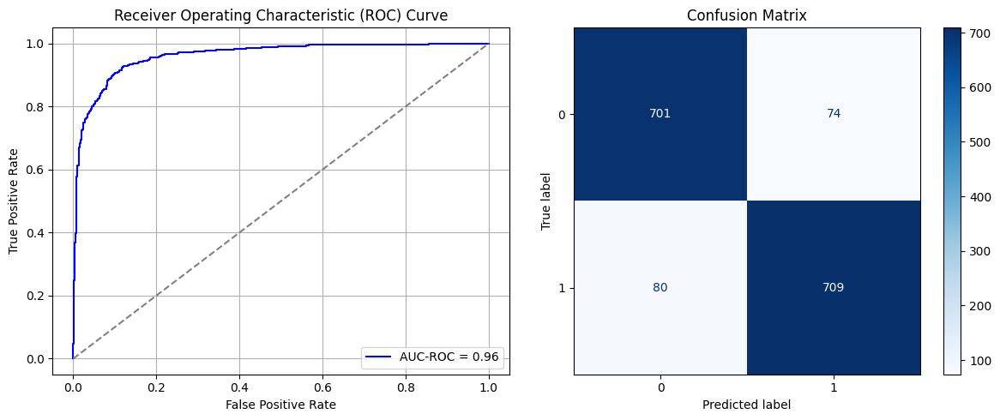

Best threshold based on F1-score: 0.4222869277000427
Time elapsed (performance): 13.923027837000063


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_64"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_448 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_449 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_450 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_451 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_452 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_453 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_454 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.6379 - loss: 0.9009 - val_AUC: 0.0000e+00 - val_loss: 1.0704
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.6483 - loss: 0.6694 - val_AUC: 0.0000e+00 - val_loss: 0.9007
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6493 - loss: 0.6304 - val_AUC: 0.0000e+00 - val_loss: 0.8659
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6611 - loss: 0.6139 - val_AUC: 0.0000e+00 - val_loss: 0.9366
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6459 - loss: 0.6266 - val_AUC: 0.0000e+00 - val_loss: 0.9140
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6606 - loss: 0.6241 - val_AUC: 0.0000e+00 - val_loss: 0.8426
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6716 - loss: 0.6177 - val_AUC: 0.0000e+00 - val_loss: 0.8888
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6590 - loss: 0.6211 - val_AUC: 0.0000e+00 - val_loss: 0.9185
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_65"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_455 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_456 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_457 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_458 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_459 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_460 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_461 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - AUC: 0.6597 - loss: 0.8079 - val_AUC: 0.0000e+00 - val_loss: 0.8725
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6450 - loss: 0.6581 - val_AUC: 0.0000e+00 - val_loss: 0.8014
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6372 - loss: 0.6330 - val_AUC: 0.0000e+00 - val_loss: 0.9013
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6615 - loss: 0.6193 - val_AUC: 0.0000e+00 - val_loss: 0.9902
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6581 - loss: 0.6176 - val_AUC: 0.0000e+00 - val_loss: 0.8099
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6637 - loss: 0.6185 - val_AUC: 0.0000e+00 - val_loss: 0.8839
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6758 - loss: 0.6087 - val_AUC: 0.0000e+00 - val_loss: 0.9137
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6658 - loss: 0.6091 - val_AUC: 0.0000e+00 - val_loss: 1.0082
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_66"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_462 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_463 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_464 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_465 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_466 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_467 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_468 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step - AUC: 0.6658 - loss: 0.8058 - val_AUC: 0.0000e+00 - val_loss: 1.0222
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6701 - loss: 0.6270 - val_AUC: 0.0000e+00 - val_loss: 0.8147
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6759 - loss: 0.6130 - val_AUC: 0.0000e+00 - val_loss: 0.7723
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6446 - loss: 0.6189 - val_AUC: 0.0000e+00 - val_loss: 0.8354
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6539 - loss: 0.6240 - val_AUC: 0.0000e+00 - val_loss: 0.9372
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6589 - loss: 0.6250 - val_AUC: 0.0000e+00 - val_loss: 0.9248
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6628 - loss: 0.6108 - val_AUC: 0.0000e+00 - val_loss: 0.9492
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6562 - loss: 0.6295 - val_AUC: 0.0000e+00 - val_loss: 0.9121
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_67"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_469 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_470 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_471 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_472 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_473 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_474 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_475 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - AUC: 0.6223 - loss: 0.9007 - val_AUC: 0.0000e+00 - val_loss: 1.0671
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6568 - loss: 0.6420 - val_AUC: 0.0000e+00 - val_loss: 0.8984
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6473 - loss: 0.6328 - val_AUC: 0.0000e+00 - val_loss: 0.8487
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6848 - loss: 0.6055 - val_AUC: 0.0000e+00 - val_loss: 0.9090
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6528 - loss: 0.6208 - val_AUC: 0.0000e+00 - val_loss: 0.8842
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6868 - loss: 0.6029 - val_AUC: 0.0000e+00 - val_loss: 0.8595
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6801 - loss: 0.6100 - val_AUC: 0.0000e+00 - val_loss: 0.9192
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6820 - loss: 0.6094 - val_AUC: 0.0000e+00 - val_loss: 1.0158
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_68"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_476 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_477 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_478 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_479 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_480 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_481 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_482 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.6442 - loss: 0.8746 - val_AUC: 0.0000e+00 - val_loss: 0.9165
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.6705 - loss: 0.6449 - val_AUC: 0.0000e+00 - val_loss: 0.9777
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6414 - loss: 0.6347 - val_AUC: 0.0000e+00 - val_loss: 0.8499
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6736 - loss: 0.6120 - val_AUC: 0.0000e+00 - val_loss: 0.9205
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6750 - loss: 0.6152 - val_AUC: 0.0000e+00 - val_loss: 0.9681
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6808 - loss: 0.6018 - val_AUC: 0.0000e+00 - val_loss: 0.8670
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6674 - loss: 0.6065 - val_AUC: 0.0000e+00 - val_loss: 0.8194
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6694 - loss: 0.6141 - val_AUC: 0.0000e+00 - val_loss: 0.8634
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_69"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_483 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_484 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_485 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_486 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_487 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_488 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_489 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.6640 - loss: 0.8321 - val_AUC: 0.0000e+00 - val_loss: 0.9680
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.6363 - loss: 0.6516 - val_AUC: 0.0000e+00 - val_loss: 0.8846
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6609 - loss: 0.6230 - val_AUC: 0.0000e+00 - val_loss: 0.8493
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6603 - loss: 0.6201 - val_AUC: 0.0000e+00 - val_loss: 1.0037
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6562 - loss: 0.6193 - val_AUC: 0.0000e+00 - val_loss: 0.8610
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6646 - loss: 0.6228 - val_AUC: 0.0000e+00 - val_loss: 0.9543
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6603 - loss: 0.6202 - val_AUC: 0.0000e+00 - val_loss: 0.9545
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6652 - loss: 0.6071 - val_AUC: 0.0000e+00 - val_loss: 0.8382
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_70"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_490 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_491 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_492 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_493 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_494 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_495 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_496 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.6225 - loss: 0.9098 - val_AUC: 0.0000e+00 - val_loss: 0.9017
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6553 - loss: 0.6554 - val_AUC: 0.0000e+00 - val_loss: 0.8966
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6513 - loss: 0.6237 - val_AUC: 0.0000e+00 - val_loss: 0.9057
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6315 - loss: 0.6359 - val_AUC: 0.0000e+00 - val_loss: 0.8236
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6546 - loss: 0.6245 - val_AUC: 0.0000e+00 - val_loss: 0.8695
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6487 - loss: 0.6254 - val_AUC: 0.0000e+00 - val_loss: 0.8345
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6830 - loss: 0.6107 - val_AUC: 0.0000e+00 - val_loss: 0.7705
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6748 - loss: 0.6232 - val_AUC: 0.0000e+00 - val_loss: 0.9138
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_71"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_497 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_498 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_499 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_500 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_501 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_502 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_503 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - AUC: 0.6395 - loss: 0.8446 - val_AUC: 0.0000e+00 - val_loss: 0.9357
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6415 - loss: 0.6628 - val_AUC: 0.0000e+00 - val_loss: 0.8363
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6519 - loss: 0.6209 - val_AUC: 0.0000e+00 - val_loss: 0.7590
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6626 - loss: 0.6212 - val_AUC: 0.0000e+00 - val_loss: 0.8132
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6617 - loss: 0.6257 - val_AUC: 0.0000e+00 - val_loss: 1.0473
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6539 - loss: 0.6256 - val_AUC: 0.0000e+00 - val_loss: 0.8324
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6763 - loss: 0.6148 - val_AUC: 0.0000e+00 - val_loss: 0.8476
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6710 - loss: 0.6103 - val_AUC: 0.0000e+00 - val_loss: 0.8079
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_72"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_504 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_505 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_506 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_507 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_508 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_509 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_510 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.6572 - loss: 0.8468 - val_AUC: 0.0000e+00 - val_loss: 0.8616
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6640 - loss: 0.6420 - val_AUC: 0.0000e+00 - val_loss: 0.9203
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6692 - loss: 0.6083 - val_AUC: 0.0000e+00 - val_loss: 0.8505
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6602 - loss: 0.6150 - val_AUC: 0.0000e+00 - val_loss: 0.9312
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6492 - loss: 0.6197 - val_AUC: 0.0000e+00 - val_loss: 0.8343
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6572 - loss: 0.6252 - val_AUC: 0.0000e+00 - val_loss: 0.9408
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6657 - loss: 0.6173 - val_AUC: 0.0000e+00 - val_loss: 0.9003
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6717 - loss: 0.6176 - val_AUC: 0.0000e+00 - val_loss: 0.9353
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_73"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_511 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_512 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_513 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_514 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_515 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_516 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_517 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - AUC: 0.6384 - loss: 0.8693 - val_AUC: 0.0000e+00 - val_loss: 1.0107
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.6468 - loss: 0.6470 - val_AUC: 0.0000e+00 - val_loss: 0.8481
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6489 - loss: 0.6336 - val_AUC: 0.0000e+00 - val_loss: 0.8978
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6583 - loss: 0.6202 - val_AUC: 0.0000e+00 - val_loss: 0.8255
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6590 - loss: 0.6201 - val_AUC: 0.0000e+00 - val_loss: 0.9363
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6513 - loss: 0.6219 - val_AUC: 0.0000e+00 - val_loss: 0.8772
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6420 - loss: 0.6300 - val_AUC: 0.0000e+00 - val_loss: 0.8408
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6729 - loss: 0.6168 - val_AUC: 0.0000e+00 - val_loss: 0.8488
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_74"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_518 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_519 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_520 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_521 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_522 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_523 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_524 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.6323 - loss: 0.9009 - val_AUC: 0.0000e+00 - val_loss: 1.0106
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6485 - loss: 0.6679 - val_AUC: 0.0000e+00 - val_loss: 0.9357
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6402 - loss: 0.6252 - val_AUC: 0.0000e+00 - val_loss: 0.7801
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6619 - loss: 0.6223 - val_AUC: 0.0000e+00 - val_loss: 0.9062
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6760 - loss: 0.6182 - val_AUC: 0.0000e+00 - val_loss: 0.9256
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6334 - loss: 0.6331 - val_AUC: 0.0000e+00 - val_loss: 0.8849
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6737 - loss: 0.6200 - val_AUC: 0.0000e+00 - val_loss: 0.9846
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6533 - loss: 0.6150 - val_AUC: 0.0000e+00 - val_loss: 0.8281
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_75"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_525 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_526 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_527 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_528 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_529 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_530 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_531 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 5s 43ms/step - AUC: 0.6396 - loss: 0.8507 - val_AUC: 0.0000e+00 - val_loss: 0.8995
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6650 - loss: 0.6315 - val_AUC: 0.0000e+00 - val_loss: 0.9249
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6531 - loss: 0.6236 - val_AUC: 0.0000e+00 - val_loss: 1.0228
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6773 - loss: 0.6051 - val_AUC: 0.0000e+00 - val_loss: 0.7714
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6551 - loss: 0.6158 - val_AUC: 0.0000e+00 - val_loss: 0.7341
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6493 - loss: 0.6295 - val_AUC: 0.0000e+00 - val_loss: 0.9062
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6690 - loss: 0.6220 - val_AUC: 0.0000e+00 - val_loss: 0.8867
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6658 - loss: 0.6188 - val_AUC: 0.0000e+00 - val_loss: 0.9187
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_76"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_532 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_533 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_534 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_535 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_536 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_537 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_538 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.6488 - loss: 0.8676 - val_AUC: 0.0000e+00 - val_loss: 0.9378
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6629 - loss: 0.6351 - val_AUC: 0.0000e+00 - val_loss: 0.9208
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6579 - loss: 0.6204 - val_AUC: 0.0000e+00 - val_loss: 0.8972
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6581 - loss: 0.6140 - val_AUC: 0.0000e+00 - val_loss: 0.8091
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6690 - loss: 0.6179 - val_AUC: 0.0000e+00 - val_loss: 0.8535
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.6618 - loss: 0.6204 - val_AUC: 0.0000e+00 - val_loss: 0.9725
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.6590 - loss: 0.6169 - val_AUC: 0.0000e+00 - val_loss: 1.0464
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6834 - loss: 0.6144 - val_AUC: 0.0000e+00 - val_loss: 0.9028
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_77"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_539 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_540 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_541 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_542 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_543 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_544 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_545 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - AUC: 0.6380 - loss: 0.8709 - val_AUC: 0.0000e+00 - val_loss: 0.9174
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6627 - loss: 0.6428 - val_AUC: 0.0000e+00 - val_loss: 0.8253
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6441 - loss: 0.6321 - val_AUC: 0.0000e+00 - val_loss: 0.9134
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6515 - loss: 0.6250 - val_AUC: 0.0000e+00 - val_loss: 0.9209
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6555 - loss: 0.6212 - val_AUC: 0.0000e+00 - val_loss: 0.8987
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6459 - loss: 0.6358 - val_AUC: 0.0000e+00 - val_loss: 0.8125
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6600 - loss: 0.6193 - val_AUC: 0.0000e+00 - val_loss: 0.8267
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6648 - loss: 0.6118 - val_AUC: 0.0000e+00 - val_loss: 0.9528
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_78"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_546 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_547 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_548 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_549 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_550 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_551 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_552 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - AUC: 0.6128 - loss: 0.9238 - val_AUC: 0.0000e+00 - val_loss: 0.9348
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.6252 - loss: 0.6740 - val_AUC: 0.0000e+00 - val_loss: 0.8343
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6674 - loss: 0.6200 - val_AUC: 0.0000e+00 - val_loss: 0.8949
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6446 - loss: 0.6268 - val_AUC: 0.0000e+00 - val_loss: 0.8987
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6658 - loss: 0.6124 - val_AUC: 0.0000e+00 - val_loss: 0.8819
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6791 - loss: 0.6096 - val_AUC: 0.0000e+00 - val_loss: 0.8842
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6766 - loss: 0.6104 - val_AUC: 0.0000e+00 - val_loss: 0.9673
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6816 - loss: 0.6109 - val_AUC: 0.0000e+00 - val_loss: 0.8401
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_79"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_553 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_554 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_555 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_556 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_557 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_558 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_559 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.6439 - loss: 0.8873 - val_AUC: 0.0000e+00 - val_loss: 0.8771
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.6574 - loss: 0.6416 - val_AUC: 0.0000e+00 - val_loss: 0.8504
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6541 - loss: 0.6192 - val_AUC: 0.0000e+00 - val_loss: 0.9660
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6276 - loss: 0.6356 - val_AUC: 0.0000e+00 - val_loss: 0.8098
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6615 - loss: 0.6275 - val_AUC: 0.0000e+00 - val_loss: 0.9184
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6466 - loss: 0.6205 - val_AUC: 0.0000e+00 - val_loss: 0.9113
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6857 - loss: 0.6073 - val_AUC: 0.0000e+00 - val_loss: 0.9408
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6675 - loss: 0.6143 - val_AUC: 0.0000e+00 - val_loss: 0.7590
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_80"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_560 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_561 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_562 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_563 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_564 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_565 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_566 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.6275 - loss: 0.8943 - val_AUC: 0.0000e+00 - val_loss: 0.8941
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.6509 - loss: 0.6501 - val_AUC: 0.0000e+00 - val_loss: 0.9013
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6659 - loss: 0.6232 - val_AUC: 0.0000e+00 - val_loss: 0.9903
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6800 - loss: 0.6090 - val_AUC: 0.0000e+00 - val_loss: 0.9221
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6505 - loss: 0.6219 - val_AUC: 0.0000e+00 - val_loss: 0.7947
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6361 - loss: 0.6332 - val_AUC: 0.0000e+00 - val_loss: 0.9683
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6838 - loss: 0.6036 - val_AUC: 0.0000e+00 - val_loss: 0.8990
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6804 - loss: 0.6093 - val_AUC: 0.0000e+00 - val_loss: 0.8334
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_81"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_567 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_568 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_569 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_570 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_571 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_572 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_573 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - AUC: 0.6456 - loss: 0.8722 - val_AUC: 0.0000e+00 - val_loss: 0.9967
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6304 - loss: 0.6747 - val_AUC: 0.0000e+00 - val_loss: 0.7365
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6345 - loss: 0.6341 - val_AUC: 0.0000e+00 - val_loss: 0.9010
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6717 - loss: 0.6155 - val_AUC: 0.0000e+00 - val_loss: 0.8284
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6674 - loss: 0.6165 - val_AUC: 0.0000e+00 - val_loss: 0.8205
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6819 - loss: 0.6040 - val_AUC: 0.0000e+00 - val_loss: 0.8760
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6822 - loss: 0.6043 - val_AUC: 0.0000e+00 - val_loss: 0.8614
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6583 - loss: 0.6042 - val_AUC: 0.0000e+00 - val_loss: 0.8615
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_82"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_574 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_575 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_576 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_577 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_578 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_579 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_580 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step - AUC: 0.6503 - loss: 0.8298 - val_AUC: 0.0000e+00 - val_loss: 0.8751
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.6601 - loss: 0.6622 - val_AUC: 0.0000e+00 - val_loss: 0.8442
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6582 - loss: 0.6270 - val_AUC: 0.0000e+00 - val_loss: 0.9548
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6576 - loss: 0.6285 - val_AUC: 0.0000e+00 - val_loss: 1.0647
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6681 - loss: 0.6068 - val_AUC: 0.0000e+00 - val_loss: 0.8539
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6524 - loss: 0.6254 - val_AUC: 0.0000e+00 - val_loss: 0.7147
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6667 - loss: 0.6240 - val_AUC: 0.0000e+00 - val_loss: 0.9638
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6784 - loss: 0.6100 - val_AUC: 0.0000e+00 - val_loss: 0.9649
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_83"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_581 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_582 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_583 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_584 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_585 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_586 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_587 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - AUC: 0.6310 - loss: 0.8711 - val_AUC: 0.0000e+00 - val_loss: 0.8831
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6478 - loss: 0.6572 - val_AUC: 0.0000e+00 - val_loss: 0.9021
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6721 - loss: 0.6146 - val_AUC: 0.0000e+00 - val_loss: 0.9864
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6603 - loss: 0.6199 - val_AUC: 0.0000e+00 - val_loss: 0.8422
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6624 - loss: 0.6186 - val_AUC: 0.0000e+00 - val_loss: 0.8309
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6636 - loss: 0.6160 - val_AUC: 0.0000e+00 - val_loss: 0.7621
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6466 - loss: 0.6308 - val_AUC: 0.0000e+00 - val_loss: 0.9781
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6864 - loss: 0.6040 - val_AUC: 0.0000e+00 - val_loss: 0.9671
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_84"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_588 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_589 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_590 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_591 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_592 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_593 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_594 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 6s 18ms/step - AUC: 0.6395 - loss: 0.6645 - val_AUC: 0.8120 - val_loss: 0.5459
Epoch 2/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8124 - loss: 0.5309 - val_AUC: 0.8982 - val_loss: 0.4734
Epoch 3/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8669 - loss: 0.4564 - val_AUC: 0.9135 - val_loss: 0.3837
Epoch 4/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9026 - loss: 0.3952 - val_AUC: 0.9274 - val_loss: 0.3861
Epoch 5/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9094 - loss: 0.3814 - val_AUC: 0.9407 - val_loss: 0.4044
Epoch 6/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9213 - loss: 0.3593 - val_AUC: 0.9456 - val_loss: 0.3119
Epoch 7/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9376 - loss: 0.3191 - val_AUC: 0.9454 - val_loss: 0.3024
Epoch 8/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.9410 - loss: 0.3095 - val_AUC: 0.9532 - val_loss: 0.2848
Epoch 9/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step -

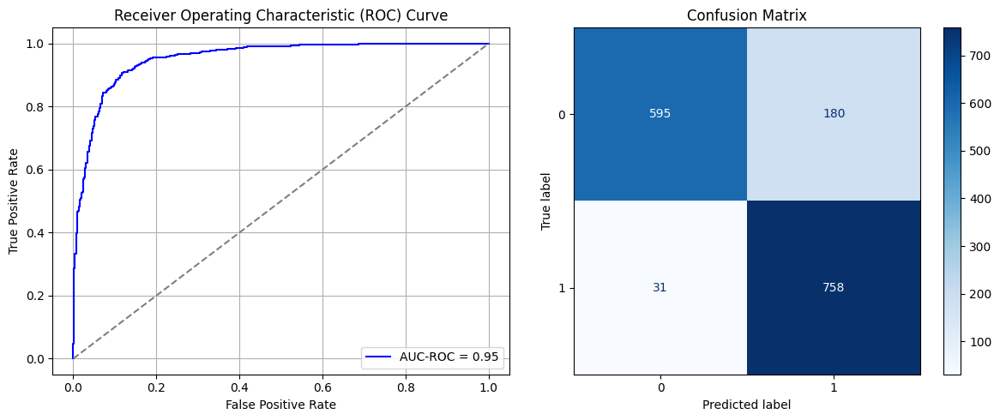

Best threshold based on F1-score: 0.7714971899986267
Time elapsed (performance): 17.452691016000017


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_85"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_595 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_596 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_597 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_598 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_599 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_600 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_601 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - AUC: 0.7048 - loss: 1.1143 - val_AUC: 0.0000e+00 - val_loss: 1.1693
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7111 - loss: 0.6646 - val_AUC: 0.0000e+00 - val_loss: 1.0641
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6919 - loss: 0.6387 - val_AUC: 0.0000e+00 - val_loss: 0.8353
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7057 - loss: 0.6108 - val_AUC: 0.0000e+00 - val_loss: 0.8341
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7218 - loss: 0.5945 - val_AUC: 0.0000e+00 - val_loss: 0.8895
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7264 - loss: 0.5897 - val_AUC: 0.0000e+00 - val_loss: 0.9467
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7083 - loss: 0.5992 - val_AUC: 0.0000e+00 - val_loss: 0.8377
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7163 - loss: 0.5800 - val_AUC: 0.0000e+00 - val_loss: 0.8229
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_86"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_602 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_603 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_604 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_605 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_606 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_607 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_608 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - AUC: 0.6950 - loss: 1.1283 - val_AUC: 0.0000e+00 - val_loss: 1.1162
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7147 - loss: 0.6666 - val_AUC: 0.0000e+00 - val_loss: 1.0590
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6978 - loss: 0.6255 - val_AUC: 0.0000e+00 - val_loss: 0.8986
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6903 - loss: 0.6192 - val_AUC: 0.0000e+00 - val_loss: 0.9106
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7051 - loss: 0.6033 - val_AUC: 0.0000e+00 - val_loss: 0.9424
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7101 - loss: 0.5935 - val_AUC: 0.0000e+00 - val_loss: 0.8740
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7293 - loss: 0.5727 - val_AUC: 0.0000e+00 - val_loss: 0.8473
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7142 - loss: 0.5936 - val_AUC: 0.0000e+00 - val_loss: 0.7933
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_87"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_609 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_610 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_611 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_612 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_613 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_614 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_615 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - AUC: 0.6881 - loss: 1.1019 - val_AUC: 0.0000e+00 - val_loss: 1.2537
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7083 - loss: 0.6538 - val_AUC: 0.0000e+00 - val_loss: 0.9320
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7186 - loss: 0.6076 - val_AUC: 0.0000e+00 - val_loss: 0.8792
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7091 - loss: 0.6017 - val_AUC: 0.0000e+00 - val_loss: 0.8542
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7163 - loss: 0.5949 - val_AUC: 0.0000e+00 - val_loss: 0.8861
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7195 - loss: 0.5928 - val_AUC: 0.0000e+00 - val_loss: 0.9772
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7069 - loss: 0.5995 - val_AUC: 0.0000e+00 - val_loss: 0.8336
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6961 - loss: 0.5936 - val_AUC: 0.0000e+00 - val_loss: 0.8541
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_88"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_616 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_617 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_618 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_619 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_620 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_621 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_622 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.6912 - loss: 1.1108 - val_AUC: 0.0000e+00 - val_loss: 1.2016
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.6929 - loss: 0.6849 - val_AUC: 0.0000e+00 - val_loss: 0.9694
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7347 - loss: 0.5950 - val_AUC: 0.0000e+00 - val_loss: 0.9276
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7102 - loss: 0.6021 - val_AUC: 0.0000e+00 - val_loss: 0.8582
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7026 - loss: 0.6036 - val_AUC: 0.0000e+00 - val_loss: 0.9161
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7129 - loss: 0.6067 - val_AUC: 0.0000e+00 - val_loss: 0.9802
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7169 - loss: 0.5875 - val_AUC: 0.0000e+00 - val_loss: 0.7829
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7153 - loss: 0.5860 - val_AUC: 0.0000e+00 - val_loss: 0.8750
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_89"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_623 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_624 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_625 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_626 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_627 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_628 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_629 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - AUC: 0.6888 - loss: 1.0811 - val_AUC: 0.0000e+00 - val_loss: 1.1661
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6960 - loss: 0.6815 - val_AUC: 0.0000e+00 - val_loss: 0.9449
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7055 - loss: 0.6245 - val_AUC: 0.0000e+00 - val_loss: 0.8627
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7233 - loss: 0.5939 - val_AUC: 0.0000e+00 - val_loss: 0.8957
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7183 - loss: 0.5876 - val_AUC: 0.0000e+00 - val_loss: 0.8629
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7059 - loss: 0.6029 - val_AUC: 0.0000e+00 - val_loss: 0.9055
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7020 - loss: 0.6043 - val_AUC: 0.0000e+00 - val_loss: 0.9135
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7194 - loss: 0.5863 - val_AUC: 0.0000e+00 - val_loss: 0.8371
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_90"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_630 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_631 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_632 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_633 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_634 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_635 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_636 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - AUC: 0.6610 - loss: 1.1749 - val_AUC: 0.0000e+00 - val_loss: 1.1598
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6987 - loss: 0.6795 - val_AUC: 0.0000e+00 - val_loss: 1.0316
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7306 - loss: 0.5854 - val_AUC: 0.0000e+00 - val_loss: 0.8538
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7310 - loss: 0.5894 - val_AUC: 0.0000e+00 - val_loss: 0.9240
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7183 - loss: 0.5973 - val_AUC: 0.0000e+00 - val_loss: 0.8449
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7330 - loss: 0.5767 - val_AUC: 0.0000e+00 - val_loss: 0.9234
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7177 - loss: 0.5837 - val_AUC: 0.0000e+00 - val_loss: 0.8736
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7122 - loss: 0.5959 - val_AUC: 0.0000e+00 - val_loss: 0.8858
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_91"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_637 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_638 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_639 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_640 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_641 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_642 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_643 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - AUC: 0.6810 - loss: 1.1345 - val_AUC: 0.0000e+00 - val_loss: 1.1608
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.6948 - loss: 0.6933 - val_AUC: 0.0000e+00 - val_loss: 0.9838
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7263 - loss: 0.6037 - val_AUC: 0.0000e+00 - val_loss: 0.9259
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7002 - loss: 0.6030 - val_AUC: 0.0000e+00 - val_loss: 0.8985
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7330 - loss: 0.5798 - val_AUC: 0.0000e+00 - val_loss: 0.9232
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7148 - loss: 0.5929 - val_AUC: 0.0000e+00 - val_loss: 0.8890
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7117 - loss: 0.6020 - val_AUC: 0.0000e+00 - val_loss: 0.8876
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7139 - loss: 0.5893 - val_AUC: 0.0000e+00 - val_loss: 0.9404
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_92"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_644 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_645 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_646 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_647 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_648 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_649 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_650 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - AUC: 0.6958 - loss: 1.0647 - val_AUC: 0.0000e+00 - val_loss: 1.2979
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7117 - loss: 0.6488 - val_AUC: 0.0000e+00 - val_loss: 0.9313
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7017 - loss: 0.6249 - val_AUC: 0.0000e+00 - val_loss: 0.9402
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7147 - loss: 0.5963 - val_AUC: 0.0000e+00 - val_loss: 0.8844
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7084 - loss: 0.5995 - val_AUC: 0.0000e+00 - val_loss: 0.9513
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7231 - loss: 0.5813 - val_AUC: 0.0000e+00 - val_loss: 0.8071
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7096 - loss: 0.5925 - val_AUC: 0.0000e+00 - val_loss: 0.8530
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7256 - loss: 0.5891 - val_AUC: 0.0000e+00 - val_loss: 0.9224
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_93"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_651 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_652 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_653 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_654 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_655 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_656 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_657 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - AUC: 0.6817 - loss: 1.0964 - val_AUC: 0.0000e+00 - val_loss: 1.1934
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7030 - loss: 0.6823 - val_AUC: 0.0000e+00 - val_loss: 0.9595
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7183 - loss: 0.6056 - val_AUC: 0.0000e+00 - val_loss: 0.9449
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7082 - loss: 0.5903 - val_AUC: 0.0000e+00 - val_loss: 0.8764
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7068 - loss: 0.6024 - val_AUC: 0.0000e+00 - val_loss: 0.9330
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7123 - loss: 0.5954 - val_AUC: 0.0000e+00 - val_loss: 0.9143
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7040 - loss: 0.6048 - val_AUC: 0.0000e+00 - val_loss: 0.8151
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7204 - loss: 0.5754 - val_AUC: 0.0000e+00 - val_loss: 0.8028
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_94"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_658 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_659 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_660 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_661 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_662 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_663 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_664 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - AUC: 0.6819 - loss: 1.1144 - val_AUC: 0.0000e+00 - val_loss: 1.3242
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6857 - loss: 0.6939 - val_AUC: 0.0000e+00 - val_loss: 0.9087
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7021 - loss: 0.6134 - val_AUC: 0.0000e+00 - val_loss: 0.9094
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7265 - loss: 0.5890 - val_AUC: 0.0000e+00 - val_loss: 0.8463
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7270 - loss: 0.5879 - val_AUC: 0.0000e+00 - val_loss: 0.8683
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7155 - loss: 0.5910 - val_AUC: 0.0000e+00 - val_loss: 0.9213
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7196 - loss: 0.5761 - val_AUC: 0.0000e+00 - val_loss: 0.7627
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7214 - loss: 0.5839 - val_AUC: 0.0000e+00 - val_loss: 0.8058
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_95"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_665 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_666 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_667 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_668 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_669 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_670 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_671 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - AUC: 0.6943 - loss: 1.0549 - val_AUC: 0.0000e+00 - val_loss: 1.2088
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7077 - loss: 0.6582 - val_AUC: 0.0000e+00 - val_loss: 1.0233
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7332 - loss: 0.5829 - val_AUC: 0.0000e+00 - val_loss: 0.8371
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7418 - loss: 0.5815 - val_AUC: 0.0000e+00 - val_loss: 0.9163
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7090 - loss: 0.5941 - val_AUC: 0.0000e+00 - val_loss: 0.8408
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7142 - loss: 0.5893 - val_AUC: 0.0000e+00 - val_loss: 0.9209
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7078 - loss: 0.5889 - val_AUC: 0.0000e+00 - val_loss: 0.8306
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7131 - loss: 0.5915 - val_AUC: 0.0000e+00 - val_loss: 0.8443
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_96"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_672 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_673 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_674 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_675 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_676 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_677 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_678 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.6916 - loss: 1.1407 - val_AUC: 0.0000e+00 - val_loss: 1.1728
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6946 - loss: 0.6739 - val_AUC: 0.0000e+00 - val_loss: 0.9834
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6960 - loss: 0.6292 - val_AUC: 0.0000e+00 - val_loss: 0.8822
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7190 - loss: 0.5905 - val_AUC: 0.0000e+00 - val_loss: 0.8682
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7041 - loss: 0.6049 - val_AUC: 0.0000e+00 - val_loss: 1.0233
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7230 - loss: 0.5930 - val_AUC: 0.0000e+00 - val_loss: 0.9507
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7190 - loss: 0.5846 - val_AUC: 0.0000e+00 - val_loss: 0.8456
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7199 - loss: 0.5932 - val_AUC: 0.0000e+00 - val_loss: 0.8431
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_97"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_679 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_680 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_681 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_682 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_683 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_684 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_685 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - AUC: 0.6981 - loss: 1.1174 - val_AUC: 0.0000e+00 - val_loss: 1.2332
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7018 - loss: 0.6802 - val_AUC: 0.0000e+00 - val_loss: 0.9839
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7028 - loss: 0.6262 - val_AUC: 0.0000e+00 - val_loss: 0.8410
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7081 - loss: 0.6020 - val_AUC: 0.0000e+00 - val_loss: 0.8953
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7271 - loss: 0.5870 - val_AUC: 0.0000e+00 - val_loss: 0.9147
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7050 - loss: 0.5930 - val_AUC: 0.0000e+00 - val_loss: 0.8439
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7135 - loss: 0.5952 - val_AUC: 0.0000e+00 - val_loss: 0.8886
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7008 - loss: 0.6034 - val_AUC: 0.0000e+00 - val_loss: 0.8116
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_98"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_686 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_687 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_688 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_689 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_690 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_691 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_692 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - AUC: 0.6991 - loss: 1.0580 - val_AUC: 0.0000e+00 - val_loss: 1.2241
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6960 - loss: 0.6831 - val_AUC: 0.0000e+00 - val_loss: 0.8681
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6985 - loss: 0.6210 - val_AUC: 0.0000e+00 - val_loss: 0.8730
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7189 - loss: 0.5992 - val_AUC: 0.0000e+00 - val_loss: 1.0027
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7162 - loss: 0.5949 - val_AUC: 0.0000e+00 - val_loss: 0.8564
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7078 - loss: 0.6015 - val_AUC: 0.0000e+00 - val_loss: 0.9066
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7171 - loss: 0.5937 - val_AUC: 0.0000e+00 - val_loss: 0.8761
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7093 - loss: 0.5972 - val_AUC: 0.0000e+00 - val_loss: 0.8583
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_99"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_693 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_694 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_695 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_696 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_697 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_698 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_699 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 5s 41ms/step - AUC: 0.7029 - loss: 1.0808 - val_AUC: 0.0000e+00 - val_loss: 1.2389
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6998 - loss: 0.6815 - val_AUC: 0.0000e+00 - val_loss: 1.0024
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7033 - loss: 0.6160 - val_AUC: 0.0000e+00 - val_loss: 0.9752
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7190 - loss: 0.5973 - val_AUC: 0.0000e+00 - val_loss: 0.9302
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7076 - loss: 0.5983 - val_AUC: 0.0000e+00 - val_loss: 0.8303
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7223 - loss: 0.5967 - val_AUC: 0.0000e+00 - val_loss: 0.9699
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7032 - loss: 0.5913 - val_AUC: 0.0000e+00 - val_loss: 0.9805
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7037 - loss: 0.6080 - val_AUC: 0.0000e+00 - val_loss: 1.0263
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_100"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_700 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_701 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_702 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_703 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_704 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_705 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_706 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - AUC: 0.6805 - loss: 1.1392 - val_AUC: 0.0000e+00 - val_loss: 1.1946
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.6929 - loss: 0.6969 - val_AUC: 0.0000e+00 - val_loss: 0.9624
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7022 - loss: 0.6210 - val_AUC: 0.0000e+00 - val_loss: 0.9353
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7216 - loss: 0.5816 - val_AUC: 0.0000e+00 - val_loss: 0.8074
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7138 - loss: 0.5998 - val_AUC: 0.0000e+00 - val_loss: 0.8778
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6804 - loss: 0.6129 - val_AUC: 0.0000e+00 - val_loss: 0.9530
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7173 - loss: 0.5906 - val_AUC: 0.0000e+00 - val_loss: 0.8304
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7152 - loss: 0.5834 - val_AUC: 0.0000e+00 - val_loss: 0.8112
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_101"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_707 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_708 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_709 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_710 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_711 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_712 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_713 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - AUC: 0.6866 - loss: 1.1165 - val_AUC: 0.0000e+00 - val_loss: 1.2666
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7055 - loss: 0.6775 - val_AUC: 0.0000e+00 - val_loss: 1.0645
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7030 - loss: 0.6112 - val_AUC: 0.0000e+00 - val_loss: 0.9227
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7175 - loss: 0.5912 - val_AUC: 0.0000e+00 - val_loss: 0.8167
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7115 - loss: 0.5971 - val_AUC: 0.0000e+00 - val_loss: 0.9936
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6909 - loss: 0.6093 - val_AUC: 0.0000e+00 - val_loss: 0.8053
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.6919 - loss: 0.5995 - val_AUC: 0.0000e+00 - val_loss: 0.9890
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7066 - loss: 0.6010 - val_AUC: 0.0000e+00 - val_loss: 0.6950
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_102"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_714 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_715 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_716 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_717 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_718 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_719 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_720 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - AUC: 0.6749 - loss: 1.1185 - val_AUC: 0.0000e+00 - val_loss: 1.3072
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7084 - loss: 0.6718 - val_AUC: 0.0000e+00 - val_loss: 1.0046
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7158 - loss: 0.6132 - val_AUC: 0.0000e+00 - val_loss: 0.9347
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7126 - loss: 0.5953 - val_AUC: 0.0000e+00 - val_loss: 0.9432
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7155 - loss: 0.5956 - val_AUC: 0.0000e+00 - val_loss: 0.8748
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7120 - loss: 0.5936 - val_AUC: 0.0000e+00 - val_loss: 0.9203
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7212 - loss: 0.5842 - val_AUC: 0.0000e+00 - val_loss: 0.8467
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7096 - loss: 0.5993 - val_AUC: 0.0000e+00 - val_loss: 0.9672
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_103"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_721 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_722 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_723 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_724 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_725 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_726 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_727 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 5s 41ms/step - AUC: 0.6899 - loss: 1.1326 - val_AUC: 0.0000e+00 - val_loss: 1.2364
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7028 - loss: 0.6858 - val_AUC: 0.0000e+00 - val_loss: 0.9846
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7230 - loss: 0.6023 - val_AUC: 0.0000e+00 - val_loss: 0.9008
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7056 - loss: 0.6015 - val_AUC: 0.0000e+00 - val_loss: 0.8766
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7121 - loss: 0.5962 - val_AUC: 0.0000e+00 - val_loss: 0.7992
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7314 - loss: 0.5794 - val_AUC: 0.0000e+00 - val_loss: 0.7999
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7168 - loss: 0.5880 - val_AUC: 0.0000e+00 - val_loss: 0.8147
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7208 - loss: 0.5812 - val_AUC: 0.0000e+00 - val_loss: 0.8525
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_104"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_728 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_729 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_730 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_731 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_732 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_733 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_734 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - AUC: 0.6792 - loss: 1.1645 - val_AUC: 0.0000e+00 - val_loss: 1.2015
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7070 - loss: 0.6740 - val_AUC: 0.0000e+00 - val_loss: 1.0572
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6993 - loss: 0.6219 - val_AUC: 0.0000e+00 - val_loss: 1.0148
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7092 - loss: 0.6065 - val_AUC: 0.0000e+00 - val_loss: 0.9126
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7124 - loss: 0.5937 - val_AUC: 0.0000e+00 - val_loss: 0.7789
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7167 - loss: 0.5975 - val_AUC: 0.0000e+00 - val_loss: 0.8303
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7181 - loss: 0.5900 - val_AUC: 0.0000e+00 - val_loss: 0.9707
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7244 - loss: 0.5828 - val_AUC: 0.0000e+00 - val_loss: 0.8832
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step 

In [38]:
times_train = 5
times_fine_tune = 20

FPR = []
FNR = []

for i in range(times_train):
  model_source_SRS = create_dnn_model(X_S_train.shape[1])
  train_and_evaluate(model_source_SRS, X_S_train, X_S_test, y_S_train, y_S_test, "Source")
  for j in range(times_fine_tune):
    fpr, fnr = fine_tuning(X_T_train_SRS, X_T_test, y_T_train_SRS, y_T_test, 0, 4)
    # print(output)
    FPR.append(fpr)
    FNR.append(fnr)

ParamFit = pd.DataFrame([FPR, FNR]).T
ParamFit.columns=['FPR', 'FNR']


# fine_tuning(X_T_train_SRS, X_T_test, y_T_train_SRS, y_T_test, 0, 4)

In [39]:
print('Mean:', ParamFit['FNR'].mean())
print('Var:', ParamFit['FNR'].var())

Mean: 0.563840830449827
Var: 0.004103576926579524


In [40]:
print(ParamFit)
ParamFit.to_csv('SRS_Fine_Tuning.csv')

         FPR       FNR
0   0.141087  0.522491
1   0.144900  0.519031
2   0.148713  0.515571
3   0.114395  0.591696
4   0.125834  0.564014
..       ...       ...
95  0.105815  0.553633
96  0.160153  0.487889
97  0.091516  0.581315
98  0.095329  0.577855
99  0.154433  0.498270

[100 rows x 2 columns]


## Simple Random Sampling with Replacement:

In [41]:
data_S_full

,0,1,2,3,4,5,6,7,8,9,...,11,12,13,14,15,16,17,18,19,Y2
0,1.0,1.0,1.0,0.0,1.0,0.5,0.5,0.5,0.666667,0.666667,...,0.50,0.583333,0.476190,0.409091,0.380952,0.50,0.523810,0.541667,0.545455,0
1,1.0,1.0,1.0,1.0,0.0,0.5,0.5,0.5,0.666667,0.333333,...,0.45,0.541667,0.476190,0.500000,0.523810,0.40,0.571429,0.625000,0.454545,0
2,1.0,1.0,1.0,1.0,1.0,0.5,0.5,0.5,0.666667,0.666667,...,0.55,0.583333,0.619048,0.681818,0.571429,0.45,0.333333,0.416667,0.545455,0
3,1.0,1.0,1.0,1.0,1.0,0.5,0.5,0.5,0.666667,0.666667,...,0.30,0.375000,0.523810,0.318182,0.619048,0.25,0.571429,0.541667,0.500000,0
4,1.0,1.0,0.0,1.0,1.0,0.5,0.5,0.5,0.333333,0.333333,...,0.50,0.500000,0.619048,0.500000,0.619048,0.55,0.476190,0.500000,0.454545,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23305,1.0,1.0,0.0,0.0,1.0,0.5,0.5,0.5,0.333333,0.666667,...,0.75,0.625000,0.619048,0.454545,0.523810,0.60,0.333333,0.541667,0.318182,1
23306,1.0,1.0,1.0,0.0,0.0,0.5,0.5,0.5,0.666667,0.333333,...,0.50,0.500000,0.476190,0.500000,0.523810,0.50,0.619048,0.541667,0.500000,1
23307,1.0,1.0,1.0,0.0,1.0,0.5,0.5,0.5,1.000000,0.666667,...,0.55,0.500000,0.666667,0.500000,0.714286,0.60,0.619048,0.375000,0.681818,1
23308,1.0,1.0,0.0,1.0,1.0,0.5,0.5,0.5,0.666667,0.333333,...,0.50,0.750000,0.428571,0.590909,0.619048,0.35,0.619048,0.416667,0.409091,1


In [42]:
data_T_full

,0,1,2,3,4,5,6,7,8,9,...,11,12,13,14,15,16,17,18,19,Y
0,0.0,1.0,1.0,0.0,1.0,0.5,0.5,0.5,0.666667,0.666667,...,0.35,0.458333,0.523810,0.500000,0.523810,0.45,0.428571,0.458333,0.454545,0
1,0.0,1.0,1.0,1.0,0.0,0.0,0.5,0.5,0.666667,0.000000,...,0.15,0.666667,0.333333,0.454545,0.476190,0.30,0.571429,0.708333,0.590909,0
2,0.0,1.0,1.0,0.0,1.0,0.5,0.5,0.5,0.666667,0.666667,...,0.75,0.583333,0.476190,0.454545,0.476190,0.70,0.571429,0.291667,0.727273,0
3,0.0,1.0,1.0,1.0,1.0,0.5,0.5,0.5,0.666667,0.000000,...,0.35,0.625000,0.523810,0.454545,0.619048,0.45,0.523810,0.833333,0.500000,0
4,0.0,1.0,0.0,0.0,1.0,0.5,0.5,0.5,0.666667,0.333333,...,0.65,0.416667,0.666667,0.636364,0.619048,0.65,0.333333,0.541667,0.409091,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6685,0.0,0.0,1.0,1.0,1.0,0.5,0.5,0.5,0.666667,1.000000,...,0.50,0.500000,0.571429,0.545455,0.619048,0.45,0.571429,0.375000,0.500000,1
6686,0.0,1.0,0.0,1.0,1.0,0.5,0.5,0.0,0.666667,1.000000,...,0.50,0.458333,0.523810,0.500000,0.476190,0.30,0.476190,0.333333,0.681818,1
6687,0.0,1.0,0.0,0.0,1.0,0.5,0.5,0.5,0.666667,0.666667,...,0.60,0.416667,0.523810,0.500000,0.619048,0.40,0.523810,0.458333,0.363636,1
6688,0.0,1.0,1.0,1.0,0.0,0.5,0.5,0.5,0.666667,0.666667,...,0.55,0.375000,0.571429,0.318182,0.523810,0.45,0.619048,0.541667,0.363636,1


In [43]:
X_S_SRSwR, y_S_SRSwR = SRSwR_undersampler(data_S_full, data_S_full.iloc[:,-1])
print(X_S_SRSwR)

3910
19400
         0    1    2    3    4    5    6    7         8         9        10  \
15725  1.0  0.0  0.0  1.0  1.0  0.5  0.5  0.5  0.666667  0.666667  0.500000   
17730  1.0  0.0  1.0  0.0  0.0  0.5  0.5  0.5  0.333333  0.666667  0.454545   
15377  1.0  1.0  0.0  0.0  1.0  0.5  0.5  0.5  0.666667  0.666667  0.500000   
7763   1.0  0.0  0.0  1.0  1.0  0.5  1.0  0.5  0.666667  0.333333  0.500000   
13435  1.0  1.0  1.0  0.0  0.0  0.5  0.5  0.5  0.666667  1.000000  0.590909   
...    ...  ...  ...  ...  ...  ...  ...  ...       ...       ...       ...   
23305  1.0  1.0  0.0  0.0  1.0  0.5  0.5  0.5  0.333333  0.666667  0.727273   
23306  1.0  1.0  1.0  0.0  0.0  0.5  0.5  0.5  0.666667  0.333333  0.363636   
23307  1.0  1.0  1.0  0.0  1.0  0.5  0.5  0.5  1.000000  0.666667  0.454545   
23308  1.0  1.0  0.0  1.0  1.0  0.5  0.5  0.5  0.666667  0.333333  0.454545   
23309  1.0  0.0  1.0  1.0  0.0  0.5  0.5  0.5  0.666667  0.666667  0.454545   

         11        12        13        1

In [44]:
X_S_train, X_S_test, y_S_train, y_S_test = train_test_split(X_S_SRSwR, y_S_SRSwR, test_size=0.20, random_state=0)
X_T_train, X_T_test, y_T_train, y_T_test = train_test_split(data_T_X, data_T_y, test_size=0.20, random_state=0)
T_train = pd.concat([X_T_train, y_T_train], axis=1)

X_T_train_SRSwR, y_T_train_SRSwR = SRSwR_undersampler(T_train, T_train.iloc[:,-1])
print(y_T_train_SRSwR)

1262
4090
1006    0
5533    0
3134    0
3514    0
423     0
       ..
6216    1
6458    1
3468    1
5874    1
5827    1
Name: Y, Length: 2524, dtype: int64


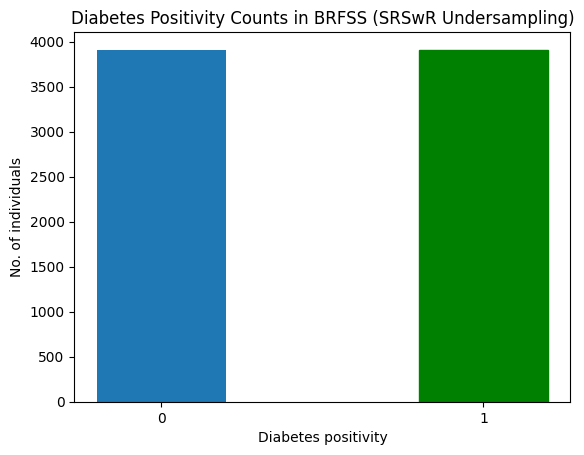

In [45]:
barlist = plt.bar([str(0),str(1)], y_S_SRSwR.value_counts(), width = 0.4)
barlist[1].set_color('g')

plt.xlabel("Diabetes positivity")
plt.ylabel("No. of individuals")
plt.title("Diabetes Positivity Counts in BRFSS (SRSwR Undersampling)")
plt.show()

In [46]:
print('X_S_train:',np.shape(X_S_train))
print('y_S_train:',np.shape(y_S_train))
print('X_S_test:',np.shape(X_S_test))
print('y_S_test:',np.shape(y_S_test))

X_S_train: (6256, 20)
y_S_train: (6256,)
X_S_test: (1564, 20)
y_S_test: (1564,)


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_105"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_735 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_736 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_737 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_738 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_739 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_740 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_741 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - AUC: 0.6698 - loss: 0.6501 - val_AUC: 0.8136 - val_loss: 0.5463
Epoch 2/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.8180 - loss: 0.5245 - val_AUC: 0.8763 - val_loss: 0.4659
Epoch 3/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.8629 - loss: 0.4613 - val_AUC: 0.8959 - val_loss: 0.4189
Epoch 4/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9007 - loss: 0.3987 - val_AUC: 0.9172 - val_loss: 0.3879
Epoch 5/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9131 - loss: 0.3752 - val_AUC: 0.9315 - val_loss: 0.3465
Epoch 6/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.9224 - loss: 0.3550 - val_AUC: 0.9357 - val_loss: 0.3320
Epoch 7/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.9289 - loss: 0.3399 - val_AUC: 0.9416 - val_loss: 0.3117
Epoch 8/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9328 - loss: 0.3307 - val_AUC: 0.9448 - val_loss: 0.3100
Epoch 9/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step -

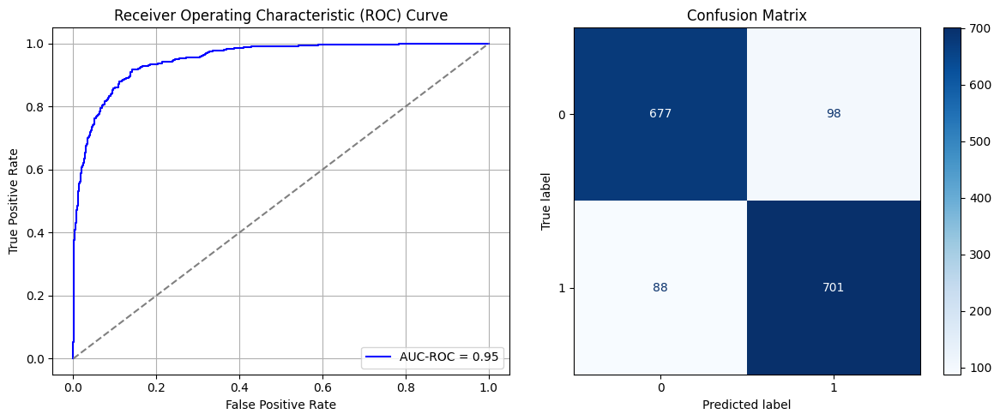

Best threshold based on F1-score: 0.4262133836746216
Time elapsed (performance): 12.649059639000143


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_106"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_742 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_743 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_744 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_745 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_746 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_747 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_748 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - AUC: 0.7340 - loss: 0.7960 - val_AUC: 0.0000e+00 - val_loss: 0.8723
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7295 - loss: 0.5949 - val_AUC: 0.0000e+00 - val_loss: 0.7827
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7267 - loss: 0.5769 - val_AUC: 0.0000e+00 - val_loss: 0.7576
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7509 - loss: 0.5612 - val_AUC: 0.0000e+00 - val_loss: 0.9000
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7333 - loss: 0.5787 - val_AUC: 0.0000e+00 - val_loss: 0.7905
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7319 - loss: 0.5702 - val_AUC: 0.0000e+00 - val_loss: 0.7712
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7289 - loss: 0.5692 - val_AUC: 0.0000e+00 - val_loss: 0.8068
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7573 - loss: 0.5507 - val_AUC: 0.0000e+00 - val_loss: 0.7152
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_107"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_749 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_750 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_751 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_752 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_753 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_754 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_755 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7138 - loss: 0.8829 - val_AUC: 0.0000e+00 - val_loss: 0.9825
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7313 - loss: 0.6195 - val_AUC: 0.0000e+00 - val_loss: 0.9362
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7237 - loss: 0.5771 - val_AUC: 0.0000e+00 - val_loss: 0.7968
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7134 - loss: 0.5843 - val_AUC: 0.0000e+00 - val_loss: 0.8120
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7545 - loss: 0.5656 - val_AUC: 0.0000e+00 - val_loss: 0.9218
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7349 - loss: 0.5743 - val_AUC: 0.0000e+00 - val_loss: 0.8613
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7308 - loss: 0.5737 - val_AUC: 0.0000e+00 - val_loss: 0.7922
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7507 - loss: 0.5522 - val_AUC: 0.0000e+00 - val_loss: 0.7681
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_108"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_756 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_757 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_758 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_759 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_760 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_761 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_762 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7207 - loss: 0.8398 - val_AUC: 0.0000e+00 - val_loss: 0.8818
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7209 - loss: 0.6107 - val_AUC: 0.0000e+00 - val_loss: 0.8165
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7445 - loss: 0.5653 - val_AUC: 0.0000e+00 - val_loss: 0.8462
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7336 - loss: 0.5658 - val_AUC: 0.0000e+00 - val_loss: 0.8198
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7167 - loss: 0.5886 - val_AUC: 0.0000e+00 - val_loss: 0.8006
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7516 - loss: 0.5611 - val_AUC: 0.0000e+00 - val_loss: 0.8018
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7470 - loss: 0.5663 - val_AUC: 0.0000e+00 - val_loss: 0.8684
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7493 - loss: 0.5519 - val_AUC: 0.0000e+00 - val_loss: 0.7403
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_109"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_763 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_764 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_765 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_766 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_767 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_768 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_769 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - AUC: 0.7351 - loss: 0.8331 - val_AUC: 0.0000e+00 - val_loss: 0.9194
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7636 - loss: 0.5745 - val_AUC: 0.0000e+00 - val_loss: 0.8419
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7566 - loss: 0.5603 - val_AUC: 0.0000e+00 - val_loss: 0.8849
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7444 - loss: 0.5750 - val_AUC: 0.0000e+00 - val_loss: 0.8123
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7428 - loss: 0.5677 - val_AUC: 0.0000e+00 - val_loss: 0.7943
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7339 - loss: 0.5650 - val_AUC: 0.0000e+00 - val_loss: 0.8153
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7587 - loss: 0.5486 - val_AUC: 0.0000e+00 - val_loss: 0.7841
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7455 - loss: 0.5656 - val_AUC: 0.0000e+00 - val_loss: 0.8496
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_110"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_770 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_771 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_772 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_773 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_774 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_775 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_776 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7252 - loss: 0.8503 - val_AUC: 0.0000e+00 - val_loss: 0.9613
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7353 - loss: 0.6202 - val_AUC: 0.0000e+00 - val_loss: 0.8879
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7328 - loss: 0.5814 - val_AUC: 0.0000e+00 - val_loss: 0.8286
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7314 - loss: 0.5741 - val_AUC: 0.0000e+00 - val_loss: 0.8221
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7517 - loss: 0.5551 - val_AUC: 0.0000e+00 - val_loss: 0.8113
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7385 - loss: 0.5724 - val_AUC: 0.0000e+00 - val_loss: 0.8214
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7447 - loss: 0.5605 - val_AUC: 0.0000e+00 - val_loss: 0.7609
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7403 - loss: 0.5657 - val_AUC: 0.0000e+00 - val_loss: 0.8803
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_111"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_777 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_778 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_779 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_780 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_781 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_782 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_783 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7349 - loss: 0.8285 - val_AUC: 0.0000e+00 - val_loss: 0.8662
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7537 - loss: 0.5734 - val_AUC: 0.0000e+00 - val_loss: 0.8445
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7124 - loss: 0.5842 - val_AUC: 0.0000e+00 - val_loss: 0.8197
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7354 - loss: 0.5854 - val_AUC: 0.0000e+00 - val_loss: 0.8150
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7649 - loss: 0.5381 - val_AUC: 0.0000e+00 - val_loss: 0.7629
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7425 - loss: 0.5660 - val_AUC: 0.0000e+00 - val_loss: 0.8944
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7574 - loss: 0.5480 - val_AUC: 0.0000e+00 - val_loss: 0.7663
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7380 - loss: 0.5700 - val_AUC: 0.0000e+00 - val_loss: 0.7881
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_112"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_784 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_785 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_786 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_787 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_788 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_789 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_790 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - AUC: 0.7100 - loss: 0.8948 - val_AUC: 0.0000e+00 - val_loss: 0.9303
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7289 - loss: 0.5982 - val_AUC: 0.0000e+00 - val_loss: 0.7651
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7259 - loss: 0.5879 - val_AUC: 0.0000e+00 - val_loss: 0.7551
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7272 - loss: 0.5800 - val_AUC: 0.0000e+00 - val_loss: 0.7954
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7467 - loss: 0.5679 - val_AUC: 0.0000e+00 - val_loss: 0.9103
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7380 - loss: 0.5712 - val_AUC: 0.0000e+00 - val_loss: 0.7349
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7496 - loss: 0.5692 - val_AUC: 0.0000e+00 - val_loss: 0.8160
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7446 - loss: 0.5666 - val_AUC: 0.0000e+00 - val_loss: 0.8245
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_113"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_791 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_792 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_793 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_794 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_795 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_796 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_797 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7284 - loss: 0.7910 - val_AUC: 0.0000e+00 - val_loss: 0.8935
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7109 - loss: 0.6319 - val_AUC: 0.0000e+00 - val_loss: 0.8830
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7328 - loss: 0.5685 - val_AUC: 0.0000e+00 - val_loss: 0.8088
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7321 - loss: 0.5719 - val_AUC: 0.0000e+00 - val_loss: 0.8334
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7329 - loss: 0.5771 - val_AUC: 0.0000e+00 - val_loss: 0.8263
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7510 - loss: 0.5488 - val_AUC: 0.0000e+00 - val_loss: 0.8432
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7519 - loss: 0.5569 - val_AUC: 0.0000e+00 - val_loss: 0.7658
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7335 - loss: 0.5657 - val_AUC: 0.0000e+00 - val_loss: 0.7584
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_114"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_798 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_799 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_800 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_801 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_802 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_803 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_804 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7056 - loss: 0.8728 - val_AUC: 0.0000e+00 - val_loss: 0.9455
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7542 - loss: 0.5837 - val_AUC: 0.0000e+00 - val_loss: 0.8116
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7536 - loss: 0.5614 - val_AUC: 0.0000e+00 - val_loss: 0.8804
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7341 - loss: 0.5802 - val_AUC: 0.0000e+00 - val_loss: 0.8215
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7493 - loss: 0.5566 - val_AUC: 0.0000e+00 - val_loss: 0.7842
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7274 - loss: 0.5787 - val_AUC: 0.0000e+00 - val_loss: 0.7594
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7616 - loss: 0.5472 - val_AUC: 0.0000e+00 - val_loss: 0.7394
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7625 - loss: 0.5456 - val_AUC: 0.0000e+00 - val_loss: 0.8123
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_115"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_805 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_806 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_807 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_808 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_809 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_810 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_811 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7146 - loss: 0.8706 - val_AUC: 0.0000e+00 - val_loss: 0.9601
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7306 - loss: 0.6101 - val_AUC: 0.0000e+00 - val_loss: 0.7942
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7441 - loss: 0.5676 - val_AUC: 0.0000e+00 - val_loss: 0.7590
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7257 - loss: 0.5875 - val_AUC: 0.0000e+00 - val_loss: 0.8358
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7435 - loss: 0.5632 - val_AUC: 0.0000e+00 - val_loss: 0.8475
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7428 - loss: 0.5704 - val_AUC: 0.0000e+00 - val_loss: 0.7737
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7404 - loss: 0.5602 - val_AUC: 0.0000e+00 - val_loss: 0.7965
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7429 - loss: 0.5620 - val_AUC: 0.0000e+00 - val_loss: 0.8115
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_116"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_812 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_813 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_814 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_815 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_816 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_817 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_818 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - AUC: 0.7312 - loss: 0.8115 - val_AUC: 0.0000e+00 - val_loss: 0.8961
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7592 - loss: 0.5700 - val_AUC: 0.0000e+00 - val_loss: 0.8643
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7436 - loss: 0.5680 - val_AUC: 0.0000e+00 - val_loss: 0.8197
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7240 - loss: 0.5844 - val_AUC: 0.0000e+00 - val_loss: 0.7879
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7459 - loss: 0.5565 - val_AUC: 0.0000e+00 - val_loss: 0.7896
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7310 - loss: 0.5746 - val_AUC: 0.0000e+00 - val_loss: 0.8849
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7328 - loss: 0.5725 - val_AUC: 0.0000e+00 - val_loss: 0.8265
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7427 - loss: 0.5566 - val_AUC: 0.0000e+00 - val_loss: 0.8690
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_117"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_819 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_820 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_821 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_822 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_823 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_824 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_825 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - AUC: 0.7395 - loss: 0.7900 - val_AUC: 0.0000e+00 - val_loss: 1.0306
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7365 - loss: 0.5981 - val_AUC: 0.0000e+00 - val_loss: 0.8640
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7108 - loss: 0.5895 - val_AUC: 0.0000e+00 - val_loss: 0.8124
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7342 - loss: 0.5721 - val_AUC: 0.0000e+00 - val_loss: 0.8427
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7477 - loss: 0.5677 - val_AUC: 0.0000e+00 - val_loss: 0.8312
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7414 - loss: 0.5658 - val_AUC: 0.0000e+00 - val_loss: 0.7833
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7546 - loss: 0.5558 - val_AUC: 0.0000e+00 - val_loss: 0.7609
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7453 - loss: 0.5625 - val_AUC: 0.0000e+00 - val_loss: 0.8800
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_118"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_826 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_827 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_828 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_829 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_830 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_831 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_832 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7309 - loss: 0.8036 - val_AUC: 0.0000e+00 - val_loss: 0.9221
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7456 - loss: 0.5832 - val_AUC: 0.0000e+00 - val_loss: 0.8533
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7354 - loss: 0.5661 - val_AUC: 0.0000e+00 - val_loss: 0.8205
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7469 - loss: 0.5619 - val_AUC: 0.0000e+00 - val_loss: 0.7616
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7452 - loss: 0.5700 - val_AUC: 0.0000e+00 - val_loss: 0.7796
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7608 - loss: 0.5434 - val_AUC: 0.0000e+00 - val_loss: 0.8840
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7438 - loss: 0.5693 - val_AUC: 0.0000e+00 - val_loss: 0.7881
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7705 - loss: 0.5450 - val_AUC: 0.0000e+00 - val_loss: 0.8018
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_119"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_833 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_834 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_835 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_836 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_837 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_838 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_839 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step - AUC: 0.7289 - loss: 0.8311 - val_AUC: 0.0000e+00 - val_loss: 0.8609
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7255 - loss: 0.6196 - val_AUC: 0.0000e+00 - val_loss: 0.8918
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7438 - loss: 0.5587 - val_AUC: 0.0000e+00 - val_loss: 0.8386
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7496 - loss: 0.5587 - val_AUC: 0.0000e+00 - val_loss: 0.7414
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7300 - loss: 0.5781 - val_AUC: 0.0000e+00 - val_loss: 0.8305
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7467 - loss: 0.5660 - val_AUC: 0.0000e+00 - val_loss: 0.8026
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7460 - loss: 0.5640 - val_AUC: 0.0000e+00 - val_loss: 0.7165
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7368 - loss: 0.5668 - val_AUC: 0.0000e+00 - val_loss: 0.8471
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_120"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_840 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_841 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_842 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_843 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_844 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_845 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_846 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7300 - loss: 0.7930 - val_AUC: 0.0000e+00 - val_loss: 0.9424
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7376 - loss: 0.5931 - val_AUC: 0.0000e+00 - val_loss: 0.8691
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7437 - loss: 0.5656 - val_AUC: 0.0000e+00 - val_loss: 0.8856
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7369 - loss: 0.5800 - val_AUC: 0.0000e+00 - val_loss: 0.8478
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7441 - loss: 0.5659 - val_AUC: 0.0000e+00 - val_loss: 0.8281
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7626 - loss: 0.5572 - val_AUC: 0.0000e+00 - val_loss: 0.8998
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7626 - loss: 0.5498 - val_AUC: 0.0000e+00 - val_loss: 0.7573
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7526 - loss: 0.5590 - val_AUC: 0.0000e+00 - val_loss: 0.7971
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_121"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_847 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_848 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_849 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_850 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_851 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_852 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_853 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - AUC: 0.7092 - loss: 0.8425 - val_AUC: 0.0000e+00 - val_loss: 0.9925
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7200 - loss: 0.6126 - val_AUC: 0.0000e+00 - val_loss: 0.8080
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7399 - loss: 0.5734 - val_AUC: 0.0000e+00 - val_loss: 0.8052
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7294 - loss: 0.5829 - val_AUC: 0.0000e+00 - val_loss: 0.8352
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7458 - loss: 0.5540 - val_AUC: 0.0000e+00 - val_loss: 0.8104
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7439 - loss: 0.5636 - val_AUC: 0.0000e+00 - val_loss: 0.7487
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7276 - loss: 0.5698 - val_AUC: 0.0000e+00 - val_loss: 0.7465
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7262 - loss: 0.5755 - val_AUC: 0.0000e+00 - val_loss: 0.8639
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_122"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_854 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_855 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_856 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_857 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_858 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_859 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_860 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7264 - loss: 0.8068 - val_AUC: 0.0000e+00 - val_loss: 0.9115
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7566 - loss: 0.5673 - val_AUC: 0.0000e+00 - val_loss: 0.8286
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7346 - loss: 0.5702 - val_AUC: 0.0000e+00 - val_loss: 0.8249
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7541 - loss: 0.5548 - val_AUC: 0.0000e+00 - val_loss: 0.8064
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7512 - loss: 0.5608 - val_AUC: 0.0000e+00 - val_loss: 0.8397
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7570 - loss: 0.5490 - val_AUC: 0.0000e+00 - val_loss: 0.7681
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7447 - loss: 0.5553 - val_AUC: 0.0000e+00 - val_loss: 0.7801
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7742 - loss: 0.5398 - val_AUC: 0.0000e+00 - val_loss: 0.7612
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_123"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_861 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_862 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_863 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_864 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_865 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_866 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_867 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7221 - loss: 0.8375 - val_AUC: 0.0000e+00 - val_loss: 0.8969
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7421 - loss: 0.5965 - val_AUC: 0.0000e+00 - val_loss: 0.8203
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7486 - loss: 0.5561 - val_AUC: 0.0000e+00 - val_loss: 0.8030
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7521 - loss: 0.5680 - val_AUC: 0.0000e+00 - val_loss: 0.8675
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7384 - loss: 0.5601 - val_AUC: 0.0000e+00 - val_loss: 0.8187
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7491 - loss: 0.5624 - val_AUC: 0.0000e+00 - val_loss: 0.7526
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7384 - loss: 0.5578 - val_AUC: 0.0000e+00 - val_loss: 0.7396
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7287 - loss: 0.5744 - val_AUC: 0.0000e+00 - val_loss: 0.7882
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_124"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_868 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_869 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_870 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_871 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_872 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_873 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_874 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - AUC: 0.7175 - loss: 0.8625 - val_AUC: 0.0000e+00 - val_loss: 1.0044
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7299 - loss: 0.6087 - val_AUC: 0.0000e+00 - val_loss: 0.9342
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7423 - loss: 0.5652 - val_AUC: 0.0000e+00 - val_loss: 0.7600
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7379 - loss: 0.5785 - val_AUC: 0.0000e+00 - val_loss: 0.7963
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7350 - loss: 0.5668 - val_AUC: 0.0000e+00 - val_loss: 0.9044
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7418 - loss: 0.5733 - val_AUC: 0.0000e+00 - val_loss: 0.8022
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7458 - loss: 0.5694 - val_AUC: 0.0000e+00 - val_loss: 0.7782
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7092 - loss: 0.5879 - val_AUC: 0.0000e+00 - val_loss: 0.7709
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_125"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_875 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_876 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_877 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_878 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_879 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_880 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_881 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - AUC: 0.7224 - loss: 0.8451 - val_AUC: 0.0000e+00 - val_loss: 0.9201
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7516 - loss: 0.5777 - val_AUC: 0.0000e+00 - val_loss: 0.7970
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7382 - loss: 0.5649 - val_AUC: 0.0000e+00 - val_loss: 0.7848
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7362 - loss: 0.5705 - val_AUC: 0.0000e+00 - val_loss: 0.9245
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7424 - loss: 0.5656 - val_AUC: 0.0000e+00 - val_loss: 0.8567
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7442 - loss: 0.5680 - val_AUC: 0.0000e+00 - val_loss: 0.7596
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7348 - loss: 0.5753 - val_AUC: 0.0000e+00 - val_loss: 0.8511
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7412 - loss: 0.5650 - val_AUC: 0.0000e+00 - val_loss: 0.7672
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_126"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_882 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_883 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_884 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_885 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_886 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_887 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_888 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 6s 17ms/step - AUC: 0.6568 - loss: 0.6630 - val_AUC: 0.8674 - val_loss: 0.5005
Epoch 2/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.8574 - loss: 0.4715 - val_AUC: 0.8983 - val_loss: 0.4352
Epoch 3/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8801 - loss: 0.4364 - val_AUC: 0.9113 - val_loss: 0.4001
Epoch 4/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8910 - loss: 0.4172 - val_AUC: 0.9293 - val_loss: 0.3864
Epoch 5/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9311 - loss: 0.3361 - val_AUC: 0.9368 - val_loss: 0.3295
Epoch 6/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9300 - loss: 0.3367 - val_AUC: 0.9383 - val_loss: 0.3248
Epoch 7/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9424 - loss: 0.3070 - val_AUC: 0.9449 - val_loss: 0.3002
Epoch 8/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9476 - loss: 0.2926 - val_AUC: 0.9499 - val_loss: 0.2987
Epoch 9/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step -

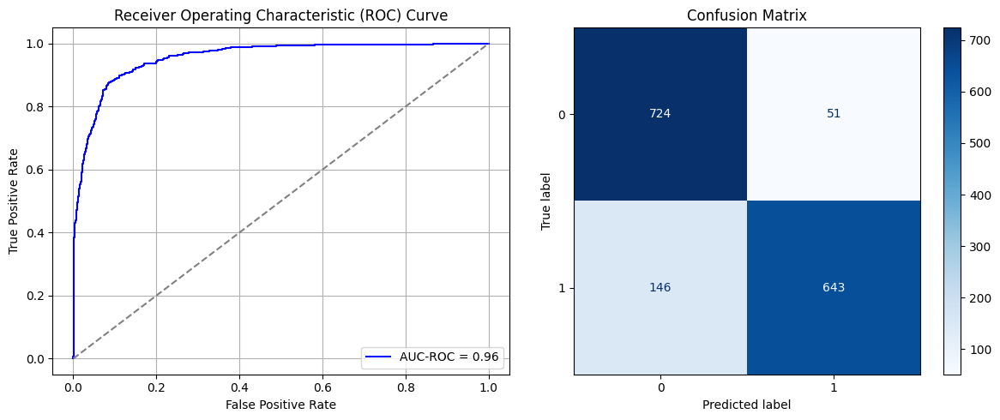

Best threshold based on F1-score: 0.3622521162033081
Time elapsed (performance): 13.790409008000097


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_127"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_889 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_890 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_891 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_892 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_893 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_894 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_895 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.6721 - loss: 0.9331 - val_AUC: 0.0000e+00 - val_loss: 0.8271
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7129 - loss: 0.6133 - val_AUC: 0.0000e+00 - val_loss: 0.9842
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7210 - loss: 0.5997 - val_AUC: 0.0000e+00 - val_loss: 0.8550
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6951 - loss: 0.5920 - val_AUC: 0.0000e+00 - val_loss: 0.8266
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7010 - loss: 0.5904 - val_AUC: 0.0000e+00 - val_loss: 0.8859
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7290 - loss: 0.5729 - val_AUC: 0.0000e+00 - val_loss: 0.8555
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7232 - loss: 0.5757 - val_AUC: 0.0000e+00 - val_loss: 0.8021
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7089 - loss: 0.5778 - val_AUC: 0.0000e+00 - val_loss: 0.7915
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_128"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_896 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_897 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_898 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_899 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_900 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_901 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_902 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.6748 - loss: 0.9148 - val_AUC: 0.0000e+00 - val_loss: 0.8332
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7046 - loss: 0.6029 - val_AUC: 0.0000e+00 - val_loss: 0.8502
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7141 - loss: 0.5936 - val_AUC: 0.0000e+00 - val_loss: 0.8174
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6943 - loss: 0.5977 - val_AUC: 0.0000e+00 - val_loss: 0.8825
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7200 - loss: 0.5737 - val_AUC: 0.0000e+00 - val_loss: 0.7617
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6933 - loss: 0.6069 - val_AUC: 0.0000e+00 - val_loss: 0.9319
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7100 - loss: 0.5865 - val_AUC: 0.0000e+00 - val_loss: 0.8465
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7225 - loss: 0.5728 - val_AUC: 0.0000e+00 - val_loss: 0.8780
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_129"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_903 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_904 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_905 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_906 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_907 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_908 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_909 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - AUC: 0.6936 - loss: 0.9140 - val_AUC: 0.0000e+00 - val_loss: 0.9013
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7239 - loss: 0.5913 - val_AUC: 0.0000e+00 - val_loss: 0.9288
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7204 - loss: 0.5823 - val_AUC: 0.0000e+00 - val_loss: 0.9342
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7101 - loss: 0.5880 - val_AUC: 0.0000e+00 - val_loss: 0.8059
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7161 - loss: 0.5928 - val_AUC: 0.0000e+00 - val_loss: 0.9644
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7156 - loss: 0.5849 - val_AUC: 0.0000e+00 - val_loss: 0.8497
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7086 - loss: 0.5915 - val_AUC: 0.0000e+00 - val_loss: 0.9855
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7155 - loss: 0.5917 - val_AUC: 0.0000e+00 - val_loss: 0.9714
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_130"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_910 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_911 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_912 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_913 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_914 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_915 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_916 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - AUC: 0.6733 - loss: 0.9674 - val_AUC: 0.0000e+00 - val_loss: 0.9216
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7139 - loss: 0.6004 - val_AUC: 0.0000e+00 - val_loss: 0.9561
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7027 - loss: 0.5990 - val_AUC: 0.0000e+00 - val_loss: 0.9274
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7115 - loss: 0.5877 - val_AUC: 0.0000e+00 - val_loss: 0.7903
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7104 - loss: 0.5906 - val_AUC: 0.0000e+00 - val_loss: 0.9495
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7050 - loss: 0.5918 - val_AUC: 0.0000e+00 - val_loss: 0.8866
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7285 - loss: 0.5702 - val_AUC: 0.0000e+00 - val_loss: 0.7562
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7107 - loss: 0.5829 - val_AUC: 0.0000e+00 - val_loss: 0.8712
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_131"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_917 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_918 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_919 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_920 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_921 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_922 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_923 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - AUC: 0.6705 - loss: 0.9131 - val_AUC: 0.0000e+00 - val_loss: 0.8458
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7147 - loss: 0.5932 - val_AUC: 0.0000e+00 - val_loss: 0.8629
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7066 - loss: 0.5890 - val_AUC: 0.0000e+00 - val_loss: 0.7894
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7083 - loss: 0.5859 - val_AUC: 0.0000e+00 - val_loss: 0.8493
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7073 - loss: 0.5893 - val_AUC: 0.0000e+00 - val_loss: 0.8217
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7148 - loss: 0.5820 - val_AUC: 0.0000e+00 - val_loss: 0.8899
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7213 - loss: 0.5839 - val_AUC: 0.0000e+00 - val_loss: 0.8471
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7158 - loss: 0.5867 - val_AUC: 0.0000e+00 - val_loss: 0.9273
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_132"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_924 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_925 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_926 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_927 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_928 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_929 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_930 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - AUC: 0.6781 - loss: 0.8926 - val_AUC: 0.0000e+00 - val_loss: 0.8288
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7046 - loss: 0.6045 - val_AUC: 0.0000e+00 - val_loss: 0.8311
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7177 - loss: 0.5901 - val_AUC: 0.0000e+00 - val_loss: 0.9245
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7046 - loss: 0.5951 - val_AUC: 0.0000e+00 - val_loss: 0.9115
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7170 - loss: 0.5786 - val_AUC: 0.0000e+00 - val_loss: 0.8432
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7044 - loss: 0.5893 - val_AUC: 0.0000e+00 - val_loss: 0.8714
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7088 - loss: 0.5811 - val_AUC: 0.0000e+00 - val_loss: 0.8542
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7197 - loss: 0.5753 - val_AUC: 0.0000e+00 - val_loss: 0.8436
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_133"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_931 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_932 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_933 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_934 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_935 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_936 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_937 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - AUC: 0.6882 - loss: 0.9286 - val_AUC: 0.0000e+00 - val_loss: 0.9192
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7201 - loss: 0.5839 - val_AUC: 0.0000e+00 - val_loss: 0.8017
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7114 - loss: 0.5834 - val_AUC: 0.0000e+00 - val_loss: 0.9428
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7203 - loss: 0.5872 - val_AUC: 0.0000e+00 - val_loss: 0.9224
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7240 - loss: 0.5744 - val_AUC: 0.0000e+00 - val_loss: 0.8285
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7193 - loss: 0.5836 - val_AUC: 0.0000e+00 - val_loss: 0.9606
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7290 - loss: 0.5732 - val_AUC: 0.0000e+00 - val_loss: 0.7623
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7138 - loss: 0.5817 - val_AUC: 0.0000e+00 - val_loss: 0.8422
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_134"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_938 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_939 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_940 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_941 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_942 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_943 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_944 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - AUC: 0.6783 - loss: 0.9056 - val_AUC: 0.0000e+00 - val_loss: 0.7727
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6999 - loss: 0.5990 - val_AUC: 0.0000e+00 - val_loss: 0.8017
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7089 - loss: 0.5921 - val_AUC: 0.0000e+00 - val_loss: 0.9110
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7057 - loss: 0.5891 - val_AUC: 0.0000e+00 - val_loss: 0.8599
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7117 - loss: 0.5843 - val_AUC: 0.0000e+00 - val_loss: 0.9552
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7343 - loss: 0.5702 - val_AUC: 0.0000e+00 - val_loss: 0.9219
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7366 - loss: 0.5688 - val_AUC: 0.0000e+00 - val_loss: 0.8810
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7176 - loss: 0.5884 - val_AUC: 0.0000e+00 - val_loss: 0.9103
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_135"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_945 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_946 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_947 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_948 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_949 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_950 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_951 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - AUC: 0.6858 - loss: 0.8808 - val_AUC: 0.0000e+00 - val_loss: 0.8146
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6987 - loss: 0.6079 - val_AUC: 0.0000e+00 - val_loss: 0.9599
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7081 - loss: 0.5867 - val_AUC: 0.0000e+00 - val_loss: 0.9237
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7091 - loss: 0.5867 - val_AUC: 0.0000e+00 - val_loss: 0.8236
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7021 - loss: 0.5892 - val_AUC: 0.0000e+00 - val_loss: 0.9329
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7047 - loss: 0.5995 - val_AUC: 0.0000e+00 - val_loss: 0.9797
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7108 - loss: 0.5817 - val_AUC: 0.0000e+00 - val_loss: 0.8601
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6994 - loss: 0.5921 - val_AUC: 0.0000e+00 - val_loss: 0.8340
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_136"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_952 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_953 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_954 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_955 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_956 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_957 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_958 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.6801 - loss: 0.9365 - val_AUC: 0.0000e+00 - val_loss: 0.8653
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6959 - loss: 0.6054 - val_AUC: 0.0000e+00 - val_loss: 0.9029
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7047 - loss: 0.5975 - val_AUC: 0.0000e+00 - val_loss: 0.8656
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7059 - loss: 0.5899 - val_AUC: 0.0000e+00 - val_loss: 0.9612
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7068 - loss: 0.5934 - val_AUC: 0.0000e+00 - val_loss: 0.9094
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7070 - loss: 0.5885 - val_AUC: 0.0000e+00 - val_loss: 0.9502
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7092 - loss: 0.5972 - val_AUC: 0.0000e+00 - val_loss: 0.9461
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6849 - loss: 0.5999 - val_AUC: 0.0000e+00 - val_loss: 0.9276
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_137"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_959 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_960 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_961 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_962 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_963 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_964 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_965 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 5s 41ms/step - AUC: 0.6661 - loss: 0.9204 - val_AUC: 0.0000e+00 - val_loss: 0.9244
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7138 - loss: 0.5897 - val_AUC: 0.0000e+00 - val_loss: 0.8888
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7103 - loss: 0.5800 - val_AUC: 0.0000e+00 - val_loss: 0.8734
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7002 - loss: 0.5971 - val_AUC: 0.0000e+00 - val_loss: 0.9037
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7212 - loss: 0.5782 - val_AUC: 0.0000e+00 - val_loss: 0.8743
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6936 - loss: 0.5900 - val_AUC: 0.0000e+00 - val_loss: 0.8899
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7218 - loss: 0.5839 - val_AUC: 0.0000e+00 - val_loss: 0.9249
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7080 - loss: 0.5833 - val_AUC: 0.0000e+00 - val_loss: 0.9536
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_138"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_966 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_967 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_968 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_969 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_970 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_971 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_972 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.6835 - loss: 0.9351 - val_AUC: 0.0000e+00 - val_loss: 0.8195
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7125 - loss: 0.5883 - val_AUC: 0.0000e+00 - val_loss: 0.9026
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7010 - loss: 0.5906 - val_AUC: 0.0000e+00 - val_loss: 0.8120
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7005 - loss: 0.5899 - val_AUC: 0.0000e+00 - val_loss: 0.8760
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6998 - loss: 0.5940 - val_AUC: 0.0000e+00 - val_loss: 0.8422
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6852 - loss: 0.6066 - val_AUC: 0.0000e+00 - val_loss: 0.8114
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7171 - loss: 0.5773 - val_AUC: 0.0000e+00 - val_loss: 0.7808
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7147 - loss: 0.5813 - val_AUC: 0.0000e+00 - val_loss: 0.8480
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_139"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_973 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_974 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_975 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_976 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_977 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_978 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_979 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - AUC: 0.6659 - loss: 0.9100 - val_AUC: 0.0000e+00 - val_loss: 0.8420
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6850 - loss: 0.6223 - val_AUC: 0.0000e+00 - val_loss: 0.9082
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7084 - loss: 0.5949 - val_AUC: 0.0000e+00 - val_loss: 0.7806
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7072 - loss: 0.5886 - val_AUC: 0.0000e+00 - val_loss: 0.7726
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7028 - loss: 0.5992 - val_AUC: 0.0000e+00 - val_loss: 0.8427
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7178 - loss: 0.5826 - val_AUC: 0.0000e+00 - val_loss: 0.8111
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7190 - loss: 0.5897 - val_AUC: 0.0000e+00 - val_loss: 0.9485
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7297 - loss: 0.5774 - val_AUC: 0.0000e+00 - val_loss: 0.8773
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_140"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_980 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_981 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_982 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_983 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_984 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_985 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_986 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.6681 - loss: 0.9752 - val_AUC: 0.0000e+00 - val_loss: 0.8479
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7051 - loss: 0.6034 - val_AUC: 0.0000e+00 - val_loss: 0.8433
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7132 - loss: 0.5954 - val_AUC: 0.0000e+00 - val_loss: 0.8857
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7052 - loss: 0.5923 - val_AUC: 0.0000e+00 - val_loss: 0.8615
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7053 - loss: 0.5964 - val_AUC: 0.0000e+00 - val_loss: 0.9815
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7071 - loss: 0.5740 - val_AUC: 0.0000e+00 - val_loss: 0.8406
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7094 - loss: 0.5910 - val_AUC: 0.0000e+00 - val_loss: 0.8793
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7232 - loss: 0.5828 - val_AUC: 0.0000e+00 - val_loss: 0.8882
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_141"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_987 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_988 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_989 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_990 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_991 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_992 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_993 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - AUC: 0.6725 - loss: 0.9235 - val_AUC: 0.0000e+00 - val_loss: 0.8004
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7040 - loss: 0.6000 - val_AUC: 0.0000e+00 - val_loss: 0.8043
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7019 - loss: 0.5991 - val_AUC: 0.0000e+00 - val_loss: 0.8545
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7306 - loss: 0.5705 - val_AUC: 0.0000e+00 - val_loss: 0.9273
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6964 - loss: 0.5903 - val_AUC: 0.0000e+00 - val_loss: 0.8811
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7151 - loss: 0.5848 - val_AUC: 0.0000e+00 - val_loss: 0.8708
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6963 - loss: 0.6049 - val_AUC: 0.0000e+00 - val_loss: 0.8893
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7009 - loss: 0.6006 - val_AUC: 0.0000e+00 - val_loss: 0.8632
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_142"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_994 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_995 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_996 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_997 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_998 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_999 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1000 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.6676 - loss: 0.9660 - val_AUC: 0.0000e+00 - val_loss: 0.8865
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7307 - loss: 0.5791 - val_AUC: 0.0000e+00 - val_loss: 0.9086
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7189 - loss: 0.5937 - val_AUC: 0.0000e+00 - val_loss: 0.8711
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7081 - loss: 0.5904 - val_AUC: 0.0000e+00 - val_loss: 0.8917
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7195 - loss: 0.5855 - val_AUC: 0.0000e+00 - val_loss: 0.8461
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7081 - loss: 0.5894 - val_AUC: 0.0000e+00 - val_loss: 0.8409
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6974 - loss: 0.5862 - val_AUC: 0.0000e+00 - val_loss: 0.8487
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7201 - loss: 0.5782 - val_AUC: 0.0000e+00 - val_loss: 0.8914
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_143"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1001 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1002 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1003 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1004 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1005 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1006 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1007 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - AUC: 0.6667 - loss: 0.9090 - val_AUC: 0.0000e+00 - val_loss: 0.7928
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7112 - loss: 0.5914 - val_AUC: 0.0000e+00 - val_loss: 0.8304
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6908 - loss: 0.6059 - val_AUC: 0.0000e+00 - val_loss: 0.8314
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7152 - loss: 0.5820 - val_AUC: 0.0000e+00 - val_loss: 0.8485
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6921 - loss: 0.6009 - val_AUC: 0.0000e+00 - val_loss: 0.8449
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7129 - loss: 0.5827 - val_AUC: 0.0000e+00 - val_loss: 0.9310
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7380 - loss: 0.5746 - val_AUC: 0.0000e+00 - val_loss: 0.9296
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6969 - loss: 0.5948 - val_AUC: 0.0000e+00 - val_loss: 0.9958
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_144"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1008 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1009 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1010 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1011 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1012 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1013 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1014 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step - AUC: 0.7034 - loss: 0.8363 - val_AUC: 0.0000e+00 - val_loss: 0.8421
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7142 - loss: 0.5953 - val_AUC: 0.0000e+00 - val_loss: 0.8384
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7066 - loss: 0.5882 - val_AUC: 0.0000e+00 - val_loss: 0.8312
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7106 - loss: 0.5831 - val_AUC: 0.0000e+00 - val_loss: 0.8746
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7161 - loss: 0.5877 - val_AUC: 0.0000e+00 - val_loss: 1.0344
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7059 - loss: 0.5926 - val_AUC: 0.0000e+00 - val_loss: 0.9272
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7223 - loss: 0.5741 - val_AUC: 0.0000e+00 - val_loss: 0.8961
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7122 - loss: 0.5811 - val_AUC: 0.0000e+00 - val_loss: 0.8812
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_145"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1015 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1016 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1017 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1018 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1019 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1020 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1021 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.6511 - loss: 0.9684 - val_AUC: 0.0000e+00 - val_loss: 0.9471
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6989 - loss: 0.6162 - val_AUC: 0.0000e+00 - val_loss: 0.9580
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7211 - loss: 0.5867 - val_AUC: 0.0000e+00 - val_loss: 0.9498
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7146 - loss: 0.5889 - val_AUC: 0.0000e+00 - val_loss: 0.8481
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7255 - loss: 0.5740 - val_AUC: 0.0000e+00 - val_loss: 0.7834
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7193 - loss: 0.5809 - val_AUC: 0.0000e+00 - val_loss: 0.8968
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7433 - loss: 0.5769 - val_AUC: 0.0000e+00 - val_loss: 0.8030
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7259 - loss: 0.5751 - val_AUC: 0.0000e+00 - val_loss: 0.8855
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_146"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1022 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1023 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1024 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1025 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1026 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1027 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1028 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.6747 - loss: 0.9482 - val_AUC: 0.0000e+00 - val_loss: 0.8394
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6800 - loss: 0.6304 - val_AUC: 0.0000e+00 - val_loss: 0.8872
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7037 - loss: 0.5864 - val_AUC: 0.0000e+00 - val_loss: 0.8239
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7157 - loss: 0.5905 - val_AUC: 0.0000e+00 - val_loss: 0.8265
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7162 - loss: 0.5819 - val_AUC: 0.0000e+00 - val_loss: 0.8879
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7137 - loss: 0.5873 - val_AUC: 0.0000e+00 - val_loss: 0.9313
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7269 - loss: 0.5939 - val_AUC: 0.0000e+00 - val_loss: 0.9647
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7050 - loss: 0.6010 - val_AUC: 0.0000e+00 - val_loss: 0.9789
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_147"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1029 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1030 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1031 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1032 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1033 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1034 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1035 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 8s 18ms/step - AUC: 0.6172 - loss: 0.6707 - val_AUC: 0.7818 - val_loss: 0.5896
Epoch 2/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8098 - loss: 0.5324 - val_AUC: 0.8784 - val_loss: 0.4458
Epoch 3/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8758 - loss: 0.4419 - val_AUC: 0.9098 - val_loss: 0.3989
Epoch 4/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9029 - loss: 0.3956 - val_AUC: 0.9231 - val_loss: 0.3970
Epoch 5/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9217 - loss: 0.3601 - val_AUC: 0.9408 - val_loss: 0.3218
Epoch 6/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9341 - loss: 0.3291 - val_AUC: 0.9485 - val_loss: 0.3677
Epoch 7/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9337 - loss: 0.3289 - val_AUC: 0.9455 - val_loss: 0.2985
Epoch 8/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.9493 - loss: 0.2886 - val_AUC: 0.9610 - val_loss: 0.2626
Epoch 9/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step -

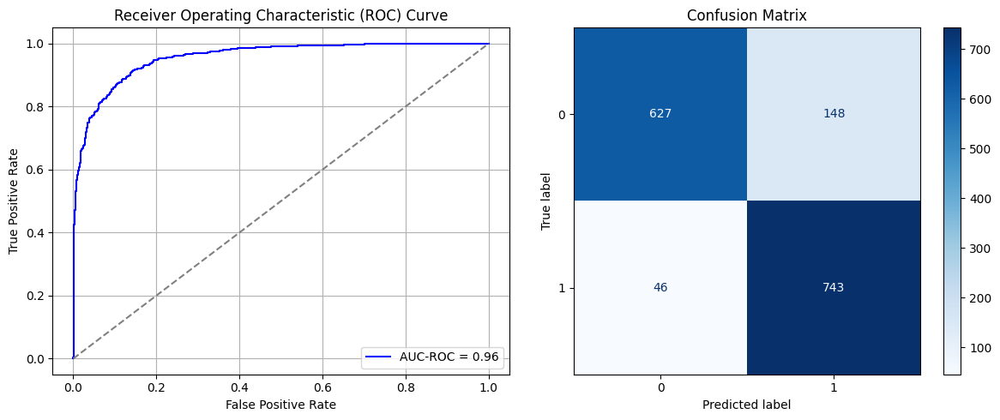

Best threshold based on F1-score: 0.6391157507896423
Time elapsed (performance): 19.14694052599998


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_148"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1036 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1037 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1038 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1039 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1040 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1041 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1042 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - AUC: 0.6086 - loss: 1.1843 - val_AUC: 0.0000e+00 - val_loss: 1.1488
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6243 - loss: 0.6914 - val_AUC: 0.0000e+00 - val_loss: 0.9635
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6281 - loss: 0.6568 - val_AUC: 0.0000e+00 - val_loss: 0.9371
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6547 - loss: 0.6303 - val_AUC: 0.0000e+00 - val_loss: 0.9453
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6504 - loss: 0.6374 - val_AUC: 0.0000e+00 - val_loss: 0.9994
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6587 - loss: 0.6300 - val_AUC: 0.0000e+00 - val_loss: 0.8619
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6703 - loss: 0.6283 - val_AUC: 0.0000e+00 - val_loss: 0.9327
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6678 - loss: 0.6136 - val_AUC: 0.0000e+00 - val_loss: 0.8803
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_149"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1043 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1044 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1045 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1046 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1047 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1048 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1049 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - AUC: 0.6211 - loss: 1.1285 - val_AUC: 0.0000e+00 - val_loss: 1.2575
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.6574 - loss: 0.6723 - val_AUC: 0.0000e+00 - val_loss: 1.0013
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6446 - loss: 0.6568 - val_AUC: 0.0000e+00 - val_loss: 0.9948
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6676 - loss: 0.6309 - val_AUC: 0.0000e+00 - val_loss: 0.9818
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6478 - loss: 0.6288 - val_AUC: 0.0000e+00 - val_loss: 0.8640
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6634 - loss: 0.6223 - val_AUC: 0.0000e+00 - val_loss: 0.9303
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6654 - loss: 0.6233 - val_AUC: 0.0000e+00 - val_loss: 0.8698
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6749 - loss: 0.6287 - val_AUC: 0.0000e+00 - val_loss: 0.8954
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_150"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1050 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1051 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1052 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1053 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1054 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1055 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1056 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step - AUC: 0.6322 - loss: 1.1349 - val_AUC: 0.0000e+00 - val_loss: 1.2060
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6341 - loss: 0.7070 - val_AUC: 0.0000e+00 - val_loss: 0.9985
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6567 - loss: 0.6390 - val_AUC: 0.0000e+00 - val_loss: 0.9467
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6482 - loss: 0.6265 - val_AUC: 0.0000e+00 - val_loss: 0.8464
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6656 - loss: 0.6200 - val_AUC: 0.0000e+00 - val_loss: 0.9241
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6476 - loss: 0.6264 - val_AUC: 0.0000e+00 - val_loss: 0.9083
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6769 - loss: 0.6148 - val_AUC: 0.0000e+00 - val_loss: 0.8528
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6843 - loss: 0.6112 - val_AUC: 0.0000e+00 - val_loss: 0.9457
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_151"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1057 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1058 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1059 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1060 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1061 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1062 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1063 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - AUC: 0.6084 - loss: 1.1688 - val_AUC: 0.0000e+00 - val_loss: 1.2134
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6491 - loss: 0.6765 - val_AUC: 0.0000e+00 - val_loss: 0.9565
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6719 - loss: 0.6220 - val_AUC: 0.0000e+00 - val_loss: 0.9119
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6607 - loss: 0.6209 - val_AUC: 0.0000e+00 - val_loss: 0.8917
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6629 - loss: 0.6295 - val_AUC: 0.0000e+00 - val_loss: 0.9617
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6548 - loss: 0.6405 - val_AUC: 0.0000e+00 - val_loss: 0.9238
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6645 - loss: 0.6279 - val_AUC: 0.0000e+00 - val_loss: 0.8381
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6726 - loss: 0.6223 - val_AUC: 0.0000e+00 - val_loss: 0.8495
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_152"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1064 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1065 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1066 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1067 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1068 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1069 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1070 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - AUC: 0.6128 - loss: 1.1487 - val_AUC: 0.0000e+00 - val_loss: 1.2148
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6138 - loss: 0.7159 - val_AUC: 0.0000e+00 - val_loss: 1.0410
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6530 - loss: 0.6469 - val_AUC: 0.0000e+00 - val_loss: 0.9913
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6420 - loss: 0.6361 - val_AUC: 0.0000e+00 - val_loss: 0.8685
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6403 - loss: 0.6333 - val_AUC: 0.0000e+00 - val_loss: 0.9356
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6540 - loss: 0.6270 - val_AUC: 0.0000e+00 - val_loss: 0.9243
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6581 - loss: 0.6276 - val_AUC: 0.0000e+00 - val_loss: 0.9645
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6561 - loss: 0.6213 - val_AUC: 0.0000e+00 - val_loss: 0.8584
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_153"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1071 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1072 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1073 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1074 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1075 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1076 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1077 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - AUC: 0.6140 - loss: 1.1960 - val_AUC: 0.0000e+00 - val_loss: 1.1777
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6429 - loss: 0.6953 - val_AUC: 0.0000e+00 - val_loss: 0.9703
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6412 - loss: 0.6524 - val_AUC: 0.0000e+00 - val_loss: 1.0353
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6588 - loss: 0.6203 - val_AUC: 0.0000e+00 - val_loss: 0.8654
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6625 - loss: 0.6291 - val_AUC: 0.0000e+00 - val_loss: 0.9194
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6651 - loss: 0.6247 - val_AUC: 0.0000e+00 - val_loss: 0.9205
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6582 - loss: 0.6369 - val_AUC: 0.0000e+00 - val_loss: 1.0165
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6425 - loss: 0.6340 - val_AUC: 0.0000e+00 - val_loss: 0.9648
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_154"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1078 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1079 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1080 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1081 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1082 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1083 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1084 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step - AUC: 0.6145 - loss: 1.1470 - val_AUC: 0.0000e+00 - val_loss: 1.1705
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6440 - loss: 0.6838 - val_AUC: 0.0000e+00 - val_loss: 1.0002
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6490 - loss: 0.6399 - val_AUC: 0.0000e+00 - val_loss: 0.9268
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6360 - loss: 0.6381 - val_AUC: 0.0000e+00 - val_loss: 0.9755
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6710 - loss: 0.6179 - val_AUC: 0.0000e+00 - val_loss: 0.9033
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6550 - loss: 0.6263 - val_AUC: 0.0000e+00 - val_loss: 0.9396
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6758 - loss: 0.6036 - val_AUC: 0.0000e+00 - val_loss: 0.8878
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6832 - loss: 0.6180 - val_AUC: 0.0000e+00 - val_loss: 0.8933
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_155"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1085 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1086 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1087 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1088 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1089 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1090 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1091 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.6163 - loss: 1.2002 - val_AUC: 0.0000e+00 - val_loss: 1.1523
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.6155 - loss: 0.7164 - val_AUC: 0.0000e+00 - val_loss: 1.0034
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6284 - loss: 0.6504 - val_AUC: 0.0000e+00 - val_loss: 0.8811
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6595 - loss: 0.6235 - val_AUC: 0.0000e+00 - val_loss: 0.8839
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6357 - loss: 0.6337 - val_AUC: 0.0000e+00 - val_loss: 0.9342
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6755 - loss: 0.6247 - val_AUC: 0.0000e+00 - val_loss: 0.8641
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6877 - loss: 0.6134 - val_AUC: 0.0000e+00 - val_loss: 0.8994
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6796 - loss: 0.6200 - val_AUC: 0.0000e+00 - val_loss: 0.9042
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_156"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1092 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1093 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1094 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1095 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1096 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1097 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1098 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - AUC: 0.6116 - loss: 1.1702 - val_AUC: 0.0000e+00 - val_loss: 1.2251
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6313 - loss: 0.6978 - val_AUC: 0.0000e+00 - val_loss: 0.9408
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6497 - loss: 0.6427 - val_AUC: 0.0000e+00 - val_loss: 0.9767
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6447 - loss: 0.6443 - val_AUC: 0.0000e+00 - val_loss: 1.0188
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6761 - loss: 0.6101 - val_AUC: 0.0000e+00 - val_loss: 0.8946
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6773 - loss: 0.6214 - val_AUC: 0.0000e+00 - val_loss: 1.0014
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6702 - loss: 0.6189 - val_AUC: 0.0000e+00 - val_loss: 0.8707
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6708 - loss: 0.6297 - val_AUC: 0.0000e+00 - val_loss: 1.0438
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_157"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1099 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1100 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1101 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1102 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1103 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1104 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1105 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - AUC: 0.6243 - loss: 1.1342 - val_AUC: 0.0000e+00 - val_loss: 1.1956
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6214 - loss: 0.6983 - val_AUC: 0.0000e+00 - val_loss: 0.9912
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6623 - loss: 0.6424 - val_AUC: 0.0000e+00 - val_loss: 0.9653
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6581 - loss: 0.6267 - val_AUC: 0.0000e+00 - val_loss: 0.8511
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6670 - loss: 0.6162 - val_AUC: 0.0000e+00 - val_loss: 0.8491
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6585 - loss: 0.6217 - val_AUC: 0.0000e+00 - val_loss: 0.9058
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6650 - loss: 0.6157 - val_AUC: 0.0000e+00 - val_loss: 0.9205
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6799 - loss: 0.6233 - val_AUC: 0.0000e+00 - val_loss: 0.9006
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_158"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1106 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1107 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1108 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1109 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1110 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1111 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1112 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.6160 - loss: 1.1468 - val_AUC: 0.0000e+00 - val_loss: 1.2074
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.6392 - loss: 0.7015 - val_AUC: 0.0000e+00 - val_loss: 0.9978
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6509 - loss: 0.6426 - val_AUC: 0.0000e+00 - val_loss: 0.9208
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6407 - loss: 0.6430 - val_AUC: 0.0000e+00 - val_loss: 0.9527
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6551 - loss: 0.6239 - val_AUC: 0.0000e+00 - val_loss: 0.8950
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6728 - loss: 0.6094 - val_AUC: 0.0000e+00 - val_loss: 0.9346
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6532 - loss: 0.6318 - val_AUC: 0.0000e+00 - val_loss: 0.9454
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6817 - loss: 0.6173 - val_AUC: 0.0000e+00 - val_loss: 0.9797
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_159"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1113 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1114 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1115 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1116 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1117 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1118 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1119 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - AUC: 0.6253 - loss: 1.1087 - val_AUC: 0.0000e+00 - val_loss: 1.2572
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6162 - loss: 0.7084 - val_AUC: 0.0000e+00 - val_loss: 0.9846
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6365 - loss: 0.6619 - val_AUC: 0.0000e+00 - val_loss: 1.0504
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6522 - loss: 0.6250 - val_AUC: 0.0000e+00 - val_loss: 0.9658
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6490 - loss: 0.6341 - val_AUC: 0.0000e+00 - val_loss: 0.8553
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6373 - loss: 0.6289 - val_AUC: 0.0000e+00 - val_loss: 0.8860
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6858 - loss: 0.6201 - val_AUC: 0.0000e+00 - val_loss: 0.9449
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6772 - loss: 0.6167 - val_AUC: 0.0000e+00 - val_loss: 0.9549
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_160"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1120 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1121 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1122 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1123 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1124 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1125 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1126 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.6398 - loss: 1.0976 - val_AUC: 0.0000e+00 - val_loss: 1.2324
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6433 - loss: 0.6819 - val_AUC: 0.0000e+00 - val_loss: 0.9922
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6555 - loss: 0.6282 - val_AUC: 0.0000e+00 - val_loss: 0.9589
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6728 - loss: 0.6184 - val_AUC: 0.0000e+00 - val_loss: 0.9609
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6370 - loss: 0.6349 - val_AUC: 0.0000e+00 - val_loss: 0.8739
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6646 - loss: 0.6264 - val_AUC: 0.0000e+00 - val_loss: 0.8739
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6448 - loss: 0.6419 - val_AUC: 0.0000e+00 - val_loss: 0.8958
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6462 - loss: 0.6352 - val_AUC: 0.0000e+00 - val_loss: 0.9582
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_161"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1127 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1128 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1129 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1130 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1131 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1132 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1133 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.6182 - loss: 1.1425 - val_AUC: 0.0000e+00 - val_loss: 1.1984
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6405 - loss: 0.6879 - val_AUC: 0.0000e+00 - val_loss: 0.9318
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6461 - loss: 0.6531 - val_AUC: 0.0000e+00 - val_loss: 0.9531
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6564 - loss: 0.6273 - val_AUC: 0.0000e+00 - val_loss: 0.9475
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6357 - loss: 0.6365 - val_AUC: 0.0000e+00 - val_loss: 0.8718
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6619 - loss: 0.6250 - val_AUC: 0.0000e+00 - val_loss: 0.9708
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6604 - loss: 0.6307 - val_AUC: 0.0000e+00 - val_loss: 0.9688
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6670 - loss: 0.6182 - val_AUC: 0.0000e+00 - val_loss: 0.8944
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_162"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1134 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1135 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1136 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1137 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1138 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1139 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1140 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - AUC: 0.5997 - loss: 1.1647 - val_AUC: 0.0000e+00 - val_loss: 1.2052
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.6403 - loss: 0.6795 - val_AUC: 0.0000e+00 - val_loss: 0.9502
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6447 - loss: 0.6294 - val_AUC: 0.0000e+00 - val_loss: 0.8710
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6368 - loss: 0.6394 - val_AUC: 0.0000e+00 - val_loss: 0.9132
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6622 - loss: 0.6279 - val_AUC: 0.0000e+00 - val_loss: 0.9709
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6659 - loss: 0.6173 - val_AUC: 0.0000e+00 - val_loss: 0.8098
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6484 - loss: 0.6264 - val_AUC: 0.0000e+00 - val_loss: 0.8396
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6557 - loss: 0.6197 - val_AUC: 0.0000e+00 - val_loss: 0.8304
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_163"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1141 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1142 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1143 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1144 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1145 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1146 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1147 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - AUC: 0.6234 - loss: 1.1239 - val_AUC: 0.0000e+00 - val_loss: 1.1649
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6294 - loss: 0.6981 - val_AUC: 0.0000e+00 - val_loss: 0.9440
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6250 - loss: 0.6636 - val_AUC: 0.0000e+00 - val_loss: 0.9077
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6423 - loss: 0.6268 - val_AUC: 0.0000e+00 - val_loss: 0.9248
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6448 - loss: 0.6332 - val_AUC: 0.0000e+00 - val_loss: 0.9529
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6592 - loss: 0.6262 - val_AUC: 0.0000e+00 - val_loss: 0.9164
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6697 - loss: 0.6162 - val_AUC: 0.0000e+00 - val_loss: 0.9219
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6712 - loss: 0.6278 - val_AUC: 0.0000e+00 - val_loss: 0.9177
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_164"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1148 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1149 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1150 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1151 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1152 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1153 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1154 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.6085 - loss: 1.1971 - val_AUC: 0.0000e+00 - val_loss: 1.1579
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6384 - loss: 0.6934 - val_AUC: 0.0000e+00 - val_loss: 0.9951
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6476 - loss: 0.6313 - val_AUC: 0.0000e+00 - val_loss: 0.9098
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6398 - loss: 0.6450 - val_AUC: 0.0000e+00 - val_loss: 0.9157
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6408 - loss: 0.6285 - val_AUC: 0.0000e+00 - val_loss: 0.9389
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6616 - loss: 0.6257 - val_AUC: 0.0000e+00 - val_loss: 0.9001
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6464 - loss: 0.6274 - val_AUC: 0.0000e+00 - val_loss: 0.9411
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6748 - loss: 0.6156 - val_AUC: 0.0000e+00 - val_loss: 0.9438
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_165"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1155 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1156 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1157 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1158 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1159 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1160 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1161 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - AUC: 0.6138 - loss: 1.1617 - val_AUC: 0.0000e+00 - val_loss: 1.1494
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6390 - loss: 0.6972 - val_AUC: 0.0000e+00 - val_loss: 1.0191
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6495 - loss: 0.6517 - val_AUC: 0.0000e+00 - val_loss: 1.0097
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6437 - loss: 0.6290 - val_AUC: 0.0000e+00 - val_loss: 1.0551
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6587 - loss: 0.6319 - val_AUC: 0.0000e+00 - val_loss: 0.9375
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6490 - loss: 0.6230 - val_AUC: 0.0000e+00 - val_loss: 0.8854
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6862 - loss: 0.6113 - val_AUC: 0.0000e+00 - val_loss: 0.8741
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6934 - loss: 0.6149 - val_AUC: 0.0000e+00 - val_loss: 0.9023
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_166"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1162 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1163 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1164 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1165 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1166 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1167 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1168 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.6163 - loss: 1.1384 - val_AUC: 0.0000e+00 - val_loss: 1.1665
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.6355 - loss: 0.7063 - val_AUC: 0.0000e+00 - val_loss: 0.9727
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6465 - loss: 0.6443 - val_AUC: 0.0000e+00 - val_loss: 0.8994
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6564 - loss: 0.6295 - val_AUC: 0.0000e+00 - val_loss: 0.9816
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6472 - loss: 0.6315 - val_AUC: 0.0000e+00 - val_loss: 0.9260
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6627 - loss: 0.6318 - val_AUC: 0.0000e+00 - val_loss: 1.0167
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6534 - loss: 0.6311 - val_AUC: 0.0000e+00 - val_loss: 0.8860
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6498 - loss: 0.6380 - val_AUC: 0.0000e+00 - val_loss: 0.8961
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_167"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1169 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1170 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1171 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1172 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1173 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1174 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1175 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.6129 - loss: 1.1558 - val_AUC: 0.0000e+00 - val_loss: 1.2124
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.6443 - loss: 0.6955 - val_AUC: 0.0000e+00 - val_loss: 0.9735
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6384 - loss: 0.6558 - val_AUC: 0.0000e+00 - val_loss: 0.9556
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6387 - loss: 0.6374 - val_AUC: 0.0000e+00 - val_loss: 0.9235
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6595 - loss: 0.6192 - val_AUC: 0.0000e+00 - val_loss: 0.8776
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6552 - loss: 0.6354 - val_AUC: 0.0000e+00 - val_loss: 0.9664
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6588 - loss: 0.6242 - val_AUC: 0.0000e+00 - val_loss: 0.9185
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6867 - loss: 0.6074 - val_AUC: 0.0000e+00 - val_loss: 0.8612
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_168"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1176 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1177 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1178 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1179 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1180 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1181 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1182 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 6s 18ms/step - AUC: 0.6438 - loss: 0.6635 - val_AUC: 0.8178 - val_loss: 0.5333
Epoch 2/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8232 - loss: 0.5183 - val_AUC: 0.8993 - val_loss: 0.4195
Epoch 3/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8718 - loss: 0.4472 - val_AUC: 0.9164 - val_loss: 0.3766
Epoch 4/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8912 - loss: 0.4166 - val_AUC: 0.9346 - val_loss: 0.3319
Epoch 5/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9201 - loss: 0.3595 - val_AUC: 0.9370 - val_loss: 0.3257
Epoch 6/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9274 - loss: 0.3440 - val_AUC: 0.9456 - val_loss: 0.3360
Epoch 7/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9414 - loss: 0.3105 - val_AUC: 0.9507 - val_loss: 0.3236
Epoch 8/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9457 - loss: 0.3000 - val_AUC: 0.9489 - val_loss: 0.2952
Epoch 9/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

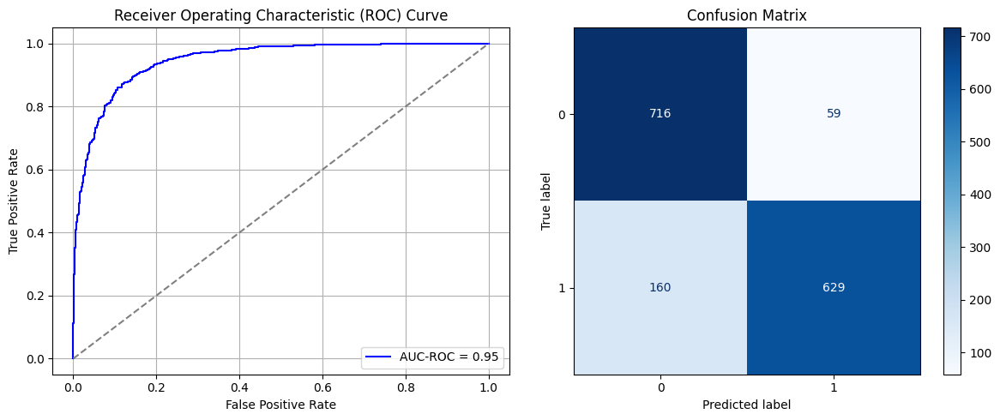

Best threshold based on F1-score: 0.24800395965576172
Time elapsed (performance): 16.79611679499999


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_169"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1183 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1184 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1185 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1186 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1187 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1188 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1189 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - AUC: 0.7228 - loss: 0.6775 - val_AUC: 0.0000e+00 - val_loss: 0.9042
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7275 - loss: 0.5758 - val_AUC: 0.0000e+00 - val_loss: 0.8958
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7123 - loss: 0.5873 - val_AUC: 0.0000e+00 - val_loss: 0.8859
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7103 - loss: 0.5935 - val_AUC: 0.0000e+00 - val_loss: 0.7471
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7329 - loss: 0.5656 - val_AUC: 0.0000e+00 - val_loss: 0.7800
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7504 - loss: 0.5521 - val_AUC: 0.0000e+00 - val_loss: 0.8705
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7355 - loss: 0.5667 - val_AUC: 0.0000e+00 - val_loss: 0.7829
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7254 - loss: 0.5691 - val_AUC: 0.0000e+00 - val_loss: 0.8200
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_170"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1190 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1191 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1192 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1193 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1194 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1195 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1196 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7209 - loss: 0.6741 - val_AUC: 0.0000e+00 - val_loss: 0.9088
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.6889 - loss: 0.6143 - val_AUC: 0.0000e+00 - val_loss: 0.8967
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7092 - loss: 0.5914 - val_AUC: 0.0000e+00 - val_loss: 0.8271
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7343 - loss: 0.5727 - val_AUC: 0.0000e+00 - val_loss: 0.8822
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7226 - loss: 0.5825 - val_AUC: 0.0000e+00 - val_loss: 0.7999
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7255 - loss: 0.5816 - val_AUC: 0.0000e+00 - val_loss: 0.8097
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7318 - loss: 0.5750 - val_AUC: 0.0000e+00 - val_loss: 0.8645
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7236 - loss: 0.5737 - val_AUC: 0.0000e+00 - val_loss: 0.8558
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_171"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1197 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1198 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1199 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1200 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1201 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1202 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1203 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - AUC: 0.7260 - loss: 0.6672 - val_AUC: 0.0000e+00 - val_loss: 0.9237
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7237 - loss: 0.5797 - val_AUC: 0.0000e+00 - val_loss: 0.7416
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7165 - loss: 0.5867 - val_AUC: 0.0000e+00 - val_loss: 0.8528
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7321 - loss: 0.5725 - val_AUC: 0.0000e+00 - val_loss: 0.8625
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7277 - loss: 0.5778 - val_AUC: 0.0000e+00 - val_loss: 0.8549
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7220 - loss: 0.5818 - val_AUC: 0.0000e+00 - val_loss: 0.9123
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7343 - loss: 0.5631 - val_AUC: 0.0000e+00 - val_loss: 0.7587
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7508 - loss: 0.5527 - val_AUC: 0.0000e+00 - val_loss: 0.7580
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_172"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1204 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1205 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1206 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1207 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1208 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1209 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1210 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - AUC: 0.7059 - loss: 0.7195 - val_AUC: 0.0000e+00 - val_loss: 1.0056
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7048 - loss: 0.6035 - val_AUC: 0.0000e+00 - val_loss: 0.8834
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7187 - loss: 0.5880 - val_AUC: 0.0000e+00 - val_loss: 0.8688
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7340 - loss: 0.5670 - val_AUC: 0.0000e+00 - val_loss: 0.7802
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7134 - loss: 0.5793 - val_AUC: 0.0000e+00 - val_loss: 0.8203
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7466 - loss: 0.5581 - val_AUC: 0.0000e+00 - val_loss: 0.8247
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7385 - loss: 0.5620 - val_AUC: 0.0000e+00 - val_loss: 0.8380
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7275 - loss: 0.5668 - val_AUC: 0.0000e+00 - val_loss: 0.7716
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_173"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1211 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1212 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1213 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1214 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1215 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1216 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1217 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7090 - loss: 0.7045 - val_AUC: 0.0000e+00 - val_loss: 0.9117
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7110 - loss: 0.6036 - val_AUC: 0.0000e+00 - val_loss: 0.8849
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7262 - loss: 0.5719 - val_AUC: 0.0000e+00 - val_loss: 0.8171
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7448 - loss: 0.5635 - val_AUC: 0.0000e+00 - val_loss: 0.8372
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7374 - loss: 0.5731 - val_AUC: 0.0000e+00 - val_loss: 0.7631
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7326 - loss: 0.5718 - val_AUC: 0.0000e+00 - val_loss: 0.8343
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7218 - loss: 0.5776 - val_AUC: 0.0000e+00 - val_loss: 0.8349
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7312 - loss: 0.5776 - val_AUC: 0.0000e+00 - val_loss: 0.8300
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_174"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1218 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1219 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1220 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1221 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1222 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1223 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1224 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - AUC: 0.7237 - loss: 0.6941 - val_AUC: 0.0000e+00 - val_loss: 0.9120
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7438 - loss: 0.5671 - val_AUC: 0.0000e+00 - val_loss: 0.8608
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7386 - loss: 0.5841 - val_AUC: 0.0000e+00 - val_loss: 0.8837
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7240 - loss: 0.5812 - val_AUC: 0.0000e+00 - val_loss: 0.8538
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7367 - loss: 0.5735 - val_AUC: 0.0000e+00 - val_loss: 0.7771
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7374 - loss: 0.5707 - val_AUC: 0.0000e+00 - val_loss: 0.8325
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7420 - loss: 0.5590 - val_AUC: 0.0000e+00 - val_loss: 0.7870
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7477 - loss: 0.5666 - val_AUC: 0.0000e+00 - val_loss: 0.8523
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_175"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1225 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1226 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1227 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1228 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1229 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1230 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1231 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - AUC: 0.7166 - loss: 0.7030 - val_AUC: 0.0000e+00 - val_loss: 0.9675
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7017 - loss: 0.6095 - val_AUC: 0.0000e+00 - val_loss: 0.8364
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7247 - loss: 0.5848 - val_AUC: 0.0000e+00 - val_loss: 0.8300
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7321 - loss: 0.5758 - val_AUC: 0.0000e+00 - val_loss: 0.8892
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7606 - loss: 0.5496 - val_AUC: 0.0000e+00 - val_loss: 0.8811
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7229 - loss: 0.5834 - val_AUC: 0.0000e+00 - val_loss: 0.8605
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7440 - loss: 0.5553 - val_AUC: 0.0000e+00 - val_loss: 0.8027
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7371 - loss: 0.5604 - val_AUC: 0.0000e+00 - val_loss: 0.8522
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_176"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1232 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1233 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1234 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1235 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1236 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1237 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1238 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - AUC: 0.7124 - loss: 0.6918 - val_AUC: 0.0000e+00 - val_loss: 1.0208
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7165 - loss: 0.6037 - val_AUC: 0.0000e+00 - val_loss: 0.8093
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7302 - loss: 0.5744 - val_AUC: 0.0000e+00 - val_loss: 0.7968
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7319 - loss: 0.5705 - val_AUC: 0.0000e+00 - val_loss: 0.8058
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7300 - loss: 0.5748 - val_AUC: 0.0000e+00 - val_loss: 0.9804
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7177 - loss: 0.5773 - val_AUC: 0.0000e+00 - val_loss: 0.9052
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7271 - loss: 0.5767 - val_AUC: 0.0000e+00 - val_loss: 0.8067
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7440 - loss: 0.5658 - val_AUC: 0.0000e+00 - val_loss: 0.8477
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_177"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1239 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1240 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1241 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1242 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1243 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1244 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1245 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - AUC: 0.7253 - loss: 0.6875 - val_AUC: 0.0000e+00 - val_loss: 0.9423
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7121 - loss: 0.5967 - val_AUC: 0.0000e+00 - val_loss: 0.7811
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7378 - loss: 0.5609 - val_AUC: 0.0000e+00 - val_loss: 0.7483
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7304 - loss: 0.5794 - val_AUC: 0.0000e+00 - val_loss: 0.8128
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7407 - loss: 0.5717 - val_AUC: 0.0000e+00 - val_loss: 0.8413
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7369 - loss: 0.5627 - val_AUC: 0.0000e+00 - val_loss: 0.8535
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7479 - loss: 0.5523 - val_AUC: 0.0000e+00 - val_loss: 0.8293
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7299 - loss: 0.5697 - val_AUC: 0.0000e+00 - val_loss: 0.8692
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_178"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1246 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1247 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1248 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1249 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1250 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1251 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1252 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - AUC: 0.7323 - loss: 0.6661 - val_AUC: 0.0000e+00 - val_loss: 0.9155
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7276 - loss: 0.5886 - val_AUC: 0.0000e+00 - val_loss: 0.8594
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7169 - loss: 0.5838 - val_AUC: 0.0000e+00 - val_loss: 0.8304
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7457 - loss: 0.5607 - val_AUC: 0.0000e+00 - val_loss: 0.7813
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7165 - loss: 0.5768 - val_AUC: 0.0000e+00 - val_loss: 0.9126
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7540 - loss: 0.5635 - val_AUC: 0.0000e+00 - val_loss: 0.8303
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7458 - loss: 0.5649 - val_AUC: 0.0000e+00 - val_loss: 0.9028
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7376 - loss: 0.5549 - val_AUC: 0.0000e+00 - val_loss: 0.7785
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_179"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1253 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1254 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1255 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1256 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1257 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1258 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1259 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - AUC: 0.7137 - loss: 0.7025 - val_AUC: 0.0000e+00 - val_loss: 0.9277
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7035 - loss: 0.6077 - val_AUC: 0.0000e+00 - val_loss: 0.8841
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7292 - loss: 0.5753 - val_AUC: 0.0000e+00 - val_loss: 0.8480
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7427 - loss: 0.5671 - val_AUC: 0.0000e+00 - val_loss: 0.8518
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7251 - loss: 0.5729 - val_AUC: 0.0000e+00 - val_loss: 0.8277
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7536 - loss: 0.5459 - val_AUC: 0.0000e+00 - val_loss: 0.7640
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7241 - loss: 0.5716 - val_AUC: 0.0000e+00 - val_loss: 0.8320
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7305 - loss: 0.5736 - val_AUC: 0.0000e+00 - val_loss: 0.7728
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_180"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1260 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1261 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1262 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1263 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1264 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1265 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1266 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7251 - loss: 0.6803 - val_AUC: 0.0000e+00 - val_loss: 0.8437
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7290 - loss: 0.5810 - val_AUC: 0.0000e+00 - val_loss: 0.8658
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7419 - loss: 0.5582 - val_AUC: 0.0000e+00 - val_loss: 0.7003
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7362 - loss: 0.5766 - val_AUC: 0.0000e+00 - val_loss: 0.8395
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7494 - loss: 0.5623 - val_AUC: 0.0000e+00 - val_loss: 0.8230
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7335 - loss: 0.5801 - val_AUC: 0.0000e+00 - val_loss: 0.8693
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7568 - loss: 0.5514 - val_AUC: 0.0000e+00 - val_loss: 0.7532
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7448 - loss: 0.5577 - val_AUC: 0.0000e+00 - val_loss: 0.8306
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_181"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1267 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1268 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1269 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1270 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1271 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1272 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1273 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7141 - loss: 0.6951 - val_AUC: 0.0000e+00 - val_loss: 0.8483
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7177 - loss: 0.5899 - val_AUC: 0.0000e+00 - val_loss: 0.9274
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7182 - loss: 0.5906 - val_AUC: 0.0000e+00 - val_loss: 0.8697
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7285 - loss: 0.5712 - val_AUC: 0.0000e+00 - val_loss: 0.9402
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7103 - loss: 0.5890 - val_AUC: 0.0000e+00 - val_loss: 0.9019
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7230 - loss: 0.5707 - val_AUC: 0.0000e+00 - val_loss: 0.9010
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7467 - loss: 0.5625 - val_AUC: 0.0000e+00 - val_loss: 0.7501
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7361 - loss: 0.5648 - val_AUC: 0.0000e+00 - val_loss: 0.7851
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_182"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1274 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1275 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1276 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1277 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1278 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1279 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1280 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - AUC: 0.7341 - loss: 0.6625 - val_AUC: 0.0000e+00 - val_loss: 0.8537
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7280 - loss: 0.5779 - val_AUC: 0.0000e+00 - val_loss: 0.8566
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7157 - loss: 0.5964 - val_AUC: 0.0000e+00 - val_loss: 0.8839
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7360 - loss: 0.5640 - val_AUC: 0.0000e+00 - val_loss: 0.8280
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7226 - loss: 0.5709 - val_AUC: 0.0000e+00 - val_loss: 0.7987
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7193 - loss: 0.5798 - val_AUC: 0.0000e+00 - val_loss: 0.8590
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7396 - loss: 0.5628 - val_AUC: 0.0000e+00 - val_loss: 0.8556
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7426 - loss: 0.5784 - val_AUC: 0.0000e+00 - val_loss: 0.8888
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_183"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1281 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1282 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1283 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1284 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1285 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1286 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1287 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - AUC: 0.7176 - loss: 0.6819 - val_AUC: 0.0000e+00 - val_loss: 0.9153
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7145 - loss: 0.5930 - val_AUC: 0.0000e+00 - val_loss: 0.8938
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7263 - loss: 0.5711 - val_AUC: 0.0000e+00 - val_loss: 0.7981
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7292 - loss: 0.5728 - val_AUC: 0.0000e+00 - val_loss: 0.8322
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7410 - loss: 0.5692 - val_AUC: 0.0000e+00 - val_loss: 0.8299
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7298 - loss: 0.5811 - val_AUC: 0.0000e+00 - val_loss: 0.8838
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7397 - loss: 0.5674 - val_AUC: 0.0000e+00 - val_loss: 0.9778
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7144 - loss: 0.5861 - val_AUC: 0.0000e+00 - val_loss: 0.8090
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_184"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1288 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1289 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1290 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1291 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1292 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1293 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1294 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - AUC: 0.7115 - loss: 0.6964 - val_AUC: 0.0000e+00 - val_loss: 0.9193
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7220 - loss: 0.6069 - val_AUC: 0.0000e+00 - val_loss: 0.9216
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7259 - loss: 0.5823 - val_AUC: 0.0000e+00 - val_loss: 0.7818
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7372 - loss: 0.5659 - val_AUC: 0.0000e+00 - val_loss: 0.7755
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7348 - loss: 0.5679 - val_AUC: 0.0000e+00 - val_loss: 0.8391
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7413 - loss: 0.5635 - val_AUC: 0.0000e+00 - val_loss: 0.8681
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7360 - loss: 0.5664 - val_AUC: 0.0000e+00 - val_loss: 0.9825
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7353 - loss: 0.5787 - val_AUC: 0.0000e+00 - val_loss: 0.9022
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_185"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1295 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1296 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1297 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1298 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1299 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1300 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1301 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7162 - loss: 0.7000 - val_AUC: 0.0000e+00 - val_loss: 0.8812
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7229 - loss: 0.5929 - val_AUC: 0.0000e+00 - val_loss: 0.8597
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7192 - loss: 0.5922 - val_AUC: 0.0000e+00 - val_loss: 0.8599
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7314 - loss: 0.5758 - val_AUC: 0.0000e+00 - val_loss: 0.8090
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7184 - loss: 0.5850 - val_AUC: 0.0000e+00 - val_loss: 0.8544
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7213 - loss: 0.5791 - val_AUC: 0.0000e+00 - val_loss: 0.8948
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7387 - loss: 0.5662 - val_AUC: 0.0000e+00 - val_loss: 0.8973
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7390 - loss: 0.5673 - val_AUC: 0.0000e+00 - val_loss: 0.8390
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_186"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1302 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1303 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1304 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1305 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1306 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1307 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1308 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - AUC: 0.7188 - loss: 0.6909 - val_AUC: 0.0000e+00 - val_loss: 0.9188
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7280 - loss: 0.5830 - val_AUC: 0.0000e+00 - val_loss: 0.8639
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7217 - loss: 0.5816 - val_AUC: 0.0000e+00 - val_loss: 0.8813
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7260 - loss: 0.5742 - val_AUC: 0.0000e+00 - val_loss: 0.8825
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7379 - loss: 0.5715 - val_AUC: 0.0000e+00 - val_loss: 0.8417
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7296 - loss: 0.5725 - val_AUC: 0.0000e+00 - val_loss: 0.8044
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7370 - loss: 0.5662 - val_AUC: 0.0000e+00 - val_loss: 0.9044
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7275 - loss: 0.5734 - val_AUC: 0.0000e+00 - val_loss: 0.8982
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_187"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1309 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1310 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1311 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1312 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1313 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1314 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1315 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - AUC: 0.7125 - loss: 0.7310 - val_AUC: 0.0000e+00 - val_loss: 0.9172
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.6966 - loss: 0.6113 - val_AUC: 0.0000e+00 - val_loss: 0.8235
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7442 - loss: 0.5680 - val_AUC: 0.0000e+00 - val_loss: 0.8719
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7357 - loss: 0.5758 - val_AUC: 0.0000e+00 - val_loss: 0.8934
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7269 - loss: 0.5616 - val_AUC: 0.0000e+00 - val_loss: 0.7565
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7389 - loss: 0.5713 - val_AUC: 0.0000e+00 - val_loss: 0.9166
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7140 - loss: 0.5856 - val_AUC: 0.0000e+00 - val_loss: 0.9060
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7457 - loss: 0.5531 - val_AUC: 0.0000e+00 - val_loss: 0.8855
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_188"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1316 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1317 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1318 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1319 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1320 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1321 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1322 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - AUC: 0.6958 - loss: 0.7047 - val_AUC: 0.0000e+00 - val_loss: 0.8932
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7122 - loss: 0.5991 - val_AUC: 0.0000e+00 - val_loss: 0.7814
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7395 - loss: 0.5762 - val_AUC: 0.0000e+00 - val_loss: 0.8204
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7152 - loss: 0.5770 - val_AUC: 0.0000e+00 - val_loss: 0.7745
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7316 - loss: 0.5704 - val_AUC: 0.0000e+00 - val_loss: 0.8002
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7391 - loss: 0.5607 - val_AUC: 0.0000e+00 - val_loss: 0.8286
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7481 - loss: 0.5675 - val_AUC: 0.0000e+00 - val_loss: 0.8942
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7466 - loss: 0.5573 - val_AUC: 0.0000e+00 - val_loss: 0.8281
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_189"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1323 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1324 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1325 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1326 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1327 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1328 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1329 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - AUC: 0.6176 - loss: 0.6676 - val_AUC: 0.8233 - val_loss: 0.5631
Epoch 2/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8260 - loss: 0.5141 - val_AUC: 0.8916 - val_loss: 0.4218
Epoch 3/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8818 - loss: 0.4318 - val_AUC: 0.9154 - val_loss: 0.3902
Epoch 4/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9093 - loss: 0.3830 - val_AUC: 0.9281 - val_loss: 0.3881
Epoch 5/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9166 - loss: 0.3686 - val_AUC: 0.9398 - val_loss: 0.3297
Epoch 6/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9302 - loss: 0.3380 - val_AUC: 0.9456 - val_loss: 0.3252
Epoch 7/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.9399 - loss: 0.3146 - val_AUC: 0.9453 - val_loss: 0.3025
Epoch 8/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.9423 - loss: 0.3067 - val_AUC: 0.9546 - val_loss: 0.2780
Epoch 9/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

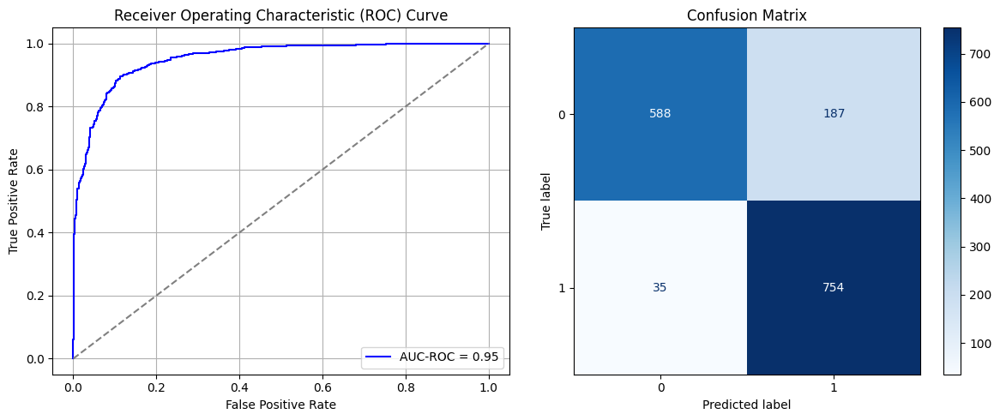

Best threshold based on F1-score: 0.7040166854858398
Time elapsed (performance): 13.751006509000035


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_190"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1330 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1331 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1332 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1333 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1334 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1335 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1336 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - AUC: 0.6732 - loss: 0.7910 - val_AUC: 0.0000e+00 - val_loss: 0.9359
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6693 - loss: 0.6245 - val_AUC: 0.0000e+00 - val_loss: 0.8175
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6860 - loss: 0.6106 - val_AUC: 0.0000e+00 - val_loss: 0.7932
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6817 - loss: 0.6090 - val_AUC: 0.0000e+00 - val_loss: 0.8000
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7267 - loss: 0.5857 - val_AUC: 0.0000e+00 - val_loss: 0.8405
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7080 - loss: 0.6001 - val_AUC: 0.0000e+00 - val_loss: 0.7832
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7179 - loss: 0.5895 - val_AUC: 0.0000e+00 - val_loss: 0.8930
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7381 - loss: 0.5771 - val_AUC: 0.0000e+00 - val_loss: 0.8571
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_191"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1337 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1338 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1339 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1340 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1341 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1342 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1343 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.6730 - loss: 0.7920 - val_AUC: 0.0000e+00 - val_loss: 1.0802
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6615 - loss: 0.6393 - val_AUC: 0.0000e+00 - val_loss: 0.9519
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7053 - loss: 0.6041 - val_AUC: 0.0000e+00 - val_loss: 0.9755
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6915 - loss: 0.6047 - val_AUC: 0.0000e+00 - val_loss: 0.8541
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7168 - loss: 0.5927 - val_AUC: 0.0000e+00 - val_loss: 0.8748
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7111 - loss: 0.5905 - val_AUC: 0.0000e+00 - val_loss: 0.9525
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7188 - loss: 0.5867 - val_AUC: 0.0000e+00 - val_loss: 0.8373
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7428 - loss: 0.5739 - val_AUC: 0.0000e+00 - val_loss: 0.9455
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_192"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1344 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1345 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1346 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1347 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1348 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1349 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1350 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.6672 - loss: 0.8019 - val_AUC: 0.0000e+00 - val_loss: 0.8650
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6749 - loss: 0.6251 - val_AUC: 0.0000e+00 - val_loss: 0.8944
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6836 - loss: 0.6158 - val_AUC: 0.0000e+00 - val_loss: 0.9037
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6806 - loss: 0.6058 - val_AUC: 0.0000e+00 - val_loss: 0.8724
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7224 - loss: 0.5831 - val_AUC: 0.0000e+00 - val_loss: 0.8386
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7195 - loss: 0.5878 - val_AUC: 0.0000e+00 - val_loss: 0.8554
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7179 - loss: 0.5989 - val_AUC: 0.0000e+00 - val_loss: 0.9597
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7256 - loss: 0.5785 - val_AUC: 0.0000e+00 - val_loss: 0.7654
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_193"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1351 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1352 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1353 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1354 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1355 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1356 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1357 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - AUC: 0.6623 - loss: 0.8065 - val_AUC: 0.0000e+00 - val_loss: 0.9379
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.6724 - loss: 0.6309 - val_AUC: 0.0000e+00 - val_loss: 0.8750
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6775 - loss: 0.6093 - val_AUC: 0.0000e+00 - val_loss: 0.9179
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6947 - loss: 0.6065 - val_AUC: 0.0000e+00 - val_loss: 0.9486
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7081 - loss: 0.5996 - val_AUC: 0.0000e+00 - val_loss: 0.9070
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6813 - loss: 0.6059 - val_AUC: 0.0000e+00 - val_loss: 0.8262
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7072 - loss: 0.5950 - val_AUC: 0.0000e+00 - val_loss: 0.9324
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7176 - loss: 0.5992 - val_AUC: 0.0000e+00 - val_loss: 0.9930
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_194"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1358 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1359 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1360 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1361 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1362 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1363 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1364 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - AUC: 0.6732 - loss: 0.7998 - val_AUC: 0.0000e+00 - val_loss: 0.9917
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6873 - loss: 0.6078 - val_AUC: 0.0000e+00 - val_loss: 0.8125
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7043 - loss: 0.5920 - val_AUC: 0.0000e+00 - val_loss: 0.8443
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6933 - loss: 0.6018 - val_AUC: 0.0000e+00 - val_loss: 0.7977
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.6983 - loss: 0.6103 - val_AUC: 0.0000e+00 - val_loss: 0.8922
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7147 - loss: 0.5963 - val_AUC: 0.0000e+00 - val_loss: 0.9319
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7112 - loss: 0.5948 - val_AUC: 0.0000e+00 - val_loss: 0.8418
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7099 - loss: 0.5929 - val_AUC: 0.0000e+00 - val_loss: 0.8508
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_195"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1365 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1366 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1367 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1368 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1369 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1370 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1371 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.6671 - loss: 0.8222 - val_AUC: 0.0000e+00 - val_loss: 0.9744
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.6752 - loss: 0.6138 - val_AUC: 0.0000e+00 - val_loss: 0.7443
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7060 - loss: 0.5990 - val_AUC: 0.0000e+00 - val_loss: 0.8410
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6984 - loss: 0.6094 - val_AUC: 0.0000e+00 - val_loss: 0.9112
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7143 - loss: 0.5906 - val_AUC: 0.0000e+00 - val_loss: 0.8190
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7100 - loss: 0.5916 - val_AUC: 0.0000e+00 - val_loss: 0.9555
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7111 - loss: 0.5938 - val_AUC: 0.0000e+00 - val_loss: 0.8609
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7133 - loss: 0.5830 - val_AUC: 0.0000e+00 - val_loss: 0.7466
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_196"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1372 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1373 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1374 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1375 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1376 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1377 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1378 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - AUC: 0.6727 - loss: 0.8027 - val_AUC: 0.0000e+00 - val_loss: 1.0089
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6676 - loss: 0.6363 - val_AUC: 0.0000e+00 - val_loss: 1.0477
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6964 - loss: 0.6095 - val_AUC: 0.0000e+00 - val_loss: 0.9211
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7051 - loss: 0.6009 - val_AUC: 0.0000e+00 - val_loss: 0.8840
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7101 - loss: 0.5936 - val_AUC: 0.0000e+00 - val_loss: 0.8986
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7230 - loss: 0.5947 - val_AUC: 0.0000e+00 - val_loss: 0.9154
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7001 - loss: 0.5994 - val_AUC: 0.0000e+00 - val_loss: 0.9369
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7339 - loss: 0.5788 - val_AUC: 0.0000e+00 - val_loss: 0.8935
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_197"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1379 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1380 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1381 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1382 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1383 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1384 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1385 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - AUC: 0.6722 - loss: 0.7798 - val_AUC: 0.0000e+00 - val_loss: 0.9731
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6700 - loss: 0.6280 - val_AUC: 0.0000e+00 - val_loss: 0.9440
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7069 - loss: 0.5995 - val_AUC: 0.0000e+00 - val_loss: 0.8549
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7076 - loss: 0.6018 - val_AUC: 0.0000e+00 - val_loss: 0.8719
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7159 - loss: 0.5910 - val_AUC: 0.0000e+00 - val_loss: 0.9258
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7287 - loss: 0.5859 - val_AUC: 0.0000e+00 - val_loss: 0.7917
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7377 - loss: 0.5713 - val_AUC: 0.0000e+00 - val_loss: 0.8170
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7347 - loss: 0.5813 - val_AUC: 0.0000e+00 - val_loss: 0.8180
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_198"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1386 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1387 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1388 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1389 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1390 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1391 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1392 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.6627 - loss: 0.8158 - val_AUC: 0.0000e+00 - val_loss: 1.0035
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.6835 - loss: 0.6059 - val_AUC: 0.0000e+00 - val_loss: 0.8616
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6911 - loss: 0.6096 - val_AUC: 0.0000e+00 - val_loss: 0.9198
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7116 - loss: 0.5901 - val_AUC: 0.0000e+00 - val_loss: 0.8625
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7039 - loss: 0.6013 - val_AUC: 0.0000e+00 - val_loss: 0.8723
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7011 - loss: 0.6002 - val_AUC: 0.0000e+00 - val_loss: 0.9372
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7205 - loss: 0.5901 - val_AUC: 0.0000e+00 - val_loss: 0.8044
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7280 - loss: 0.5833 - val_AUC: 0.0000e+00 - val_loss: 0.8083
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_199"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1393 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1394 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1395 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1396 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1397 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1398 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1399 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - AUC: 0.6601 - loss: 0.8080 - val_AUC: 0.0000e+00 - val_loss: 1.0194
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6752 - loss: 0.6317 - val_AUC: 0.0000e+00 - val_loss: 0.9721
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6837 - loss: 0.6198 - val_AUC: 0.0000e+00 - val_loss: 0.9136
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6909 - loss: 0.6015 - val_AUC: 0.0000e+00 - val_loss: 0.8737
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7101 - loss: 0.5916 - val_AUC: 0.0000e+00 - val_loss: 0.8739
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7285 - loss: 0.5871 - val_AUC: 0.0000e+00 - val_loss: 0.8707
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7341 - loss: 0.5882 - val_AUC: 0.0000e+00 - val_loss: 0.8654
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7301 - loss: 0.5787 - val_AUC: 0.0000e+00 - val_loss: 0.8204
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_200"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1400 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1401 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1402 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1403 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1404 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1405 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1406 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - AUC: 0.6808 - loss: 0.7849 - val_AUC: 0.0000e+00 - val_loss: 0.8594
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6767 - loss: 0.6297 - val_AUC: 0.0000e+00 - val_loss: 0.8868
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6904 - loss: 0.6056 - val_AUC: 0.0000e+00 - val_loss: 0.8947
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6913 - loss: 0.6058 - val_AUC: 0.0000e+00 - val_loss: 0.8863
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7189 - loss: 0.5918 - val_AUC: 0.0000e+00 - val_loss: 0.9066
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7166 - loss: 0.5913 - val_AUC: 0.0000e+00 - val_loss: 0.9047
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7316 - loss: 0.5902 - val_AUC: 0.0000e+00 - val_loss: 0.9171
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7431 - loss: 0.5834 - val_AUC: 0.0000e+00 - val_loss: 1.0535
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_201"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1407 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1408 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1409 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1410 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1411 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1412 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1413 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - AUC: 0.6721 - loss: 0.7983 - val_AUC: 0.0000e+00 - val_loss: 0.9293
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6637 - loss: 0.6328 - val_AUC: 0.0000e+00 - val_loss: 0.8660
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6926 - loss: 0.6082 - val_AUC: 0.0000e+00 - val_loss: 0.8669
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6895 - loss: 0.6062 - val_AUC: 0.0000e+00 - val_loss: 0.8685
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7002 - loss: 0.5976 - val_AUC: 0.0000e+00 - val_loss: 0.8968
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7130 - loss: 0.5915 - val_AUC: 0.0000e+00 - val_loss: 0.9293
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7440 - loss: 0.5799 - val_AUC: 0.0000e+00 - val_loss: 0.8212
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7242 - loss: 0.5872 - val_AUC: 0.0000e+00 - val_loss: 0.9273
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_202"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1414 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1415 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1416 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1417 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1418 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1419 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1420 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - AUC: 0.6607 - loss: 0.8157 - val_AUC: 0.0000e+00 - val_loss: 0.9322
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6502 - loss: 0.6580 - val_AUC: 0.0000e+00 - val_loss: 0.9060
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7169 - loss: 0.5897 - val_AUC: 0.0000e+00 - val_loss: 0.8371
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7186 - loss: 0.5884 - val_AUC: 0.0000e+00 - val_loss: 0.9213
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7104 - loss: 0.6016 - val_AUC: 0.0000e+00 - val_loss: 0.8864
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7233 - loss: 0.5961 - val_AUC: 0.0000e+00 - val_loss: 0.9155
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7227 - loss: 0.5902 - val_AUC: 0.0000e+00 - val_loss: 0.8701
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7272 - loss: 0.5882 - val_AUC: 0.0000e+00 - val_loss: 0.8531
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_203"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1421 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1422 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1423 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1424 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1425 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1426 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1427 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - AUC: 0.6520 - loss: 0.8519 - val_AUC: 0.0000e+00 - val_loss: 1.0090
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6585 - loss: 0.6310 - val_AUC: 0.0000e+00 - val_loss: 0.8105
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6823 - loss: 0.6119 - val_AUC: 0.0000e+00 - val_loss: 0.8802
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7101 - loss: 0.5903 - val_AUC: 0.0000e+00 - val_loss: 0.9053
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6957 - loss: 0.6109 - val_AUC: 0.0000e+00 - val_loss: 0.8900
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7011 - loss: 0.5958 - val_AUC: 0.0000e+00 - val_loss: 0.9123
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7179 - loss: 0.5843 - val_AUC: 0.0000e+00 - val_loss: 0.7760
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7275 - loss: 0.5791 - val_AUC: 0.0000e+00 - val_loss: 0.8503
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_204"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1428 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1429 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1430 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1431 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1432 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1433 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1434 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step - AUC: 0.6637 - loss: 0.8066 - val_AUC: 0.0000e+00 - val_loss: 0.9587
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6772 - loss: 0.6284 - val_AUC: 0.0000e+00 - val_loss: 0.9271
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.6919 - loss: 0.6094 - val_AUC: 0.0000e+00 - val_loss: 0.8534
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7067 - loss: 0.5963 - val_AUC: 0.0000e+00 - val_loss: 0.8632
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6964 - loss: 0.5976 - val_AUC: 0.0000e+00 - val_loss: 0.8624
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7201 - loss: 0.5870 - val_AUC: 0.0000e+00 - val_loss: 0.8788
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7198 - loss: 0.5885 - val_AUC: 0.0000e+00 - val_loss: 0.8484
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7083 - loss: 0.5863 - val_AUC: 0.0000e+00 - val_loss: 0.8423
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_205"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1435 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1436 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1437 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1438 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1439 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1440 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1441 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.6553 - loss: 0.8273 - val_AUC: 0.0000e+00 - val_loss: 1.0396
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6819 - loss: 0.6167 - val_AUC: 0.0000e+00 - val_loss: 0.9184
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6671 - loss: 0.6175 - val_AUC: 0.0000e+00 - val_loss: 0.9021
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6899 - loss: 0.6065 - val_AUC: 0.0000e+00 - val_loss: 0.8297
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7030 - loss: 0.6005 - val_AUC: 0.0000e+00 - val_loss: 0.8780
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7173 - loss: 0.5947 - val_AUC: 0.0000e+00 - val_loss: 0.8606
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7285 - loss: 0.5821 - val_AUC: 0.0000e+00 - val_loss: 0.8382
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7339 - loss: 0.5768 - val_AUC: 0.0000e+00 - val_loss: 0.8618
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_206"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1442 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1443 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1444 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1445 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1446 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1447 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1448 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - AUC: 0.6796 - loss: 0.7799 - val_AUC: 0.0000e+00 - val_loss: 0.9582
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6673 - loss: 0.6277 - val_AUC: 0.0000e+00 - val_loss: 1.0001
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6929 - loss: 0.6134 - val_AUC: 0.0000e+00 - val_loss: 0.9388
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6903 - loss: 0.6106 - val_AUC: 0.0000e+00 - val_loss: 0.9383
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7041 - loss: 0.5953 - val_AUC: 0.0000e+00 - val_loss: 0.8137
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7316 - loss: 0.5812 - val_AUC: 0.0000e+00 - val_loss: 0.7905
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7258 - loss: 0.5963 - val_AUC: 0.0000e+00 - val_loss: 0.9956
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7214 - loss: 0.5819 - val_AUC: 0.0000e+00 - val_loss: 0.8247
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_207"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1449 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1450 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1451 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1452 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1453 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1454 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1455 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - AUC: 0.6500 - loss: 0.8655 - val_AUC: 0.0000e+00 - val_loss: 0.9791
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6731 - loss: 0.6348 - val_AUC: 0.0000e+00 - val_loss: 0.8613
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6978 - loss: 0.6065 - val_AUC: 0.0000e+00 - val_loss: 0.8264
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6906 - loss: 0.6042 - val_AUC: 0.0000e+00 - val_loss: 0.9360
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7053 - loss: 0.5940 - val_AUC: 0.0000e+00 - val_loss: 0.8056
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7137 - loss: 0.5900 - val_AUC: 0.0000e+00 - val_loss: 0.7558
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7011 - loss: 0.5978 - val_AUC: 0.0000e+00 - val_loss: 0.9749
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7234 - loss: 0.5879 - val_AUC: 0.0000e+00 - val_loss: 0.8184
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_208"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1456 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1457 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1458 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1459 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1460 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1461 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1462 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - AUC: 0.6699 - loss: 0.7994 - val_AUC: 0.0000e+00 - val_loss: 0.9287
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6882 - loss: 0.6176 - val_AUC: 0.0000e+00 - val_loss: 0.8263
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6893 - loss: 0.6108 - val_AUC: 0.0000e+00 - val_loss: 0.8805
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6869 - loss: 0.6071 - val_AUC: 0.0000e+00 - val_loss: 0.8756
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7121 - loss: 0.6018 - val_AUC: 0.0000e+00 - val_loss: 0.8950
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6823 - loss: 0.6044 - val_AUC: 0.0000e+00 - val_loss: 0.8467
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7303 - loss: 0.5818 - val_AUC: 0.0000e+00 - val_loss: 0.8796
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7090 - loss: 0.5963 - val_AUC: 0.0000e+00 - val_loss: 0.8983
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_209"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1463 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1464 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1465 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1466 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1467 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1468 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1469 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.6664 - loss: 0.8189 - val_AUC: 0.0000e+00 - val_loss: 1.1028
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6842 - loss: 0.6167 - val_AUC: 0.0000e+00 - val_loss: 0.8286
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7034 - loss: 0.6000 - val_AUC: 0.0000e+00 - val_loss: 0.8510
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6865 - loss: 0.6080 - val_AUC: 0.0000e+00 - val_loss: 0.7895
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7221 - loss: 0.5894 - val_AUC: 0.0000e+00 - val_loss: 0.8353
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7127 - loss: 0.5861 - val_AUC: 0.0000e+00 - val_loss: 0.7521
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7285 - loss: 0.5871 - val_AUC: 0.0000e+00 - val_loss: 0.9130
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7310 - loss: 0.5802 - val_AUC: 0.0000e+00 - val_loss: 0.8258
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step 

In [47]:
times_train = 5
times_fine_tune = 20

FPR = []
FNR = []

for i in range(times_train):
  model_source_SRSwR = create_dnn_model(X_S_train.shape[1])
  train_and_evaluate(model_source_SRSwR, X_S_train, X_S_test, y_S_train, y_S_test, "Source")
  for j in range(times_fine_tune):
    fpr, fnr = fine_tuning(X_T_train_SRSwR, X_T_test, y_T_train_SRSwR, y_T_test, 0, 4)
    FPR.append(fpr)
    FNR.append(fnr)

ParamFit = pd.DataFrame([FPR, FNR]).T
ParamFit.columns=['FPR', 'FNR']

# fine_tuning(X_T_train_SRSwR, X_T_test, y_T_train_SRSwR, y_T_test, 0, 4)

In [48]:
print('Mean:', ParamFit['FNR'].mean())
print('Var:', ParamFit['FNR'].var())

Mean: 0.5688235294117647
Var: 0.009664996851333221


In [49]:
print(ParamFit)
ParamFit.to_csv('SRSwR_Fine_Tuning.csv')

         FPR       FNR
0   0.111535  0.546713
1   0.154433  0.480969
2   0.123928  0.519031
3   0.112488  0.564014
4   0.081030  0.615917
..       ...       ...
95  0.086749  0.598616
96  0.146806  0.463668
97  0.069590  0.622837
98  0.119161  0.522491
99  0.142993  0.477509

[100 rows x 2 columns]


## Systematic Sampling:

First, we select a single systematic sample from the majority class, in which $k = \frac{N_0}{N_1}$, where $N_0$ is the majority class size in the source domain and $N_1$ is the minority class in the source domain.

In [32]:
X_S_Sy, y_S_Sy = systematic_undersampler(data_S_full, data_S_full.iloc[:,-1])
print(y_S_Sy)

X_S_train, X_S_test, y_S_train, y_S_test = train_test_split(X_S_Sy, y_S_Sy, test_size=0.20, random_state=0)
X_T_train, X_T_test, y_T_train, y_T_test = train_test_split(data_T_X, data_T_y, test_size=0.20, random_state=0)
T_train = pd.concat([X_T_train, y_T_train], axis=1)

X_T_train_Sy, y_T_train_Sy = systematic_undersampler(T_train, T_train.iloc[:, -1])
print(y_T_train_Sy)


3910
19400
4.961636828644501
3
[2, 6, 11, 16, 21, 26, 31, 36, 41, 46, 51, 56, 61, 66, 71, 76, 81, 86, 91, 96, 101, 106, 111, 116, 121, 126, 131, 135, 140, 145, 150, 155, 160, 165, 170, 175, 180, 185, 190, 195, 200, 205, 210, 215, 220, 225, 230, 235, 240, 245, 250, 255, 260, 264, 269, 274, 279, 284, 289, 294, 299, 304, 309, 314, 319, 324, 329, 334, 339, 344, 349, 354, 359, 364, 369, 374, 379, 384, 389, 393, 398, 403, 408, 413, 418, 423, 428, 433, 438, 443, 448, 453, 458, 463, 468, 473, 478, 483, 488, 493, 498, 503, 508, 513, 518, 522, 527, 532, 537, 542, 547, 552, 557, 562, 567, 572, 577, 582, 587, 592, 597, 602, 607, 612, 617, 622, 627, 632, 637, 642, 647, 651, 656, 661, 666, 671, 676, 681, 686, 691, 696, 701, 706, 711, 716, 721, 726, 731, 736, 741, 746, 751, 756, 761, 766, 771, 776, 780, 785, 790, 795, 800, 805, 810, 815, 820, 825, 830, 835, 840, 845, 850, 855, 860, 865, 870, 875, 880, 885, 890, 895, 900, 905, 909, 914, 919, 924, 929, 934, 939, 944, 949, 954, 959, 964, 969, 974, 979, 

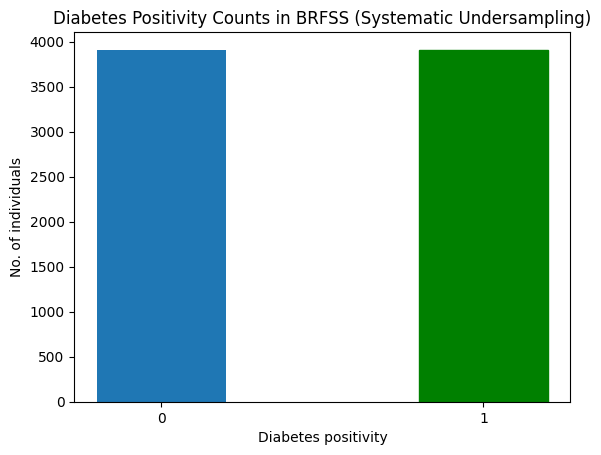

In [33]:
barlist = plt.bar([str(0),str(1)], y_S_Sy.value_counts(), width = 0.4)
barlist[1].set_color('g')

plt.xlabel("Diabetes positivity")
plt.ylabel("No. of individuals")
plt.title("Diabetes Positivity Counts in BRFSS (Systematic Undersampling)")
plt.show()

In [34]:
print('X_S_train:',np.shape(X_S_train))
print('y_S_train:',np.shape(y_S_train))
print('X_S_test:',np.shape(X_S_test))
print('y_S_test:',np.shape(y_S_test))

X_S_train: (6256, 20)
y_S_train: (6256,)
X_S_test: (1564, 20)
y_S_test: (1564,)


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - AUC: 0.5828 - loss: 0.6805 - val_AUC: 0.8006 - val_loss: 0.6153
Epoch 2/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8054 - loss: 0.5410 - val_AUC: 0.8814 - val_loss: 0.5494
Epoch 3/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8486 - loss: 0.4845 - val_AUC: 0.9011 - val_loss: 0.4091
Epoch 4/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8956 - loss: 0.4085 - val_AUC: 0.9199 - val_loss: 0.4187
Epoch 5/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9097 - loss: 0.3832 - val_AUC: 0.9258 - val_loss: 0.3494
Epoch 6/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.9150 - loss: 0.3688 - val_AUC: 0.9334 - val_loss: 0.3652
Epoch 7/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.9221 - loss: 0.3564 - val_AUC: 0.9434 - val_loss: 0.3100
Epoch 8/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9428 - loss: 0.3068 - val_AUC: 0.9415 - val_loss: 0.3117
Epoch 9/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step -

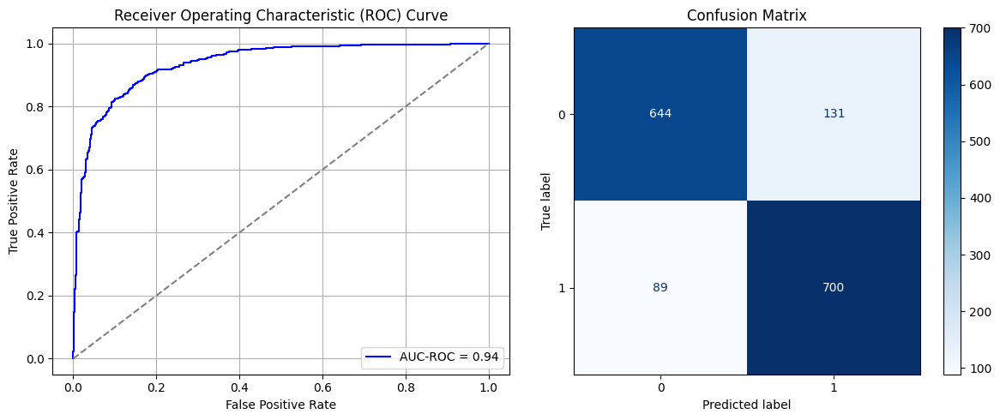

Best threshold based on F1-score: 0.47080761194229126
Time elapsed (performance): 15.447938750000048


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_7 (Dense)                 │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - AUC: 0.7263 - loss: 0.7460 - val_AUC: 0.0000e+00 - val_loss: 0.9308
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7466 - loss: 0.5643 - val_AUC: 0.0000e+00 - val_loss: 0.8642
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7277 - loss: 0.5706 - val_AUC: 0.0000e+00 - val_loss: 0.8442
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7592 - loss: 0.5583 - val_AUC: 0.0000e+00 - val_loss: 0.9083
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7270 - loss: 0.5712 - val_AUC: 0.0000e+00 - val_loss: 0.8159
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7474 - loss: 0.5618 - val_AUC: 0.0000e+00 - val_loss: 0.8029
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7310 - loss: 0.5721 - val_AUC: 0.0000e+00 - val_loss: 0.9411
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7266 - loss: 0.5765 - val_AUC: 0.0000e+00 - val_loss: 0.7833
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_14 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_15 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_16 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_17 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_18 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_19 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_20 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - AUC: 0.7257 - loss: 0.7321 - val_AUC: 0.0000e+00 - val_loss: 0.8568
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7227 - loss: 0.5971 - val_AUC: 0.0000e+00 - val_loss: 0.8380
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7387 - loss: 0.5620 - val_AUC: 0.0000e+00 - val_loss: 0.8371
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7286 - loss: 0.5826 - val_AUC: 0.0000e+00 - val_loss: 0.8207
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7205 - loss: 0.5851 - val_AUC: 0.0000e+00 - val_loss: 0.9361
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7520 - loss: 0.5515 - val_AUC: 0.0000e+00 - val_loss: 0.8170
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7217 - loss: 0.5703 - val_AUC: 0.0000e+00 - val_loss: 0.8298
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7535 - loss: 0.5579 - val_AUC: 0.0000e+00 - val_loss: 0.8334
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_21 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_22 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_23 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_24 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_25 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_26 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_27 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step - AUC: 0.7228 - loss: 0.7260 - val_AUC: 0.0000e+00 - val_loss: 0.8664
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7320 - loss: 0.6006 - val_AUC: 0.0000e+00 - val_loss: 0.8423
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7418 - loss: 0.5643 - val_AUC: 0.0000e+00 - val_loss: 0.6995
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7222 - loss: 0.5912 - val_AUC: 0.0000e+00 - val_loss: 0.8703
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7273 - loss: 0.5795 - val_AUC: 0.0000e+00 - val_loss: 0.8576
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7498 - loss: 0.5589 - val_AUC: 0.0000e+00 - val_loss: 0.7403
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7288 - loss: 0.5837 - val_AUC: 0.0000e+00 - val_loss: 0.9482
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7380 - loss: 0.5657 - val_AUC: 0.0000e+00 - val_loss: 0.7965
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_28 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_29 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_30 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_31 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_32 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_33 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_34 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7328 - loss: 0.7146 - val_AUC: 0.0000e+00 - val_loss: 0.9771
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7509 - loss: 0.5703 - val_AUC: 0.0000e+00 - val_loss: 0.8745
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7307 - loss: 0.5779 - val_AUC: 0.0000e+00 - val_loss: 0.9959
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7159 - loss: 0.5868 - val_AUC: 0.0000e+00 - val_loss: 0.8261
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7558 - loss: 0.5493 - val_AUC: 0.0000e+00 - val_loss: 0.7431
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7286 - loss: 0.5740 - val_AUC: 0.0000e+00 - val_loss: 0.7473
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7202 - loss: 0.5744 - val_AUC: 0.0000e+00 - val_loss: 0.7279
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7292 - loss: 0.5828 - val_AUC: 0.0000e+00 - val_loss: 0.7624
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_35 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_36 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_37 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_38 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_39 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_40 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_41 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7167 - loss: 0.7782 - val_AUC: 0.0000e+00 - val_loss: 0.9951
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7164 - loss: 0.6164 - val_AUC: 0.0000e+00 - val_loss: 0.7977
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7348 - loss: 0.5702 - val_AUC: 0.0000e+00 - val_loss: 0.9309
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7375 - loss: 0.5673 - val_AUC: 0.0000e+00 - val_loss: 0.8404
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7385 - loss: 0.5753 - val_AUC: 0.0000e+00 - val_loss: 0.7667
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7580 - loss: 0.5590 - val_AUC: 0.0000e+00 - val_loss: 0.8317
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7438 - loss: 0.5652 - val_AUC: 0.0000e+00 - val_loss: 0.7861
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7387 - loss: 0.5539 - val_AUC: 0.0000e+00 - val_loss: 0.7288
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_42 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_43 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_44 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_45 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_46 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_47 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_48 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step - AUC: 0.7272 - loss: 0.7325 - val_AUC: 0.0000e+00 - val_loss: 0.8613
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7435 - loss: 0.5812 - val_AUC: 0.0000e+00 - val_loss: 0.7055
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7277 - loss: 0.5830 - val_AUC: 0.0000e+00 - val_loss: 0.9217
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7518 - loss: 0.5537 - val_AUC: 0.0000e+00 - val_loss: 0.8697
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7356 - loss: 0.5648 - val_AUC: 0.0000e+00 - val_loss: 0.8575
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7383 - loss: 0.5755 - val_AUC: 0.0000e+00 - val_loss: 0.9037
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7466 - loss: 0.5589 - val_AUC: 0.0000e+00 - val_loss: 0.8403
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7370 - loss: 0.5735 - val_AUC: 0.0000e+00 - val_loss: 0.7431
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_49 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_50 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_51 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_52 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_53 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_54 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_55 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7452 - loss: 0.6952 - val_AUC: 0.0000e+00 - val_loss: 0.9604
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7318 - loss: 0.6030 - val_AUC: 0.0000e+00 - val_loss: 0.9110
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7377 - loss: 0.5737 - val_AUC: 0.0000e+00 - val_loss: 0.8633
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7295 - loss: 0.5744 - val_AUC: 0.0000e+00 - val_loss: 0.8562
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7367 - loss: 0.5759 - val_AUC: 0.0000e+00 - val_loss: 0.9058
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7602 - loss: 0.5530 - val_AUC: 0.0000e+00 - val_loss: 0.8386
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7195 - loss: 0.5737 - val_AUC: 0.0000e+00 - val_loss: 0.8299
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7298 - loss: 0.5719 - val_AUC: 0.0000e+00 - val_loss: 0.7501
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_56 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_57 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_58 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_59 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_60 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_61 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_62 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7365 - loss: 0.7049 - val_AUC: 0.0000e+00 - val_loss: 0.8693
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7365 - loss: 0.5812 - val_AUC: 0.0000e+00 - val_loss: 0.9491
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7346 - loss: 0.5781 - val_AUC: 0.0000e+00 - val_loss: 0.8275
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7423 - loss: 0.5666 - val_AUC: 0.0000e+00 - val_loss: 0.8683
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7596 - loss: 0.5533 - val_AUC: 0.0000e+00 - val_loss: 0.8125
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7398 - loss: 0.5653 - val_AUC: 0.0000e+00 - val_loss: 0.8612
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7471 - loss: 0.5634 - val_AUC: 0.0000e+00 - val_loss: 0.8704
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7691 - loss: 0.5347 - val_AUC: 0.0000e+00 - val_loss: 0.8473
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_63 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_64 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_65 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_66 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_67 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_68 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_69 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7082 - loss: 0.7927 - val_AUC: 0.0000e+00 - val_loss: 0.8667
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7029 - loss: 0.6060 - val_AUC: 0.0000e+00 - val_loss: 0.8354
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7337 - loss: 0.5670 - val_AUC: 0.0000e+00 - val_loss: 0.7707
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7095 - loss: 0.5899 - val_AUC: 0.0000e+00 - val_loss: 0.8172
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7454 - loss: 0.5656 - val_AUC: 0.0000e+00 - val_loss: 0.7412
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7516 - loss: 0.5660 - val_AUC: 0.0000e+00 - val_loss: 0.9445
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7255 - loss: 0.5861 - val_AUC: 0.0000e+00 - val_loss: 0.8415
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7465 - loss: 0.5658 - val_AUC: 0.0000e+00 - val_loss: 0.9828
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_10"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_70 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_71 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_72 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_73 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_74 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_75 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_76 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step - AUC: 0.7232 - loss: 0.7447 - val_AUC: 0.0000e+00 - val_loss: 0.9024
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7261 - loss: 0.6032 - val_AUC: 0.0000e+00 - val_loss: 0.7701
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7242 - loss: 0.5710 - val_AUC: 0.0000e+00 - val_loss: 0.8179
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7523 - loss: 0.5655 - val_AUC: 0.0000e+00 - val_loss: 0.9179
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7228 - loss: 0.5898 - val_AUC: 0.0000e+00 - val_loss: 0.7959
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7424 - loss: 0.5558 - val_AUC: 0.0000e+00 - val_loss: 0.7226
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7363 - loss: 0.5798 - val_AUC: 0.0000e+00 - val_loss: 0.8783
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7504 - loss: 0.5499 - val_AUC: 0.0000e+00 - val_loss: 0.8469
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_77 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_78 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_79 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_80 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_81 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_82 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_83 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7010 - loss: 0.7992 - val_AUC: 0.0000e+00 - val_loss: 0.9634
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7517 - loss: 0.5838 - val_AUC: 0.0000e+00 - val_loss: 0.8146
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7223 - loss: 0.5812 - val_AUC: 0.0000e+00 - val_loss: 0.8480
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7276 - loss: 0.5758 - val_AUC: 0.0000e+00 - val_loss: 0.8448
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7371 - loss: 0.5757 - val_AUC: 0.0000e+00 - val_loss: 0.9755
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7312 - loss: 0.5698 - val_AUC: 0.0000e+00 - val_loss: 0.9448
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7578 - loss: 0.5452 - val_AUC: 0.0000e+00 - val_loss: 0.8010
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7387 - loss: 0.5735 - val_AUC: 0.0000e+00 - val_loss: 0.8139
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_12"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_84 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_85 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_86 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_87 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_88 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_89 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_90 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - AUC: 0.7256 - loss: 0.7464 - val_AUC: 0.0000e+00 - val_loss: 0.9260
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7334 - loss: 0.5940 - val_AUC: 0.0000e+00 - val_loss: 0.7935
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7331 - loss: 0.5796 - val_AUC: 0.0000e+00 - val_loss: 0.8088
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7307 - loss: 0.5784 - val_AUC: 0.0000e+00 - val_loss: 0.9527
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7259 - loss: 0.5718 - val_AUC: 0.0000e+00 - val_loss: 0.7924
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7432 - loss: 0.5649 - val_AUC: 0.0000e+00 - val_loss: 0.7984
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7581 - loss: 0.5524 - val_AUC: 0.0000e+00 - val_loss: 0.9138
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7501 - loss: 0.5525 - val_AUC: 0.0000e+00 - val_loss: 0.7969
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_13"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_91 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_92 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_93 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_94 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_95 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_96 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_97 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - AUC: 0.7422 - loss: 0.7237 - val_AUC: 0.0000e+00 - val_loss: 0.8839
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7225 - loss: 0.6184 - val_AUC: 0.0000e+00 - val_loss: 0.8523
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7283 - loss: 0.5876 - val_AUC: 0.0000e+00 - val_loss: 0.9764
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7189 - loss: 0.5906 - val_AUC: 0.0000e+00 - val_loss: 0.8729
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7413 - loss: 0.5719 - val_AUC: 0.0000e+00 - val_loss: 0.9324
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7361 - loss: 0.5757 - val_AUC: 0.0000e+00 - val_loss: 0.8574
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7352 - loss: 0.5772 - val_AUC: 0.0000e+00 - val_loss: 0.8230
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7507 - loss: 0.5572 - val_AUC: 0.0000e+00 - val_loss: 0.8618
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_14"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_98 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_99 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_100 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_101 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_102 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_103 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_104 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7524 - loss: 0.6797 - val_AUC: 0.0000e+00 - val_loss: 0.9510
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7130 - loss: 0.5907 - val_AUC: 0.0000e+00 - val_loss: 0.9044
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7522 - loss: 0.5671 - val_AUC: 0.0000e+00 - val_loss: 0.8119
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7350 - loss: 0.5766 - val_AUC: 0.0000e+00 - val_loss: 0.8347
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7228 - loss: 0.5796 - val_AUC: 0.0000e+00 - val_loss: 0.8262
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7622 - loss: 0.5486 - val_AUC: 0.0000e+00 - val_loss: 0.7984
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7427 - loss: 0.5653 - val_AUC: 0.0000e+00 - val_loss: 0.7677
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7547 - loss: 0.5546 - val_AUC: 0.0000e+00 - val_loss: 0.8345
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_15"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_105 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_106 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_107 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_108 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_109 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_110 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_111 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - AUC: 0.7159 - loss: 0.7406 - val_AUC: 0.0000e+00 - val_loss: 0.9993
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7309 - loss: 0.5964 - val_AUC: 0.0000e+00 - val_loss: 0.9636
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7439 - loss: 0.5699 - val_AUC: 0.0000e+00 - val_loss: 0.8955
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7488 - loss: 0.5606 - val_AUC: 0.0000e+00 - val_loss: 0.8252
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7289 - loss: 0.5661 - val_AUC: 0.0000e+00 - val_loss: 0.8989
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7290 - loss: 0.5783 - val_AUC: 0.0000e+00 - val_loss: 0.7892
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7646 - loss: 0.5360 - val_AUC: 0.0000e+00 - val_loss: 0.8282
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7628 - loss: 0.5493 - val_AUC: 0.0000e+00 - val_loss: 0.7635
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_112 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_113 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_114 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_115 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_116 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_117 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_118 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step - AUC: 0.7337 - loss: 0.7123 - val_AUC: 0.0000e+00 - val_loss: 0.8861
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7224 - loss: 0.6043 - val_AUC: 0.0000e+00 - val_loss: 0.8383
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7262 - loss: 0.5807 - val_AUC: 0.0000e+00 - val_loss: 1.0055
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7444 - loss: 0.5666 - val_AUC: 0.0000e+00 - val_loss: 0.7828
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7247 - loss: 0.5835 - val_AUC: 0.0000e+00 - val_loss: 0.8960
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7315 - loss: 0.5766 - val_AUC: 0.0000e+00 - val_loss: 0.8969
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7254 - loss: 0.5804 - val_AUC: 0.0000e+00 - val_loss: 0.8551
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7472 - loss: 0.5574 - val_AUC: 0.0000e+00 - val_loss: 0.8117
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_17"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_119 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_120 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_121 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_122 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_123 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_124 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_125 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - AUC: 0.7120 - loss: 0.7402 - val_AUC: 0.0000e+00 - val_loss: 0.9564
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7329 - loss: 0.5808 - val_AUC: 0.0000e+00 - val_loss: 0.7767
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7278 - loss: 0.5898 - val_AUC: 0.0000e+00 - val_loss: 0.9572
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7399 - loss: 0.5572 - val_AUC: 0.0000e+00 - val_loss: 0.7311
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7489 - loss: 0.5624 - val_AUC: 0.0000e+00 - val_loss: 0.8574
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7571 - loss: 0.5699 - val_AUC: 0.0000e+00 - val_loss: 0.8734
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7395 - loss: 0.5636 - val_AUC: 0.0000e+00 - val_loss: 0.7826
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7509 - loss: 0.5571 - val_AUC: 0.0000e+00 - val_loss: 0.6824
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_18"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_126 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_127 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_128 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_129 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_130 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_131 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_132 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7411 - loss: 0.7161 - val_AUC: 0.0000e+00 - val_loss: 0.9396
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7383 - loss: 0.5812 - val_AUC: 0.0000e+00 - val_loss: 0.7946
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7250 - loss: 0.5758 - val_AUC: 0.0000e+00 - val_loss: 0.9269
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7263 - loss: 0.5787 - val_AUC: 0.0000e+00 - val_loss: 0.7826
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7582 - loss: 0.5610 - val_AUC: 0.0000e+00 - val_loss: 0.9414
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7371 - loss: 0.5641 - val_AUC: 0.0000e+00 - val_loss: 0.8768
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7341 - loss: 0.5688 - val_AUC: 0.0000e+00 - val_loss: 0.8275
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7495 - loss: 0.5536 - val_AUC: 0.0000e+00 - val_loss: 0.8580
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_19"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_133 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_134 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_135 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_136 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_137 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_138 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_139 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7092 - loss: 0.7884 - val_AUC: 0.0000e+00 - val_loss: 0.9244
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7319 - loss: 0.6050 - val_AUC: 0.0000e+00 - val_loss: 0.8329
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7297 - loss: 0.5796 - val_AUC: 0.0000e+00 - val_loss: 0.9121
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7482 - loss: 0.5678 - val_AUC: 0.0000e+00 - val_loss: 0.8241
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7321 - loss: 0.5649 - val_AUC: 0.0000e+00 - val_loss: 0.7703
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7486 - loss: 0.5711 - val_AUC: 0.0000e+00 - val_loss: 0.9556
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7579 - loss: 0.5567 - val_AUC: 0.0000e+00 - val_loss: 0.7531
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7415 - loss: 0.5622 - val_AUC: 0.0000e+00 - val_loss: 0.8167
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_20"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_140 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_141 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_142 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_143 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_144 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_145 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_146 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - AUC: 0.7242 - loss: 0.7460 - val_AUC: 0.0000e+00 - val_loss: 0.9393
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7369 - loss: 0.5819 - val_AUC: 0.0000e+00 - val_loss: 0.8300
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7149 - loss: 0.5944 - val_AUC: 0.0000e+00 - val_loss: 0.8978
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7491 - loss: 0.5559 - val_AUC: 0.0000e+00 - val_loss: 0.7659
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7501 - loss: 0.5510 - val_AUC: 0.0000e+00 - val_loss: 0.8513
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7480 - loss: 0.5665 - val_AUC: 0.0000e+00 - val_loss: 0.9056
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7637 - loss: 0.5503 - val_AUC: 0.0000e+00 - val_loss: 0.8150
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7394 - loss: 0.5647 - val_AUC: 0.0000e+00 - val_loss: 0.8636
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_21"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_147 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_148 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_149 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_150 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_151 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_152 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_153 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 6s 17ms/step - AUC: 0.6505 - loss: 0.6641 - val_AUC: 0.8183 - val_loss: 0.5383
Epoch 2/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.8379 - loss: 0.5023 - val_AUC: 0.8958 - val_loss: 0.5135
Epoch 3/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8880 - loss: 0.4214 - val_AUC: 0.9148 - val_loss: 0.4045
Epoch 4/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.9053 - loss: 0.3931 - val_AUC: 0.9297 - val_loss: 0.3528
Epoch 5/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.9275 - loss: 0.3441 - val_AUC: 0.9408 - val_loss: 0.3617
Epoch 6/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.9312 - loss: 0.3374 - val_AUC: 0.9430 - val_loss: 0.3643
Epoch 7/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9304 - loss: 0.3380 - val_AUC: 0.9499 - val_loss: 0.2966
Epoch 8/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.9509 - loss: 0.2832 - val_AUC: 0.9532 - val_loss: 0.2771
Epoch 9/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step -

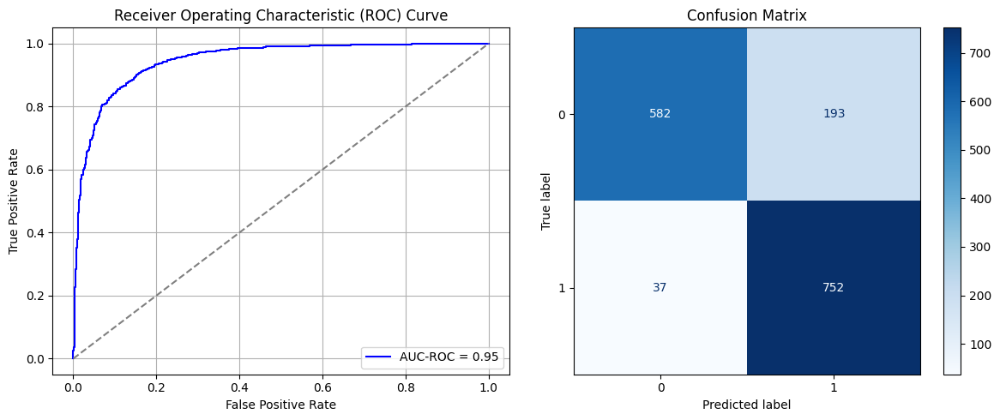

Best threshold based on F1-score: 0.6650906801223755
Time elapsed (performance): 12.30374467699994


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_22"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_154 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_155 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_156 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_157 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_158 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_159 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_160 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - AUC: 0.7052 - loss: 0.6787 - val_AUC: 0.0000e+00 - val_loss: 0.8991
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7310 - loss: 0.5788 - val_AUC: 0.0000e+00 - val_loss: 0.8848
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7013 - loss: 0.5923 - val_AUC: 0.0000e+00 - val_loss: 0.7166
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7302 - loss: 0.5705 - val_AUC: 0.0000e+00 - val_loss: 0.8313
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7077 - loss: 0.5881 - val_AUC: 0.0000e+00 - val_loss: 0.9121
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7198 - loss: 0.5758 - val_AUC: 0.0000e+00 - val_loss: 0.7104
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7481 - loss: 0.5653 - val_AUC: 0.0000e+00 - val_loss: 0.9041
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7489 - loss: 0.5676 - val_AUC: 0.0000e+00 - val_loss: 0.8959
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_23"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_161 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_162 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_163 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_164 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_165 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_166 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_167 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7039 - loss: 0.6772 - val_AUC: 0.0000e+00 - val_loss: 0.8923
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7026 - loss: 0.6023 - val_AUC: 0.0000e+00 - val_loss: 0.7438
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6946 - loss: 0.5920 - val_AUC: 0.0000e+00 - val_loss: 0.7111
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7162 - loss: 0.5837 - val_AUC: 0.0000e+00 - val_loss: 0.7971
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7394 - loss: 0.5562 - val_AUC: 0.0000e+00 - val_loss: 0.8210
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7317 - loss: 0.5722 - val_AUC: 0.0000e+00 - val_loss: 0.9400
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7408 - loss: 0.5718 - val_AUC: 0.0000e+00 - val_loss: 0.7947
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7418 - loss: 0.5568 - val_AUC: 0.0000e+00 - val_loss: 0.7790
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_24"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_168 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_169 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_170 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_171 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_172 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_173 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_174 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step - AUC: 0.7019 - loss: 0.6776 - val_AUC: 0.0000e+00 - val_loss: 1.0088
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7070 - loss: 0.5859 - val_AUC: 0.0000e+00 - val_loss: 0.7954
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7160 - loss: 0.5743 - val_AUC: 0.0000e+00 - val_loss: 0.8019
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7365 - loss: 0.5700 - val_AUC: 0.0000e+00 - val_loss: 0.8938
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7252 - loss: 0.5675 - val_AUC: 0.0000e+00 - val_loss: 0.7228
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7271 - loss: 0.5740 - val_AUC: 0.0000e+00 - val_loss: 0.7694
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7513 - loss: 0.5509 - val_AUC: 0.0000e+00 - val_loss: 0.8276
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7375 - loss: 0.5669 - val_AUC: 0.0000e+00 - val_loss: 0.8487
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_25"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_175 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_176 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_177 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_178 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_179 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_180 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_181 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7040 - loss: 0.6513 - val_AUC: 0.0000e+00 - val_loss: 0.8996
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7162 - loss: 0.5825 - val_AUC: 0.0000e+00 - val_loss: 0.7849
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7143 - loss: 0.5800 - val_AUC: 0.0000e+00 - val_loss: 0.8734
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7350 - loss: 0.5634 - val_AUC: 0.0000e+00 - val_loss: 0.7874
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7382 - loss: 0.5642 - val_AUC: 0.0000e+00 - val_loss: 0.8011
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7291 - loss: 0.5668 - val_AUC: 0.0000e+00 - val_loss: 0.7428
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7334 - loss: 0.5674 - val_AUC: 0.0000e+00 - val_loss: 0.8273
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7143 - loss: 0.5731 - val_AUC: 0.0000e+00 - val_loss: 0.8614
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_26"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_182 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_183 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_184 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_185 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_186 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_187 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_188 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7153 - loss: 0.6519 - val_AUC: 0.0000e+00 - val_loss: 0.8577
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7306 - loss: 0.5660 - val_AUC: 0.0000e+00 - val_loss: 0.7399
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7182 - loss: 0.5770 - val_AUC: 0.0000e+00 - val_loss: 0.7818
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7154 - loss: 0.5796 - val_AUC: 0.0000e+00 - val_loss: 0.9244
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6967 - loss: 0.5986 - val_AUC: 0.0000e+00 - val_loss: 0.9372
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7195 - loss: 0.5773 - val_AUC: 0.0000e+00 - val_loss: 0.8581
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7501 - loss: 0.5566 - val_AUC: 0.0000e+00 - val_loss: 0.9782
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7313 - loss: 0.5728 - val_AUC: 0.0000e+00 - val_loss: 0.7993
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_27"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_189 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_190 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_191 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_192 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_193 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_194 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_195 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - AUC: 0.7092 - loss: 0.6484 - val_AUC: 0.0000e+00 - val_loss: 0.8355
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7148 - loss: 0.5815 - val_AUC: 0.0000e+00 - val_loss: 0.7755
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7235 - loss: 0.5735 - val_AUC: 0.0000e+00 - val_loss: 0.8042
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6829 - loss: 0.5850 - val_AUC: 0.0000e+00 - val_loss: 0.8553
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7185 - loss: 0.5712 - val_AUC: 0.0000e+00 - val_loss: 0.8815
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7379 - loss: 0.5595 - val_AUC: 0.0000e+00 - val_loss: 0.8156
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7488 - loss: 0.5567 - val_AUC: 0.0000e+00 - val_loss: 0.8979
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7184 - loss: 0.5841 - val_AUC: 0.0000e+00 - val_loss: 0.7741
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_28"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_196 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_197 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_198 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_199 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_200 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_201 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_202 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.6925 - loss: 0.6986 - val_AUC: 0.0000e+00 - val_loss: 0.9365
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7155 - loss: 0.5864 - val_AUC: 0.0000e+00 - val_loss: 0.7961
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7129 - loss: 0.5873 - val_AUC: 0.0000e+00 - val_loss: 0.8317
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7246 - loss: 0.5781 - val_AUC: 0.0000e+00 - val_loss: 0.8668
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7330 - loss: 0.5667 - val_AUC: 0.0000e+00 - val_loss: 0.8298
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7358 - loss: 0.5630 - val_AUC: 0.0000e+00 - val_loss: 0.7498
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7319 - loss: 0.5788 - val_AUC: 0.0000e+00 - val_loss: 0.8714
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7366 - loss: 0.5682 - val_AUC: 0.0000e+00 - val_loss: 0.7693
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_29"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_203 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_204 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_205 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_206 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_207 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_208 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_209 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7086 - loss: 0.6783 - val_AUC: 0.0000e+00 - val_loss: 0.8716
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7135 - loss: 0.5928 - val_AUC: 0.0000e+00 - val_loss: 0.8317
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7229 - loss: 0.5813 - val_AUC: 0.0000e+00 - val_loss: 0.8417
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7254 - loss: 0.5801 - val_AUC: 0.0000e+00 - val_loss: 0.9949
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7287 - loss: 0.5762 - val_AUC: 0.0000e+00 - val_loss: 0.8577
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7367 - loss: 0.5685 - val_AUC: 0.0000e+00 - val_loss: 0.7466
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7126 - loss: 0.5871 - val_AUC: 0.0000e+00 - val_loss: 0.8138
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7129 - loss: 0.5724 - val_AUC: 0.0000e+00 - val_loss: 0.8036
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_30"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_210 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_211 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_212 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_213 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_214 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_215 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_216 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7191 - loss: 0.6535 - val_AUC: 0.0000e+00 - val_loss: 0.8207
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7168 - loss: 0.5871 - val_AUC: 0.0000e+00 - val_loss: 0.8682
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7315 - loss: 0.5719 - val_AUC: 0.0000e+00 - val_loss: 0.8115
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7208 - loss: 0.5787 - val_AUC: 0.0000e+00 - val_loss: 0.7256
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7291 - loss: 0.5729 - val_AUC: 0.0000e+00 - val_loss: 0.8384
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7333 - loss: 0.5666 - val_AUC: 0.0000e+00 - val_loss: 0.8522
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7428 - loss: 0.5561 - val_AUC: 0.0000e+00 - val_loss: 0.6951
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7344 - loss: 0.5610 - val_AUC: 0.0000e+00 - val_loss: 0.9097
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_31"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_217 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_218 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_219 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_220 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_221 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_222 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_223 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - AUC: 0.6931 - loss: 0.6877 - val_AUC: 0.0000e+00 - val_loss: 0.8846
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7100 - loss: 0.5990 - val_AUC: 0.0000e+00 - val_loss: 0.8005
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7199 - loss: 0.5794 - val_AUC: 0.0000e+00 - val_loss: 0.7326
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7163 - loss: 0.5795 - val_AUC: 0.0000e+00 - val_loss: 0.8309
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7319 - loss: 0.5768 - val_AUC: 0.0000e+00 - val_loss: 0.8533
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7313 - loss: 0.5675 - val_AUC: 0.0000e+00 - val_loss: 0.8043
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7300 - loss: 0.5709 - val_AUC: 0.0000e+00 - val_loss: 0.7909
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7364 - loss: 0.5699 - val_AUC: 0.0000e+00 - val_loss: 0.8128
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_32"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_224 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_225 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_226 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_227 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_228 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_229 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_230 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7058 - loss: 0.6689 - val_AUC: 0.0000e+00 - val_loss: 0.8444
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7154 - loss: 0.5838 - val_AUC: 0.0000e+00 - val_loss: 0.8315
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7208 - loss: 0.5745 - val_AUC: 0.0000e+00 - val_loss: 0.8641
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7220 - loss: 0.5773 - val_AUC: 0.0000e+00 - val_loss: 0.7948
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7097 - loss: 0.5809 - val_AUC: 0.0000e+00 - val_loss: 0.8476
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7097 - loss: 0.5847 - val_AUC: 0.0000e+00 - val_loss: 0.8250
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7315 - loss: 0.5620 - val_AUC: 0.0000e+00 - val_loss: 0.8400
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7266 - loss: 0.5857 - val_AUC: 0.0000e+00 - val_loss: 0.8926
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_33"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_231 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_232 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_233 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_234 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_235 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_236 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_237 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7082 - loss: 0.6601 - val_AUC: 0.0000e+00 - val_loss: 0.9646
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7278 - loss: 0.5829 - val_AUC: 0.0000e+00 - val_loss: 0.9748
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7186 - loss: 0.5713 - val_AUC: 0.0000e+00 - val_loss: 0.8378
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7015 - loss: 0.5790 - val_AUC: 0.0000e+00 - val_loss: 0.8211
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7148 - loss: 0.5736 - val_AUC: 0.0000e+00 - val_loss: 0.8101
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7245 - loss: 0.5679 - val_AUC: 0.0000e+00 - val_loss: 0.8725
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7349 - loss: 0.5728 - val_AUC: 0.0000e+00 - val_loss: 0.8340
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7241 - loss: 0.5717 - val_AUC: 0.0000e+00 - val_loss: 0.8152
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_34"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_238 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_239 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_240 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_241 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_242 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_243 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_244 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - AUC: 0.6825 - loss: 0.6972 - val_AUC: 0.0000e+00 - val_loss: 0.9831
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7149 - loss: 0.5849 - val_AUC: 0.0000e+00 - val_loss: 0.8537
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7027 - loss: 0.5874 - val_AUC: 0.0000e+00 - val_loss: 0.7562
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7165 - loss: 0.5838 - val_AUC: 0.0000e+00 - val_loss: 0.8258
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7224 - loss: 0.5734 - val_AUC: 0.0000e+00 - val_loss: 0.7528
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7425 - loss: 0.5611 - val_AUC: 0.0000e+00 - val_loss: 0.7615
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7284 - loss: 0.5634 - val_AUC: 0.0000e+00 - val_loss: 0.8083
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7237 - loss: 0.5875 - val_AUC: 0.0000e+00 - val_loss: 0.8629
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_35"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_245 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_246 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_247 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_248 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_249 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_250 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_251 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7114 - loss: 0.6448 - val_AUC: 0.0000e+00 - val_loss: 0.9886
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7029 - loss: 0.5965 - val_AUC: 0.0000e+00 - val_loss: 0.8541
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7003 - loss: 0.5783 - val_AUC: 0.0000e+00 - val_loss: 0.8539
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7427 - loss: 0.5579 - val_AUC: 0.0000e+00 - val_loss: 0.7603
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7168 - loss: 0.5791 - val_AUC: 0.0000e+00 - val_loss: 0.7448
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7293 - loss: 0.5740 - val_AUC: 0.0000e+00 - val_loss: 0.9434
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7183 - loss: 0.5915 - val_AUC: 0.0000e+00 - val_loss: 0.8372
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7352 - loss: 0.5495 - val_AUC: 0.0000e+00 - val_loss: 0.7676
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_36"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_252 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_253 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_254 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_255 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_256 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_257 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_258 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7120 - loss: 0.6637 - val_AUC: 0.0000e+00 - val_loss: 0.9047
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7014 - loss: 0.6041 - val_AUC: 0.0000e+00 - val_loss: 0.7931
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7172 - loss: 0.5793 - val_AUC: 0.0000e+00 - val_loss: 0.7693
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7082 - loss: 0.5853 - val_AUC: 0.0000e+00 - val_loss: 0.7864
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7281 - loss: 0.5675 - val_AUC: 0.0000e+00 - val_loss: 0.8559
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7387 - loss: 0.5590 - val_AUC: 0.0000e+00 - val_loss: 0.8898
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7451 - loss: 0.5664 - val_AUC: 0.0000e+00 - val_loss: 0.8926
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7092 - loss: 0.5901 - val_AUC: 0.0000e+00 - val_loss: 0.8175
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_37"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_259 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_260 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_261 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_262 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_263 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_264 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_265 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 5s 41ms/step - AUC: 0.6921 - loss: 0.6820 - val_AUC: 0.0000e+00 - val_loss: 0.8124
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7288 - loss: 0.5740 - val_AUC: 0.0000e+00 - val_loss: 0.9076
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7170 - loss: 0.5761 - val_AUC: 0.0000e+00 - val_loss: 0.8678
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7088 - loss: 0.5826 - val_AUC: 0.0000e+00 - val_loss: 0.7896
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7234 - loss: 0.5745 - val_AUC: 0.0000e+00 - val_loss: 0.7921
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7213 - loss: 0.5689 - val_AUC: 0.0000e+00 - val_loss: 0.8209
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7123 - loss: 0.5743 - val_AUC: 0.0000e+00 - val_loss: 0.9168
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7304 - loss: 0.5660 - val_AUC: 0.0000e+00 - val_loss: 0.7902
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_38"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_266 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_267 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_268 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_269 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_270 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_271 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_272 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - AUC: 0.6932 - loss: 0.6850 - val_AUC: 0.0000e+00 - val_loss: 0.9625
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7050 - loss: 0.6035 - val_AUC: 0.0000e+00 - val_loss: 0.8609
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7170 - loss: 0.5822 - val_AUC: 0.0000e+00 - val_loss: 0.9066
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7205 - loss: 0.5785 - val_AUC: 0.0000e+00 - val_loss: 0.8163
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7257 - loss: 0.5724 - val_AUC: 0.0000e+00 - val_loss: 0.8012
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7224 - loss: 0.5804 - val_AUC: 0.0000e+00 - val_loss: 0.8692
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7225 - loss: 0.5753 - val_AUC: 0.0000e+00 - val_loss: 0.7896
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7148 - loss: 0.5846 - val_AUC: 0.0000e+00 - val_loss: 0.7999
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_39"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_273 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_274 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_275 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_276 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_277 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_278 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_279 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - AUC: 0.7162 - loss: 0.6502 - val_AUC: 0.0000e+00 - val_loss: 0.7841
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7130 - loss: 0.5884 - val_AUC: 0.0000e+00 - val_loss: 0.9003
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6959 - loss: 0.5958 - val_AUC: 0.0000e+00 - val_loss: 0.8752
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7186 - loss: 0.5841 - val_AUC: 0.0000e+00 - val_loss: 0.7622
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7088 - loss: 0.5837 - val_AUC: 0.0000e+00 - val_loss: 0.8897
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7199 - loss: 0.5778 - val_AUC: 0.0000e+00 - val_loss: 0.9376
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7511 - loss: 0.5604 - val_AUC: 0.0000e+00 - val_loss: 0.8494
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7412 - loss: 0.5669 - val_AUC: 0.0000e+00 - val_loss: 0.8419
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_40"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_280 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_281 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_282 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_283 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_284 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_285 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_286 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - AUC: 0.7022 - loss: 0.6813 - val_AUC: 0.0000e+00 - val_loss: 0.9653
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7230 - loss: 0.5754 - val_AUC: 0.0000e+00 - val_loss: 0.8171
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7205 - loss: 0.5736 - val_AUC: 0.0000e+00 - val_loss: 0.7452
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7162 - loss: 0.5839 - val_AUC: 0.0000e+00 - val_loss: 0.9805
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6872 - loss: 0.5979 - val_AUC: 0.0000e+00 - val_loss: 0.7689
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7388 - loss: 0.5619 - val_AUC: 0.0000e+00 - val_loss: 0.7510
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7240 - loss: 0.5855 - val_AUC: 0.0000e+00 - val_loss: 0.7655
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7616 - loss: 0.5480 - val_AUC: 0.0000e+00 - val_loss: 0.7771
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_41"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_287 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_288 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_289 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_290 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_291 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_292 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_293 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.6993 - loss: 0.6978 - val_AUC: 0.0000e+00 - val_loss: 0.9388
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7206 - loss: 0.5865 - val_AUC: 0.0000e+00 - val_loss: 0.8373
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7162 - loss: 0.5812 - val_AUC: 0.0000e+00 - val_loss: 0.9382
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7257 - loss: 0.5670 - val_AUC: 0.0000e+00 - val_loss: 0.7831
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7235 - loss: 0.5715 - val_AUC: 0.0000e+00 - val_loss: 0.8282
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7252 - loss: 0.5659 - val_AUC: 0.0000e+00 - val_loss: 0.7250
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7423 - loss: 0.5673 - val_AUC: 0.0000e+00 - val_loss: 0.8651
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7394 - loss: 0.5636 - val_AUC: 0.0000e+00 - val_loss: 0.8394
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_42"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_294 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_295 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_296 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_297 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_298 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_299 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_300 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - AUC: 0.6289 - loss: 0.6740 - val_AUC: 0.7906 - val_loss: 0.5675
Epoch 2/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7907 - loss: 0.5551 - val_AUC: 0.8709 - val_loss: 0.4551
Epoch 3/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.8535 - loss: 0.4765 - val_AUC: 0.8969 - val_loss: 0.4144
Epoch 4/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8927 - loss: 0.4146 - val_AUC: 0.9155 - val_loss: 0.4179
Epoch 5/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9052 - loss: 0.3927 - val_AUC: 0.9251 - val_loss: 0.3533
Epoch 6/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9275 - loss: 0.3443 - val_AUC: 0.9335 - val_loss: 0.3299
Epoch 7/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9368 - loss: 0.3212 - val_AUC: 0.9433 - val_loss: 0.3122
Epoch 8/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9460 - loss: 0.2981 - val_AUC: 0.9523 - val_loss: 0.2944
Epoch 9/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

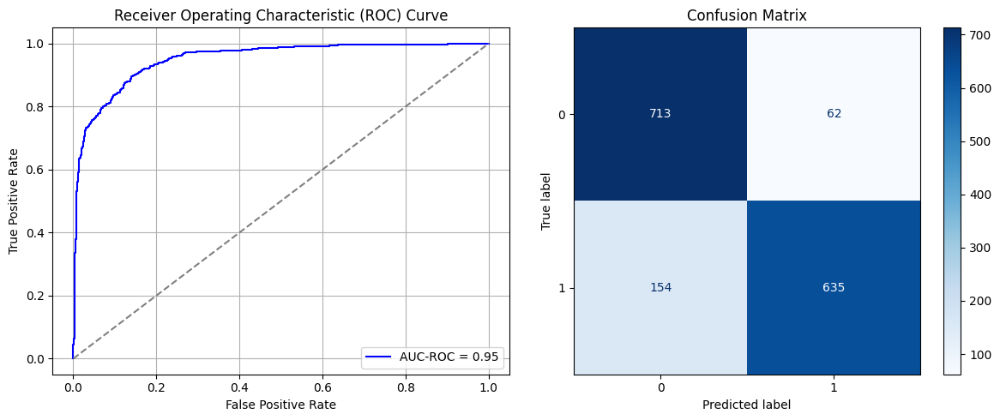

Best threshold based on F1-score: 0.19686761498451233
Time elapsed (performance): 16.29348816799984


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_43"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_301 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_302 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_303 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_304 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_305 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_306 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_307 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7203 - loss: 0.8527 - val_AUC: 0.0000e+00 - val_loss: 0.9761
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7264 - loss: 0.6086 - val_AUC: 0.0000e+00 - val_loss: 0.9507
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7271 - loss: 0.5828 - val_AUC: 0.0000e+00 - val_loss: 0.8508
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7580 - loss: 0.5543 - val_AUC: 0.0000e+00 - val_loss: 0.7847
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7505 - loss: 0.5568 - val_AUC: 0.0000e+00 - val_loss: 0.8045
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7405 - loss: 0.5661 - val_AUC: 0.0000e+00 - val_loss: 0.7358
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7409 - loss: 0.5649 - val_AUC: 0.0000e+00 - val_loss: 0.8416
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7339 - loss: 0.5676 - val_AUC: 0.0000e+00 - val_loss: 0.7680
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_44"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_308 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_309 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_310 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_311 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_312 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_313 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_314 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7345 - loss: 0.8166 - val_AUC: 0.0000e+00 - val_loss: 1.0463
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7101 - loss: 0.6344 - val_AUC: 0.0000e+00 - val_loss: 0.8736
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7282 - loss: 0.5773 - val_AUC: 0.0000e+00 - val_loss: 0.8428
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7402 - loss: 0.5672 - val_AUC: 0.0000e+00 - val_loss: 0.8401
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7348 - loss: 0.5727 - val_AUC: 0.0000e+00 - val_loss: 0.8743
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7265 - loss: 0.5672 - val_AUC: 0.0000e+00 - val_loss: 0.8025
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7411 - loss: 0.5607 - val_AUC: 0.0000e+00 - val_loss: 0.8957
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7365 - loss: 0.5754 - val_AUC: 0.0000e+00 - val_loss: 0.8849
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_45"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_315 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_316 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_317 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_318 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_319 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_320 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_321 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - AUC: 0.7131 - loss: 0.8792 - val_AUC: 0.0000e+00 - val_loss: 1.0251
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7356 - loss: 0.6052 - val_AUC: 0.0000e+00 - val_loss: 0.9515
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7342 - loss: 0.5826 - val_AUC: 0.0000e+00 - val_loss: 0.8788
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7382 - loss: 0.5732 - val_AUC: 0.0000e+00 - val_loss: 0.8504
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7255 - loss: 0.5701 - val_AUC: 0.0000e+00 - val_loss: 0.8122
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7441 - loss: 0.5589 - val_AUC: 0.0000e+00 - val_loss: 0.8059
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7421 - loss: 0.5708 - val_AUC: 0.0000e+00 - val_loss: 0.7807
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7401 - loss: 0.5595 - val_AUC: 0.0000e+00 - val_loss: 0.7594
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_46"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_322 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_323 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_324 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_325 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_326 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_327 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_328 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - AUC: 0.7226 - loss: 0.7894 - val_AUC: 0.0000e+00 - val_loss: 1.0502
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7236 - loss: 0.6040 - val_AUC: 0.0000e+00 - val_loss: 0.8926
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7403 - loss: 0.5698 - val_AUC: 0.0000e+00 - val_loss: 0.8646
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7194 - loss: 0.5925 - val_AUC: 0.0000e+00 - val_loss: 0.8137
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7221 - loss: 0.5879 - val_AUC: 0.0000e+00 - val_loss: 0.8555
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7498 - loss: 0.5607 - val_AUC: 0.0000e+00 - val_loss: 0.8435
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7404 - loss: 0.5607 - val_AUC: 0.0000e+00 - val_loss: 0.8567
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7299 - loss: 0.5779 - val_AUC: 0.0000e+00 - val_loss: 0.7810
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_47"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_329 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_330 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_331 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_332 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_333 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_334 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_335 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7154 - loss: 0.8627 - val_AUC: 0.0000e+00 - val_loss: 1.0300
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7235 - loss: 0.6204 - val_AUC: 0.0000e+00 - val_loss: 0.8594
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7306 - loss: 0.5821 - val_AUC: 0.0000e+00 - val_loss: 0.8631
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7477 - loss: 0.5721 - val_AUC: 0.0000e+00 - val_loss: 0.9004
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7568 - loss: 0.5522 - val_AUC: 0.0000e+00 - val_loss: 0.7354
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7332 - loss: 0.5764 - val_AUC: 0.0000e+00 - val_loss: 0.8219
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7520 - loss: 0.5529 - val_AUC: 0.0000e+00 - val_loss: 0.8021
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7409 - loss: 0.5580 - val_AUC: 0.0000e+00 - val_loss: 0.7944
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_48"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_336 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_337 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_338 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_339 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_340 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_341 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_342 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7094 - loss: 0.8345 - val_AUC: 0.0000e+00 - val_loss: 1.0643
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7367 - loss: 0.6001 - val_AUC: 0.0000e+00 - val_loss: 0.9378
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7524 - loss: 0.5569 - val_AUC: 0.0000e+00 - val_loss: 0.8762
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7517 - loss: 0.5593 - val_AUC: 0.0000e+00 - val_loss: 0.8304
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7487 - loss: 0.5598 - val_AUC: 0.0000e+00 - val_loss: 0.8335
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7422 - loss: 0.5689 - val_AUC: 0.0000e+00 - val_loss: 0.8919
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7429 - loss: 0.5659 - val_AUC: 0.0000e+00 - val_loss: 0.9508
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7288 - loss: 0.5747 - val_AUC: 0.0000e+00 - val_loss: 0.8122
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_49"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_343 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_344 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_345 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_346 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_347 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_348 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_349 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7062 - loss: 0.8594 - val_AUC: 0.0000e+00 - val_loss: 1.0011
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7311 - loss: 0.5913 - val_AUC: 0.0000e+00 - val_loss: 0.8619
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7313 - loss: 0.5848 - val_AUC: 0.0000e+00 - val_loss: 0.8565
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7360 - loss: 0.5626 - val_AUC: 0.0000e+00 - val_loss: 0.8500
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7308 - loss: 0.5728 - val_AUC: 0.0000e+00 - val_loss: 0.7779
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7428 - loss: 0.5683 - val_AUC: 0.0000e+00 - val_loss: 0.7878
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7629 - loss: 0.5526 - val_AUC: 0.0000e+00 - val_loss: 0.8982
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7530 - loss: 0.5525 - val_AUC: 0.0000e+00 - val_loss: 0.7914
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_50"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_350 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_351 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_352 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_353 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_354 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_355 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_356 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - AUC: 0.7014 - loss: 0.8395 - val_AUC: 0.0000e+00 - val_loss: 0.9552
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7190 - loss: 0.6113 - val_AUC: 0.0000e+00 - val_loss: 0.9282
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7274 - loss: 0.5711 - val_AUC: 0.0000e+00 - val_loss: 0.8101
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7384 - loss: 0.5680 - val_AUC: 0.0000e+00 - val_loss: 0.8707
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7299 - loss: 0.5681 - val_AUC: 0.0000e+00 - val_loss: 0.8509
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7504 - loss: 0.5614 - val_AUC: 0.0000e+00 - val_loss: 0.8941
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7232 - loss: 0.5762 - val_AUC: 0.0000e+00 - val_loss: 0.8172
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7279 - loss: 0.5843 - val_AUC: 0.0000e+00 - val_loss: 0.8720
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_51"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_357 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_358 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_359 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_360 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_361 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_362 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_363 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - AUC: 0.7014 - loss: 0.8418 - val_AUC: 0.0000e+00 - val_loss: 0.9805
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7048 - loss: 0.6276 - val_AUC: 0.0000e+00 - val_loss: 0.8915
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7250 - loss: 0.5724 - val_AUC: 0.0000e+00 - val_loss: 0.8231
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7202 - loss: 0.5707 - val_AUC: 0.0000e+00 - val_loss: 0.7437
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7564 - loss: 0.5494 - val_AUC: 0.0000e+00 - val_loss: 0.7515
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7309 - loss: 0.5673 - val_AUC: 0.0000e+00 - val_loss: 0.8057
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7605 - loss: 0.5484 - val_AUC: 0.0000e+00 - val_loss: 0.8313
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7669 - loss: 0.5504 - val_AUC: 0.0000e+00 - val_loss: 0.9102
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_52"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_364 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_365 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_366 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_367 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_368 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_369 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_370 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - AUC: 0.6801 - loss: 0.9123 - val_AUC: 0.0000e+00 - val_loss: 1.0311
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7256 - loss: 0.6119 - val_AUC: 0.0000e+00 - val_loss: 0.9091
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7422 - loss: 0.5748 - val_AUC: 0.0000e+00 - val_loss: 0.8882
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7516 - loss: 0.5558 - val_AUC: 0.0000e+00 - val_loss: 0.8398
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7656 - loss: 0.5551 - val_AUC: 0.0000e+00 - val_loss: 0.8026
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7339 - loss: 0.5636 - val_AUC: 0.0000e+00 - val_loss: 0.8210
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7377 - loss: 0.5598 - val_AUC: 0.0000e+00 - val_loss: 0.8345
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7293 - loss: 0.5698 - val_AUC: 0.0000e+00 - val_loss: 0.7859
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_53"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_371 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_372 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_373 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_374 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_375 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_376 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_377 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - AUC: 0.7163 - loss: 0.8564 - val_AUC: 0.0000e+00 - val_loss: 0.9887
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7319 - loss: 0.5922 - val_AUC: 0.0000e+00 - val_loss: 0.8705
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7308 - loss: 0.5634 - val_AUC: 0.0000e+00 - val_loss: 0.8216
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7445 - loss: 0.5688 - val_AUC: 0.0000e+00 - val_loss: 0.9141
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7467 - loss: 0.5620 - val_AUC: 0.0000e+00 - val_loss: 0.7998
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7269 - loss: 0.5768 - val_AUC: 0.0000e+00 - val_loss: 0.8013
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7471 - loss: 0.5579 - val_AUC: 0.0000e+00 - val_loss: 0.8636
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7448 - loss: 0.5534 - val_AUC: 0.0000e+00 - val_loss: 0.7623
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_54"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_378 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_379 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_380 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_381 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_382 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_383 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_384 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - AUC: 0.7319 - loss: 0.8233 - val_AUC: 0.0000e+00 - val_loss: 1.0192
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7244 - loss: 0.5981 - val_AUC: 0.0000e+00 - val_loss: 0.8282
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7317 - loss: 0.5778 - val_AUC: 0.0000e+00 - val_loss: 0.8338
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7408 - loss: 0.5790 - val_AUC: 0.0000e+00 - val_loss: 0.8557
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7144 - loss: 0.5794 - val_AUC: 0.0000e+00 - val_loss: 0.8305
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7444 - loss: 0.5579 - val_AUC: 0.0000e+00 - val_loss: 0.7634
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7456 - loss: 0.5656 - val_AUC: 0.0000e+00 - val_loss: 0.8836
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7506 - loss: 0.5639 - val_AUC: 0.0000e+00 - val_loss: 0.9340
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_55"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_385 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_386 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_387 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_388 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_389 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_390 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_391 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - AUC: 0.7031 - loss: 0.8682 - val_AUC: 0.0000e+00 - val_loss: 1.0056
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7466 - loss: 0.5836 - val_AUC: 0.0000e+00 - val_loss: 0.9856
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7317 - loss: 0.5811 - val_AUC: 0.0000e+00 - val_loss: 0.8159
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7462 - loss: 0.5545 - val_AUC: 0.0000e+00 - val_loss: 0.7537
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7512 - loss: 0.5523 - val_AUC: 0.0000e+00 - val_loss: 0.8640
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7283 - loss: 0.5714 - val_AUC: 0.0000e+00 - val_loss: 0.8349
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7580 - loss: 0.5581 - val_AUC: 0.0000e+00 - val_loss: 0.8924
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7416 - loss: 0.5606 - val_AUC: 0.0000e+00 - val_loss: 0.7981
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_56"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_392 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_393 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_394 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_395 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_396 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_397 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_398 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - AUC: 0.7036 - loss: 0.8401 - val_AUC: 0.0000e+00 - val_loss: 1.0513
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7327 - loss: 0.5982 - val_AUC: 0.0000e+00 - val_loss: 0.9403
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7426 - loss: 0.5621 - val_AUC: 0.0000e+00 - val_loss: 0.8708
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7449 - loss: 0.5656 - val_AUC: 0.0000e+00 - val_loss: 0.8342
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7349 - loss: 0.5681 - val_AUC: 0.0000e+00 - val_loss: 0.8748
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7483 - loss: 0.5537 - val_AUC: 0.0000e+00 - val_loss: 0.7887
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7503 - loss: 0.5597 - val_AUC: 0.0000e+00 - val_loss: 0.8169
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7440 - loss: 0.5640 - val_AUC: 0.0000e+00 - val_loss: 0.8689
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_57"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_399 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_400 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_401 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_402 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_403 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_404 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_405 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - AUC: 0.6978 - loss: 0.8881 - val_AUC: 0.0000e+00 - val_loss: 1.0220
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7293 - loss: 0.6036 - val_AUC: 0.0000e+00 - val_loss: 0.9101
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7332 - loss: 0.5767 - val_AUC: 0.0000e+00 - val_loss: 0.8466
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7165 - loss: 0.5717 - val_AUC: 0.0000e+00 - val_loss: 0.8152
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7346 - loss: 0.5715 - val_AUC: 0.0000e+00 - val_loss: 0.8932
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7462 - loss: 0.5673 - val_AUC: 0.0000e+00 - val_loss: 0.8295
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7244 - loss: 0.5782 - val_AUC: 0.0000e+00 - val_loss: 0.8616
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7376 - loss: 0.5670 - val_AUC: 0.0000e+00 - val_loss: 0.8628
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_58"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_406 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_407 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_408 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_409 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_410 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_411 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_412 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - AUC: 0.7022 - loss: 0.8613 - val_AUC: 0.0000e+00 - val_loss: 1.0042
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7368 - loss: 0.6115 - val_AUC: 0.0000e+00 - val_loss: 0.9705
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7093 - loss: 0.5959 - val_AUC: 0.0000e+00 - val_loss: 0.9057
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7361 - loss: 0.5744 - val_AUC: 0.0000e+00 - val_loss: 0.8551
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7190 - loss: 0.5796 - val_AUC: 0.0000e+00 - val_loss: 0.7988
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7379 - loss: 0.5709 - val_AUC: 0.0000e+00 - val_loss: 0.7958
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7326 - loss: 0.5695 - val_AUC: 0.0000e+00 - val_loss: 0.9041
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7386 - loss: 0.5666 - val_AUC: 0.0000e+00 - val_loss: 0.8219
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_59"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_413 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_414 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_415 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_416 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_417 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_418 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_419 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - AUC: 0.7079 - loss: 0.8401 - val_AUC: 0.0000e+00 - val_loss: 1.0654
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7321 - loss: 0.5997 - val_AUC: 0.0000e+00 - val_loss: 0.8678
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7305 - loss: 0.5700 - val_AUC: 0.0000e+00 - val_loss: 0.8233
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7262 - loss: 0.5741 - val_AUC: 0.0000e+00 - val_loss: 0.8023
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7328 - loss: 0.5707 - val_AUC: 0.0000e+00 - val_loss: 0.8456
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7517 - loss: 0.5621 - val_AUC: 0.0000e+00 - val_loss: 0.8056
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7403 - loss: 0.5612 - val_AUC: 0.0000e+00 - val_loss: 0.8229
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7305 - loss: 0.5737 - val_AUC: 0.0000e+00 - val_loss: 0.8119
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_60"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_420 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_421 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_422 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_423 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_424 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_425 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_426 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - AUC: 0.6918 - loss: 0.8724 - val_AUC: 0.0000e+00 - val_loss: 1.0394
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7174 - loss: 0.6218 - val_AUC: 0.0000e+00 - val_loss: 0.9172
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7257 - loss: 0.5884 - val_AUC: 0.0000e+00 - val_loss: 0.9429
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7282 - loss: 0.5750 - val_AUC: 0.0000e+00 - val_loss: 0.7999
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7369 - loss: 0.5682 - val_AUC: 0.0000e+00 - val_loss: 0.7943
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7322 - loss: 0.5716 - val_AUC: 0.0000e+00 - val_loss: 0.8236
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7309 - loss: 0.5661 - val_AUC: 0.0000e+00 - val_loss: 0.7504
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7215 - loss: 0.5684 - val_AUC: 0.0000e+00 - val_loss: 0.8038
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_61"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_427 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_428 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_429 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_430 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_431 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_432 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_433 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - AUC: 0.7300 - loss: 0.8151 - val_AUC: 0.0000e+00 - val_loss: 0.9446
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7304 - loss: 0.6030 - val_AUC: 0.0000e+00 - val_loss: 0.8805
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7261 - loss: 0.5937 - val_AUC: 0.0000e+00 - val_loss: 0.9013
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7106 - loss: 0.5872 - val_AUC: 0.0000e+00 - val_loss: 0.8626
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7347 - loss: 0.5705 - val_AUC: 0.0000e+00 - val_loss: 0.7848
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7098 - loss: 0.5824 - val_AUC: 0.0000e+00 - val_loss: 0.7532
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7421 - loss: 0.5672 - val_AUC: 0.0000e+00 - val_loss: 0.8736
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7458 - loss: 0.5520 - val_AUC: 0.0000e+00 - val_loss: 0.8334
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_62"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_434 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_435 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_436 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_437 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_438 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_439 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_440 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - AUC: 0.7109 - loss: 0.8523 - val_AUC: 0.0000e+00 - val_loss: 1.0373
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7304 - loss: 0.6025 - val_AUC: 0.0000e+00 - val_loss: 0.8656
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7310 - loss: 0.5821 - val_AUC: 0.0000e+00 - val_loss: 0.9019
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7179 - loss: 0.5938 - val_AUC: 0.0000e+00 - val_loss: 0.8178
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7135 - loss: 0.5931 - val_AUC: 0.0000e+00 - val_loss: 0.7809
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7347 - loss: 0.5728 - val_AUC: 0.0000e+00 - val_loss: 0.7274
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7263 - loss: 0.5692 - val_AUC: 0.0000e+00 - val_loss: 0.7424
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7515 - loss: 0.5542 - val_AUC: 0.0000e+00 - val_loss: 0.7872
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_63"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_441 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_442 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_443 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_444 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_445 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_446 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_447 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - AUC: 0.6522 - loss: 0.6660 - val_AUC: 0.8376 - val_loss: 0.5458
Epoch 2/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8271 - loss: 0.5132 - val_AUC: 0.8911 - val_loss: 0.4870
Epoch 3/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8722 - loss: 0.4482 - val_AUC: 0.9072 - val_loss: 0.3943
Epoch 4/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8997 - loss: 0.3996 - val_AUC: 0.9251 - val_loss: 0.3675
Epoch 5/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9254 - loss: 0.3492 - val_AUC: 0.9336 - val_loss: 0.3991
Epoch 6/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9241 - loss: 0.3508 - val_AUC: 0.9414 - val_loss: 0.3328
Epoch 7/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.9300 - loss: 0.3370 - val_AUC: 0.9501 - val_loss: 0.3007
Epoch 8/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9440 - loss: 0.3036 - val_AUC: 0.9485 - val_loss: 0.3150
Epoch 9/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

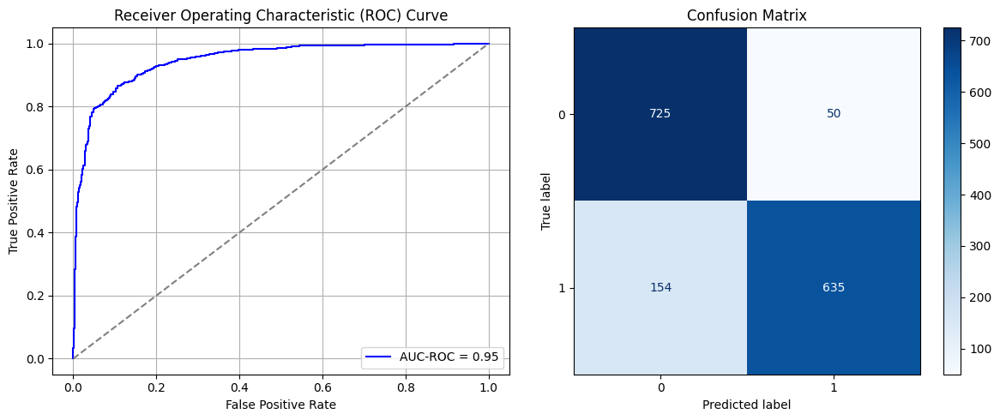

Best threshold based on F1-score: 0.3712490200996399
Time elapsed (performance): 14.700799741000083


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_64"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_448 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_449 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_450 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_451 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_452 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_453 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_454 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - AUC: 0.7374 - loss: 0.7050 - val_AUC: 0.0000e+00 - val_loss: 0.8687
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7421 - loss: 0.5817 - val_AUC: 0.0000e+00 - val_loss: 0.9146
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7032 - loss: 0.5991 - val_AUC: 0.0000e+00 - val_loss: 0.8878
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7241 - loss: 0.5930 - val_AUC: 0.0000e+00 - val_loss: 0.9566
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7483 - loss: 0.5648 - val_AUC: 0.0000e+00 - val_loss: 0.8853
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7501 - loss: 0.5527 - val_AUC: 0.0000e+00 - val_loss: 0.7271
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7571 - loss: 0.5501 - val_AUC: 0.0000e+00 - val_loss: 0.8546
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7509 - loss: 0.5540 - val_AUC: 0.0000e+00 - val_loss: 0.9601
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_65"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_455 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_456 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_457 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_458 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_459 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_460 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_461 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - AUC: 0.7419 - loss: 0.6954 - val_AUC: 0.0000e+00 - val_loss: 0.9800
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7144 - loss: 0.6089 - val_AUC: 0.0000e+00 - val_loss: 0.8268
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7463 - loss: 0.5649 - val_AUC: 0.0000e+00 - val_loss: 0.9290
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7214 - loss: 0.5723 - val_AUC: 0.0000e+00 - val_loss: 0.8140
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7593 - loss: 0.5549 - val_AUC: 0.0000e+00 - val_loss: 0.8487
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7301 - loss: 0.5736 - val_AUC: 0.0000e+00 - val_loss: 0.8582
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7610 - loss: 0.5502 - val_AUC: 0.0000e+00 - val_loss: 0.8658
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7372 - loss: 0.5671 - val_AUC: 0.0000e+00 - val_loss: 0.9488
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_66"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_462 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_463 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_464 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_465 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_466 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_467 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_468 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - AUC: 0.7332 - loss: 0.7197 - val_AUC: 0.0000e+00 - val_loss: 1.0455
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7402 - loss: 0.5952 - val_AUC: 0.0000e+00 - val_loss: 0.9182
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7506 - loss: 0.5626 - val_AUC: 0.0000e+00 - val_loss: 0.8778
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7254 - loss: 0.5776 - val_AUC: 0.0000e+00 - val_loss: 0.9438
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7352 - loss: 0.5777 - val_AUC: 0.0000e+00 - val_loss: 0.8248
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7369 - loss: 0.5637 - val_AUC: 0.0000e+00 - val_loss: 0.9086
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7335 - loss: 0.5688 - val_AUC: 0.0000e+00 - val_loss: 0.8491
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7475 - loss: 0.5595 - val_AUC: 0.0000e+00 - val_loss: 0.8493
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_67"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_469 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_470 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_471 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_472 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_473 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_474 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_475 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - AUC: 0.7271 - loss: 0.7487 - val_AUC: 0.0000e+00 - val_loss: 1.0782
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7338 - loss: 0.5833 - val_AUC: 0.0000e+00 - val_loss: 0.8981
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7218 - loss: 0.5829 - val_AUC: 0.0000e+00 - val_loss: 0.8253
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7349 - loss: 0.5670 - val_AUC: 0.0000e+00 - val_loss: 0.7662
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7478 - loss: 0.5520 - val_AUC: 0.0000e+00 - val_loss: 0.8943
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7398 - loss: 0.5677 - val_AUC: 0.0000e+00 - val_loss: 0.8914
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7489 - loss: 0.5610 - val_AUC: 0.0000e+00 - val_loss: 0.8584
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7266 - loss: 0.5683 - val_AUC: 0.0000e+00 - val_loss: 0.8839
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_68"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_476 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_477 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_478 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_479 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_480 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_481 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_482 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - AUC: 0.7576 - loss: 0.6738 - val_AUC: 0.0000e+00 - val_loss: 0.9037
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7389 - loss: 0.5833 - val_AUC: 0.0000e+00 - val_loss: 0.8655
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7475 - loss: 0.5527 - val_AUC: 0.0000e+00 - val_loss: 0.8590
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7291 - loss: 0.5791 - val_AUC: 0.0000e+00 - val_loss: 0.8414
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7347 - loss: 0.5648 - val_AUC: 0.0000e+00 - val_loss: 0.9035
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7457 - loss: 0.5592 - val_AUC: 0.0000e+00 - val_loss: 0.7103
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7381 - loss: 0.5669 - val_AUC: 0.0000e+00 - val_loss: 0.9227
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7305 - loss: 0.5752 - val_AUC: 0.0000e+00 - val_loss: 0.7781
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_69"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_483 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_484 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_485 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_486 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_487 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_488 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_489 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - AUC: 0.7437 - loss: 0.6998 - val_AUC: 0.0000e+00 - val_loss: 0.8418
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7356 - loss: 0.5848 - val_AUC: 0.0000e+00 - val_loss: 0.9180
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7393 - loss: 0.5603 - val_AUC: 0.0000e+00 - val_loss: 0.8427
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7685 - loss: 0.5460 - val_AUC: 0.0000e+00 - val_loss: 0.7674
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7418 - loss: 0.5584 - val_AUC: 0.0000e+00 - val_loss: 0.7845
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7264 - loss: 0.5615 - val_AUC: 0.0000e+00 - val_loss: 0.7171
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7478 - loss: 0.5558 - val_AUC: 0.0000e+00 - val_loss: 0.7902
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7235 - loss: 0.5818 - val_AUC: 0.0000e+00 - val_loss: 0.8961
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_70"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_490 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_491 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_492 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_493 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_494 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_495 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_496 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - AUC: 0.7357 - loss: 0.7208 - val_AUC: 0.0000e+00 - val_loss: 0.8513
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7609 - loss: 0.5570 - val_AUC: 0.0000e+00 - val_loss: 0.8431
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7548 - loss: 0.5545 - val_AUC: 0.0000e+00 - val_loss: 0.7912
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7299 - loss: 0.5755 - val_AUC: 0.0000e+00 - val_loss: 0.8082
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7324 - loss: 0.5672 - val_AUC: 0.0000e+00 - val_loss: 0.8133
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7472 - loss: 0.5581 - val_AUC: 0.0000e+00 - val_loss: 0.9045
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7629 - loss: 0.5463 - val_AUC: 0.0000e+00 - val_loss: 0.7889
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7598 - loss: 0.5536 - val_AUC: 0.0000e+00 - val_loss: 0.8494
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_71"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_497 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_498 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_499 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_500 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_501 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_502 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_503 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - AUC: 0.7623 - loss: 0.6649 - val_AUC: 0.0000e+00 - val_loss: 0.8367
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7338 - loss: 0.5882 - val_AUC: 0.0000e+00 - val_loss: 0.8970
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7555 - loss: 0.5589 - val_AUC: 0.0000e+00 - val_loss: 0.8171
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7535 - loss: 0.5563 - val_AUC: 0.0000e+00 - val_loss: 0.7430
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7553 - loss: 0.5550 - val_AUC: 0.0000e+00 - val_loss: 0.8330
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7481 - loss: 0.5537 - val_AUC: 0.0000e+00 - val_loss: 0.8309
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7504 - loss: 0.5458 - val_AUC: 0.0000e+00 - val_loss: 0.8055
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7446 - loss: 0.5571 - val_AUC: 0.0000e+00 - val_loss: 0.8129
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_72"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_504 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_505 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_506 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_507 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_508 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_509 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_510 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - AUC: 0.7328 - loss: 0.7341 - val_AUC: 0.0000e+00 - val_loss: 0.9639
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7327 - loss: 0.5932 - val_AUC: 0.0000e+00 - val_loss: 0.8139
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7452 - loss: 0.5658 - val_AUC: 0.0000e+00 - val_loss: 0.8208
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7459 - loss: 0.5618 - val_AUC: 0.0000e+00 - val_loss: 0.7535
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7498 - loss: 0.5496 - val_AUC: 0.0000e+00 - val_loss: 0.9069
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7473 - loss: 0.5574 - val_AUC: 0.0000e+00 - val_loss: 0.7370
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7393 - loss: 0.5657 - val_AUC: 0.0000e+00 - val_loss: 0.9287
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7456 - loss: 0.5555 - val_AUC: 0.0000e+00 - val_loss: 0.7327
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_73"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_511 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_512 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_513 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_514 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_515 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_516 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_517 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - AUC: 0.7316 - loss: 0.7187 - val_AUC: 0.0000e+00 - val_loss: 0.9855
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7454 - loss: 0.5718 - val_AUC: 0.0000e+00 - val_loss: 0.9183
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7352 - loss: 0.5825 - val_AUC: 0.0000e+00 - val_loss: 0.8510
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7622 - loss: 0.5383 - val_AUC: 0.0000e+00 - val_loss: 0.8798
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7432 - loss: 0.5630 - val_AUC: 0.0000e+00 - val_loss: 0.8854
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7302 - loss: 0.5762 - val_AUC: 0.0000e+00 - val_loss: 0.8886
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7478 - loss: 0.5568 - val_AUC: 0.0000e+00 - val_loss: 0.7792
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7331 - loss: 0.5697 - val_AUC: 0.0000e+00 - val_loss: 0.9190
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_74"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_518 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_519 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_520 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_521 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_522 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_523 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_524 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - AUC: 0.7487 - loss: 0.6818 - val_AUC: 0.0000e+00 - val_loss: 0.7503
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7309 - loss: 0.5894 - val_AUC: 0.0000e+00 - val_loss: 0.9378
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7320 - loss: 0.5748 - val_AUC: 0.0000e+00 - val_loss: 0.7346
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7502 - loss: 0.5586 - val_AUC: 0.0000e+00 - val_loss: 0.7233
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7444 - loss: 0.5605 - val_AUC: 0.0000e+00 - val_loss: 0.8820
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7409 - loss: 0.5633 - val_AUC: 0.0000e+00 - val_loss: 0.8362
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7535 - loss: 0.5540 - val_AUC: 0.0000e+00 - val_loss: 0.9218
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7311 - loss: 0.5658 - val_AUC: 0.0000e+00 - val_loss: 0.9470
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_75"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_525 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_526 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_527 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_528 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_529 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_530 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_531 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7363 - loss: 0.7254 - val_AUC: 0.0000e+00 - val_loss: 1.0240
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7437 - loss: 0.5764 - val_AUC: 0.0000e+00 - val_loss: 0.8407
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7455 - loss: 0.5609 - val_AUC: 0.0000e+00 - val_loss: 0.8480
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7269 - loss: 0.5768 - val_AUC: 0.0000e+00 - val_loss: 0.8864
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7375 - loss: 0.5636 - val_AUC: 0.0000e+00 - val_loss: 0.9056
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7189 - loss: 0.5761 - val_AUC: 0.0000e+00 - val_loss: 0.8828
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7347 - loss: 0.5580 - val_AUC: 0.0000e+00 - val_loss: 0.8607
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7213 - loss: 0.5864 - val_AUC: 0.0000e+00 - val_loss: 0.8207
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_76"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_532 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_533 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_534 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_535 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_536 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_537 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_538 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7390 - loss: 0.7108 - val_AUC: 0.0000e+00 - val_loss: 0.8579
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7328 - loss: 0.5801 - val_AUC: 0.0000e+00 - val_loss: 0.9313
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7640 - loss: 0.5465 - val_AUC: 0.0000e+00 - val_loss: 0.8927
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7500 - loss: 0.5619 - val_AUC: 0.0000e+00 - val_loss: 0.8287
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7359 - loss: 0.5704 - val_AUC: 0.0000e+00 - val_loss: 0.8262
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7282 - loss: 0.5628 - val_AUC: 0.0000e+00 - val_loss: 0.7866
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7313 - loss: 0.5619 - val_AUC: 0.0000e+00 - val_loss: 0.8682
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7472 - loss: 0.5512 - val_AUC: 0.0000e+00 - val_loss: 0.8671
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_77"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_539 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_540 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_541 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_542 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_543 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_544 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_545 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - AUC: 0.7363 - loss: 0.7180 - val_AUC: 0.0000e+00 - val_loss: 0.8660
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7370 - loss: 0.5843 - val_AUC: 0.0000e+00 - val_loss: 1.0131
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7078 - loss: 0.5982 - val_AUC: 0.0000e+00 - val_loss: 0.8398
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7313 - loss: 0.5730 - val_AUC: 0.0000e+00 - val_loss: 0.8672
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7511 - loss: 0.5566 - val_AUC: 0.0000e+00 - val_loss: 0.8428
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7533 - loss: 0.5571 - val_AUC: 0.0000e+00 - val_loss: 0.8880
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7590 - loss: 0.5471 - val_AUC: 0.0000e+00 - val_loss: 0.8212
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7323 - loss: 0.5726 - val_AUC: 0.0000e+00 - val_loss: 0.8236
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_78"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_546 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_547 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_548 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_549 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_550 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_551 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_552 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step - AUC: 0.7161 - loss: 0.7893 - val_AUC: 0.0000e+00 - val_loss: 1.0331
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7325 - loss: 0.5804 - val_AUC: 0.0000e+00 - val_loss: 0.8374
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7506 - loss: 0.5647 - val_AUC: 0.0000e+00 - val_loss: 0.8665
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7464 - loss: 0.5685 - val_AUC: 0.0000e+00 - val_loss: 0.8918
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7391 - loss: 0.5667 - val_AUC: 0.0000e+00 - val_loss: 0.8086
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7383 - loss: 0.5602 - val_AUC: 0.0000e+00 - val_loss: 0.7438
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7426 - loss: 0.5612 - val_AUC: 0.0000e+00 - val_loss: 0.8040
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7464 - loss: 0.5567 - val_AUC: 0.0000e+00 - val_loss: 0.8336
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_79"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_553 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_554 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_555 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_556 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_557 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_558 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_559 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - AUC: 0.7450 - loss: 0.7027 - val_AUC: 0.0000e+00 - val_loss: 0.8524
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7332 - loss: 0.5893 - val_AUC: 0.0000e+00 - val_loss: 0.8484
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7297 - loss: 0.5887 - val_AUC: 0.0000e+00 - val_loss: 0.9155
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7431 - loss: 0.5663 - val_AUC: 0.0000e+00 - val_loss: 0.8583
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7482 - loss: 0.5565 - val_AUC: 0.0000e+00 - val_loss: 0.7496
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7552 - loss: 0.5542 - val_AUC: 0.0000e+00 - val_loss: 0.8939
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7568 - loss: 0.5468 - val_AUC: 0.0000e+00 - val_loss: 0.7831
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7438 - loss: 0.5586 - val_AUC: 0.0000e+00 - val_loss: 0.8410
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_80"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_560 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_561 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_562 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_563 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_564 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_565 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_566 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - AUC: 0.7276 - loss: 0.7370 - val_AUC: 0.0000e+00 - val_loss: 0.9152
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7222 - loss: 0.6020 - val_AUC: 0.0000e+00 - val_loss: 0.8169
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7402 - loss: 0.5723 - val_AUC: 0.0000e+00 - val_loss: 0.8924
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7525 - loss: 0.5555 - val_AUC: 0.0000e+00 - val_loss: 0.8316
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7386 - loss: 0.5628 - val_AUC: 0.0000e+00 - val_loss: 0.7984
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7515 - loss: 0.5542 - val_AUC: 0.0000e+00 - val_loss: 0.8205
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7481 - loss: 0.5638 - val_AUC: 0.0000e+00 - val_loss: 0.9088
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7437 - loss: 0.5581 - val_AUC: 0.0000e+00 - val_loss: 0.7640
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_81"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_567 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_568 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_569 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_570 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_571 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_572 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_573 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - AUC: 0.7334 - loss: 0.7230 - val_AUC: 0.0000e+00 - val_loss: 1.0541
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7534 - loss: 0.5633 - val_AUC: 0.0000e+00 - val_loss: 0.8508
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7434 - loss: 0.5629 - val_AUC: 0.0000e+00 - val_loss: 0.7976
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7374 - loss: 0.5623 - val_AUC: 0.0000e+00 - val_loss: 0.8392
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7565 - loss: 0.5544 - val_AUC: 0.0000e+00 - val_loss: 0.7600
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7376 - loss: 0.5699 - val_AUC: 0.0000e+00 - val_loss: 0.9643
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7119 - loss: 0.5855 - val_AUC: 0.0000e+00 - val_loss: 0.7949
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7551 - loss: 0.5496 - val_AUC: 0.0000e+00 - val_loss: 0.8287
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_82"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_574 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_575 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_576 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_577 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_578 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_579 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_580 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - AUC: 0.7464 - loss: 0.7022 - val_AUC: 0.0000e+00 - val_loss: 0.9568
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7350 - loss: 0.5997 - val_AUC: 0.0000e+00 - val_loss: 0.8536
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7567 - loss: 0.5488 - val_AUC: 0.0000e+00 - val_loss: 0.7795
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7451 - loss: 0.5509 - val_AUC: 0.0000e+00 - val_loss: 0.8489
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7631 - loss: 0.5423 - val_AUC: 0.0000e+00 - val_loss: 0.8719
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7508 - loss: 0.5634 - val_AUC: 0.0000e+00 - val_loss: 0.8378
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7252 - loss: 0.5738 - val_AUC: 0.0000e+00 - val_loss: 0.7585
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7525 - loss: 0.5573 - val_AUC: 0.0000e+00 - val_loss: 0.8377
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_83"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_581 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_582 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_583 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_584 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_585 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_586 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_587 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step - AUC: 0.7182 - loss: 0.7622 - val_AUC: 0.0000e+00 - val_loss: 0.8965
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7348 - loss: 0.5837 - val_AUC: 0.0000e+00 - val_loss: 0.8781
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7427 - loss: 0.5711 - val_AUC: 0.0000e+00 - val_loss: 0.8667
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7443 - loss: 0.5592 - val_AUC: 0.0000e+00 - val_loss: 0.8652
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7570 - loss: 0.5562 - val_AUC: 0.0000e+00 - val_loss: 0.8317
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7348 - loss: 0.5708 - val_AUC: 0.0000e+00 - val_loss: 0.8709
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7503 - loss: 0.5578 - val_AUC: 0.0000e+00 - val_loss: 0.9259
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7376 - loss: 0.5641 - val_AUC: 0.0000e+00 - val_loss: 0.8677
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_84"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_588 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_589 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_590 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_591 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_592 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_593 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_594 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - AUC: 0.6322 - loss: 0.6660 - val_AUC: 0.7941 - val_loss: 0.5876
Epoch 2/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8109 - loss: 0.5345 - val_AUC: 0.8868 - val_loss: 0.4288
Epoch 3/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8867 - loss: 0.4246 - val_AUC: 0.9148 - val_loss: 0.3762
Epoch 4/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9049 - loss: 0.3921 - val_AUC: 0.9320 - val_loss: 0.3374
Epoch 5/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9208 - loss: 0.3588 - val_AUC: 0.9387 - val_loss: 0.3695
Epoch 6/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9251 - loss: 0.3502 - val_AUC: 0.9486 - val_loss: 0.2888
Epoch 7/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9448 - loss: 0.3010 - val_AUC: 0.9585 - val_loss: 0.2633
Epoch 8/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9503 - loss: 0.2861 - val_AUC: 0.9584 - val_loss: 0.2582
Epoch 9/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step -

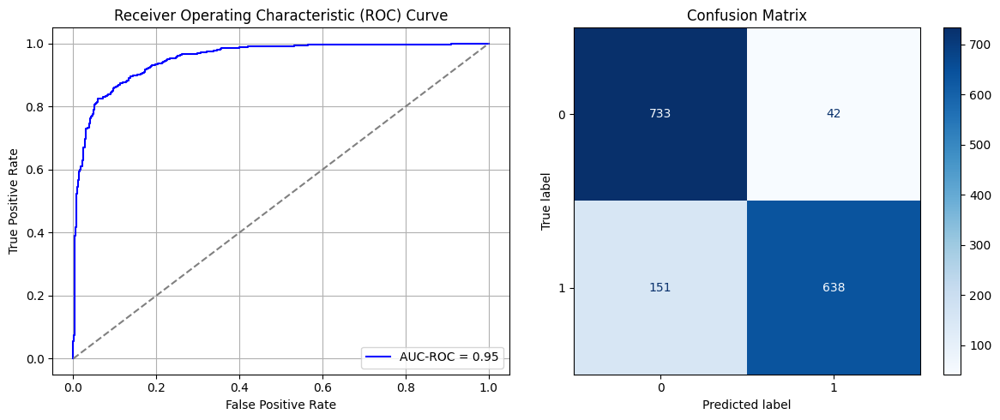

Best threshold based on F1-score: 0.25373923778533936
Time elapsed (performance): 19.738047007000205


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_85"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_595 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_596 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_597 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_598 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_599 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_600 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_601 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - AUC: 0.6328 - loss: 0.8113 - val_AUC: 0.0000e+00 - val_loss: 0.9355
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6618 - loss: 0.6253 - val_AUC: 0.0000e+00 - val_loss: 0.7467
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6562 - loss: 0.6282 - val_AUC: 0.0000e+00 - val_loss: 0.8646
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6444 - loss: 0.6284 - val_AUC: 0.0000e+00 - val_loss: 0.8273
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6639 - loss: 0.6180 - val_AUC: 0.0000e+00 - val_loss: 1.0478
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6592 - loss: 0.6106 - val_AUC: 0.0000e+00 - val_loss: 0.7944
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6754 - loss: 0.6135 - val_AUC: 0.0000e+00 - val_loss: 0.9774
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6793 - los

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_86"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_602 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_603 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_604 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_605 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_606 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_607 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_608 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 5s 43ms/step - AUC: 0.6458 - loss: 0.7695 - val_AUC: 0.0000e+00 - val_loss: 0.8261
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6467 - loss: 0.6407 - val_AUC: 0.0000e+00 - val_loss: 0.8898
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6613 - loss: 0.6252 - val_AUC: 0.0000e+00 - val_loss: 0.9405
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6744 - loss: 0.6190 - val_AUC: 0.0000e+00 - val_loss: 0.9839
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6645 - loss: 0.6194 - val_AUC: 0.0000e+00 - val_loss: 0.8575
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6582 - loss: 0.6157 - val_AUC: 0.0000e+00 - val_loss: 0.8262
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6940 - loss: 0.6052 - val_AUC: 0.0000e+00 - val_loss: 0.9006
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6857 - loss: 0.6110 - val_AUC: 0.0000e+00 - val_loss: 0.8975
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_87"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_609 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_610 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_611 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_612 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_613 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_614 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_615 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - AUC: 0.6386 - loss: 0.7927 - val_AUC: 0.0000e+00 - val_loss: 0.8832
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6655 - loss: 0.6263 - val_AUC: 0.0000e+00 - val_loss: 0.9494
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6528 - loss: 0.6277 - val_AUC: 0.0000e+00 - val_loss: 0.9237
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6449 - loss: 0.6234 - val_AUC: 0.0000e+00 - val_loss: 0.9059
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6696 - loss: 0.6139 - val_AUC: 0.0000e+00 - val_loss: 0.7972
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6791 - loss: 0.6031 - val_AUC: 0.0000e+00 - val_loss: 0.7911
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6705 - loss: 0.6227 - val_AUC: 0.0000e+00 - val_loss: 0.9591
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6781 - loss: 0.6094 - val_AUC: 0.0000e+00 - val_loss: 0.8263
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_88"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_616 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_617 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_618 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_619 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_620 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_621 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_622 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - AUC: 0.6364 - loss: 0.7843 - val_AUC: 0.0000e+00 - val_loss: 0.8712
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.6332 - loss: 0.6562 - val_AUC: 0.0000e+00 - val_loss: 0.9120
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6780 - loss: 0.6062 - val_AUC: 0.0000e+00 - val_loss: 0.8429
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6476 - loss: 0.6224 - val_AUC: 0.0000e+00 - val_loss: 0.9289
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6636 - loss: 0.6151 - val_AUC: 0.0000e+00 - val_loss: 0.9633
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6621 - loss: 0.6140 - val_AUC: 0.0000e+00 - val_loss: 0.9435
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6812 - loss: 0.6066 - val_AUC: 0.0000e+00 - val_loss: 0.8503
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.6714 - loss: 0.6128 - val_AUC: 0.0000e+00 - val_loss: 0.9315
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_89"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_623 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_624 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_625 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_626 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_627 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_628 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_629 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.6343 - loss: 0.8513 - val_AUC: 0.0000e+00 - val_loss: 1.1057
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.6576 - loss: 0.6457 - val_AUC: 0.0000e+00 - val_loss: 0.8638
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6439 - loss: 0.6271 - val_AUC: 0.0000e+00 - val_loss: 0.9923
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6522 - loss: 0.6287 - val_AUC: 0.0000e+00 - val_loss: 0.9423
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6624 - loss: 0.6016 - val_AUC: 0.0000e+00 - val_loss: 0.9116
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6786 - loss: 0.6015 - val_AUC: 0.0000e+00 - val_loss: 0.7861
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6624 - loss: 0.6211 - val_AUC: 0.0000e+00 - val_loss: 0.9171
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6825 - loss: 0.6096 - val_AUC: 0.0000e+00 - val_loss: 0.8642
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_90"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_630 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_631 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_632 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_633 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_634 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_635 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_636 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.6565 - loss: 0.7996 - val_AUC: 0.0000e+00 - val_loss: 1.0896
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.6535 - loss: 0.6361 - val_AUC: 0.0000e+00 - val_loss: 0.8048
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6552 - loss: 0.6300 - val_AUC: 0.0000e+00 - val_loss: 0.9270
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6597 - loss: 0.6106 - val_AUC: 0.0000e+00 - val_loss: 0.7866
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6501 - loss: 0.6222 - val_AUC: 0.0000e+00 - val_loss: 1.0402
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6706 - loss: 0.6144 - val_AUC: 0.0000e+00 - val_loss: 0.9235
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6839 - loss: 0.6095 - val_AUC: 0.0000e+00 - val_loss: 0.9225
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6835 - loss: 0.6105 - val_AUC: 0.0000e+00 - val_loss: 0.8774
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_91"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_637 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_638 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_639 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_640 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_641 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_642 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_643 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - AUC: 0.6369 - loss: 0.8061 - val_AUC: 0.0000e+00 - val_loss: 0.9126
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6330 - loss: 0.6434 - val_AUC: 0.0000e+00 - val_loss: 0.7311
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6379 - loss: 0.6359 - val_AUC: 0.0000e+00 - val_loss: 0.8545
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6620 - loss: 0.6117 - val_AUC: 0.0000e+00 - val_loss: 0.8403
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6575 - loss: 0.6225 - val_AUC: 0.0000e+00 - val_loss: 0.9629
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6770 - loss: 0.6127 - val_AUC: 0.0000e+00 - val_loss: 1.0559
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6649 - loss: 0.6224 - val_AUC: 0.0000e+00 - val_loss: 0.9098
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6862 - loss: 0.6073 - val_AUC: 0.0000e+00 - val_loss: 0.8743
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_92"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_644 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_645 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_646 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_647 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_648 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_649 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_650 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - AUC: 0.6383 - loss: 0.7792 - val_AUC: 0.0000e+00 - val_loss: 0.8790
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6390 - loss: 0.6437 - val_AUC: 0.0000e+00 - val_loss: 0.8339
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6782 - loss: 0.6182 - val_AUC: 0.0000e+00 - val_loss: 0.9310
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.6483 - loss: 0.6349 - val_AUC: 0.0000e+00 - val_loss: 1.0022
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6829 - loss: 0.6077 - val_AUC: 0.0000e+00 - val_loss: 0.8889
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6607 - loss: 0.6136 - val_AUC: 0.0000e+00 - val_loss: 0.8627
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6965 - loss: 0.5983 - val_AUC: 0.0000e+00 - val_loss: 0.8546
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6920 - loss: 0.6089 - val_AUC: 0.0000e+00 - val_loss: 0.8614
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_93"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_651 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_652 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_653 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_654 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_655 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_656 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_657 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - AUC: 0.6365 - loss: 0.7944 - val_AUC: 0.0000e+00 - val_loss: 0.8626
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6600 - loss: 0.6275 - val_AUC: 0.0000e+00 - val_loss: 0.7351
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6584 - loss: 0.6166 - val_AUC: 0.0000e+00 - val_loss: 1.0055
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6654 - loss: 0.6186 - val_AUC: 0.0000e+00 - val_loss: 0.9129
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6540 - loss: 0.6240 - val_AUC: 0.0000e+00 - val_loss: 0.7833
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6754 - loss: 0.6099 - val_AUC: 0.0000e+00 - val_loss: 0.9517
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6763 - loss: 0.6128 - val_AUC: 0.0000e+00 - val_loss: 0.9422
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6809 - loss: 0.5970 - val_AUC: 0.0000e+00 - val_loss: 0.8873
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_94"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_658 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_659 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_660 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_661 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_662 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_663 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_664 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.6506 - loss: 0.7658 - val_AUC: 0.0000e+00 - val_loss: 1.0082
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.6686 - loss: 0.6291 - val_AUC: 0.0000e+00 - val_loss: 0.9912
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6522 - loss: 0.6160 - val_AUC: 0.0000e+00 - val_loss: 0.8378
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6520 - loss: 0.6205 - val_AUC: 0.0000e+00 - val_loss: 0.8840
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6846 - loss: 0.6055 - val_AUC: 0.0000e+00 - val_loss: 0.9768
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6987 - loss: 0.6076 - val_AUC: 0.0000e+00 - val_loss: 0.9239
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6777 - loss: 0.6125 - val_AUC: 0.0000e+00 - val_loss: 0.8489
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6914 - loss: 0.6086 - val_AUC: 0.0000e+00 - val_loss: 1.0349
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_95"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_665 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_666 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_667 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_668 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_669 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_670 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_671 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.6374 - loss: 0.7891 - val_AUC: 0.0000e+00 - val_loss: 1.0402
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6318 - loss: 0.6546 - val_AUC: 0.0000e+00 - val_loss: 0.9774
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6657 - loss: 0.6156 - val_AUC: 0.0000e+00 - val_loss: 0.9175
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6552 - loss: 0.6203 - val_AUC: 0.0000e+00 - val_loss: 0.8876
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6791 - loss: 0.6047 - val_AUC: 0.0000e+00 - val_loss: 1.0087
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6669 - loss: 0.6022 - val_AUC: 0.0000e+00 - val_loss: 0.9271
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6567 - loss: 0.6257 - val_AUC: 0.0000e+00 - val_loss: 0.9246
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6736 - loss: 0.6208 - val_AUC: 0.0000e+00 - val_loss: 1.0050
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_96"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_672 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_673 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_674 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_675 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_676 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_677 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_678 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - AUC: 0.6468 - loss: 0.7614 - val_AUC: 0.0000e+00 - val_loss: 0.9868
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6247 - loss: 0.6565 - val_AUC: 0.0000e+00 - val_loss: 0.8563
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6692 - loss: 0.6169 - val_AUC: 0.0000e+00 - val_loss: 0.8941
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6289 - loss: 0.6332 - val_AUC: 0.0000e+00 - val_loss: 0.9610
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6640 - loss: 0.6149 - val_AUC: 0.0000e+00 - val_loss: 0.9324
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6770 - loss: 0.6131 - val_AUC: 0.0000e+00 - val_loss: 0.8505
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6929 - loss: 0.6094 - val_AUC: 0.0000e+00 - val_loss: 0.9483
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6837 - loss: 0.6097 - val_AUC: 0.0000e+00 - val_loss: 0.8640
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_97"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_679 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_680 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_681 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_682 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_683 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_684 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_685 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - AUC: 0.6414 - loss: 0.7878 - val_AUC: 0.0000e+00 - val_loss: 1.0404
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6440 - loss: 0.6411 - val_AUC: 0.0000e+00 - val_loss: 0.8547
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6751 - loss: 0.6136 - val_AUC: 0.0000e+00 - val_loss: 0.9699
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6677 - loss: 0.6142 - val_AUC: 0.0000e+00 - val_loss: 0.8702
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6639 - loss: 0.6259 - val_AUC: 0.0000e+00 - val_loss: 0.8738
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6829 - loss: 0.5962 - val_AUC: 0.0000e+00 - val_loss: 0.9498
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6976 - loss: 0.6048 - val_AUC: 0.0000e+00 - val_loss: 0.8746
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7015 - loss: 0.5978 - val_AUC: 0.0000e+00 - val_loss: 0.9216
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_98"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_686 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_687 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_688 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_689 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_690 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_691 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_692 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - AUC: 0.6160 - loss: 0.8373 - val_AUC: 0.0000e+00 - val_loss: 0.9262
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6476 - loss: 0.6421 - val_AUC: 0.0000e+00 - val_loss: 0.9104
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6380 - loss: 0.6324 - val_AUC: 0.0000e+00 - val_loss: 0.9300
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6693 - loss: 0.6051 - val_AUC: 0.0000e+00 - val_loss: 0.9115
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6731 - loss: 0.6162 - val_AUC: 0.0000e+00 - val_loss: 0.8471
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6765 - loss: 0.6138 - val_AUC: 0.0000e+00 - val_loss: 0.9097
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6821 - loss: 0.6086 - val_AUC: 0.0000e+00 - val_loss: 0.9542
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7193 - loss: 0.5882 - val_AUC: 0.0000e+00 - val_loss: 0.9105
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_99"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_693 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_694 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_695 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_696 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_697 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_698 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_699 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - AUC: 0.6354 - loss: 0.7839 - val_AUC: 0.0000e+00 - val_loss: 0.9168
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6493 - loss: 0.6256 - val_AUC: 0.0000e+00 - val_loss: 0.9242
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6422 - loss: 0.6301 - val_AUC: 0.0000e+00 - val_loss: 0.9043
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6733 - loss: 0.6158 - val_AUC: 0.0000e+00 - val_loss: 0.7888
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6738 - loss: 0.6182 - val_AUC: 0.0000e+00 - val_loss: 0.9781
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6616 - loss: 0.6048 - val_AUC: 0.0000e+00 - val_loss: 0.7787
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6740 - loss: 0.6156 - val_AUC: 0.0000e+00 - val_loss: 1.0297
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6751 - loss: 0.6175 - val_AUC: 0.0000e+00 - val_loss: 0.8959
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_100"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_700 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_701 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_702 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_703 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_704 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_705 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_706 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step - AUC: 0.6401 - loss: 0.7622 - val_AUC: 0.0000e+00 - val_loss: 0.9051
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6534 - loss: 0.6474 - val_AUC: 0.0000e+00 - val_loss: 1.0600
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6555 - loss: 0.6202 - val_AUC: 0.0000e+00 - val_loss: 0.8444
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6600 - loss: 0.6142 - val_AUC: 0.0000e+00 - val_loss: 0.9178
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6625 - loss: 0.6145 - val_AUC: 0.0000e+00 - val_loss: 1.0550
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6682 - loss: 0.6209 - val_AUC: 0.0000e+00 - val_loss: 0.8215
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6533 - loss: 0.6124 - val_AUC: 0.0000e+00 - val_loss: 0.8646
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6937 - loss: 0.6021 - val_AUC: 0.0000e+00 - val_loss: 0.9872
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_101"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_707 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_708 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_709 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_710 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_711 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_712 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_713 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.6581 - loss: 0.8168 - val_AUC: 0.0000e+00 - val_loss: 0.9523
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.6240 - loss: 0.6684 - val_AUC: 0.0000e+00 - val_loss: 0.8043
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6592 - loss: 0.6270 - val_AUC: 0.0000e+00 - val_loss: 0.9258
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6698 - loss: 0.6093 - val_AUC: 0.0000e+00 - val_loss: 0.9327
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6890 - loss: 0.5926 - val_AUC: 0.0000e+00 - val_loss: 0.8413
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.6872 - loss: 0.5998 - val_AUC: 0.0000e+00 - val_loss: 0.9648
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6723 - loss: 0.6153 - val_AUC: 0.0000e+00 - val_loss: 0.8362
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6737 - loss: 0.6082 - val_AUC: 0.0000e+00 - val_loss: 0.9602
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_102"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_714 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_715 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_716 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_717 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_718 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_719 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_720 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - AUC: 0.6352 - loss: 0.8177 - val_AUC: 0.0000e+00 - val_loss: 0.9950
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6523 - loss: 0.6372 - val_AUC: 0.0000e+00 - val_loss: 0.9109
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6564 - loss: 0.6235 - val_AUC: 0.0000e+00 - val_loss: 0.9715
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6431 - loss: 0.6209 - val_AUC: 0.0000e+00 - val_loss: 0.8895
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6829 - loss: 0.6039 - val_AUC: 0.0000e+00 - val_loss: 0.9461
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6828 - loss: 0.6037 - val_AUC: 0.0000e+00 - val_loss: 0.8351
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6703 - loss: 0.6165 - val_AUC: 0.0000e+00 - val_loss: 0.8879
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6875 - loss: 0.6115 - val_AUC: 0.0000e+00 - val_loss: 1.0312
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_103"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_721 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_722 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_723 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_724 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_725 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_726 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_727 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - AUC: 0.6157 - loss: 0.8634 - val_AUC: 0.0000e+00 - val_loss: 0.9516
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6388 - loss: 0.6431 - val_AUC: 0.0000e+00 - val_loss: 0.9341
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6717 - loss: 0.6078 - val_AUC: 0.0000e+00 - val_loss: 0.9217
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6691 - loss: 0.6157 - val_AUC: 0.0000e+00 - val_loss: 1.0109
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6534 - loss: 0.6168 - val_AUC: 0.0000e+00 - val_loss: 0.9801
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6628 - loss: 0.6238 - val_AUC: 0.0000e+00 - val_loss: 0.9745
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6861 - loss: 0.6107 - val_AUC: 0.0000e+00 - val_loss: 0.8702
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6835 - loss: 0.5954 - val_AUC: 0.0000e+00 - val_loss: 0.7649
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_104"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_728 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_729 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_730 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_731 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_732 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_733 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_734 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 5s 41ms/step - AUC: 0.6113 - loss: 0.8145 - val_AUC: 0.0000e+00 - val_loss: 0.9845
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6365 - loss: 0.6493 - val_AUC: 0.0000e+00 - val_loss: 0.8381
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6536 - loss: 0.6207 - val_AUC: 0.0000e+00 - val_loss: 0.8293
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6798 - loss: 0.6062 - val_AUC: 0.0000e+00 - val_loss: 0.9799
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6686 - loss: 0.6139 - val_AUC: 0.0000e+00 - val_loss: 0.9065
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6906 - loss: 0.6050 - val_AUC: 0.0000e+00 - val_loss: 0.8885
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6746 - loss: 0.6138 - val_AUC: 0.0000e+00 - val_loss: 0.7991
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6853 - loss: 0.5975 - val_AUC: 0.0000e+00 - val_loss: 0.8105
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

In [35]:
times_train = 5
times_fine_tune = 20


FPR = []
FNR = []

for i in range(times_train):
  model_source_Sy = create_dnn_model(X_S_train.shape[1])
  train_and_evaluate(model_source_Sy, X_S_train, X_S_test, y_S_train, y_S_test, "Source")
  for j in range(times_fine_tune):
    fpr, fnr = fine_tuning(X_T_train_Sy, X_T_test, y_T_train_Sy, y_T_test, 0, 4)
    # print(output)
    FPR.append(fpr)
    FNR.append(fnr)

ParamFit = pd.DataFrame([FPR, FNR]).T
ParamFit.columns=['FPR', 'FNR']


# fine_tuning(X_T_train_Sy, X_T_test, y_T_train_Sy, y_T_test, 0, 4)

In [36]:
print('Mean:', ParamFit['FNR'].mean())
print('Var:', ParamFit['FNR'].var())

Mean: 0.5812456747404844
Var: 0.006630880590244103


In [37]:
print(ParamFit)
ParamFit.to_csv('Sy_Fine_Tuning.csv')

         FPR       FNR
0   0.113441  0.512111
1   0.119161  0.501730
2   0.090562  0.595156
3   0.137274  0.480969
4   0.091516  0.598616
..       ...       ...
95  0.040991  0.778547
96  0.077216  0.719723
97  0.138227  0.584775
98  0.040991  0.778547
99  0.046711  0.775087

[100 rows x 2 columns]


## Systematic Sampling (multiple samples):

Now, we investigate the possibility of conducting $m$ systematic samples, each with a sampling interval of $k=m*\frac{N_0}{N_1}$, and obtaining the undersampled majority class data using all $m$ systematic samples combined. This may more closely approximate SRS sampling.

For convenience, we take $m=10$ in this case.

In [38]:
X_S_Sy, y_S_Sy = multi_systematic_undersampler(data_S_full, data_S_full.iloc[:,-1], 10)
print(y_S_Sy)

X_S_train, X_S_test, y_S_train, y_S_test = train_test_split(X_S_Sy, y_S_Sy, test_size=0.20, random_state=0)
X_T_train, X_T_test, y_T_train, y_T_test = train_test_split(data_T_X, data_T_y, test_size=0.20, random_state=0)
T_train = pd.concat([X_T_train, y_T_train], axis=1)

X_T_train_Sy, y_T_train_Sy = multi_systematic_undersampler(T_train, T_train.iloc[:,-1], 10)
print(y_T_train_Sy)

3910
19400
4.961636828644501
[35, 39, 44, 49, 54, 59, 64, 69, 74, 79, 84, 89, 94, 99, 104, 109, 114, 119, 124, 129, 134, 139, 144, 149, 154, 159, 164, 168, 173, 178, 183, 188, 193, 198, 203, 208, 213, 218, 223, 228, 233, 238, 243, 248, 253, 258, 263, 268, 273, 278, 283, 288, 293, 297, 302, 307, 312, 317, 322, 327, 332, 337, 342, 347, 352, 357, 362, 367, 372, 377, 382, 387, 392, 397, 402, 407, 412, 417, 422, 426, 431, 436, 441, 446, 451, 456, 461, 466, 471, 476, 481, 486, 491, 496, 501, 506, 511, 516, 521, 526, 531, 536, 541, 546, 551, 555, 560, 565, 570, 575, 580, 585, 590, 595, 600, 605, 610, 615, 620, 625, 630, 635, 640, 645, 650, 655, 660, 665, 670, 675, 680, 684, 689, 694, 699, 704, 709, 714, 719, 724, 729, 734, 739, 744, 749, 754, 759, 764, 769, 774, 779, 784, 789, 794, 799, 804, 809, 813, 818, 823, 828, 833, 838, 843, 848, 853, 858, 863, 868, 873, 878, 883, 888, 893, 898, 903, 908, 913, 918, 923, 928, 933, 938, 942, 947, 952, 957, 962, 967, 972, 977, 982, 987, 992, 997, 1002, 100

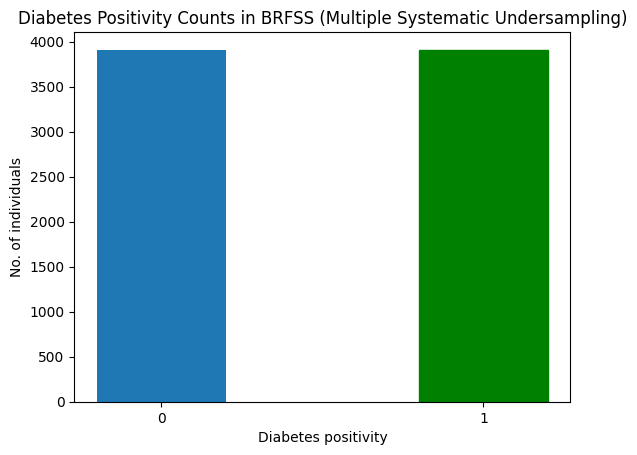

In [39]:
barlist = plt.bar([str(0),str(1)], y_S_Sy.value_counts(), width = 0.4)
barlist[1].set_color('g')

plt.xlabel("Diabetes positivity")
plt.ylabel("No. of individuals")
plt.title("Diabetes Positivity Counts in BRFSS (Multiple Systematic Undersampling)")
plt.show()

In [40]:
print('X_S_train:',np.shape(X_S_train))
print('y_S_train:',np.shape(y_S_train))
print('X_S_test:',np.shape(X_S_test))
print('y_S_test:',np.shape(y_S_test))

X_S_train: (6256, 20)
y_S_train: (6256,)
X_S_test: (1564, 20)
y_S_test: (1564,)


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_105"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_735 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_736 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_737 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_738 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_739 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_740 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_741 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - AUC: 0.6577 - loss: 0.6597 - val_AUC: 0.8409 - val_loss: 0.5265
Epoch 2/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.8055 - loss: 0.5397 - val_AUC: 0.8628 - val_loss: 0.4764
Epoch 3/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.8620 - loss: 0.4615 - val_AUC: 0.8966 - val_loss: 0.4657
Epoch 4/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8925 - loss: 0.4135 - val_AUC: 0.9116 - val_loss: 0.3854
Epoch 5/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9220 - loss: 0.3543 - val_AUC: 0.9160 - val_loss: 0.3866
Epoch 6/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.9201 - loss: 0.3587 - val_AUC: 0.9041 - val_loss: 0.5353
Epoch 7/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9268 - loss: 0.3491 - val_AUC: 0.9266 - val_loss: 0.3554
Epoch 8/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9350 - loss: 0.3287 - val_AUC: 0.9403 - val_loss: 0.3226
Epoch 9/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

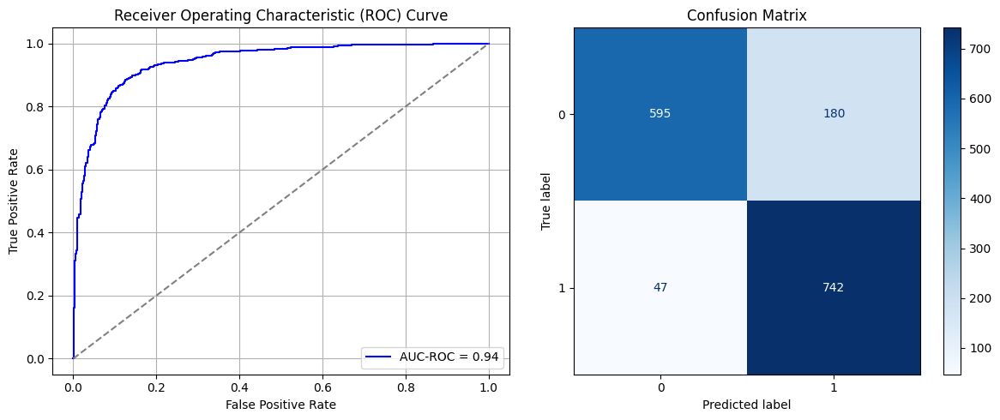

Best threshold based on F1-score: 0.6170216202735901
Time elapsed (performance): 17.692233236999527


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_106"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_742 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_743 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_744 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_745 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_746 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_747 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_748 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - AUC: 0.6885 - loss: 1.1782 - val_AUC: 0.0000e+00 - val_loss: 1.2952
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6921 - loss: 0.6628 - val_AUC: 0.0000e+00 - val_loss: 0.9446
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7212 - loss: 0.5920 - val_AUC: 0.0000e+00 - val_loss: 0.9001
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7084 - loss: 0.5931 - val_AUC: 0.0000e+00 - val_loss: 0.9142
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7339 - loss: 0.5692 - val_AUC: 0.0000e+00 - val_loss: 0.8978
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7358 - loss: 0.5651 - val_AUC: 0.0000e+00 - val_loss: 0.8042
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7543 - loss: 0.5482 - val_AUC: 0.0000e+00 - val_loss: 0.8090
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7412 - l

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_107"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_749 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_750 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_751 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_752 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_753 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_754 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_755 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - AUC: 0.6760 - loss: 1.1158 - val_AUC: 0.0000e+00 - val_loss: 1.2793
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7158 - loss: 0.6387 - val_AUC: 0.0000e+00 - val_loss: 1.0164
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7251 - loss: 0.5835 - val_AUC: 0.0000e+00 - val_loss: 0.9077
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7172 - loss: 0.5779 - val_AUC: 0.0000e+00 - val_loss: 0.7483
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7393 - loss: 0.5627 - val_AUC: 0.0000e+00 - val_loss: 0.8392
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7543 - loss: 0.5510 - val_AUC: 0.0000e+00 - val_loss: 0.8284
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7428 - loss: 0.5542 - val_AUC: 0.0000e+00 - val_loss: 0.7752
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7495 - loss: 0.5486 - val_AUC: 0.0000e+00 - val_loss: 0.7560
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_108"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_756 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_757 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_758 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_759 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_760 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_761 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_762 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - AUC: 0.6957 - loss: 1.1272 - val_AUC: 0.0000e+00 - val_loss: 1.2451
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6952 - loss: 0.6665 - val_AUC: 0.0000e+00 - val_loss: 1.0259
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7167 - loss: 0.6013 - val_AUC: 0.0000e+00 - val_loss: 0.9629
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7193 - loss: 0.5894 - val_AUC: 0.0000e+00 - val_loss: 0.8972
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7337 - loss: 0.5678 - val_AUC: 0.0000e+00 - val_loss: 0.8632
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7475 - loss: 0.5521 - val_AUC: 0.0000e+00 - val_loss: 0.8807
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7327 - loss: 0.5678 - val_AUC: 0.0000e+00 - val_loss: 0.8907
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7501 - loss: 0.5493 - val_AUC: 0.0000e+00 - val_loss: 0.8254
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_109"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_763 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_764 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_765 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_766 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_767 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_768 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_769 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - AUC: 0.6772 - loss: 1.1707 - val_AUC: 0.0000e+00 - val_loss: 1.2888
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7117 - loss: 0.6335 - val_AUC: 0.0000e+00 - val_loss: 0.9867
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7164 - loss: 0.6017 - val_AUC: 0.0000e+00 - val_loss: 0.9551
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7340 - loss: 0.5791 - val_AUC: 0.0000e+00 - val_loss: 0.9416
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7296 - loss: 0.5807 - val_AUC: 0.0000e+00 - val_loss: 0.9180
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7306 - loss: 0.5603 - val_AUC: 0.0000e+00 - val_loss: 0.8169
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7314 - loss: 0.5678 - val_AUC: 0.0000e+00 - val_loss: 0.8723
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7499 - loss: 0.5500 - val_AUC: 0.0000e+00 - val_loss: 0.8166
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_110"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_770 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_771 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_772 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_773 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_774 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_775 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_776 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - AUC: 0.6809 - loss: 1.1730 - val_AUC: 0.0000e+00 - val_loss: 1.3378
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6931 - loss: 0.6571 - val_AUC: 0.0000e+00 - val_loss: 0.9338
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7096 - loss: 0.5988 - val_AUC: 0.0000e+00 - val_loss: 0.8758
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7292 - loss: 0.5820 - val_AUC: 0.0000e+00 - val_loss: 0.9202
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7288 - loss: 0.5810 - val_AUC: 0.0000e+00 - val_loss: 0.8879
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7406 - loss: 0.5580 - val_AUC: 0.0000e+00 - val_loss: 0.8422
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7615 - loss: 0.5431 - val_AUC: 0.0000e+00 - val_loss: 0.8493
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7354 - loss: 0.5637 - val_AUC: 0.0000e+00 - val_loss: 0.8903
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_111"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_777 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_778 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_779 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_780 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_781 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_782 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_783 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - AUC: 0.6921 - loss: 1.0956 - val_AUC: 0.0000e+00 - val_loss: 1.3249
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7018 - loss: 0.6552 - val_AUC: 0.0000e+00 - val_loss: 0.9853
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7261 - loss: 0.5905 - val_AUC: 0.0000e+00 - val_loss: 0.8736
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7201 - loss: 0.5841 - val_AUC: 0.0000e+00 - val_loss: 0.8842
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7344 - loss: 0.5613 - val_AUC: 0.0000e+00 - val_loss: 0.7887
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7262 - loss: 0.5679 - val_AUC: 0.0000e+00 - val_loss: 0.8568
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7317 - loss: 0.5617 - val_AUC: 0.0000e+00 - val_loss: 0.8217
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7582 - loss: 0.5452 - val_AUC: 0.0000e+00 - val_loss: 0.8445
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_112"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_784 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_785 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_786 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_787 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_788 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_789 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_790 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - AUC: 0.6676 - loss: 1.1827 - val_AUC: 0.0000e+00 - val_loss: 1.3253
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6880 - loss: 0.6601 - val_AUC: 0.0000e+00 - val_loss: 1.0363
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7210 - loss: 0.5931 - val_AUC: 0.0000e+00 - val_loss: 0.9960
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7527 - loss: 0.5485 - val_AUC: 0.0000e+00 - val_loss: 0.8456
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7060 - loss: 0.5919 - val_AUC: 0.0000e+00 - val_loss: 0.8978
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7334 - loss: 0.5682 - val_AUC: 0.0000e+00 - val_loss: 0.8438
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7311 - loss: 0.5715 - val_AUC: 0.0000e+00 - val_loss: 0.8501
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7315 - loss: 0.5573 - val_AUC: 0.0000e+00 - val_loss: 0.8425
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_113"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_791 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_792 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_793 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_794 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_795 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_796 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_797 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - AUC: 0.7045 - loss: 1.0723 - val_AUC: 0.0000e+00 - val_loss: 1.2883
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6908 - loss: 0.6657 - val_AUC: 0.0000e+00 - val_loss: 0.9547
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7277 - loss: 0.5767 - val_AUC: 0.0000e+00 - val_loss: 0.8120
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7223 - loss: 0.5861 - val_AUC: 0.0000e+00 - val_loss: 0.8896
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7407 - loss: 0.5631 - val_AUC: 0.0000e+00 - val_loss: 0.8647
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7285 - loss: 0.5714 - val_AUC: 0.0000e+00 - val_loss: 0.8793
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7454 - loss: 0.5469 - val_AUC: 0.0000e+00 - val_loss: 0.8705
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7611 - loss: 0.5387 - val_AUC: 0.0000e+00 - val_loss: 0.7844
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_114"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_798 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_799 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_800 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_801 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_802 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_803 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_804 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - AUC: 0.6968 - loss: 1.1219 - val_AUC: 0.0000e+00 - val_loss: 1.2822
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7146 - loss: 0.6399 - val_AUC: 0.0000e+00 - val_loss: 1.0139
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7083 - loss: 0.6125 - val_AUC: 0.0000e+00 - val_loss: 0.9679
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7322 - loss: 0.5766 - val_AUC: 0.0000e+00 - val_loss: 0.8248
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7358 - loss: 0.5681 - val_AUC: 0.0000e+00 - val_loss: 0.8054
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7188 - loss: 0.5700 - val_AUC: 0.0000e+00 - val_loss: 0.8054
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7575 - loss: 0.5472 - val_AUC: 0.0000e+00 - val_loss: 0.8205
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7363 - loss: 0.5605 - val_AUC: 0.0000e+00 - val_loss: 0.8488
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_115"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_805 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_806 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_807 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_808 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_809 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_810 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_811 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - AUC: 0.6754 - loss: 1.1641 - val_AUC: 0.0000e+00 - val_loss: 1.3494
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6627 - loss: 0.6981 - val_AUC: 0.0000e+00 - val_loss: 0.9926
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6949 - loss: 0.6097 - val_AUC: 0.0000e+00 - val_loss: 0.8666
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7432 - loss: 0.5611 - val_AUC: 0.0000e+00 - val_loss: 0.8515
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7289 - loss: 0.5706 - val_AUC: 0.0000e+00 - val_loss: 0.9011
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7214 - loss: 0.5799 - val_AUC: 0.0000e+00 - val_loss: 0.8062
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7415 - loss: 0.5595 - val_AUC: 0.0000e+00 - val_loss: 0.8063
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7433 - loss: 0.5527 - val_AUC: 0.0000e+00 - val_loss: 0.7525
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_116"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_812 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_813 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_814 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_815 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_816 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_817 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_818 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - AUC: 0.6817 - loss: 1.1257 - val_AUC: 0.0000e+00 - val_loss: 1.3089
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7140 - loss: 0.6280 - val_AUC: 0.0000e+00 - val_loss: 0.9952
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7317 - loss: 0.5834 - val_AUC: 0.0000e+00 - val_loss: 0.9055
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7202 - loss: 0.5764 - val_AUC: 0.0000e+00 - val_loss: 0.8793
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7312 - loss: 0.5728 - val_AUC: 0.0000e+00 - val_loss: 0.8007
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7263 - loss: 0.5705 - val_AUC: 0.0000e+00 - val_loss: 0.8729
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7396 - loss: 0.5664 - val_AUC: 0.0000e+00 - val_loss: 0.8479
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7276 - loss: 0.5610 - val_AUC: 0.0000e+00 - val_loss: 0.8436
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_117"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_819 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_820 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_821 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_822 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_823 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_824 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_825 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - AUC: 0.7114 - loss: 1.0658 - val_AUC: 0.0000e+00 - val_loss: 1.3428
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7169 - loss: 0.6379 - val_AUC: 0.0000e+00 - val_loss: 1.0244
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7110 - loss: 0.6000 - val_AUC: 0.0000e+00 - val_loss: 0.8988
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7414 - loss: 0.5635 - val_AUC: 0.0000e+00 - val_loss: 0.8963
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7184 - loss: 0.5702 - val_AUC: 0.0000e+00 - val_loss: 0.8041
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7287 - loss: 0.5736 - val_AUC: 0.0000e+00 - val_loss: 0.8716
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7403 - loss: 0.5555 - val_AUC: 0.0000e+00 - val_loss: 0.8230
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7590 - loss: 0.5385 - val_AUC: 0.0000e+00 - val_loss: 0.8646
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_118"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_826 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_827 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_828 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_829 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_830 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_831 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_832 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - AUC: 0.6584 - loss: 1.2010 - val_AUC: 0.0000e+00 - val_loss: 1.3096
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.6971 - loss: 0.6642 - val_AUC: 0.0000e+00 - val_loss: 1.0042
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7158 - loss: 0.6008 - val_AUC: 0.0000e+00 - val_loss: 0.9148
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7118 - loss: 0.5888 - val_AUC: 0.0000e+00 - val_loss: 0.8908
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7303 - loss: 0.5628 - val_AUC: 0.0000e+00 - val_loss: 0.8351
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7457 - loss: 0.5494 - val_AUC: 0.0000e+00 - val_loss: 0.8633
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7461 - loss: 0.5533 - val_AUC: 0.0000e+00 - val_loss: 0.8850
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7099 - loss: 0.5743 - val_AUC: 0.0000e+00 - val_loss: 0.8231
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_119"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_833 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_834 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_835 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_836 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_837 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_838 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_839 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - AUC: 0.6661 - loss: 1.1864 - val_AUC: 0.0000e+00 - val_loss: 1.3156
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7068 - loss: 0.6502 - val_AUC: 0.0000e+00 - val_loss: 0.9787
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7101 - loss: 0.5970 - val_AUC: 0.0000e+00 - val_loss: 0.8737
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7281 - loss: 0.5718 - val_AUC: 0.0000e+00 - val_loss: 0.8406
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7225 - loss: 0.5859 - val_AUC: 0.0000e+00 - val_loss: 0.8533
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7359 - loss: 0.5607 - val_AUC: 0.0000e+00 - val_loss: 0.8957
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7406 - loss: 0.5646 - val_AUC: 0.0000e+00 - val_loss: 0.8689
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7440 - loss: 0.5501 - val_AUC: 0.0000e+00 - val_loss: 0.8458
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_120"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_840 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_841 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_842 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_843 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_844 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_845 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_846 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - AUC: 0.6791 - loss: 1.1721 - val_AUC: 0.0000e+00 - val_loss: 1.3589
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7057 - loss: 0.6487 - val_AUC: 0.0000e+00 - val_loss: 0.9602
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7058 - loss: 0.6063 - val_AUC: 0.0000e+00 - val_loss: 0.9399
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7343 - loss: 0.5751 - val_AUC: 0.0000e+00 - val_loss: 0.8756
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7295 - loss: 0.5831 - val_AUC: 0.0000e+00 - val_loss: 0.8736
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7220 - loss: 0.5814 - val_AUC: 0.0000e+00 - val_loss: 0.8417
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7516 - loss: 0.5563 - val_AUC: 0.0000e+00 - val_loss: 0.8151
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7496 - loss: 0.5565 - val_AUC: 0.0000e+00 - val_loss: 0.8686
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_121"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_847 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_848 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_849 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_850 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_851 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_852 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_853 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - AUC: 0.6950 - loss: 1.1624 - val_AUC: 0.0000e+00 - val_loss: 1.2246
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7168 - loss: 0.6467 - val_AUC: 0.0000e+00 - val_loss: 1.0673
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7101 - loss: 0.5948 - val_AUC: 0.0000e+00 - val_loss: 0.9457
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7443 - loss: 0.5594 - val_AUC: 0.0000e+00 - val_loss: 0.8250
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7372 - loss: 0.5705 - val_AUC: 0.0000e+00 - val_loss: 0.8693
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7472 - loss: 0.5602 - val_AUC: 0.0000e+00 - val_loss: 0.8498
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7194 - loss: 0.5572 - val_AUC: 0.0000e+00 - val_loss: 0.8397
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7323 - loss: 0.5598 - val_AUC: 0.0000e+00 - val_loss: 0.7941
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_122"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_854 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_855 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_856 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_857 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_858 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_859 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_860 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - AUC: 0.6931 - loss: 1.1110 - val_AUC: 0.0000e+00 - val_loss: 1.2883
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.6944 - loss: 0.6408 - val_AUC: 0.0000e+00 - val_loss: 0.9511
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7219 - loss: 0.5959 - val_AUC: 0.0000e+00 - val_loss: 0.9436
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7364 - loss: 0.5684 - val_AUC: 0.0000e+00 - val_loss: 0.8453
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7287 - loss: 0.5722 - val_AUC: 0.0000e+00 - val_loss: 0.9342
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7344 - loss: 0.5717 - val_AUC: 0.0000e+00 - val_loss: 0.9103
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7309 - loss: 0.5554 - val_AUC: 0.0000e+00 - val_loss: 0.8695
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7530 - loss: 0.5445 - val_AUC: 0.0000e+00 - val_loss: 0.8303
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_123"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_861 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_862 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_863 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_864 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_865 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_866 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_867 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - AUC: 0.6743 - loss: 1.2094 - val_AUC: 0.0000e+00 - val_loss: 1.3037
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7024 - loss: 0.6544 - val_AUC: 0.0000e+00 - val_loss: 0.9605
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7086 - loss: 0.5994 - val_AUC: 0.0000e+00 - val_loss: 0.9254
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7160 - loss: 0.5807 - val_AUC: 0.0000e+00 - val_loss: 0.9421
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7261 - loss: 0.5758 - val_AUC: 0.0000e+00 - val_loss: 0.8901
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7699 - loss: 0.5341 - val_AUC: 0.0000e+00 - val_loss: 0.8217
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7420 - loss: 0.5532 - val_AUC: 0.0000e+00 - val_loss: 0.8282
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7609 - loss: 0.5348 - val_AUC: 0.0000e+00 - val_loss: 0.8406
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_124"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_868 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_869 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_870 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_871 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_872 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_873 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_874 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - AUC: 0.6711 - loss: 1.2113 - val_AUC: 0.0000e+00 - val_loss: 1.3104
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6959 - loss: 0.6702 - val_AUC: 0.0000e+00 - val_loss: 0.9769
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7189 - loss: 0.5929 - val_AUC: 0.0000e+00 - val_loss: 0.9416
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7390 - loss: 0.5665 - val_AUC: 0.0000e+00 - val_loss: 0.8817
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7452 - loss: 0.5606 - val_AUC: 0.0000e+00 - val_loss: 0.8917
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7199 - loss: 0.5776 - val_AUC: 0.0000e+00 - val_loss: 0.8078
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7269 - loss: 0.5620 - val_AUC: 0.0000e+00 - val_loss: 0.7814
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7478 - loss: 0.5346 - val_AUC: 0.0000e+00 - val_loss: 0.7521
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_125"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_875 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_876 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_877 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_878 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_879 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_880 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_881 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - AUC: 0.6608 - loss: 1.1981 - val_AUC: 0.0000e+00 - val_loss: 1.3341
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7085 - loss: 0.6415 - val_AUC: 0.0000e+00 - val_loss: 0.9388
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7074 - loss: 0.6046 - val_AUC: 0.0000e+00 - val_loss: 0.9181
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7547 - loss: 0.5492 - val_AUC: 0.0000e+00 - val_loss: 0.8462
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7213 - loss: 0.5802 - val_AUC: 0.0000e+00 - val_loss: 0.9075
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7448 - loss: 0.5641 - val_AUC: 0.0000e+00 - val_loss: 0.8563
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7587 - loss: 0.5457 - val_AUC: 0.0000e+00 - val_loss: 0.8656
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7349 - loss: 0.5630 - val_AUC: 0.0000e+00 - val_loss: 0.8082
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_126"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_882 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_883 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_884 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_885 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_886 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_887 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_888 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 6s 17ms/step - AUC: 0.6101 - loss: 0.6732 - val_AUC: 0.7799 - val_loss: 0.5806
Epoch 2/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8166 - loss: 0.5241 - val_AUC: 0.8850 - val_loss: 0.4361
Epoch 3/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8769 - loss: 0.4382 - val_AUC: 0.9057 - val_loss: 0.3970
Epoch 4/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9044 - loss: 0.3896 - val_AUC: 0.9099 - val_loss: 0.3898
Epoch 5/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.9271 - loss: 0.3462 - val_AUC: 0.9202 - val_loss: 0.3753
Epoch 6/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9276 - loss: 0.3441 - val_AUC: 0.9381 - val_loss: 0.3455
Epoch 7/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9413 - loss: 0.3094 - val_AUC: 0.9344 - val_loss: 0.3782
Epoch 8/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9506 - loss: 0.2869 - val_AUC: 0.9457 - val_loss: 0.3069
Epoch 9/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

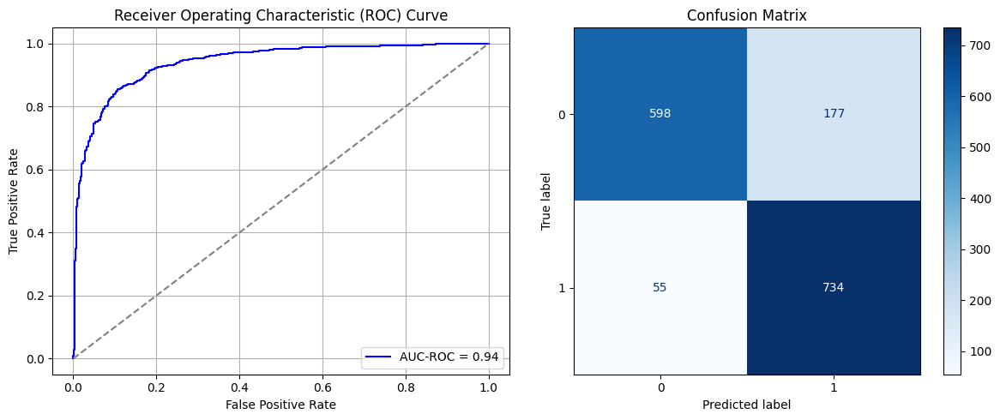

Best threshold based on F1-score: 0.6144689321517944
Time elapsed (performance): 13.582363171999532


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_127"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_889 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_890 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_891 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_892 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_893 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_894 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_895 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - AUC: 0.6769 - loss: 1.2680 - val_AUC: 0.0000e+00 - val_loss: 1.2581
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.6495 - loss: 0.6940 - val_AUC: 0.0000e+00 - val_loss: 0.8864
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6569 - loss: 0.6429 - val_AUC: 0.0000e+00 - val_loss: 0.9394
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6725 - loss: 0.6158 - val_AUC: 0.0000e+00 - val_loss: 0.8122
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6614 - loss: 0.6288 - val_AUC: 0.0000e+00 - val_loss: 0.8609
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6660 - loss: 0.6182 - val_AUC: 0.0000e+00 - val_loss: 0.8109
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6621 - loss: 0.6199 - val_AUC: 0.0000e+00 - val_loss: 0.9201
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6640 - loss: 0.6203 - val_AUC: 0.0000e+00 - val_loss: 0.9062
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_128"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_896 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_897 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_898 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_899 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_900 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_901 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_902 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - AUC: 0.6741 - loss: 1.3240 - val_AUC: 0.0000e+00 - val_loss: 1.2881
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6533 - loss: 0.6983 - val_AUC: 0.0000e+00 - val_loss: 0.8795
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6793 - loss: 0.6167 - val_AUC: 0.0000e+00 - val_loss: 0.8766
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6614 - loss: 0.6339 - val_AUC: 0.0000e+00 - val_loss: 0.8753
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6726 - loss: 0.6217 - val_AUC: 0.0000e+00 - val_loss: 0.8976
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6567 - loss: 0.6275 - val_AUC: 0.0000e+00 - val_loss: 0.9166
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6371 - loss: 0.6446 - val_AUC: 0.0000e+00 - val_loss: 0.9385
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6797 - loss: 0.6098 - val_AUC: 0.0000e+00 - val_loss: 0.8177
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_129"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_903 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_904 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_905 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_906 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_907 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_908 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_909 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - AUC: 0.6625 - loss: 1.3895 - val_AUC: 0.0000e+00 - val_loss: 1.2131
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6627 - loss: 0.6822 - val_AUC: 0.0000e+00 - val_loss: 1.0074
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6581 - loss: 0.6390 - val_AUC: 0.0000e+00 - val_loss: 0.9398
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6493 - loss: 0.6322 - val_AUC: 0.0000e+00 - val_loss: 0.9345
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6703 - loss: 0.6183 - val_AUC: 0.0000e+00 - val_loss: 0.7934
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6728 - loss: 0.6205 - val_AUC: 0.0000e+00 - val_loss: 0.9236
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6757 - loss: 0.6073 - val_AUC: 0.0000e+00 - val_loss: 0.8911
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6694 - loss: 0.6237 - val_AUC: 0.0000e+00 - val_loss: 0.8950
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_130"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_910 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_911 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_912 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_913 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_914 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_915 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_916 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - AUC: 0.6613 - loss: 1.3533 - val_AUC: 0.0000e+00 - val_loss: 1.3058
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.6774 - loss: 0.6479 - val_AUC: 0.0000e+00 - val_loss: 0.8561
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6650 - loss: 0.6438 - val_AUC: 0.0000e+00 - val_loss: 0.9741
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6433 - loss: 0.6380 - val_AUC: 0.0000e+00 - val_loss: 0.8928
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6448 - loss: 0.6349 - val_AUC: 0.0000e+00 - val_loss: 0.9177
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6644 - loss: 0.6320 - val_AUC: 0.0000e+00 - val_loss: 0.9375
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6807 - loss: 0.6087 - val_AUC: 0.0000e+00 - val_loss: 0.8327
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6739 - loss: 0.6190 - val_AUC: 0.0000e+00 - val_loss: 1.0145
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_131"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_917 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_918 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_919 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_920 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_921 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_922 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_923 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - AUC: 0.6486 - loss: 1.3756 - val_AUC: 0.0000e+00 - val_loss: 1.3194
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6473 - loss: 0.7283 - val_AUC: 0.0000e+00 - val_loss: 0.9484
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6507 - loss: 0.6417 - val_AUC: 0.0000e+00 - val_loss: 0.8759
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6532 - loss: 0.6294 - val_AUC: 0.0000e+00 - val_loss: 0.8956
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6816 - loss: 0.6191 - val_AUC: 0.0000e+00 - val_loss: 0.8978
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6734 - loss: 0.6140 - val_AUC: 0.0000e+00 - val_loss: 0.8360
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6591 - loss: 0.6274 - val_AUC: 0.0000e+00 - val_loss: 0.8084
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7076 - loss: 0.5955 - val_AUC: 0.0000e+00 - val_loss: 0.9027
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_132"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_924 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_925 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_926 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_927 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_928 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_929 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_930 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - AUC: 0.6658 - loss: 1.3219 - val_AUC: 0.0000e+00 - val_loss: 1.2281
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6445 - loss: 0.7226 - val_AUC: 0.0000e+00 - val_loss: 1.0778
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6312 - loss: 0.6611 - val_AUC: 0.0000e+00 - val_loss: 1.0528
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6369 - loss: 0.6551 - val_AUC: 0.0000e+00 - val_loss: 1.0103
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6767 - loss: 0.6160 - val_AUC: 0.0000e+00 - val_loss: 0.8024
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6714 - loss: 0.6177 - val_AUC: 0.0000e+00 - val_loss: 0.8427
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6568 - loss: 0.6281 - val_AUC: 0.0000e+00 - val_loss: 0.9451
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6618 - loss: 0.6202 - val_AUC: 0.0000e+00 - val_loss: 0.8424
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_133"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_931 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_932 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_933 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_934 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_935 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_936 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_937 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - AUC: 0.6649 - loss: 1.3156 - val_AUC: 0.0000e+00 - val_loss: 1.2310
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6788 - loss: 0.6663 - val_AUC: 0.0000e+00 - val_loss: 0.9568
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6446 - loss: 0.6467 - val_AUC: 0.0000e+00 - val_loss: 0.9463
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6716 - loss: 0.6208 - val_AUC: 0.0000e+00 - val_loss: 0.8558
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6482 - loss: 0.6301 - val_AUC: 0.0000e+00 - val_loss: 0.8503
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6485 - loss: 0.6256 - val_AUC: 0.0000e+00 - val_loss: 0.9512
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.6762 - loss: 0.6080 - val_AUC: 0.0000e+00 - val_loss: 0.8983
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6834 - loss: 0.6123 - val_AUC: 0.0000e+00 - val_loss: 0.8503
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_134"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_938 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_939 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_940 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_941 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_942 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_943 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_944 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - AUC: 0.6803 - loss: 1.3709 - val_AUC: 0.0000e+00 - val_loss: 1.2369
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6692 - loss: 0.6798 - val_AUC: 0.0000e+00 - val_loss: 0.8970
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6697 - loss: 0.6304 - val_AUC: 0.0000e+00 - val_loss: 0.9169
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6679 - loss: 0.6273 - val_AUC: 0.0000e+00 - val_loss: 0.9516
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6676 - loss: 0.6235 - val_AUC: 0.0000e+00 - val_loss: 0.8203
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6710 - loss: 0.6257 - val_AUC: 0.0000e+00 - val_loss: 0.8563
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6617 - loss: 0.6232 - val_AUC: 0.0000e+00 - val_loss: 0.9431
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6708 - loss: 0.6260 - val_AUC: 0.0000e+00 - val_loss: 0.9335
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_135"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_945 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_946 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_947 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_948 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_949 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_950 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_951 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step - AUC: 0.6652 - loss: 1.3741 - val_AUC: 0.0000e+00 - val_loss: 1.2569
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6605 - loss: 0.7015 - val_AUC: 0.0000e+00 - val_loss: 0.9853
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6499 - loss: 0.6463 - val_AUC: 0.0000e+00 - val_loss: 0.9388
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6619 - loss: 0.6284 - val_AUC: 0.0000e+00 - val_loss: 0.8731
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6855 - loss: 0.6155 - val_AUC: 0.0000e+00 - val_loss: 0.9106
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6553 - loss: 0.6296 - val_AUC: 0.0000e+00 - val_loss: 1.0032
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6551 - loss: 0.6340 - val_AUC: 0.0000e+00 - val_loss: 0.8585
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6700 - loss: 0.6065 - val_AUC: 0.0000e+00 - val_loss: 0.8830
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_136"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_952 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_953 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_954 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_955 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_956 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_957 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_958 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - AUC: 0.6624 - loss: 1.3729 - val_AUC: 0.0000e+00 - val_loss: 1.3190
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6566 - loss: 0.7070 - val_AUC: 0.0000e+00 - val_loss: 1.0283
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6636 - loss: 0.6383 - val_AUC: 0.0000e+00 - val_loss: 1.0227
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6649 - loss: 0.6332 - val_AUC: 0.0000e+00 - val_loss: 1.0152
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6474 - loss: 0.6425 - val_AUC: 0.0000e+00 - val_loss: 0.8962
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6514 - loss: 0.6333 - val_AUC: 0.0000e+00 - val_loss: 0.9608
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6671 - loss: 0.6185 - val_AUC: 0.0000e+00 - val_loss: 0.8350
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6743 - loss: 0.6159 - val_AUC: 0.0000e+00 - val_loss: 0.8638
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_137"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_959 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_960 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_961 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_962 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_963 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_964 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_965 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - AUC: 0.6710 - loss: 1.3437 - val_AUC: 0.0000e+00 - val_loss: 1.3366
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6557 - loss: 0.6940 - val_AUC: 0.0000e+00 - val_loss: 0.9640
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6611 - loss: 0.6319 - val_AUC: 0.0000e+00 - val_loss: 0.8341
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6295 - loss: 0.6548 - val_AUC: 0.0000e+00 - val_loss: 0.8906
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6583 - loss: 0.6317 - val_AUC: 0.0000e+00 - val_loss: 0.8769
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6558 - loss: 0.6168 - val_AUC: 0.0000e+00 - val_loss: 0.7724
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6626 - loss: 0.6258 - val_AUC: 0.0000e+00 - val_loss: 0.9208
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6965 - loss: 0.6086 - val_AUC: 0.0000e+00 - val_loss: 0.9052
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_138"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_966 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_967 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_968 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_969 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_970 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_971 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_972 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - AUC: 0.6516 - loss: 1.3418 - val_AUC: 0.0000e+00 - val_loss: 1.2818
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6542 - loss: 0.7014 - val_AUC: 0.0000e+00 - val_loss: 1.0431
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6409 - loss: 0.6453 - val_AUC: 0.0000e+00 - val_loss: 0.8949
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.6624 - loss: 0.6314 - val_AUC: 0.0000e+00 - val_loss: 0.9229
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6569 - loss: 0.6123 - val_AUC: 0.0000e+00 - val_loss: 0.8115
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6599 - loss: 0.6328 - val_AUC: 0.0000e+00 - val_loss: 0.9358
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6707 - loss: 0.6256 - val_AUC: 0.0000e+00 - val_loss: 0.9518
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.6690 - loss: 0.6157 - val_AUC: 0.0000e+00 - val_loss: 0.8992
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_139"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_973 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_974 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_975 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_976 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_977 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_978 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_979 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - AUC: 0.6472 - loss: 1.3927 - val_AUC: 0.0000e+00 - val_loss: 1.3488
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6392 - loss: 0.7223 - val_AUC: 0.0000e+00 - val_loss: 0.9261
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6746 - loss: 0.6249 - val_AUC: 0.0000e+00 - val_loss: 0.8904
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6434 - loss: 0.6382 - val_AUC: 0.0000e+00 - val_loss: 0.9767
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6615 - loss: 0.6260 - val_AUC: 0.0000e+00 - val_loss: 0.9289
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6603 - loss: 0.6259 - val_AUC: 0.0000e+00 - val_loss: 1.0009
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6822 - loss: 0.6121 - val_AUC: 0.0000e+00 - val_loss: 0.8853
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6803 - loss: 0.6017 - val_AUC: 0.0000e+00 - val_loss: 0.8614
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_140"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_980 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_981 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_982 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_983 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_984 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_985 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_986 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step - AUC: 0.6577 - loss: 1.3587 - val_AUC: 0.0000e+00 - val_loss: 1.3373
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6579 - loss: 0.6938 - val_AUC: 0.0000e+00 - val_loss: 0.9639
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6606 - loss: 0.6367 - val_AUC: 0.0000e+00 - val_loss: 0.9458
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6628 - loss: 0.6388 - val_AUC: 0.0000e+00 - val_loss: 0.9335
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6430 - loss: 0.6277 - val_AUC: 0.0000e+00 - val_loss: 0.9038
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6816 - loss: 0.6133 - val_AUC: 0.0000e+00 - val_loss: 0.8879
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6803 - loss: 0.6169 - val_AUC: 0.0000e+00 - val_loss: 0.8378
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6696 - loss: 0.6197 - val_AUC: 0.0000e+00 - val_loss: 0.7959
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_141"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_987 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_988 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_989 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_990 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_991 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_992 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_993 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - AUC: 0.6636 - loss: 1.3228 - val_AUC: 0.0000e+00 - val_loss: 1.2717
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6585 - loss: 0.6857 - val_AUC: 0.0000e+00 - val_loss: 0.9225
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6676 - loss: 0.6252 - val_AUC: 0.0000e+00 - val_loss: 0.9852
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6598 - loss: 0.6185 - val_AUC: 0.0000e+00 - val_loss: 0.9081
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6693 - loss: 0.6173 - val_AUC: 0.0000e+00 - val_loss: 0.9175
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6721 - loss: 0.6215 - val_AUC: 0.0000e+00 - val_loss: 0.9975
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6800 - loss: 0.6140 - val_AUC: 0.0000e+00 - val_loss: 0.8025
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6730 - loss: 0.6179 - val_AUC: 0.0000e+00 - val_loss: 0.8068
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_142"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_994 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_995 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_996 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_997 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_998 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_999 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1000 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - AUC: 0.6495 - loss: 1.4480 - val_AUC: 0.0000e+00 - val_loss: 1.1748
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6579 - loss: 0.6990 - val_AUC: 0.0000e+00 - val_loss: 0.9086
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6822 - loss: 0.6266 - val_AUC: 0.0000e+00 - val_loss: 0.9552
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6756 - loss: 0.6120 - val_AUC: 0.0000e+00 - val_loss: 0.8445
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6557 - loss: 0.6330 - val_AUC: 0.0000e+00 - val_loss: 0.7567
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6577 - loss: 0.6286 - val_AUC: 0.0000e+00 - val_loss: 0.8802
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6716 - loss: 0.6189 - val_AUC: 0.0000e+00 - val_loss: 0.8828
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6735 - loss: 0.6042 - val_AUC: 0.0000e+00 - val_loss: 0.8215
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_143"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1001 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1002 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1003 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1004 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1005 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1006 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1007 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - AUC: 0.6558 - loss: 1.3801 - val_AUC: 0.0000e+00 - val_loss: 1.2984
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6556 - loss: 0.7192 - val_AUC: 0.0000e+00 - val_loss: 0.8756
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6454 - loss: 0.6417 - val_AUC: 0.0000e+00 - val_loss: 0.8882
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6361 - loss: 0.6388 - val_AUC: 0.0000e+00 - val_loss: 0.9367
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6591 - loss: 0.6171 - val_AUC: 0.0000e+00 - val_loss: 0.9902
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6617 - loss: 0.6294 - val_AUC: 0.0000e+00 - val_loss: 0.9725
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6738 - loss: 0.6158 - val_AUC: 0.0000e+00 - val_loss: 0.9151
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6583 - loss: 0.6309 - val_AUC: 0.0000e+00 - val_loss: 0.9230
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_144"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1008 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1009 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1010 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1011 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1012 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1013 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1014 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - AUC: 0.6512 - loss: 1.4310 - val_AUC: 0.0000e+00 - val_loss: 1.3028
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6580 - loss: 0.7024 - val_AUC: 0.0000e+00 - val_loss: 0.9504
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6621 - loss: 0.6342 - val_AUC: 0.0000e+00 - val_loss: 0.9552
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6591 - loss: 0.6291 - val_AUC: 0.0000e+00 - val_loss: 0.9083
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6561 - loss: 0.6296 - val_AUC: 0.0000e+00 - val_loss: 0.9633
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.6605 - loss: 0.6202 - val_AUC: 0.0000e+00 - val_loss: 0.9893
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6695 - loss: 0.6141 - val_AUC: 0.0000e+00 - val_loss: 0.7975
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.6853 - loss: 0.6097 - val_AUC: 0.0000e+00 - val_loss: 0.8915
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_145"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1015 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1016 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1017 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1018 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1019 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1020 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1021 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - AUC: 0.6602 - loss: 1.3745 - val_AUC: 0.0000e+00 - val_loss: 1.2811
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6537 - loss: 0.7010 - val_AUC: 0.0000e+00 - val_loss: 0.8624
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6694 - loss: 0.6260 - val_AUC: 0.0000e+00 - val_loss: 0.8529
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6411 - loss: 0.6356 - val_AUC: 0.0000e+00 - val_loss: 0.7902
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6701 - loss: 0.6239 - val_AUC: 0.0000e+00 - val_loss: 0.9115
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6606 - loss: 0.6236 - val_AUC: 0.0000e+00 - val_loss: 0.9255
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6694 - loss: 0.6196 - val_AUC: 0.0000e+00 - val_loss: 0.9136
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6792 - loss: 0.6056 - val_AUC: 0.0000e+00 - val_loss: 0.8988
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_146"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1022 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1023 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1024 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1025 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1026 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1027 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1028 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - AUC: 0.6590 - loss: 1.3996 - val_AUC: 0.0000e+00 - val_loss: 1.2075
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6544 - loss: 0.7063 - val_AUC: 0.0000e+00 - val_loss: 0.9491
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6488 - loss: 0.6400 - val_AUC: 0.0000e+00 - val_loss: 0.8620
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6727 - loss: 0.6219 - val_AUC: 0.0000e+00 - val_loss: 0.9390
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6615 - loss: 0.6170 - val_AUC: 0.0000e+00 - val_loss: 0.7484
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6557 - loss: 0.6386 - val_AUC: 0.0000e+00 - val_loss: 0.9267
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6584 - loss: 0.6225 - val_AUC: 0.0000e+00 - val_loss: 0.8099
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6664 - loss: 0.6236 - val_AUC: 0.0000e+00 - val_loss: 0.8680
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_147"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1029 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1030 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1031 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1032 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1033 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1034 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1035 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 6s 18ms/step - AUC: 0.6510 - loss: 0.6566 - val_AUC: 0.8168 - val_loss: 0.5322
Epoch 2/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8098 - loss: 0.5308 - val_AUC: 0.8824 - val_loss: 0.4971
Epoch 3/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.8787 - loss: 0.4389 - val_AUC: 0.8958 - val_loss: 0.4081
Epoch 4/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.9099 - loss: 0.3831 - val_AUC: 0.9156 - val_loss: 0.3826
Epoch 5/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9304 - loss: 0.3388 - val_AUC: 0.9368 - val_loss: 0.3850
Epoch 6/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9343 - loss: 0.3288 - val_AUC: 0.9427 - val_loss: 0.3055
Epoch 7/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9565 - loss: 0.2676 - val_AUC: 0.9485 - val_loss: 0.3000
Epoch 8/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9595 - loss: 0.2581 - val_AUC: 0.9327 - val_loss: 0.3614
Epoch 9/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

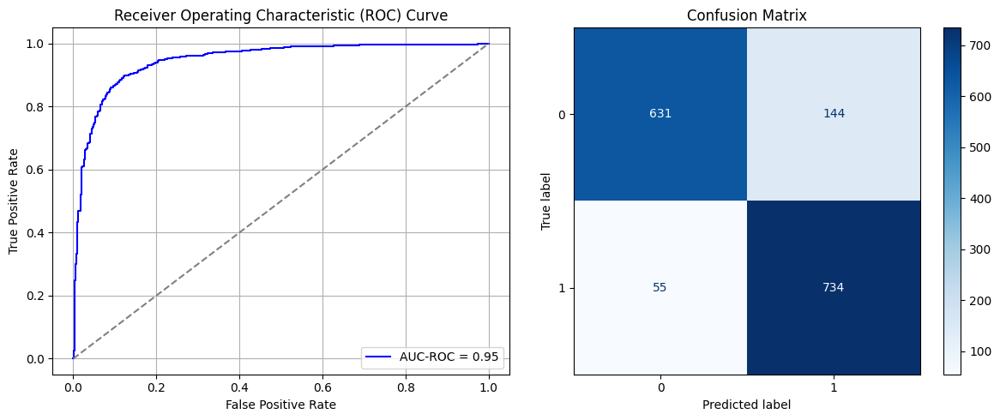

<ipython-input-23-93669339d7ff>:78: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)


Best threshold based on F1-score: 0.9994356036186218
Time elapsed (performance): 13.158176455999637


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_148"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1036 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1037 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1038 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1039 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1040 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1041 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1042 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - AUC: 0.6663 - loss: 0.8299 - val_AUC: 0.0000e+00 - val_loss: 0.9452
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6731 - loss: 0.6295 - val_AUC: 0.0000e+00 - val_loss: 0.8434
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6487 - loss: 0.6246 - val_AUC: 0.0000e+00 - val_loss: 0.9277
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6797 - loss: 0.5969 - val_AUC: 0.0000e+00 - val_loss: 0.8694
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6929 - loss: 0.5847 - val_AUC: 0.0000e+00 - val_loss: 0.8717
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6753 - loss: 0.6139 - val_AUC: 0.0000e+00 - val_loss: 0.9856
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6817 - loss: 0.5962 - val_AUC: 0.0000e+00 - val_loss: 0.8210
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6981 - l

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_149"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1043 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1044 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1045 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1046 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1047 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1048 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1049 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - AUC: 0.6775 - loss: 0.7843 - val_AUC: 0.0000e+00 - val_loss: 0.9917
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6887 - loss: 0.6182 - val_AUC: 0.0000e+00 - val_loss: 0.9632
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6733 - loss: 0.6108 - val_AUC: 0.0000e+00 - val_loss: 0.8702
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6587 - loss: 0.6180 - val_AUC: 0.0000e+00 - val_loss: 0.8771
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6859 - loss: 0.5986 - val_AUC: 0.0000e+00 - val_loss: 0.9001
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6692 - loss: 0.6099 - val_AUC: 0.0000e+00 - val_loss: 0.9414
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6893 - loss: 0.5988 - val_AUC: 0.0000e+00 - val_loss: 0.9162
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6917 - loss: 0.5966 - val_AUC: 0.0000e+00 - val_loss: 0.8628
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_150"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1050 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1051 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1052 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1053 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1054 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1055 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1056 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - AUC: 0.6489 - loss: 0.8264 - val_AUC: 0.0000e+00 - val_loss: 1.0191
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6564 - loss: 0.6351 - val_AUC: 0.0000e+00 - val_loss: 0.9208
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6771 - loss: 0.6155 - val_AUC: 0.0000e+00 - val_loss: 0.9739
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6644 - loss: 0.6152 - val_AUC: 0.0000e+00 - val_loss: 0.9203
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6797 - loss: 0.6025 - val_AUC: 0.0000e+00 - val_loss: 0.8973
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6903 - loss: 0.6004 - val_AUC: 0.0000e+00 - val_loss: 0.9326
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6998 - loss: 0.5936 - val_AUC: 0.0000e+00 - val_loss: 0.8446
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6808 - loss: 0.5982 - val_AUC: 0.0000e+00 - val_loss: 0.8770
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_151"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1057 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1058 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1059 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1060 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1061 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1062 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1063 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - AUC: 0.6691 - loss: 0.8073 - val_AUC: 0.0000e+00 - val_loss: 0.9734
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6734 - loss: 0.6231 - val_AUC: 0.0000e+00 - val_loss: 0.9130
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6634 - loss: 0.6186 - val_AUC: 0.0000e+00 - val_loss: 0.9067
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6638 - loss: 0.6088 - val_AUC: 0.0000e+00 - val_loss: 0.9264
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6814 - loss: 0.6102 - val_AUC: 0.0000e+00 - val_loss: 0.9112
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6805 - loss: 0.6019 - val_AUC: 0.0000e+00 - val_loss: 0.8879
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6888 - loss: 0.5842 - val_AUC: 0.0000e+00 - val_loss: 0.8405
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6668 - loss: 0.6077 - val_AUC: 0.0000e+00 - val_loss: 0.8614
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_152"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1064 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1065 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1066 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1067 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1068 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1069 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1070 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - AUC: 0.6715 - loss: 0.7865 - val_AUC: 0.0000e+00 - val_loss: 1.0618
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6720 - loss: 0.6332 - val_AUC: 0.0000e+00 - val_loss: 0.9099
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6664 - loss: 0.6134 - val_AUC: 0.0000e+00 - val_loss: 0.9838
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6771 - loss: 0.6032 - val_AUC: 0.0000e+00 - val_loss: 0.8723
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6991 - loss: 0.5887 - val_AUC: 0.0000e+00 - val_loss: 0.8604
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7022 - loss: 0.6064 - val_AUC: 0.0000e+00 - val_loss: 0.9179
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6781 - loss: 0.6041 - val_AUC: 0.0000e+00 - val_loss: 0.9390
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6880 - loss: 0.6056 - val_AUC: 0.0000e+00 - val_loss: 0.9159
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_153"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1071 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1072 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1073 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1074 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1075 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1076 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1077 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - AUC: 0.6566 - loss: 0.8174 - val_AUC: 0.0000e+00 - val_loss: 0.9542
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6812 - loss: 0.6260 - val_AUC: 0.0000e+00 - val_loss: 0.9299
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6833 - loss: 0.5944 - val_AUC: 0.0000e+00 - val_loss: 0.8615
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6639 - loss: 0.6119 - val_AUC: 0.0000e+00 - val_loss: 0.8712
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6946 - loss: 0.5966 - val_AUC: 0.0000e+00 - val_loss: 0.9120
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6783 - loss: 0.6045 - val_AUC: 0.0000e+00 - val_loss: 0.9332
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6755 - loss: 0.6133 - val_AUC: 0.0000e+00 - val_loss: 0.9204
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6532 - loss: 0.6268 - val_AUC: 0.0000e+00 - val_loss: 0.9363
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_154"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1078 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1079 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1080 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1081 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1082 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1083 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1084 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - AUC: 0.6457 - loss: 0.8371 - val_AUC: 0.0000e+00 - val_loss: 1.0859
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6813 - loss: 0.6193 - val_AUC: 0.0000e+00 - val_loss: 0.8775
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6663 - loss: 0.6119 - val_AUC: 0.0000e+00 - val_loss: 0.9111
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6691 - loss: 0.6166 - val_AUC: 0.0000e+00 - val_loss: 0.9132
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6956 - loss: 0.5978 - val_AUC: 0.0000e+00 - val_loss: 0.9081
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6827 - loss: 0.6095 - val_AUC: 0.0000e+00 - val_loss: 0.9119
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6558 - loss: 0.6234 - val_AUC: 0.0000e+00 - val_loss: 0.8907
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6786 - loss: 0.6113 - val_AUC: 0.0000e+00 - val_loss: 0.9100
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_155"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1085 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1086 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1087 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1088 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1089 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1090 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1091 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - AUC: 0.6682 - loss: 0.7964 - val_AUC: 0.0000e+00 - val_loss: 0.9899
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6848 - loss: 0.6220 - val_AUC: 0.0000e+00 - val_loss: 0.9092
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6583 - loss: 0.6166 - val_AUC: 0.0000e+00 - val_loss: 0.8470
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6838 - loss: 0.6026 - val_AUC: 0.0000e+00 - val_loss: 0.8662
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.6970 - loss: 0.5983 - val_AUC: 0.0000e+00 - val_loss: 0.8701
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6954 - loss: 0.5985 - val_AUC: 0.0000e+00 - val_loss: 0.9195
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6963 - loss: 0.5941 - val_AUC: 0.0000e+00 - val_loss: 0.8759
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7004 - loss: 0.5927 - val_AUC: 0.0000e+00 - val_loss: 0.8407
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_156"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1092 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1093 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1094 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1095 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1096 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1097 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1098 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - AUC: 0.6537 - loss: 0.7952 - val_AUC: 0.0000e+00 - val_loss: 1.0600
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6481 - loss: 0.6430 - val_AUC: 0.0000e+00 - val_loss: 0.9447
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6509 - loss: 0.6163 - val_AUC: 0.0000e+00 - val_loss: 0.8536
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6831 - loss: 0.6046 - val_AUC: 0.0000e+00 - val_loss: 0.9048
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6817 - loss: 0.6099 - val_AUC: 0.0000e+00 - val_loss: 0.9861
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6674 - loss: 0.6112 - val_AUC: 0.0000e+00 - val_loss: 0.9707
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7024 - loss: 0.5974 - val_AUC: 0.0000e+00 - val_loss: 0.8928
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6836 - loss: 0.6008 - val_AUC: 0.0000e+00 - val_loss: 0.8658
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_157"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1099 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1100 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1101 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1102 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1103 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1104 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1105 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - AUC: 0.6623 - loss: 0.8344 - val_AUC: 0.0000e+00 - val_loss: 1.1085
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6752 - loss: 0.6406 - val_AUC: 0.0000e+00 - val_loss: 0.9819
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6561 - loss: 0.6210 - val_AUC: 0.0000e+00 - val_loss: 0.9382
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6799 - loss: 0.6071 - val_AUC: 0.0000e+00 - val_loss: 0.8788
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6752 - loss: 0.6060 - val_AUC: 0.0000e+00 - val_loss: 0.8839
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6845 - loss: 0.6107 - val_AUC: 0.0000e+00 - val_loss: 0.9291
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6716 - loss: 0.6074 - val_AUC: 0.0000e+00 - val_loss: 0.8791
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6874 - loss: 0.5947 - val_AUC: 0.0000e+00 - val_loss: 0.8374
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_158"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1106 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1107 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1108 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1109 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1110 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1111 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1112 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - AUC: 0.6625 - loss: 0.8049 - val_AUC: 0.0000e+00 - val_loss: 0.9652
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.6492 - loss: 0.6479 - val_AUC: 0.0000e+00 - val_loss: 0.9463
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6424 - loss: 0.6192 - val_AUC: 0.0000e+00 - val_loss: 0.9206
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6949 - loss: 0.6032 - val_AUC: 0.0000e+00 - val_loss: 0.9714
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6726 - loss: 0.6134 - val_AUC: 0.0000e+00 - val_loss: 0.9013
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6753 - loss: 0.6077 - val_AUC: 0.0000e+00 - val_loss: 0.8852
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6681 - loss: 0.6041 - val_AUC: 0.0000e+00 - val_loss: 0.9212
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6918 - loss: 0.6039 - val_AUC: 0.0000e+00 - val_loss: 0.9251
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_159"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1113 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1114 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1115 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1116 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1117 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1118 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1119 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - AUC: 0.6664 - loss: 0.7982 - val_AUC: 0.0000e+00 - val_loss: 0.9832
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6814 - loss: 0.6234 - val_AUC: 0.0000e+00 - val_loss: 0.9025
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6683 - loss: 0.6085 - val_AUC: 0.0000e+00 - val_loss: 0.9188
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6771 - loss: 0.6072 - val_AUC: 0.0000e+00 - val_loss: 0.8477
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6600 - loss: 0.6184 - val_AUC: 0.0000e+00 - val_loss: 0.9213
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6913 - loss: 0.6050 - val_AUC: 0.0000e+00 - val_loss: 0.9052
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6971 - loss: 0.5981 - val_AUC: 0.0000e+00 - val_loss: 0.9183
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6736 - loss: 0.6068 - val_AUC: 0.0000e+00 - val_loss: 0.8717
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_160"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1120 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1121 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1122 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1123 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1124 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1125 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1126 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - AUC: 0.6722 - loss: 0.7927 - val_AUC: 0.0000e+00 - val_loss: 0.9492
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.6844 - loss: 0.6195 - val_AUC: 0.0000e+00 - val_loss: 0.8875
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6788 - loss: 0.6027 - val_AUC: 0.0000e+00 - val_loss: 0.9009
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6839 - loss: 0.5970 - val_AUC: 0.0000e+00 - val_loss: 0.8887
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6840 - loss: 0.6128 - val_AUC: 0.0000e+00 - val_loss: 0.9262
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6696 - loss: 0.6047 - val_AUC: 0.0000e+00 - val_loss: 0.8612
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6765 - loss: 0.6097 - val_AUC: 0.0000e+00 - val_loss: 0.9243
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6815 - loss: 0.6101 - val_AUC: 0.0000e+00 - val_loss: 0.8664
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_161"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1127 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1128 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1129 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1130 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1131 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1132 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1133 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - AUC: 0.6789 - loss: 0.7840 - val_AUC: 0.0000e+00 - val_loss: 1.1414
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6597 - loss: 0.6278 - val_AUC: 0.0000e+00 - val_loss: 0.8754
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6883 - loss: 0.5999 - val_AUC: 0.0000e+00 - val_loss: 0.8440
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6839 - loss: 0.6029 - val_AUC: 0.0000e+00 - val_loss: 0.8469
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6831 - loss: 0.6030 - val_AUC: 0.0000e+00 - val_loss: 0.9028
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6811 - loss: 0.6082 - val_AUC: 0.0000e+00 - val_loss: 0.8860
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6761 - loss: 0.6128 - val_AUC: 0.0000e+00 - val_loss: 0.8674
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6806 - loss: 0.6003 - val_AUC: 0.0000e+00 - val_loss: 0.8710
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_162"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1134 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1135 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1136 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1137 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1138 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1139 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1140 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - AUC: 0.6803 - loss: 0.7879 - val_AUC: 0.0000e+00 - val_loss: 0.9779
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6566 - loss: 0.6670 - val_AUC: 0.0000e+00 - val_loss: 0.9376
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6733 - loss: 0.6130 - val_AUC: 0.0000e+00 - val_loss: 0.9519
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6731 - loss: 0.6113 - val_AUC: 0.0000e+00 - val_loss: 0.9336
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6610 - loss: 0.6239 - val_AUC: 0.0000e+00 - val_loss: 0.9473
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.6726 - loss: 0.6089 - val_AUC: 0.0000e+00 - val_loss: 0.9291
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.6899 - loss: 0.5963 - val_AUC: 0.0000e+00 - val_loss: 0.9148
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6814 - loss: 0.5978 - val_AUC: 0.0000e+00 - val_loss: 0.8358
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_163"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1141 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1142 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1143 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1144 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1145 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1146 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1147 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - AUC: 0.6635 - loss: 0.8026 - val_AUC: 0.0000e+00 - val_loss: 0.9910
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7039 - loss: 0.6075 - val_AUC: 0.0000e+00 - val_loss: 0.9640
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6894 - loss: 0.6002 - val_AUC: 0.0000e+00 - val_loss: 0.9002
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6720 - loss: 0.6144 - val_AUC: 0.0000e+00 - val_loss: 0.9416
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6689 - loss: 0.6075 - val_AUC: 0.0000e+00 - val_loss: 0.8626
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6694 - loss: 0.6087 - val_AUC: 0.0000e+00 - val_loss: 0.8821
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6835 - loss: 0.6054 - val_AUC: 0.0000e+00 - val_loss: 0.8772
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6989 - loss: 0.5943 - val_AUC: 0.0000e+00 - val_loss: 0.8764
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_164"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1148 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1149 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1150 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1151 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1152 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1153 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1154 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - AUC: 0.6761 - loss: 0.7922 - val_AUC: 0.0000e+00 - val_loss: 0.9295
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6566 - loss: 0.6469 - val_AUC: 0.0000e+00 - val_loss: 0.9053
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6703 - loss: 0.6131 - val_AUC: 0.0000e+00 - val_loss: 0.9309
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6847 - loss: 0.5953 - val_AUC: 0.0000e+00 - val_loss: 0.8436
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7012 - loss: 0.5903 - val_AUC: 0.0000e+00 - val_loss: 0.8813
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6872 - loss: 0.5912 - val_AUC: 0.0000e+00 - val_loss: 0.8568
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6792 - loss: 0.6071 - val_AUC: 0.0000e+00 - val_loss: 0.9020
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6911 - loss: 0.6009 - val_AUC: 0.0000e+00 - val_loss: 0.9113
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_165"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1155 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1156 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1157 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1158 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1159 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1160 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1161 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - AUC: 0.6853 - loss: 0.7764 - val_AUC: 0.0000e+00 - val_loss: 1.0508
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6616 - loss: 0.6337 - val_AUC: 0.0000e+00 - val_loss: 0.8849
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6713 - loss: 0.6144 - val_AUC: 0.0000e+00 - val_loss: 0.9048
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6736 - loss: 0.6085 - val_AUC: 0.0000e+00 - val_loss: 0.8569
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6839 - loss: 0.5932 - val_AUC: 0.0000e+00 - val_loss: 0.8054
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6898 - loss: 0.5990 - val_AUC: 0.0000e+00 - val_loss: 0.8776
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6918 - loss: 0.6036 - val_AUC: 0.0000e+00 - val_loss: 0.9065
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6750 - loss: 0.6175 - val_AUC: 0.0000e+00 - val_loss: 0.9070
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_166"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1162 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1163 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1164 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1165 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1166 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1167 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1168 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - AUC: 0.6715 - loss: 0.8020 - val_AUC: 0.0000e+00 - val_loss: 1.0907
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6720 - loss: 0.6395 - val_AUC: 0.0000e+00 - val_loss: 0.9474
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6639 - loss: 0.6117 - val_AUC: 0.0000e+00 - val_loss: 0.8809
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6714 - loss: 0.6084 - val_AUC: 0.0000e+00 - val_loss: 0.8533
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6802 - loss: 0.6009 - val_AUC: 0.0000e+00 - val_loss: 0.9015
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6755 - loss: 0.6068 - val_AUC: 0.0000e+00 - val_loss: 0.8334
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6816 - loss: 0.6044 - val_AUC: 0.0000e+00 - val_loss: 0.8617
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6752 - loss: 0.6072 - val_AUC: 0.0000e+00 - val_loss: 0.8925
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_167"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1169 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1170 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1171 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1172 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1173 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1174 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1175 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step - AUC: 0.6508 - loss: 0.8308 - val_AUC: 0.0000e+00 - val_loss: 0.9749
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6682 - loss: 0.6259 - val_AUC: 0.0000e+00 - val_loss: 0.9498
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6759 - loss: 0.5981 - val_AUC: 0.0000e+00 - val_loss: 0.8376
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6679 - loss: 0.6113 - val_AUC: 0.0000e+00 - val_loss: 0.8539
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6819 - loss: 0.6036 - val_AUC: 0.0000e+00 - val_loss: 0.8990
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6753 - loss: 0.6091 - val_AUC: 0.0000e+00 - val_loss: 0.8978
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6823 - loss: 0.6107 - val_AUC: 0.0000e+00 - val_loss: 0.9562
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6816 - loss: 0.6049 - val_AUC: 0.0000e+00 - val_loss: 0.8988
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_168"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1176 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1177 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1178 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1179 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1180 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1181 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1182 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 6s 18ms/step - AUC: 0.6357 - loss: 0.6652 - val_AUC: 0.8073 - val_loss: 0.5440
Epoch 2/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7985 - loss: 0.5467 - val_AUC: 0.8842 - val_loss: 0.4856
Epoch 3/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8782 - loss: 0.4393 - val_AUC: 0.9117 - val_loss: 0.3814
Epoch 4/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9088 - loss: 0.3828 - val_AUC: 0.9211 - val_loss: 0.4344
Epoch 5/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9344 - loss: 0.3292 - val_AUC: 0.9325 - val_loss: 0.3720
Epoch 6/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9448 - loss: 0.3031 - val_AUC: 0.9347 - val_loss: 0.3287
Epoch 7/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9471 - loss: 0.2949 - val_AUC: 0.9577 - val_loss: 0.2715
Epoch 8/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9599 - loss: 0.2572 - val_AUC: 0.9490 - val_loss: 0.2911
Epoch 9/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

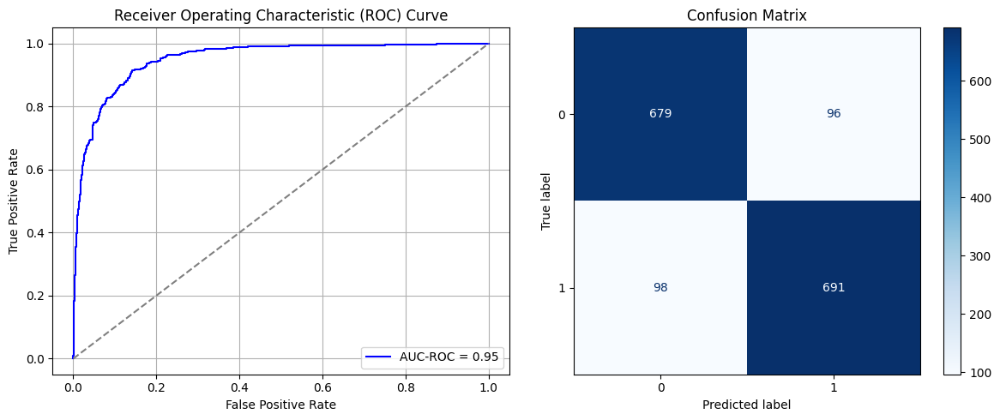

Best threshold based on F1-score: 0.4252379536628723
Time elapsed (performance): 14.523097854999833


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_169"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1183 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1184 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1185 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1186 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1187 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1188 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1189 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - AUC: 0.6323 - loss: 1.2430 - val_AUC: 0.0000e+00 - val_loss: 1.1506
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6712 - loss: 0.7043 - val_AUC: 0.0000e+00 - val_loss: 0.9719
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6658 - loss: 0.6488 - val_AUC: 0.0000e+00 - val_loss: 0.9943
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6803 - loss: 0.6093 - val_AUC: 0.0000e+00 - val_loss: 0.9419
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6799 - loss: 0.6093 - val_AUC: 0.0000e+00 - val_loss: 0.9108
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7161 - loss: 0.5941 - val_AUC: 0.0000e+00 - val_loss: 0.8927
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7109 - loss: 0.5913 - val_AUC: 0.0000e+00 - val_loss: 0.9273
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7061 - loss: 0.5917 - val_AUC: 0.0000e+00 - val_loss: 0.9742
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_170"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1190 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1191 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1192 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1193 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1194 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1195 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1196 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - AUC: 0.6540 - loss: 1.1964 - val_AUC: 0.0000e+00 - val_loss: 1.1962
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6461 - loss: 0.7463 - val_AUC: 0.0000e+00 - val_loss: 1.0358
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6771 - loss: 0.6289 - val_AUC: 0.0000e+00 - val_loss: 0.8887
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6912 - loss: 0.6031 - val_AUC: 0.0000e+00 - val_loss: 0.8461
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6814 - loss: 0.6080 - val_AUC: 0.0000e+00 - val_loss: 0.7852
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6938 - loss: 0.6024 - val_AUC: 0.0000e+00 - val_loss: 0.8895
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6881 - loss: 0.6053 - val_AUC: 0.0000e+00 - val_loss: 0.9739
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7084 - loss: 0.5993 - val_AUC: 0.0000e+00 - val_loss: 0.8858
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_171"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1197 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1198 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1199 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1200 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1201 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1202 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1203 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - AUC: 0.6651 - loss: 1.1941 - val_AUC: 0.0000e+00 - val_loss: 1.2081
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6489 - loss: 0.7138 - val_AUC: 0.0000e+00 - val_loss: 0.9897
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6831 - loss: 0.6178 - val_AUC: 0.0000e+00 - val_loss: 0.9900
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6776 - loss: 0.6077 - val_AUC: 0.0000e+00 - val_loss: 0.8345
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6974 - loss: 0.5955 - val_AUC: 0.0000e+00 - val_loss: 0.8533
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6974 - loss: 0.5956 - val_AUC: 0.0000e+00 - val_loss: 0.8579
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7055 - loss: 0.5968 - val_AUC: 0.0000e+00 - val_loss: 0.9951
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7150 - loss: 0.5909 - val_AUC: 0.0000e+00 - val_loss: 0.7557
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_172"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1204 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1205 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1206 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1207 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1208 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1209 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1210 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - AUC: 0.6575 - loss: 1.2220 - val_AUC: 0.0000e+00 - val_loss: 1.1423
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6481 - loss: 0.7396 - val_AUC: 0.0000e+00 - val_loss: 0.9653
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6800 - loss: 0.6224 - val_AUC: 0.0000e+00 - val_loss: 0.8938
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7105 - loss: 0.5968 - val_AUC: 0.0000e+00 - val_loss: 0.7945
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7029 - loss: 0.6036 - val_AUC: 0.0000e+00 - val_loss: 0.8789
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7035 - loss: 0.5929 - val_AUC: 0.0000e+00 - val_loss: 0.8667
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7146 - loss: 0.5808 - val_AUC: 0.0000e+00 - val_loss: 0.8338
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7103 - loss: 0.5809 - val_AUC: 0.0000e+00 - val_loss: 0.9699
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_173"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1211 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1212 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1213 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1214 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1215 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1216 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1217 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step - AUC: 0.6422 - loss: 1.2510 - val_AUC: 0.0000e+00 - val_loss: 1.2098
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6341 - loss: 0.7419 - val_AUC: 0.0000e+00 - val_loss: 0.8612
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6847 - loss: 0.6099 - val_AUC: 0.0000e+00 - val_loss: 0.9134
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6851 - loss: 0.6028 - val_AUC: 0.0000e+00 - val_loss: 0.8048
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6990 - loss: 0.6008 - val_AUC: 0.0000e+00 - val_loss: 0.7689
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6981 - loss: 0.5974 - val_AUC: 0.0000e+00 - val_loss: 0.9470
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7092 - loss: 0.5923 - val_AUC: 0.0000e+00 - val_loss: 0.8030
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7247 - loss: 0.5765 - val_AUC: 0.0000e+00 - val_loss: 0.8575
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_174"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1218 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1219 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1220 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1221 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1222 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1223 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1224 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - AUC: 0.6605 - loss: 1.1991 - val_AUC: 0.0000e+00 - val_loss: 1.2334
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6543 - loss: 0.7096 - val_AUC: 0.0000e+00 - val_loss: 0.9673
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6616 - loss: 0.6366 - val_AUC: 0.0000e+00 - val_loss: 0.7832
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.6627 - loss: 0.6238 - val_AUC: 0.0000e+00 - val_loss: 0.8873
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.6722 - loss: 0.6034 - val_AUC: 0.0000e+00 - val_loss: 0.7707
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6898 - loss: 0.6055 - val_AUC: 0.0000e+00 - val_loss: 0.9090
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7078 - loss: 0.5940 - val_AUC: 0.0000e+00 - val_loss: 0.8955
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7157 - loss: 0.5856 - val_AUC: 0.0000e+00 - val_loss: 0.8667
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_175"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1225 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1226 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1227 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1228 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1229 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1230 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1231 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - AUC: 0.6251 - loss: 1.3309 - val_AUC: 0.0000e+00 - val_loss: 1.1611
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6742 - loss: 0.6934 - val_AUC: 0.0000e+00 - val_loss: 0.9006
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6448 - loss: 0.6463 - val_AUC: 0.0000e+00 - val_loss: 0.8997
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6782 - loss: 0.6054 - val_AUC: 0.0000e+00 - val_loss: 0.7627
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6872 - loss: 0.6146 - val_AUC: 0.0000e+00 - val_loss: 0.7895
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7092 - loss: 0.5898 - val_AUC: 0.0000e+00 - val_loss: 0.8433
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6886 - loss: 0.5975 - val_AUC: 0.0000e+00 - val_loss: 0.8116
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7156 - loss: 0.5901 - val_AUC: 0.0000e+00 - val_loss: 0.8692
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_176"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1232 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1233 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1234 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1235 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1236 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1237 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1238 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step - AUC: 0.6251 - loss: 1.2778 - val_AUC: 0.0000e+00 - val_loss: 1.1547
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6454 - loss: 0.7309 - val_AUC: 0.0000e+00 - val_loss: 0.8795
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6497 - loss: 0.6397 - val_AUC: 0.0000e+00 - val_loss: 0.8460
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6783 - loss: 0.6109 - val_AUC: 0.0000e+00 - val_loss: 0.7872
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7009 - loss: 0.5990 - val_AUC: 0.0000e+00 - val_loss: 0.9100
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6796 - loss: 0.6115 - val_AUC: 0.0000e+00 - val_loss: 0.8416
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7162 - loss: 0.5901 - val_AUC: 0.0000e+00 - val_loss: 0.9601
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7268 - loss: 0.5844 - val_AUC: 0.0000e+00 - val_loss: 0.7582
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_177"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1239 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1240 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1241 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1242 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1243 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1244 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1245 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 7s 45ms/step - AUC: 0.6582 - loss: 1.2486 - val_AUC: 0.0000e+00 - val_loss: 1.1470
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6514 - loss: 0.7322 - val_AUC: 0.0000e+00 - val_loss: 0.9477
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6701 - loss: 0.6361 - val_AUC: 0.0000e+00 - val_loss: 0.9636
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6688 - loss: 0.6177 - val_AUC: 0.0000e+00 - val_loss: 0.8330
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6960 - loss: 0.6074 - val_AUC: 0.0000e+00 - val_loss: 0.9582
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6941 - loss: 0.5934 - val_AUC: 0.0000e+00 - val_loss: 0.8459
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7239 - loss: 0.5790 - val_AUC: 0.0000e+00 - val_loss: 0.8662
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7138 - loss: 0.5858 - val_AUC: 0.0000e+00 - val_loss: 0.9556
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_178"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1246 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1247 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1248 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1249 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1250 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1251 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1252 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - AUC: 0.6655 - loss: 1.1695 - val_AUC: 0.0000e+00 - val_loss: 1.1633
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6601 - loss: 0.6985 - val_AUC: 0.0000e+00 - val_loss: 1.0130
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6568 - loss: 0.6487 - val_AUC: 0.0000e+00 - val_loss: 0.8787
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6800 - loss: 0.6103 - val_AUC: 0.0000e+00 - val_loss: 0.8009
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6676 - loss: 0.6141 - val_AUC: 0.0000e+00 - val_loss: 0.8798
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6837 - loss: 0.6076 - val_AUC: 0.0000e+00 - val_loss: 0.8460
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6884 - loss: 0.6024 - val_AUC: 0.0000e+00 - val_loss: 1.0056
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7106 - loss: 0.5938 - val_AUC: 0.0000e+00 - val_loss: 0.8753
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_179"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1253 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1254 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1255 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1256 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1257 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1258 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1259 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - AUC: 0.6722 - loss: 1.1368 - val_AUC: 0.0000e+00 - val_loss: 1.2573
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6749 - loss: 0.6967 - val_AUC: 0.0000e+00 - val_loss: 0.9390
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6803 - loss: 0.6219 - val_AUC: 0.0000e+00 - val_loss: 0.9481
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6934 - loss: 0.5978 - val_AUC: 0.0000e+00 - val_loss: 0.8607
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6910 - loss: 0.6012 - val_AUC: 0.0000e+00 - val_loss: 0.8751
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7280 - loss: 0.5842 - val_AUC: 0.0000e+00 - val_loss: 0.8473
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7157 - loss: 0.5906 - val_AUC: 0.0000e+00 - val_loss: 0.8777
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7172 - loss: 0.5916 - val_AUC: 0.0000e+00 - val_loss: 0.7418
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_180"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1260 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1261 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1262 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1263 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1264 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1265 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1266 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - AUC: 0.6355 - loss: 1.2830 - val_AUC: 0.0000e+00 - val_loss: 1.1825
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6634 - loss: 0.7048 - val_AUC: 0.0000e+00 - val_loss: 0.8761
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6769 - loss: 0.6267 - val_AUC: 0.0000e+00 - val_loss: 0.8675
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6889 - loss: 0.6032 - val_AUC: 0.0000e+00 - val_loss: 0.8104
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6678 - loss: 0.6175 - val_AUC: 0.0000e+00 - val_loss: 0.8090
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7042 - loss: 0.5965 - val_AUC: 0.0000e+00 - val_loss: 0.9841
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7229 - loss: 0.5784 - val_AUC: 0.0000e+00 - val_loss: 0.8530
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7102 - loss: 0.5841 - val_AUC: 0.0000e+00 - val_loss: 0.8286
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_181"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1267 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1268 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1269 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1270 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1271 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1272 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1273 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - AUC: 0.6415 - loss: 1.3312 - val_AUC: 0.0000e+00 - val_loss: 1.2149
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6712 - loss: 0.6957 - val_AUC: 0.0000e+00 - val_loss: 0.9651
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6491 - loss: 0.6542 - val_AUC: 0.0000e+00 - val_loss: 0.9631
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6941 - loss: 0.6035 - val_AUC: 0.0000e+00 - val_loss: 0.8983
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6873 - loss: 0.5989 - val_AUC: 0.0000e+00 - val_loss: 0.7891
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6980 - loss: 0.5863 - val_AUC: 0.0000e+00 - val_loss: 0.7767
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7068 - loss: 0.6027 - val_AUC: 0.0000e+00 - val_loss: 0.9814
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6998 - loss: 0.6090 - val_AUC: 0.0000e+00 - val_loss: 0.9537
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_182"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1274 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1275 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1276 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1277 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1278 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1279 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1280 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - AUC: 0.6438 - loss: 1.2163 - val_AUC: 0.0000e+00 - val_loss: 1.3034
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6825 - loss: 0.6806 - val_AUC: 0.0000e+00 - val_loss: 0.8733
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6634 - loss: 0.6287 - val_AUC: 0.0000e+00 - val_loss: 0.9035
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6935 - loss: 0.6051 - val_AUC: 0.0000e+00 - val_loss: 0.7425
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6909 - loss: 0.5991 - val_AUC: 0.0000e+00 - val_loss: 0.7792
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7005 - loss: 0.6010 - val_AUC: 0.0000e+00 - val_loss: 0.8638
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7098 - loss: 0.5985 - val_AUC: 0.0000e+00 - val_loss: 0.7555
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7180 - loss: 0.5910 - val_AUC: 0.0000e+00 - val_loss: 0.9112
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_183"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1281 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1282 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1283 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1284 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1285 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1286 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1287 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - AUC: 0.6497 - loss: 1.2420 - val_AUC: 0.0000e+00 - val_loss: 1.2236
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6927 - loss: 0.6558 - val_AUC: 0.0000e+00 - val_loss: 0.9074
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6674 - loss: 0.6195 - val_AUC: 0.0000e+00 - val_loss: 0.8815
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6935 - loss: 0.6006 - val_AUC: 0.0000e+00 - val_loss: 0.8277
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6862 - loss: 0.6121 - val_AUC: 0.0000e+00 - val_loss: 0.8847
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6920 - loss: 0.5970 - val_AUC: 0.0000e+00 - val_loss: 0.8870
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7104 - loss: 0.5825 - val_AUC: 0.0000e+00 - val_loss: 0.7818
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7153 - loss: 0.5832 - val_AUC: 0.0000e+00 - val_loss: 0.8347
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_184"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1288 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1289 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1290 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1291 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1292 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1293 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1294 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - AUC: 0.6683 - loss: 1.1687 - val_AUC: 0.0000e+00 - val_loss: 1.2281
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6607 - loss: 0.7029 - val_AUC: 0.0000e+00 - val_loss: 1.0093
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6624 - loss: 0.6391 - val_AUC: 0.0000e+00 - val_loss: 0.9460
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6924 - loss: 0.6056 - val_AUC: 0.0000e+00 - val_loss: 0.8187
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7012 - loss: 0.6032 - val_AUC: 0.0000e+00 - val_loss: 0.8314
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7018 - loss: 0.5932 - val_AUC: 0.0000e+00 - val_loss: 0.9196
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7263 - loss: 0.5811 - val_AUC: 0.0000e+00 - val_loss: 0.8134
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7195 - loss: 0.5886 - val_AUC: 0.0000e+00 - val_loss: 0.9469
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_185"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1295 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1296 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1297 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1298 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1299 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1300 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1301 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - AUC: 0.6366 - loss: 1.2270 - val_AUC: 0.0000e+00 - val_loss: 1.2268
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6601 - loss: 0.7086 - val_AUC: 0.0000e+00 - val_loss: 0.9045
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6783 - loss: 0.6192 - val_AUC: 0.0000e+00 - val_loss: 0.9653
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6950 - loss: 0.5946 - val_AUC: 0.0000e+00 - val_loss: 0.8089
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6902 - loss: 0.5960 - val_AUC: 0.0000e+00 - val_loss: 0.8540
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7053 - loss: 0.5963 - val_AUC: 0.0000e+00 - val_loss: 0.9004
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6933 - loss: 0.5954 - val_AUC: 0.0000e+00 - val_loss: 0.7923
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7062 - loss: 0.5867 - val_AUC: 0.0000e+00 - val_loss: 0.9197
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_186"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1302 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1303 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1304 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1305 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1306 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1307 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1308 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - AUC: 0.6445 - loss: 1.2349 - val_AUC: 0.0000e+00 - val_loss: 1.2902
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6632 - loss: 0.7036 - val_AUC: 0.0000e+00 - val_loss: 0.9630
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6692 - loss: 0.6341 - val_AUC: 0.0000e+00 - val_loss: 0.9044
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6895 - loss: 0.6008 - val_AUC: 0.0000e+00 - val_loss: 0.7983
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6941 - loss: 0.6075 - val_AUC: 0.0000e+00 - val_loss: 0.8413
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6783 - loss: 0.6130 - val_AUC: 0.0000e+00 - val_loss: 0.8835
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7018 - loss: 0.5939 - val_AUC: 0.0000e+00 - val_loss: 0.9277
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6944 - loss: 0.6039 - val_AUC: 0.0000e+00 - val_loss: 0.8551
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_187"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1309 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1310 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1311 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1312 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1313 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1314 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1315 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - AUC: 0.6286 - loss: 1.2681 - val_AUC: 0.0000e+00 - val_loss: 1.2220
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6639 - loss: 0.7154 - val_AUC: 0.0000e+00 - val_loss: 0.8823
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6704 - loss: 0.6259 - val_AUC: 0.0000e+00 - val_loss: 0.8676
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6933 - loss: 0.6025 - val_AUC: 0.0000e+00 - val_loss: 0.8258
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7147 - loss: 0.5901 - val_AUC: 0.0000e+00 - val_loss: 0.8512
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6860 - loss: 0.6088 - val_AUC: 0.0000e+00 - val_loss: 0.8626
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6741 - loss: 0.6107 - val_AUC: 0.0000e+00 - val_loss: 0.8928
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7012 - loss: 0.5960 - val_AUC: 0.0000e+00 - val_loss: 0.9642
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_188"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1316 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1317 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1318 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1319 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1320 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1321 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1322 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - AUC: 0.6457 - loss: 1.2294 - val_AUC: 0.0000e+00 - val_loss: 1.3126
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.6599 - loss: 0.7018 - val_AUC: 0.0000e+00 - val_loss: 0.9224
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6712 - loss: 0.6297 - val_AUC: 0.0000e+00 - val_loss: 0.8872
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6838 - loss: 0.6122 - val_AUC: 0.0000e+00 - val_loss: 0.9429
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6851 - loss: 0.6214 - val_AUC: 0.0000e+00 - val_loss: 0.8593
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7016 - loss: 0.5954 - val_AUC: 0.0000e+00 - val_loss: 0.8755
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7323 - loss: 0.5810 - val_AUC: 0.0000e+00 - val_loss: 0.8363
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7223 - loss: 0.5782 - val_AUC: 0.0000e+00 - val_loss: 0.7312
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_189"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1323 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1324 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1325 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1326 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1327 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1328 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1329 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 6s 18ms/step - AUC: 0.5978 - loss: 0.6783 - val_AUC: 0.7924 - val_loss: 0.5527
Epoch 2/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7910 - loss: 0.5544 - val_AUC: 0.8581 - val_loss: 0.4756
Epoch 3/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.8533 - loss: 0.4763 - val_AUC: 0.8776 - val_loss: 0.4486
Epoch 4/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.8789 - loss: 0.4377 - val_AUC: 0.8998 - val_loss: 0.4582
Epoch 5/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8840 - loss: 0.4307 - val_AUC: 0.9089 - val_loss: 0.3851
Epoch 6/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9129 - loss: 0.3743 - val_AUC: 0.9225 - val_loss: 0.3760
Epoch 7/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9335 - loss: 0.3275 - val_AUC: 0.9337 - val_loss: 0.3393
Epoch 8/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9437 - loss: 0.3043 - val_AUC: 0.9447 - val_loss: 0.3019
Epoch 9/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

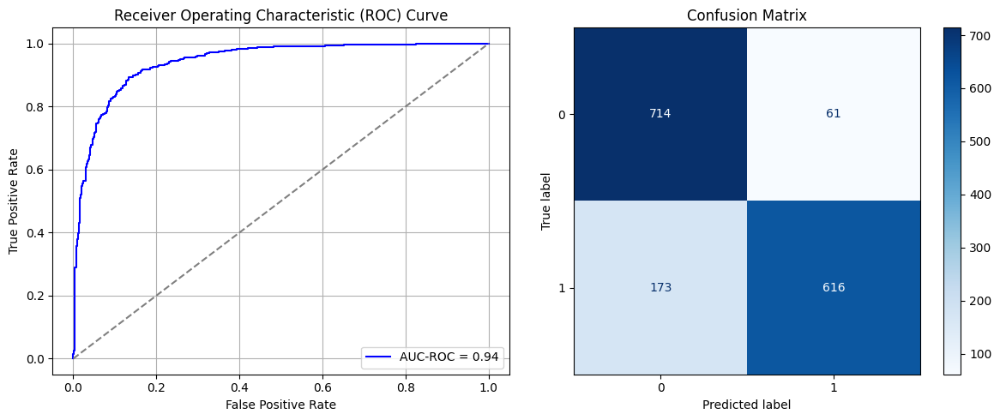

Best threshold based on F1-score: 0.28903380036354065
Time elapsed (performance): 16.65875583900015


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_190"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1330 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1331 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1332 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1333 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1334 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1335 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1336 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - AUC: 0.6679 - loss: 0.9592 - val_AUC: 0.0000e+00 - val_loss: 1.0511
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6828 - loss: 0.6448 - val_AUC: 0.0000e+00 - val_loss: 0.9010
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6756 - loss: 0.6325 - val_AUC: 0.0000e+00 - val_loss: 0.9047
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6769 - loss: 0.6197 - val_AUC: 0.0000e+00 - val_loss: 0.8888
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6841 - loss: 0.6124 - val_AUC: 0.0000e+00 - val_loss: 0.8830
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6879 - loss: 0.6153 - val_AUC: 0.0000e+00 - val_loss: 0.9259
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6950 - loss: 0.6139 - val_AUC: 0.0000e+00 - val_loss: 0.9545
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6891 - loss: 0.6051 - val_AUC: 0.0000e+00 - val_loss: 0.8528
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_191"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1337 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1338 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1339 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1340 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1341 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1342 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1343 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - AUC: 0.6792 - loss: 0.9275 - val_AUC: 0.0000e+00 - val_loss: 1.0841
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6551 - loss: 0.6860 - val_AUC: 0.0000e+00 - val_loss: 0.9815
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6836 - loss: 0.6094 - val_AUC: 0.0000e+00 - val_loss: 0.8469
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6769 - loss: 0.6230 - val_AUC: 0.0000e+00 - val_loss: 0.8893
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6895 - loss: 0.5994 - val_AUC: 0.0000e+00 - val_loss: 0.7825
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7089 - loss: 0.5914 - val_AUC: 0.0000e+00 - val_loss: 0.7720
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6919 - loss: 0.6061 - val_AUC: 0.0000e+00 - val_loss: 0.8470
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7211 - loss: 0.5817 - val_AUC: 0.0000e+00 - val_loss: 0.7605
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_192"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1344 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1345 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1346 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1347 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1348 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1349 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1350 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - AUC: 0.6583 - loss: 0.9925 - val_AUC: 0.0000e+00 - val_loss: 1.0497
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6642 - loss: 0.6639 - val_AUC: 0.0000e+00 - val_loss: 0.8977
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7050 - loss: 0.6047 - val_AUC: 0.0000e+00 - val_loss: 0.9439
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6735 - loss: 0.6159 - val_AUC: 0.0000e+00 - val_loss: 0.8548
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6885 - loss: 0.6086 - val_AUC: 0.0000e+00 - val_loss: 0.9350
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7064 - loss: 0.6000 - val_AUC: 0.0000e+00 - val_loss: 0.8289
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6984 - loss: 0.6020 - val_AUC: 0.0000e+00 - val_loss: 0.8116
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7041 - loss: 0.6003 - val_AUC: 0.0000e+00 - val_loss: 0.8738
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_193"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1351 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1352 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1353 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1354 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1355 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1356 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1357 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 5s 43ms/step - AUC: 0.6674 - loss: 0.9914 - val_AUC: 0.0000e+00 - val_loss: 1.1033
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6875 - loss: 0.6374 - val_AUC: 0.0000e+00 - val_loss: 0.8870
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6644 - loss: 0.6291 - val_AUC: 0.0000e+00 - val_loss: 0.8666
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6650 - loss: 0.6282 - val_AUC: 0.0000e+00 - val_loss: 0.9054
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7088 - loss: 0.5986 - val_AUC: 0.0000e+00 - val_loss: 0.8641
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6679 - loss: 0.6265 - val_AUC: 0.0000e+00 - val_loss: 0.8609
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7026 - loss: 0.6035 - val_AUC: 0.0000e+00 - val_loss: 0.8983
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6808 - loss: 0.6099 - val_AUC: 0.0000e+00 - val_loss: 0.8600
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_194"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1358 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1359 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1360 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1361 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1362 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1363 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1364 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step - AUC: 0.6517 - loss: 0.9693 - val_AUC: 0.0000e+00 - val_loss: 0.9881
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6812 - loss: 0.6493 - val_AUC: 0.0000e+00 - val_loss: 0.9371
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6996 - loss: 0.6060 - val_AUC: 0.0000e+00 - val_loss: 0.8928
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6752 - loss: 0.6258 - val_AUC: 0.0000e+00 - val_loss: 0.9538
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6831 - loss: 0.6215 - val_AUC: 0.0000e+00 - val_loss: 0.8989
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6980 - loss: 0.6083 - val_AUC: 0.0000e+00 - val_loss: 0.8030
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7137 - loss: 0.5981 - val_AUC: 0.0000e+00 - val_loss: 0.8841
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7019 - loss: 0.6133 - val_AUC: 0.0000e+00 - val_loss: 0.8508
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_195"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1365 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1366 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1367 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1368 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1369 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1370 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1371 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - AUC: 0.6672 - loss: 0.9478 - val_AUC: 0.0000e+00 - val_loss: 1.0710
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6994 - loss: 0.6374 - val_AUC: 0.0000e+00 - val_loss: 0.9483
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6862 - loss: 0.6193 - val_AUC: 0.0000e+00 - val_loss: 0.8702
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6841 - loss: 0.6038 - val_AUC: 0.0000e+00 - val_loss: 0.7579
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.6915 - loss: 0.6126 - val_AUC: 0.0000e+00 - val_loss: 0.8654
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6901 - loss: 0.6057 - val_AUC: 0.0000e+00 - val_loss: 0.9210
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6961 - loss: 0.6181 - val_AUC: 0.0000e+00 - val_loss: 0.9171
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6975 - loss: 0.6045 - val_AUC: 0.0000e+00 - val_loss: 0.7376
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_196"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1372 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1373 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1374 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1375 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1376 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1377 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1378 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - AUC: 0.6693 - loss: 0.9496 - val_AUC: 0.0000e+00 - val_loss: 1.0858
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6642 - loss: 0.6710 - val_AUC: 0.0000e+00 - val_loss: 0.9198
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6545 - loss: 0.6318 - val_AUC: 0.0000e+00 - val_loss: 0.8215
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6860 - loss: 0.6135 - val_AUC: 0.0000e+00 - val_loss: 0.8104
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6865 - loss: 0.6088 - val_AUC: 0.0000e+00 - val_loss: 0.8374
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7026 - loss: 0.6037 - val_AUC: 0.0000e+00 - val_loss: 0.8727
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6941 - loss: 0.6070 - val_AUC: 0.0000e+00 - val_loss: 0.9195
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7007 - loss: 0.6063 - val_AUC: 0.0000e+00 - val_loss: 0.8948
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_197"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1379 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1380 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1381 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1382 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1383 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1384 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1385 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - AUC: 0.6867 - loss: 0.9006 - val_AUC: 0.0000e+00 - val_loss: 1.0970
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6487 - loss: 0.6767 - val_AUC: 0.0000e+00 - val_loss: 0.9130
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6774 - loss: 0.6290 - val_AUC: 0.0000e+00 - val_loss: 0.8981
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6790 - loss: 0.6129 - val_AUC: 0.0000e+00 - val_loss: 0.8472
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6909 - loss: 0.6063 - val_AUC: 0.0000e+00 - val_loss: 0.8261
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6805 - loss: 0.6181 - val_AUC: 0.0000e+00 - val_loss: 0.8401
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7107 - loss: 0.6031 - val_AUC: 0.0000e+00 - val_loss: 1.0270
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6825 - loss: 0.6147 - val_AUC: 0.0000e+00 - val_loss: 0.8517
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_198"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1386 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1387 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1388 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1389 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1390 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1391 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1392 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - AUC: 0.6787 - loss: 0.9523 - val_AUC: 0.0000e+00 - val_loss: 1.0415
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6795 - loss: 0.6428 - val_AUC: 0.0000e+00 - val_loss: 0.8862
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6634 - loss: 0.6295 - val_AUC: 0.0000e+00 - val_loss: 0.8532
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6626 - loss: 0.6263 - val_AUC: 0.0000e+00 - val_loss: 0.8419
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6876 - loss: 0.6191 - val_AUC: 0.0000e+00 - val_loss: 0.8979
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6935 - loss: 0.6057 - val_AUC: 0.0000e+00 - val_loss: 0.8478
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7055 - loss: 0.6049 - val_AUC: 0.0000e+00 - val_loss: 0.8673
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7099 - loss: 0.6006 - val_AUC: 0.0000e+00 - val_loss: 0.9302
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_199"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1393 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1394 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1395 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1396 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1397 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1398 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1399 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - AUC: 0.6762 - loss: 0.9463 - val_AUC: 0.0000e+00 - val_loss: 1.0896
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6811 - loss: 0.6402 - val_AUC: 0.0000e+00 - val_loss: 0.8822
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6778 - loss: 0.6171 - val_AUC: 0.0000e+00 - val_loss: 0.8595
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6730 - loss: 0.6198 - val_AUC: 0.0000e+00 - val_loss: 0.9001
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6860 - loss: 0.6143 - val_AUC: 0.0000e+00 - val_loss: 0.8580
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7015 - loss: 0.5968 - val_AUC: 0.0000e+00 - val_loss: 0.7972
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7047 - loss: 0.6017 - val_AUC: 0.0000e+00 - val_loss: 0.7958
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7073 - loss: 0.5996 - val_AUC: 0.0000e+00 - val_loss: 0.8009
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_200"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1400 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1401 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1402 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1403 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1404 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1405 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1406 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - AUC: 0.6584 - loss: 0.9855 - val_AUC: 0.0000e+00 - val_loss: 1.0332
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6652 - loss: 0.6494 - val_AUC: 0.0000e+00 - val_loss: 0.8666
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6678 - loss: 0.6186 - val_AUC: 0.0000e+00 - val_loss: 0.8583
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6906 - loss: 0.6028 - val_AUC: 0.0000e+00 - val_loss: 0.8893
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6976 - loss: 0.6099 - val_AUC: 0.0000e+00 - val_loss: 0.9775
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6836 - loss: 0.6107 - val_AUC: 0.0000e+00 - val_loss: 0.8003
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7154 - loss: 0.5983 - val_AUC: 0.0000e+00 - val_loss: 0.8076
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7064 - loss: 0.6036 - val_AUC: 0.0000e+00 - val_loss: 0.9200
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_201"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1407 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1408 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1409 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1410 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1411 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1412 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1413 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - AUC: 0.6673 - loss: 0.9779 - val_AUC: 0.0000e+00 - val_loss: 1.0530
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6587 - loss: 0.6721 - val_AUC: 0.0000e+00 - val_loss: 0.9343
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6871 - loss: 0.6178 - val_AUC: 0.0000e+00 - val_loss: 0.9398
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6836 - loss: 0.6150 - val_AUC: 0.0000e+00 - val_loss: 0.8737
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6915 - loss: 0.6048 - val_AUC: 0.0000e+00 - val_loss: 0.8492
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6932 - loss: 0.6103 - val_AUC: 0.0000e+00 - val_loss: 0.8545
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6986 - loss: 0.6075 - val_AUC: 0.0000e+00 - val_loss: 0.8641
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7225 - loss: 0.5870 - val_AUC: 0.0000e+00 - val_loss: 0.8644
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_202"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1414 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1415 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1416 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1417 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1418 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1419 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1420 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - AUC: 0.6800 - loss: 0.9283 - val_AUC: 0.0000e+00 - val_loss: 1.0589
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6768 - loss: 0.6592 - val_AUC: 0.0000e+00 - val_loss: 0.9589
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6867 - loss: 0.6138 - val_AUC: 0.0000e+00 - val_loss: 0.8855
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6739 - loss: 0.6183 - val_AUC: 0.0000e+00 - val_loss: 0.8759
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6936 - loss: 0.5987 - val_AUC: 0.0000e+00 - val_loss: 0.8424
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7003 - loss: 0.6007 - val_AUC: 0.0000e+00 - val_loss: 0.8576
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7062 - loss: 0.6012 - val_AUC: 0.0000e+00 - val_loss: 0.9317
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7025 - loss: 0.5906 - val_AUC: 0.0000e+00 - val_loss: 0.8315
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_203"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1421 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1422 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1423 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1424 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1425 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1426 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1427 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 5s 41ms/step - AUC: 0.6735 - loss: 0.9536 - val_AUC: 0.0000e+00 - val_loss: 1.0845
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6884 - loss: 0.6238 - val_AUC: 0.0000e+00 - val_loss: 0.8096
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6745 - loss: 0.6263 - val_AUC: 0.0000e+00 - val_loss: 0.8810
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6793 - loss: 0.6212 - val_AUC: 0.0000e+00 - val_loss: 0.9439
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6706 - loss: 0.6197 - val_AUC: 0.0000e+00 - val_loss: 0.9032
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7026 - loss: 0.5957 - val_AUC: 0.0000e+00 - val_loss: 0.8041
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7156 - loss: 0.5978 - val_AUC: 0.0000e+00 - val_loss: 0.9099
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7007 - loss: 0.6124 - val_AUC: 0.0000e+00 - val_loss: 0.9697
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_204"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1428 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1429 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1430 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1431 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1432 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1433 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1434 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - AUC: 0.6714 - loss: 0.9705 - val_AUC: 0.0000e+00 - val_loss: 1.0689
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6668 - loss: 0.6591 - val_AUC: 0.0000e+00 - val_loss: 0.9009
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6877 - loss: 0.6173 - val_AUC: 0.0000e+00 - val_loss: 0.8793
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6837 - loss: 0.6175 - val_AUC: 0.0000e+00 - val_loss: 0.9020
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6915 - loss: 0.6116 - val_AUC: 0.0000e+00 - val_loss: 0.9266
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7023 - loss: 0.6006 - val_AUC: 0.0000e+00 - val_loss: 0.8407
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7055 - loss: 0.5991 - val_AUC: 0.0000e+00 - val_loss: 0.8640
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7129 - loss: 0.5989 - val_AUC: 0.0000e+00 - val_loss: 0.9486
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_205"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1435 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1436 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1437 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1438 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1439 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1440 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1441 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - AUC: 0.6722 - loss: 0.9559 - val_AUC: 0.0000e+00 - val_loss: 1.1012
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6808 - loss: 0.6505 - val_AUC: 0.0000e+00 - val_loss: 0.9613
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6622 - loss: 0.6352 - val_AUC: 0.0000e+00 - val_loss: 0.8662
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6903 - loss: 0.6104 - val_AUC: 0.0000e+00 - val_loss: 0.8601
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6800 - loss: 0.6102 - val_AUC: 0.0000e+00 - val_loss: 0.8551
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6915 - loss: 0.6120 - val_AUC: 0.0000e+00 - val_loss: 0.9277
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7105 - loss: 0.5958 - val_AUC: 0.0000e+00 - val_loss: 0.8437
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6993 - loss: 0.6038 - val_AUC: 0.0000e+00 - val_loss: 0.8584
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_206"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1442 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1443 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1444 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1445 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1446 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1447 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1448 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - AUC: 0.6749 - loss: 0.9938 - val_AUC: 0.0000e+00 - val_loss: 1.0404
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6898 - loss: 0.6546 - val_AUC: 0.0000e+00 - val_loss: 0.9911
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6827 - loss: 0.6317 - val_AUC: 0.0000e+00 - val_loss: 0.8807
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6936 - loss: 0.6134 - val_AUC: 0.0000e+00 - val_loss: 0.8697
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6781 - loss: 0.6192 - val_AUC: 0.0000e+00 - val_loss: 0.8320
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6950 - loss: 0.6147 - val_AUC: 0.0000e+00 - val_loss: 0.8602
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7184 - loss: 0.5894 - val_AUC: 0.0000e+00 - val_loss: 0.7754
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6822 - loss: 0.6137 - val_AUC: 0.0000e+00 - val_loss: 0.8221
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_207"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1449 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1450 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1451 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1452 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1453 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1454 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1455 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - AUC: 0.6678 - loss: 0.9568 - val_AUC: 0.0000e+00 - val_loss: 1.0521
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6697 - loss: 0.6660 - val_AUC: 0.0000e+00 - val_loss: 0.9290
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6864 - loss: 0.6108 - val_AUC: 0.0000e+00 - val_loss: 0.8592
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - AUC: 0.6837 - loss: 0.6208 - val_AUC: 0.0000e+00 - val_loss: 0.9253
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - AUC: 0.6860 - loss: 0.6122 - val_AUC: 0.0000e+00 - val_loss: 0.9046
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - AUC: 0.7018 - loss: 0.6015 - val_AUC: 0.0000e+00 - val_loss: 0.8174
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7266 - loss: 0.5868 - val_AUC: 0.0000e+00 - val_loss: 0.7813
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - AUC: 0.7018 - loss: 0.6042 - val_AUC: 0.0000e+00 - val_loss: 0.8310
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_208"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1456 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1457 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1458 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1459 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1460 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1461 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1462 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - AUC: 0.6663 - loss: 0.9589 - val_AUC: 0.0000e+00 - val_loss: 1.0696
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6696 - loss: 0.6595 - val_AUC: 0.0000e+00 - val_loss: 0.9433
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6598 - loss: 0.6380 - val_AUC: 0.0000e+00 - val_loss: 0.9340
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6972 - loss: 0.6085 - val_AUC: 0.0000e+00 - val_loss: 0.8794
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6870 - loss: 0.6072 - val_AUC: 0.0000e+00 - val_loss: 0.8668
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7006 - loss: 0.6014 - val_AUC: 0.0000e+00 - val_loss: 0.7709
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6912 - loss: 0.6091 - val_AUC: 0.0000e+00 - val_loss: 0.8837
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7055 - loss: 0.6036 - val_AUC: 0.0000e+00 - val_loss: 0.8283
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_209"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1463 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1464 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1465 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1466 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1467 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1468 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1469 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - AUC: 0.6610 - loss: 0.9663 - val_AUC: 0.0000e+00 - val_loss: 1.0902
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6580 - loss: 0.6755 - val_AUC: 0.0000e+00 - val_loss: 0.9001
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6868 - loss: 0.6139 - val_AUC: 0.0000e+00 - val_loss: 0.9150
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6883 - loss: 0.6108 - val_AUC: 0.0000e+00 - val_loss: 0.8458
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7016 - loss: 0.6118 - val_AUC: 0.0000e+00 - val_loss: 0.9884
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6881 - loss: 0.6058 - val_AUC: 0.0000e+00 - val_loss: 0.8585
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7070 - loss: 0.6004 - val_AUC: 0.0000e+00 - val_loss: 0.9092
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7140 - loss: 0.5930 - val_AUC: 0.0000e+00 - val_loss: 0.8003
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

In [41]:
times_train = 5
times_fine_tune = 20

FPR = []
FNR = []

for i in range(times_train):
  model_source_Sy = create_dnn_model(X_S_train.shape[1])
  train_and_evaluate(model_source_Sy, X_S_train, X_S_test, y_S_train, y_S_test, "Source")
  for j in range(times_fine_tune):
    fpr, fnr = fine_tuning(X_T_train_Sy, X_T_test, y_T_train_Sy, y_T_test, 0, 4)
    # print(output)
    FPR.append(fpr)
    FNR.append(fnr)

ParamFit = pd.DataFrame([FPR, FNR]).T
ParamFit.columns=['FPR', 'FNR']

# fine_tuning(X_T_train_Sy, X_T_test, y_T_train_Sy, y_T_test, 0, 4)

In [42]:
print('Mean:', ParamFit['FNR'].mean())
print('Var:', ParamFit['FNR'].var())

Mean: 0.5981314878892734
Var: 0.005414236230917064


In [43]:
print(ParamFit)
ParamFit.to_csv('Sy_multi_Fine_Tuning.csv')

         FPR       FNR
0   0.107722  0.508651
1   0.122021  0.494810
2   0.102955  0.529412
3   0.087703  0.546713
4   0.091516  0.543253
..       ...       ...
95  0.099142  0.560554
96  0.091516  0.564014
97  0.050524  0.643599
98  0.043851  0.667820
99  0.126787  0.529412

[100 rows x 2 columns]


# Random Oversampling (ROS):

## Simple Random Sampling with Replacement:

In this case, we investigate the effectiveness of Random Oversampling methods, beginning with Simple Random Sampling (SRS) with replacement. For this, we perform random resampling from the minority class of size $N_1$ to generate an additional sample of size $N_0-N_1$, such that the oversampled minority class will have the same size as the majority class.

In [32]:
X_S_SRS, y_S_SRS = SRSwR_oversampler(data_S_full, data_S_full.iloc[:, -1])
print(y_S_SRS)

X_S_train, X_S_test, y_S_train, y_S_test = train_test_split(X_S_SRS, y_S_SRS, test_size=0.20, random_state=0)
X_T_train, X_T_test, y_T_train, y_T_test = train_test_split(data_T_X, data_T_y, test_size=0.20, random_state=0)
T_train = pd.concat([X_T_train, y_T_train], axis=1)

X_T_train_SRS, y_T_train_SRS = SRSwR_oversampler(T_train, T_train.iloc[:, -1])
print(y_T_train_SRS)

3910
19400
0        0
1        0
2        0
3        0
4        0
        ..
20394    1
22775    1
19479    1
21130    1
21102    1
Name: Y2, Length: 38800, dtype: int64
1262
4090
601     0
172     0
5113    0
3875    0
3981    0
       ..
5653    1
6346    1
6382    1
5365    1
5686    1
Name: Y, Length: 8180, dtype: int64


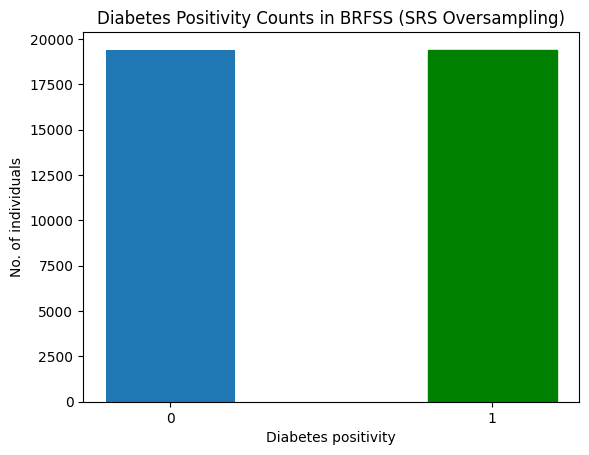

In [33]:
barlist = plt.bar([str(0),str(1)], y_S_SRS.value_counts(), width = 0.4)
barlist[1].set_color('g')

plt.xlabel("Diabetes positivity")
plt.ylabel("No. of individuals")
plt.title("Diabetes Positivity Counts in BRFSS (SRS Oversampling)")
plt.show()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 9s 6ms/step - AUC: 0.7774 - loss: 0.5505 - val_AUC: 0.9366 - val_loss: 0.3422
Epoch 2/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.9325 - loss: 0.3316 - val_AUC: 0.9544 - val_loss: 0.3116
Epoch 3/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.9563 - loss: 0.2681 - val_AUC: 0.9694 - val_loss: 0.2312
Epoch 4/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.9657 - loss: 0.2365 - val_AUC: 0.9733 - val_loss: 0.2423
Epoch 5/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.9691 - loss: 0.2244 - val_AUC: 0.9754 - val_loss: 0.2121
Epoch 6/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - AUC: 0.9751 - loss: 0.1998 - val_AUC: 0.9700 - val_loss: 0.2268
Epoch 7/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step - AUC: 0.9755 - loss: 0.2007 - val_AUC: 0.9798 - val_loss: 0.1964
Epoch 8/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.9764 - loss: 0.1958 - val_AUC: 0.9776 - val_loss: 0.1962
Epoch 9/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 7s 6ms/step - 

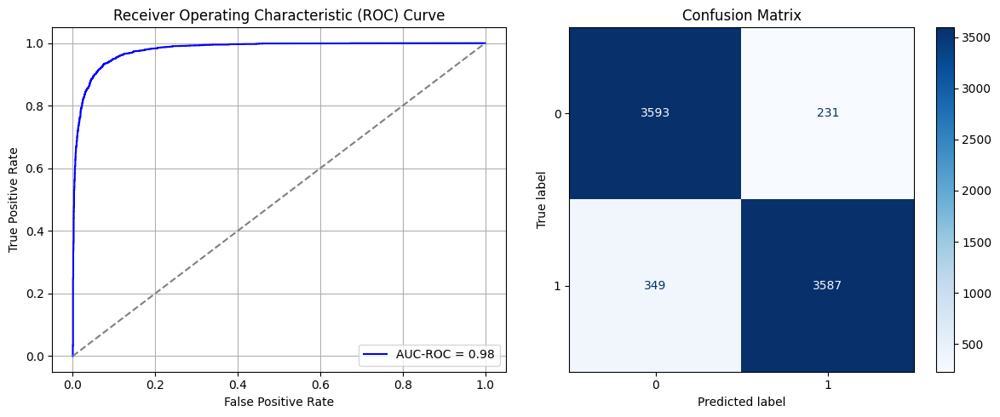

Best threshold based on F1-score: 0.36874881386756897
Time elapsed (performance): 51.104671996000434


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_7 (Dense)                 │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.7062 - loss: 0.7287 - val_AUC: 0.0000e+00 - val_loss: 0.9026
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7271 - loss: 0.5776 - val_AUC: 0.0000e+00 - val_loss: 0.7056
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7453 - loss: 0.5567 - val_AUC: 0.0000e+00 - val_loss: 0.8082
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7484 - loss: 0.5538 - val_AUC: 0.0000e+00 - val_loss: 0.8081
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7624 - loss: 0.5398 - val_AUC: 0.0000e+00 - val_loss: 0.7359
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7623 - loss: 0.5364 - val_AUC: 0.0000e+00 - val_loss: 0.8330
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7644 - loss: 0.5341 - val_AUC: 0.0000e+00 - val_loss: 0.9445
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_14 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_15 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_16 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_17 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_18 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_19 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_20 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7016 - loss: 0.7574 - val_AUC: 0.0000e+00 - val_loss: 0.9457
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7463 - loss: 0.5626 - val_AUC: 0.0000e+00 - val_loss: 0.8341
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7654 - loss: 0.5448 - val_AUC: 0.0000e+00 - val_loss: 0.7662
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7669 - loss: 0.5384 - val_AUC: 0.0000e+00 - val_loss: 0.8438
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7722 - loss: 0.5313 - val_AUC: 0.0000e+00 - val_loss: 0.7145
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7719 - loss: 0.5365 - val_AUC: 0.0000e+00 - val_loss: 0.9011
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7564 - loss: 0.5368 - val_AUC: 0.0000e+00 - val_loss: 0.7980
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7701 - loss: 0.5364 - val_AUC: 0.0000e+00 - val_loss: 0.8338
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_21 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_22 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_23 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_24 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_25 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_26 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_27 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7107 - loss: 0.7201 - val_AUC: 0.0000e+00 - val_loss: 0.8335
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7302 - loss: 0.5789 - val_AUC: 0.0000e+00 - val_loss: 0.8173
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7361 - loss: 0.5688 - val_AUC: 0.0000e+00 - val_loss: 0.8489
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7631 - loss: 0.5462 - val_AUC: 0.0000e+00 - val_loss: 0.8148
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7478 - loss: 0.5590 - val_AUC: 0.0000e+00 - val_loss: 0.7204
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7662 - loss: 0.5384 - val_AUC: 0.0000e+00 - val_loss: 0.7760
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7538 - loss: 0.5472 - val_AUC: 0.0000e+00 - val_loss: 0.8987
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7714 - loss: 0.5337 - val_AUC: 0.0000e+00 - val_loss: 0.7235
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_28 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_29 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_30 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_31 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_32 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_33 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_34 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7084 - loss: 0.7455 - val_AUC: 0.0000e+00 - val_loss: 0.7992
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7303 - loss: 0.5799 - val_AUC: 0.0000e+00 - val_loss: 0.7473
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7457 - loss: 0.5638 - val_AUC: 0.0000e+00 - val_loss: 0.7010
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7551 - loss: 0.5486 - val_AUC: 0.0000e+00 - val_loss: 0.7720
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 15ms/step - AUC: 0.7562 - loss: 0.5515 - val_AUC: 0.0000e+00 - val_loss: 0.9268
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - AUC: 0.7580 - loss: 0.5414 - val_AUC: 0.0000e+00 - val_loss: 0.8094
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7588 - loss: 0.5458 - val_AUC: 0.0000e+00 - val_loss: 0.8163
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7614 - loss: 0.5499 - val_AUC: 0.0000e+00 - val_loss: 0.8321
Epoch 9/10
205/205 ━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_35 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_36 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_37 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_38 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_39 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_40 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_41 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - AUC: 0.7120 - loss: 0.7373 - val_AUC: 0.0000e+00 - val_loss: 0.8157
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7299 - loss: 0.5764 - val_AUC: 0.0000e+00 - val_loss: 0.7689
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7580 - loss: 0.5499 - val_AUC: 0.0000e+00 - val_loss: 0.8034
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7469 - loss: 0.5581 - val_AUC: 0.0000e+00 - val_loss: 0.7891
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7659 - loss: 0.5371 - val_AUC: 0.0000e+00 - val_loss: 0.8271
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7672 - loss: 0.5413 - val_AUC: 0.0000e+00 - val_loss: 0.7738
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7696 - loss: 0.5368 - val_AUC: 0.0000e+00 - val_loss: 0.8008
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7705 - loss: 0.5345 - val_AUC: 0.0000e+00 - val_loss: 0.8392
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_42 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_43 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_44 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_45 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_46 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_47 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_48 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7105 - loss: 0.7397 - val_AUC: 0.0000e+00 - val_loss: 0.9135
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7328 - loss: 0.5755 - val_AUC: 0.0000e+00 - val_loss: 0.7848
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7489 - loss: 0.5628 - val_AUC: 0.0000e+00 - val_loss: 0.8867
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7515 - loss: 0.5529 - val_AUC: 0.0000e+00 - val_loss: 0.8915
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7542 - loss: 0.5497 - val_AUC: 0.0000e+00 - val_loss: 0.7925
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7730 - loss: 0.5325 - val_AUC: 0.0000e+00 - val_loss: 0.8226
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7738 - loss: 0.5292 - val_AUC: 0.0000e+00 - val_loss: 0.7117
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7692 - loss: 0.5332 - val_AUC: 0.0000e+00 - val_loss: 0.8137
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_49 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_50 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_51 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_52 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_53 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_54 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_55 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6991 - loss: 0.7486 - val_AUC: 0.0000e+00 - val_loss: 0.8238
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7432 - loss: 0.5700 - val_AUC: 0.0000e+00 - val_loss: 0.7187
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7470 - loss: 0.5568 - val_AUC: 0.0000e+00 - val_loss: 0.7683
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7628 - loss: 0.5431 - val_AUC: 0.0000e+00 - val_loss: 0.7145
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7729 - loss: 0.5345 - val_AUC: 0.0000e+00 - val_loss: 0.7849
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7692 - loss: 0.5341 - val_AUC: 0.0000e+00 - val_loss: 0.7648
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7656 - loss: 0.5366 - val_AUC: 0.0000e+00 - val_loss: 0.7851
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7711 - loss: 0.5270 - val_AUC: 0.0000e+00 - val_loss: 0.7994
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_56 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_57 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_58 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_59 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_60 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_61 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_62 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - AUC: 0.7074 - loss: 0.7346 - val_AUC: 0.0000e+00 - val_loss: 0.7881
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7414 - loss: 0.5657 - val_AUC: 0.0000e+00 - val_loss: 0.8610
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7479 - loss: 0.5573 - val_AUC: 0.0000e+00 - val_loss: 0.7988
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7648 - loss: 0.5455 - val_AUC: 0.0000e+00 - val_loss: 0.8062
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7698 - loss: 0.5358 - val_AUC: 0.0000e+00 - val_loss: 0.8899
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7603 - loss: 0.5374 - val_AUC: 0.0000e+00 - val_loss: 0.7548
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7585 - loss: 0.5418 - val_AUC: 0.0000e+00 - val_loss: 0.7928
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7792 - loss: 0.5245 - val_AUC: 0.0000e+00 - val_loss: 0.6566
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_63 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_64 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_65 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_66 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_67 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_68 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_69 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.7036 - loss: 0.7315 - val_AUC: 0.0000e+00 - val_loss: 0.8201
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7412 - loss: 0.5671 - val_AUC: 0.0000e+00 - val_loss: 0.7842
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7471 - loss: 0.5629 - val_AUC: 0.0000e+00 - val_loss: 0.7902
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7591 - loss: 0.5451 - val_AUC: 0.0000e+00 - val_loss: 0.7054
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7636 - loss: 0.5437 - val_AUC: 0.0000e+00 - val_loss: 0.9179
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7586 - loss: 0.5528 - val_AUC: 0.0000e+00 - val_loss: 0.8083
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7634 - loss: 0.5401 - val_AUC: 0.0000e+00 - val_loss: 0.8672
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7720 - loss: 0.5214 - val_AUC: 0.0000e+00 - val_loss: 0.7842
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_10"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_70 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_71 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_72 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_73 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_74 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_75 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_76 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7049 - loss: 0.7446 - val_AUC: 0.0000e+00 - val_loss: 0.8256
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7310 - loss: 0.5745 - val_AUC: 0.0000e+00 - val_loss: 0.9039
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7406 - loss: 0.5596 - val_AUC: 0.0000e+00 - val_loss: 0.7931
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7532 - loss: 0.5522 - val_AUC: 0.0000e+00 - val_loss: 0.8283
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7607 - loss: 0.5417 - val_AUC: 0.0000e+00 - val_loss: 0.8580
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7659 - loss: 0.5328 - val_AUC: 0.0000e+00 - val_loss: 0.7164
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7590 - loss: 0.5432 - val_AUC: 0.0000e+00 - val_loss: 0.7801
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7676 - loss: 0.5279 - val_AUC: 0.0000e+00 - val_loss: 0.7305
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_77 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_78 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_79 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_80 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_81 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_82 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_83 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7105 - loss: 0.7136 - val_AUC: 0.0000e+00 - val_loss: 0.8365
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7364 - loss: 0.5783 - val_AUC: 0.0000e+00 - val_loss: 0.7935
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7480 - loss: 0.5556 - val_AUC: 0.0000e+00 - val_loss: 0.8781
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7536 - loss: 0.5505 - val_AUC: 0.0000e+00 - val_loss: 0.8042
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7666 - loss: 0.5383 - val_AUC: 0.0000e+00 - val_loss: 0.6825
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7632 - loss: 0.5396 - val_AUC: 0.0000e+00 - val_loss: 0.8753
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7680 - loss: 0.5349 - val_AUC: 0.0000e+00 - val_loss: 0.7249
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7574 - loss: 0.5398 - val_AUC: 0.0000e+00 - val_loss: 0.8255
Epoch 9/10
205/205 ━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_12"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_84 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_85 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_86 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_87 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_88 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_89 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_90 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7175 - loss: 0.6992 - val_AUC: 0.0000e+00 - val_loss: 0.7358
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7299 - loss: 0.5780 - val_AUC: 0.0000e+00 - val_loss: 0.8786
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7519 - loss: 0.5598 - val_AUC: 0.0000e+00 - val_loss: 0.8770
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7515 - loss: 0.5565 - val_AUC: 0.0000e+00 - val_loss: 0.7610
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7656 - loss: 0.5431 - val_AUC: 0.0000e+00 - val_loss: 0.9373
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7470 - loss: 0.5521 - val_AUC: 0.0000e+00 - val_loss: 0.8800
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7614 - loss: 0.5442 - val_AUC: 0.0000e+00 - val_loss: 0.7700
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7754 - loss: 0.5233 - val_AUC: 0.0000e+00 - val_loss: 0.7833
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_13"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_91 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_92 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_93 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_94 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_95 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_96 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_97 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - AUC: 0.7215 - loss: 0.7055 - val_AUC: 0.0000e+00 - val_loss: 0.8694
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7401 - loss: 0.5735 - val_AUC: 0.0000e+00 - val_loss: 0.7876
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7349 - loss: 0.5656 - val_AUC: 0.0000e+00 - val_loss: 0.8845
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7558 - loss: 0.5536 - val_AUC: 0.0000e+00 - val_loss: 0.8087
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7683 - loss: 0.5411 - val_AUC: 0.0000e+00 - val_loss: 0.7853
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7587 - loss: 0.5448 - val_AUC: 0.0000e+00 - val_loss: 0.7854
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7569 - loss: 0.5421 - val_AUC: 0.0000e+00 - val_loss: 0.8948
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7630 - loss: 0.5377 - val_AUC: 0.0000e+00 - val_loss: 0.7908
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_14"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_98 (Dense)                │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_99 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_100 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_101 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_102 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_103 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_104 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7133 - loss: 0.7331 - val_AUC: 0.0000e+00 - val_loss: 0.8419
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7395 - loss: 0.5720 - val_AUC: 0.0000e+00 - val_loss: 0.7657
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7474 - loss: 0.5587 - val_AUC: 0.0000e+00 - val_loss: 0.7210
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7453 - loss: 0.5605 - val_AUC: 0.0000e+00 - val_loss: 0.7231
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7627 - loss: 0.5482 - val_AUC: 0.0000e+00 - val_loss: 0.7633
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7625 - loss: 0.5397 - val_AUC: 0.0000e+00 - val_loss: 0.8238
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7683 - loss: 0.5399 - val_AUC: 0.0000e+00 - val_loss: 0.8542
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7773 - loss: 0.5291 - val_AUC: 0.0000e+00 - val_loss: 0.8055
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_15"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_105 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_106 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_107 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_108 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_109 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_110 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_111 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7035 - loss: 0.7385 - val_AUC: 0.0000e+00 - val_loss: 0.8781
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7302 - loss: 0.5767 - val_AUC: 0.0000e+00 - val_loss: 0.7909
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7463 - loss: 0.5603 - val_AUC: 0.0000e+00 - val_loss: 0.7392
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7673 - loss: 0.5384 - val_AUC: 0.0000e+00 - val_loss: 0.8107
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7668 - loss: 0.5298 - val_AUC: 0.0000e+00 - val_loss: 0.7684
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7522 - loss: 0.5461 - val_AUC: 0.0000e+00 - val_loss: 0.8227
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7721 - loss: 0.5322 - val_AUC: 0.0000e+00 - val_loss: 0.8294
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7709 - loss: 0.5309 - val_AUC: 0.0000e+00 - val_loss: 0.7652
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_112 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_113 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_114 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_115 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_116 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_117 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_118 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7135 - loss: 0.7163 - val_AUC: 0.0000e+00 - val_loss: 0.9139
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7339 - loss: 0.5756 - val_AUC: 0.0000e+00 - val_loss: 0.8654
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7424 - loss: 0.5659 - val_AUC: 0.0000e+00 - val_loss: 0.7823
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7579 - loss: 0.5510 - val_AUC: 0.0000e+00 - val_loss: 0.8712
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7500 - loss: 0.5463 - val_AUC: 0.0000e+00 - val_loss: 0.9441
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7689 - loss: 0.5363 - val_AUC: 0.0000e+00 - val_loss: 0.7776
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7564 - loss: 0.5404 - val_AUC: 0.0000e+00 - val_loss: 0.9056
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7639 - loss: 0.5369 - val_AUC: 0.0000e+00 - val_loss: 0.8189
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_17"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_119 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_120 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_121 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_122 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_123 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_124 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_125 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


205/205 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - AUC: 0.7213 - loss: 0.7026 - val_AUC: 0.0000e+00 - val_loss: 0.8274
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7403 - loss: 0.5683 - val_AUC: 0.0000e+00 - val_loss: 0.7868
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7444 - loss: 0.5583 - val_AUC: 0.0000e+00 - val_loss: 0.8680
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7526 - loss: 0.5530 - val_AUC: 0.0000e+00 - val_loss: 0.8304
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7581 - loss: 0.5512 - val_AUC: 0.0000e+00 - val_loss: 0.7117
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7578 - loss: 0.5473 - val_AUC: 0.0000e+00 - val_loss: 0.7577
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7744 - loss: 0.5276 - val_AUC: 0.0000e+00 - val_loss: 0.8031
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7672 - loss: 0.5334 - val_AUC: 0.0000e+00 - val_loss: 0.7185
Epoch 9/10
205/205 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_18"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_126 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_127 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_128 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_129 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_130 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_131 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_132 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 6s 10ms/step - AUC: 0.7107 - loss: 0.7391 - val_AUC: 0.0000e+00 - val_loss: 0.8377
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7258 - loss: 0.5757 - val_AUC: 0.0000e+00 - val_loss: 0.8528
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7637 - loss: 0.5453 - val_AUC: 0.0000e+00 - val_loss: 0.8577
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7619 - loss: 0.5451 - val_AUC: 0.0000e+00 - val_loss: 0.7752
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7530 - loss: 0.5487 - val_AUC: 0.0000e+00 - val_loss: 0.8006
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7622 - loss: 0.5415 - val_AUC: 0.0000e+00 - val_loss: 0.8411
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7653 - loss: 0.5346 - val_AUC: 0.0000e+00 - val_loss: 0.7409
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7699 - loss: 0.5342 - val_AUC: 0.0000e+00 - val_loss: 0.7185
Epoch 9/10
205/205 ━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_19"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_133 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_134 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_135 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_136 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_137 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_138 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_139 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7109 - loss: 0.7343 - val_AUC: 0.0000e+00 - val_loss: 0.8673
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7220 - loss: 0.5824 - val_AUC: 0.0000e+00 - val_loss: 0.8296
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7487 - loss: 0.5562 - val_AUC: 0.0000e+00 - val_loss: 0.7428
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7557 - loss: 0.5507 - val_AUC: 0.0000e+00 - val_loss: 0.7943
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7629 - loss: 0.5469 - val_AUC: 0.0000e+00 - val_loss: 0.8555
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7637 - loss: 0.5326 - val_AUC: 0.0000e+00 - val_loss: 0.7206
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7675 - loss: 0.5372 - val_AUC: 0.0000e+00 - val_loss: 0.7771
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7615 - loss: 0.5446 - val_AUC: 0.0000e+00 - val_loss: 0.8477
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_20"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_140 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_141 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_142 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_143 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_144 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_145 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_146 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - AUC: 0.7206 - loss: 0.7222 - val_AUC: 0.0000e+00 - val_loss: 0.8485
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7360 - loss: 0.5718 - val_AUC: 0.0000e+00 - val_loss: 0.8037
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7620 - loss: 0.5520 - val_AUC: 0.0000e+00 - val_loss: 0.8222
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7624 - loss: 0.5475 - val_AUC: 0.0000e+00 - val_loss: 0.8408
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7637 - loss: 0.5430 - val_AUC: 0.0000e+00 - val_loss: 0.9827
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7557 - loss: 0.5516 - val_AUC: 0.0000e+00 - val_loss: 0.7561
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7709 - loss: 0.5301 - val_AUC: 0.0000e+00 - val_loss: 0.8161
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7617 - loss: 0.5365 - val_AUC: 0.0000e+00 - val_loss: 0.8177
Epoch 9/10
205/205 ━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_21"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_147 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_148 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_149 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_150 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_151 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_152 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_153 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 8s 5ms/step - AUC: 0.7861 - loss: 0.5481 - val_AUC: 0.9351 - val_loss: 0.3274
Epoch 2/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.9318 - loss: 0.3332 - val_AUC: 0.9547 - val_loss: 0.2748
Epoch 3/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.9514 - loss: 0.2822 - val_AUC: 0.9639 - val_loss: 0.2817
Epoch 4/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.9643 - loss: 0.2418 - val_AUC: 0.9687 - val_loss: 0.2350
Epoch 5/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - AUC: 0.9666 - loss: 0.2325 - val_AUC: 0.9767 - val_loss: 0.1982
Epoch 6/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 9s 5ms/step - AUC: 0.9743 - loss: 0.2036 - val_AUC: 0.9757 - val_loss: 0.2403
Epoch 7/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 6s 6ms/step - AUC: 0.9786 - loss: 0.1860 - val_AUC: 0.9762 - val_loss: 0.1996
Epoch 8/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.9788 - loss: 0.1839 - val_AUC: 0.9742 - val_loss: 0.2172
Epoch 9/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step - 

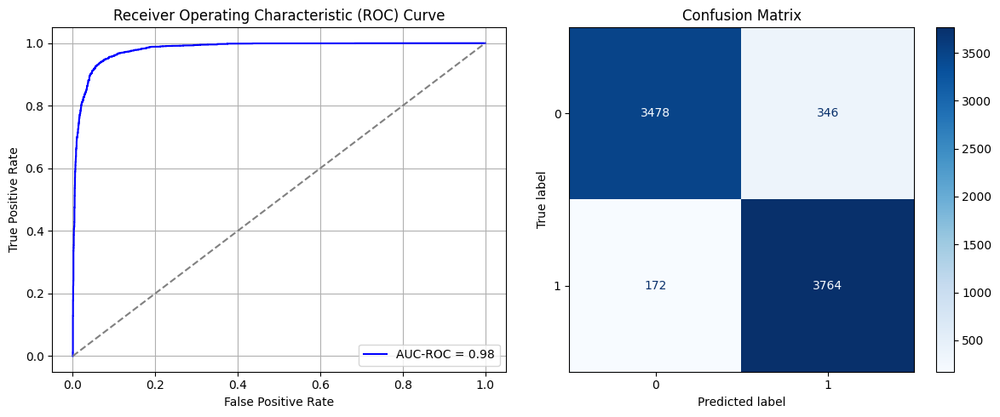

Best threshold based on F1-score: 0.5601052045822144
Time elapsed (performance): 59.18994798499989


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_22"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_154 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_155 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_156 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_157 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_158 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_159 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_160 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7206 - loss: 0.7272 - val_AUC: 0.0000e+00 - val_loss: 0.8195
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7422 - loss: 0.5623 - val_AUC: 0.0000e+00 - val_loss: 0.7078
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7543 - loss: 0.5529 - val_AUC: 0.0000e+00 - val_loss: 0.7772
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7493 - loss: 0.5501 - val_AUC: 0.0000e+00 - val_loss: 0.8824
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7661 - loss: 0.5427 - val_AUC: 0.0000e+00 - val_loss: 0.6245
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7593 - loss: 0.5506 - val_AUC: 0.0000e+00 - val_loss: 0.6926
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7599 - loss: 0.5429 - val_AUC: 0.0000e+00 - val_loss: 0.7693
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_23"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_161 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_162 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_163 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_164 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_165 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_166 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_167 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - AUC: 0.7073 - loss: 0.7748 - val_AUC: 0.0000e+00 - val_loss: 0.8353
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7413 - loss: 0.5587 - val_AUC: 0.0000e+00 - val_loss: 0.8617
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7565 - loss: 0.5533 - val_AUC: 0.0000e+00 - val_loss: 0.8691
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7561 - loss: 0.5488 - val_AUC: 0.0000e+00 - val_loss: 0.8444
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7544 - loss: 0.5491 - val_AUC: 0.0000e+00 - val_loss: 0.8529
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7666 - loss: 0.5387 - val_AUC: 0.0000e+00 - val_loss: 0.8214
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7457 - loss: 0.5553 - val_AUC: 0.0000e+00 - val_loss: 0.8755
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7526 - loss: 0.5528 - val_AUC: 0.0000e+00 - val_loss: 0.7611
Epoch 9/10
205/205 ━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_24"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_168 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_169 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_170 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_171 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_172 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_173 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_174 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7015 - loss: 0.8266 - val_AUC: 0.0000e+00 - val_loss: 0.9041
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7251 - loss: 0.5810 - val_AUC: 0.0000e+00 - val_loss: 0.8289
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7536 - loss: 0.5559 - val_AUC: 0.0000e+00 - val_loss: 0.7526
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7536 - loss: 0.5553 - val_AUC: 0.0000e+00 - val_loss: 0.8176
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7523 - loss: 0.5571 - val_AUC: 0.0000e+00 - val_loss: 0.8011
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7575 - loss: 0.5436 - val_AUC: 0.0000e+00 - val_loss: 0.8666
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7562 - loss: 0.5542 - val_AUC: 0.0000e+00 - val_loss: 0.8658
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7680 - loss: 0.5406 - val_AUC: 0.0000e+00 - val_loss: 0.6905
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_25"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_175 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_176 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_177 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_178 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_179 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_180 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_181 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7236 - loss: 0.7207 - val_AUC: 0.0000e+00 - val_loss: 0.8993
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7389 - loss: 0.5659 - val_AUC: 0.0000e+00 - val_loss: 0.7881
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7583 - loss: 0.5449 - val_AUC: 0.0000e+00 - val_loss: 0.7412
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7537 - loss: 0.5527 - val_AUC: 0.0000e+00 - val_loss: 0.7493
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7621 - loss: 0.5412 - val_AUC: 0.0000e+00 - val_loss: 0.8061
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7553 - loss: 0.5517 - val_AUC: 0.0000e+00 - val_loss: 0.8797
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7613 - loss: 0.5430 - val_AUC: 0.0000e+00 - val_loss: 0.8601
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7569 - loss: 0.5480 - val_AUC: 0.0000e+00 - val_loss: 0.8047
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_26"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_182 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_183 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_184 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_185 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_186 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_187 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_188 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.7210 - loss: 0.7360 - val_AUC: 0.0000e+00 - val_loss: 0.7536
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7390 - loss: 0.5658 - val_AUC: 0.0000e+00 - val_loss: 0.7739
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7539 - loss: 0.5518 - val_AUC: 0.0000e+00 - val_loss: 0.7648
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7577 - loss: 0.5505 - val_AUC: 0.0000e+00 - val_loss: 0.7666
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7578 - loss: 0.5495 - val_AUC: 0.0000e+00 - val_loss: 0.7784
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7638 - loss: 0.5396 - val_AUC: 0.0000e+00 - val_loss: 0.7696
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7642 - loss: 0.5358 - val_AUC: 0.0000e+00 - val_loss: 0.8321
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7622 - loss: 0.5419 - val_AUC: 0.0000e+00 - val_loss: 0.8278
Epoch 9/10
205/205 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_27"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_189 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_190 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_191 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_192 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_193 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_194 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_195 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7116 - loss: 0.7749 - val_AUC: 0.0000e+00 - val_loss: 0.8210
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7311 - loss: 0.5732 - val_AUC: 0.0000e+00 - val_loss: 0.8667
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7497 - loss: 0.5593 - val_AUC: 0.0000e+00 - val_loss: 0.8817
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7520 - loss: 0.5567 - val_AUC: 0.0000e+00 - val_loss: 0.7717
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7520 - loss: 0.5453 - val_AUC: 0.0000e+00 - val_loss: 0.7529
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7613 - loss: 0.5460 - val_AUC: 0.0000e+00 - val_loss: 0.7869
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7726 - loss: 0.5362 - val_AUC: 0.0000e+00 - val_loss: 0.8229
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7661 - loss: 0.5379 - val_AUC: 0.0000e+00 - val_loss: 0.7306
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_28"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_196 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_197 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_198 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_199 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_200 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_201 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_202 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - AUC: 0.7024 - loss: 0.7871 - val_AUC: 0.0000e+00 - val_loss: 0.7900
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7327 - loss: 0.5707 - val_AUC: 0.0000e+00 - val_loss: 0.8407
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7548 - loss: 0.5497 - val_AUC: 0.0000e+00 - val_loss: 0.8673
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7677 - loss: 0.5391 - val_AUC: 0.0000e+00 - val_loss: 0.7979
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7484 - loss: 0.5583 - val_AUC: 0.0000e+00 - val_loss: 0.8547
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7598 - loss: 0.5420 - val_AUC: 0.0000e+00 - val_loss: 0.8909
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7548 - loss: 0.5475 - val_AUC: 0.0000e+00 - val_loss: 0.8081
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7662 - loss: 0.5362 - val_AUC: 0.0000e+00 - val_loss: 0.6843
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_29"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_203 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_204 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_205 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_206 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_207 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_208 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_209 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - AUC: 0.7090 - loss: 0.7784 - val_AUC: 0.0000e+00 - val_loss: 0.7892
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7371 - loss: 0.5696 - val_AUC: 0.0000e+00 - val_loss: 0.9011
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7495 - loss: 0.5539 - val_AUC: 0.0000e+00 - val_loss: 0.7360
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7488 - loss: 0.5577 - val_AUC: 0.0000e+00 - val_loss: 0.8425
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7550 - loss: 0.5509 - val_AUC: 0.0000e+00 - val_loss: 0.7851
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7535 - loss: 0.5527 - val_AUC: 0.0000e+00 - val_loss: 0.7274
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7588 - loss: 0.5474 - val_AUC: 0.0000e+00 - val_loss: 0.7562
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7533 - loss: 0.5497 - val_AUC: 0.0000e+00 - val_loss: 0.8285
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_30"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_210 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_211 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_212 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_213 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_214 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_215 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_216 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7160 - loss: 0.7694 - val_AUC: 0.0000e+00 - val_loss: 0.8440
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7348 - loss: 0.5633 - val_AUC: 0.0000e+00 - val_loss: 0.8692
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7382 - loss: 0.5625 - val_AUC: 0.0000e+00 - val_loss: 0.8020
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7439 - loss: 0.5601 - val_AUC: 0.0000e+00 - val_loss: 0.8034
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7654 - loss: 0.5416 - val_AUC: 0.0000e+00 - val_loss: 0.7615
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7621 - loss: 0.5341 - val_AUC: 0.0000e+00 - val_loss: 0.8159
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7655 - loss: 0.5405 - val_AUC: 0.0000e+00 - val_loss: 0.7536
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7679 - loss: 0.5422 - val_AUC: 0.0000e+00 - val_loss: 0.8362
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_31"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_217 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_218 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_219 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_220 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_221 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_222 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_223 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7258 - loss: 0.7322 - val_AUC: 0.0000e+00 - val_loss: 0.9243
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7449 - loss: 0.5594 - val_AUC: 0.0000e+00 - val_loss: 0.8996
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7450 - loss: 0.5596 - val_AUC: 0.0000e+00 - val_loss: 0.8740
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7560 - loss: 0.5469 - val_AUC: 0.0000e+00 - val_loss: 0.7606
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7550 - loss: 0.5516 - val_AUC: 0.0000e+00 - val_loss: 0.7836
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7733 - loss: 0.5300 - val_AUC: 0.0000e+00 - val_loss: 0.6927
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7539 - loss: 0.5479 - val_AUC: 0.0000e+00 - val_loss: 0.7336
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7556 - loss: 0.5482 - val_AUC: 0.0000e+00 - val_loss: 0.9446
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_32"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_224 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_225 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_226 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_227 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_228 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_229 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_230 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - AUC: 0.7101 - loss: 0.7775 - val_AUC: 0.0000e+00 - val_loss: 0.8625
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7523 - loss: 0.5576 - val_AUC: 0.0000e+00 - val_loss: 0.7940
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7500 - loss: 0.5521 - val_AUC: 0.0000e+00 - val_loss: 0.7075
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7452 - loss: 0.5570 - val_AUC: 0.0000e+00 - val_loss: 0.7352
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7535 - loss: 0.5561 - val_AUC: 0.0000e+00 - val_loss: 0.8444
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7713 - loss: 0.5317 - val_AUC: 0.0000e+00 - val_loss: 0.7547
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7512 - loss: 0.5545 - val_AUC: 0.0000e+00 - val_loss: 0.7156
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7725 - loss: 0.5301 - val_AUC: 0.0000e+00 - val_loss: 0.7603
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_33"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_231 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_232 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_233 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_234 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_235 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_236 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_237 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7183 - loss: 0.7479 - val_AUC: 0.0000e+00 - val_loss: 0.7493
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7410 - loss: 0.5631 - val_AUC: 0.0000e+00 - val_loss: 0.8244
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7479 - loss: 0.5531 - val_AUC: 0.0000e+00 - val_loss: 0.8201
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7624 - loss: 0.5401 - val_AUC: 0.0000e+00 - val_loss: 0.8785
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7645 - loss: 0.5430 - val_AUC: 0.0000e+00 - val_loss: 0.8271
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7618 - loss: 0.5418 - val_AUC: 0.0000e+00 - val_loss: 0.7965
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7474 - loss: 0.5593 - val_AUC: 0.0000e+00 - val_loss: 0.8615
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7586 - loss: 0.5446 - val_AUC: 0.0000e+00 - val_loss: 0.6803
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_34"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_238 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_239 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_240 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_241 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_242 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_243 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_244 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7331 - loss: 0.7166 - val_AUC: 0.0000e+00 - val_loss: 0.7690
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7304 - loss: 0.5689 - val_AUC: 0.0000e+00 - val_loss: 0.7944
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7474 - loss: 0.5546 - val_AUC: 0.0000e+00 - val_loss: 0.7876
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7649 - loss: 0.5445 - val_AUC: 0.0000e+00 - val_loss: 0.8469
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7625 - loss: 0.5386 - val_AUC: 0.0000e+00 - val_loss: 0.8927
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7518 - loss: 0.5536 - val_AUC: 0.0000e+00 - val_loss: 0.7531
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7703 - loss: 0.5364 - val_AUC: 0.0000e+00 - val_loss: 0.7923
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7624 - loss: 0.5421 - val_AUC: 0.0000e+00 - val_loss: 0.8582
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_35"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_245 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_246 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_247 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_248 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_249 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_250 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_251 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - AUC: 0.6989 - loss: 0.8001 - val_AUC: 0.0000e+00 - val_loss: 0.8943
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7477 - loss: 0.5552 - val_AUC: 0.0000e+00 - val_loss: 0.6958
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7512 - loss: 0.5524 - val_AUC: 0.0000e+00 - val_loss: 0.8876
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7631 - loss: 0.5400 - val_AUC: 0.0000e+00 - val_loss: 0.7265
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7522 - loss: 0.5538 - val_AUC: 0.0000e+00 - val_loss: 0.8651
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7496 - loss: 0.5532 - val_AUC: 0.0000e+00 - val_loss: 0.8441
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7550 - loss: 0.5488 - val_AUC: 0.0000e+00 - val_loss: 0.9099
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7593 - loss: 0.5432 - val_AUC: 0.0000e+00 - val_loss: 0.7654
Epoch 9/10
205/205 ━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_36"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_252 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_253 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_254 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_255 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_256 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_257 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_258 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7047 - loss: 0.8067 - val_AUC: 0.0000e+00 - val_loss: 0.9339
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7317 - loss: 0.5639 - val_AUC: 0.0000e+00 - val_loss: 0.8272
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7490 - loss: 0.5599 - val_AUC: 0.0000e+00 - val_loss: 0.7107
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7507 - loss: 0.5549 - val_AUC: 0.0000e+00 - val_loss: 0.8725
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7480 - loss: 0.5595 - val_AUC: 0.0000e+00 - val_loss: 0.8827
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7648 - loss: 0.5465 - val_AUC: 0.0000e+00 - val_loss: 0.7714
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7696 - loss: 0.5344 - val_AUC: 0.0000e+00 - val_loss: 0.8515
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7622 - loss: 0.5444 - val_AUC: 0.0000e+00 - val_loss: 0.7176
Epoch 9/10
205/205 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_37"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_259 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_260 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_261 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_262 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_263 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_264 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_265 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - AUC: 0.7087 - loss: 0.7791 - val_AUC: 0.0000e+00 - val_loss: 0.8492
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7418 - loss: 0.5593 - val_AUC: 0.0000e+00 - val_loss: 0.8004
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7497 - loss: 0.5578 - val_AUC: 0.0000e+00 - val_loss: 0.7170
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7488 - loss: 0.5523 - val_AUC: 0.0000e+00 - val_loss: 0.8175
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7648 - loss: 0.5440 - val_AUC: 0.0000e+00 - val_loss: 0.8444
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7792 - loss: 0.5266 - val_AUC: 0.0000e+00 - val_loss: 0.7755
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7685 - loss: 0.5393 - val_AUC: 0.0000e+00 - val_loss: 0.9265
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7734 - loss: 0.5341 - val_AUC: 0.0000e+00 - val_loss: 0.9220
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_38"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_266 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_267 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_268 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_269 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_270 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_271 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_272 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7064 - loss: 0.7848 - val_AUC: 0.0000e+00 - val_loss: 0.8875
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7506 - loss: 0.5558 - val_AUC: 0.0000e+00 - val_loss: 0.8112
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7510 - loss: 0.5554 - val_AUC: 0.0000e+00 - val_loss: 0.8249
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7674 - loss: 0.5400 - val_AUC: 0.0000e+00 - val_loss: 0.7816
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7605 - loss: 0.5434 - val_AUC: 0.0000e+00 - val_loss: 0.7348
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7533 - loss: 0.5527 - val_AUC: 0.0000e+00 - val_loss: 0.7445
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7450 - loss: 0.5526 - val_AUC: 0.0000e+00 - val_loss: 0.7441
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7603 - loss: 0.5431 - val_AUC: 0.0000e+00 - val_loss: 0.8795
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_39"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_273 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_274 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_275 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_276 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_277 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_278 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_279 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - AUC: 0.7136 - loss: 0.7711 - val_AUC: 0.0000e+00 - val_loss: 0.8057
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7386 - loss: 0.5663 - val_AUC: 0.0000e+00 - val_loss: 0.8071
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7394 - loss: 0.5667 - val_AUC: 0.0000e+00 - val_loss: 0.8770
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7534 - loss: 0.5523 - val_AUC: 0.0000e+00 - val_loss: 0.8665
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7663 - loss: 0.5403 - val_AUC: 0.0000e+00 - val_loss: 0.7974
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7552 - loss: 0.5482 - val_AUC: 0.0000e+00 - val_loss: 0.7765
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7621 - loss: 0.5397 - val_AUC: 0.0000e+00 - val_loss: 0.7663
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7669 - loss: 0.5336 - val_AUC: 0.0000e+00 - val_loss: 0.7533
Epoch 9/10
205/205 ━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_40"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_280 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_281 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_282 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_283 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_284 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_285 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_286 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


205/205 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - AUC: 0.7085 - loss: 0.7635 - val_AUC: 0.0000e+00 - val_loss: 0.8568
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7432 - loss: 0.5624 - val_AUC: 0.0000e+00 - val_loss: 0.8331
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7413 - loss: 0.5553 - val_AUC: 0.0000e+00 - val_loss: 0.9189
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7539 - loss: 0.5467 - val_AUC: 0.0000e+00 - val_loss: 0.6940
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7525 - loss: 0.5456 - val_AUC: 0.0000e+00 - val_loss: 0.8144
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7525 - loss: 0.5474 - val_AUC: 0.0000e+00 - val_loss: 0.7247
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7558 - loss: 0.5411 - val_AUC: 0.0000e+00 - val_loss: 0.7609
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7590 - loss: 0.5496 - val_AUC: 0.0000e+00 - val_loss: 0.8640
Epoch 9/10
205/205 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_41"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_287 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_288 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_289 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_290 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_291 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_292 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_293 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.7152 - loss: 0.7622 - val_AUC: 0.0000e+00 - val_loss: 0.7053
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.7506 - loss: 0.5561 - val_AUC: 0.0000e+00 - val_loss: 0.7250
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7603 - loss: 0.5448 - val_AUC: 0.0000e+00 - val_loss: 0.7775
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7619 - loss: 0.5467 - val_AUC: 0.0000e+00 - val_loss: 0.7859
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7671 - loss: 0.5401 - val_AUC: 0.0000e+00 - val_loss: 0.8282
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7654 - loss: 0.5413 - val_AUC: 0.0000e+00 - val_loss: 0.8531
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7597 - loss: 0.5389 - val_AUC: 0.0000e+00 - val_loss: 0.8937
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7601 - loss: 0.5427 - val_AUC: 0.0000e+00 - val_loss: 0.7485
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_42"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_294 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_295 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_296 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_297 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_298 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_299 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_300 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - AUC: 0.7603 - loss: 0.5658 - val_AUC: 0.9246 - val_loss: 0.3521
Epoch 2/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 10s 6ms/step - AUC: 0.9284 - loss: 0.3413 - val_AUC: 0.9588 - val_loss: 0.2637
Epoch 3/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.9517 - loss: 0.2816 - val_AUC: 0.9651 - val_loss: 0.2445
Epoch 4/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - AUC: 0.9642 - loss: 0.2425 - val_AUC: 0.9698 - val_loss: 0.2366
Epoch 5/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - AUC: 0.9681 - loss: 0.2286 - val_AUC: 0.9749 - val_loss: 0.2089
Epoch 6/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 10s 6ms/step - AUC: 0.9717 - loss: 0.2142 - val_AUC: 0.9776 - val_loss: 0.1934
Epoch 7/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - AUC: 0.9742 - loss: 0.2037 - val_AUC: 0.9776 - val_loss: 0.2078
Epoch 8/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.9769 - loss: 0.1934 - val_AUC: 0.9689 - val_loss: 0.2401
Epoch 9/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/ste

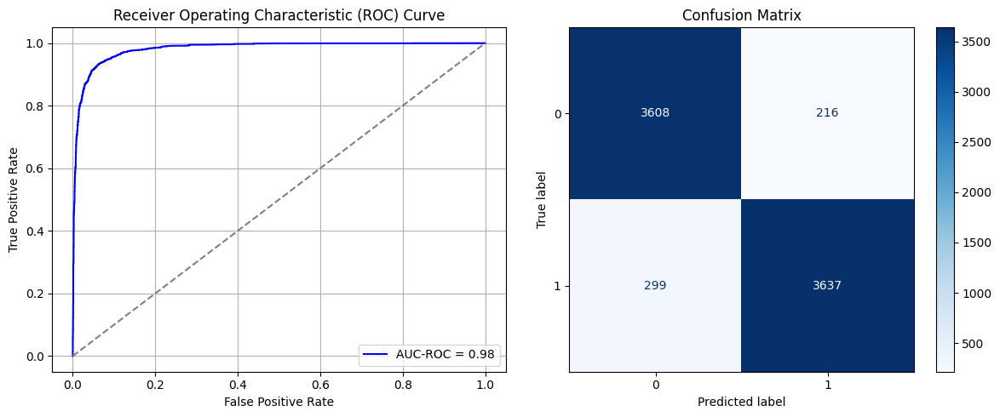

Best threshold based on F1-score: 0.4425399601459503
Time elapsed (performance): 72.47882470700006


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_43"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_301 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_302 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_303 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_304 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_305 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_306 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_307 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7426 - loss: 0.6923 - val_AUC: 0.0000e+00 - val_loss: 0.7976
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7526 - loss: 0.5478 - val_AUC: 0.0000e+00 - val_loss: 0.7749
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7528 - loss: 0.5496 - val_AUC: 0.0000e+00 - val_loss: 0.9207
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7630 - loss: 0.5381 - val_AUC: 0.0000e+00 - val_loss: 0.7832
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7666 - loss: 0.5366 - val_AUC: 0.0000e+00 - val_loss: 0.8315
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7668 - loss: 0.5357 - val_AUC: 0.0000e+00 - val_loss: 0.7475
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7714 - loss: 0.5320 - val_AUC: 0.0000e+00 - val_loss: 0.7709
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_44"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_308 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_309 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_310 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_311 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_312 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_313 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_314 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - AUC: 0.7545 - loss: 0.6826 - val_AUC: 0.0000e+00 - val_loss: 0.8067
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7346 - loss: 0.5665 - val_AUC: 0.0000e+00 - val_loss: 0.8078
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7539 - loss: 0.5438 - val_AUC: 0.0000e+00 - val_loss: 0.8402
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7537 - loss: 0.5446 - val_AUC: 0.0000e+00 - val_loss: 0.7528
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7596 - loss: 0.5374 - val_AUC: 0.0000e+00 - val_loss: 0.7602
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7714 - loss: 0.5330 - val_AUC: 0.0000e+00 - val_loss: 0.8403
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7781 - loss: 0.5198 - val_AUC: 0.0000e+00 - val_loss: 0.7248
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - A

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_45"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_315 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_316 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_317 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_318 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_319 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_320 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_321 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7461 - loss: 0.6952 - val_AUC: 0.0000e+00 - val_loss: 0.8331
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7518 - loss: 0.5531 - val_AUC: 0.0000e+00 - val_loss: 0.8251
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7554 - loss: 0.5472 - val_AUC: 0.0000e+00 - val_loss: 0.8167
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7534 - loss: 0.5465 - val_AUC: 0.0000e+00 - val_loss: 0.8155
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7555 - loss: 0.5421 - val_AUC: 0.0000e+00 - val_loss: 0.6893
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7667 - loss: 0.5349 - val_AUC: 0.0000e+00 - val_loss: 0.7800
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7729 - loss: 0.5257 - val_AUC: 0.0000e+00 - val_loss: 0.8212
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7758 - loss: 0.5270 - val_AUC: 0.0000e+00 - val_loss: 0.6937
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_46"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_322 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_323 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_324 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_325 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_326 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_327 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_328 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7504 - loss: 0.6686 - val_AUC: 0.0000e+00 - val_loss: 0.7804
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7533 - loss: 0.5536 - val_AUC: 0.0000e+00 - val_loss: 0.8516
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7620 - loss: 0.5454 - val_AUC: 0.0000e+00 - val_loss: 0.7461
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7615 - loss: 0.5383 - val_AUC: 0.0000e+00 - val_loss: 0.7536
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7547 - loss: 0.5478 - val_AUC: 0.0000e+00 - val_loss: 0.7381
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7741 - loss: 0.5266 - val_AUC: 0.0000e+00 - val_loss: 0.7659
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7682 - loss: 0.5344 - val_AUC: 0.0000e+00 - val_loss: 0.7671
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7787 - loss: 0.5257 - val_AUC: 0.0000e+00 - val_loss: 0.7932
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_47"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_329 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_330 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_331 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_332 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_333 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_334 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_335 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.7478 - loss: 0.6840 - val_AUC: 0.0000e+00 - val_loss: 0.7930
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7504 - loss: 0.5565 - val_AUC: 0.0000e+00 - val_loss: 0.8526
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7530 - loss: 0.5553 - val_AUC: 0.0000e+00 - val_loss: 0.8600
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7478 - loss: 0.5482 - val_AUC: 0.0000e+00 - val_loss: 0.8005
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7514 - loss: 0.5440 - val_AUC: 0.0000e+00 - val_loss: 0.8054
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7777 - loss: 0.5225 - val_AUC: 0.0000e+00 - val_loss: 0.8024
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7692 - loss: 0.5305 - val_AUC: 0.0000e+00 - val_loss: 0.8347
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7723 - loss: 0.5283 - val_AUC: 0.0000e+00 - val_loss: 0.8210
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_48"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_336 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_337 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_338 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_339 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_340 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_341 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_342 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - AUC: 0.7551 - loss: 0.6697 - val_AUC: 0.0000e+00 - val_loss: 0.8148
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7451 - loss: 0.5573 - val_AUC: 0.0000e+00 - val_loss: 0.7428
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7657 - loss: 0.5395 - val_AUC: 0.0000e+00 - val_loss: 0.7470
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7619 - loss: 0.5379 - val_AUC: 0.0000e+00 - val_loss: 0.8233
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7609 - loss: 0.5335 - val_AUC: 0.0000e+00 - val_loss: 0.8591
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7720 - loss: 0.5267 - val_AUC: 0.0000e+00 - val_loss: 0.8221
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7641 - loss: 0.5348 - val_AUC: 0.0000e+00 - val_loss: 0.7835
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7666 - loss: 0.5349 - val_AUC: 0.0000e+00 - val_loss: 0.7176
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_49"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_343 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_344 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_345 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_346 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_347 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_348 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_349 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7496 - loss: 0.6740 - val_AUC: 0.0000e+00 - val_loss: 0.7869
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7391 - loss: 0.5595 - val_AUC: 0.0000e+00 - val_loss: 0.7845
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7457 - loss: 0.5534 - val_AUC: 0.0000e+00 - val_loss: 0.8169
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7551 - loss: 0.5436 - val_AUC: 0.0000e+00 - val_loss: 0.7269
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7526 - loss: 0.5450 - val_AUC: 0.0000e+00 - val_loss: 0.8177
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7608 - loss: 0.5369 - val_AUC: 0.0000e+00 - val_loss: 0.8437
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7728 - loss: 0.5255 - val_AUC: 0.0000e+00 - val_loss: 0.8359
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7711 - loss: 0.5258 - val_AUC: 0.0000e+00 - val_loss: 0.7298
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_50"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_350 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_351 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_352 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_353 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_354 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_355 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_356 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7310 - loss: 0.7185 - val_AUC: 0.0000e+00 - val_loss: 0.8373
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7459 - loss: 0.5600 - val_AUC: 0.0000e+00 - val_loss: 0.8236
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7598 - loss: 0.5433 - val_AUC: 0.0000e+00 - val_loss: 0.8502
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7532 - loss: 0.5414 - val_AUC: 0.0000e+00 - val_loss: 0.8214
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7644 - loss: 0.5326 - val_AUC: 0.0000e+00 - val_loss: 0.8063
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7730 - loss: 0.5289 - val_AUC: 0.0000e+00 - val_loss: 0.6908
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7709 - loss: 0.5326 - val_AUC: 0.0000e+00 - val_loss: 0.7053
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7738 - loss: 0.5255 - val_AUC: 0.0000e+00 - val_loss: 0.7473
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_51"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_357 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_358 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_359 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_360 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_361 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_362 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_363 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7472 - loss: 0.6962 - val_AUC: 0.0000e+00 - val_loss: 0.8653
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7591 - loss: 0.5436 - val_AUC: 0.0000e+00 - val_loss: 0.7694
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7461 - loss: 0.5583 - val_AUC: 0.0000e+00 - val_loss: 0.8085
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7671 - loss: 0.5290 - val_AUC: 0.0000e+00 - val_loss: 0.7210
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7604 - loss: 0.5367 - val_AUC: 0.0000e+00 - val_loss: 0.7996
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7673 - loss: 0.5398 - val_AUC: 0.0000e+00 - val_loss: 0.9509
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7663 - loss: 0.5339 - val_AUC: 0.0000e+00 - val_loss: 0.7787
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7797 - loss: 0.5241 - val_AUC: 0.0000e+00 - val_loss: 0.8335
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_52"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_364 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_365 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_366 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_367 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_368 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_369 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_370 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - AUC: 0.7444 - loss: 0.6877 - val_AUC: 0.0000e+00 - val_loss: 0.8510
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7506 - loss: 0.5516 - val_AUC: 0.0000e+00 - val_loss: 0.7920
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7558 - loss: 0.5446 - val_AUC: 0.0000e+00 - val_loss: 0.8502
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7591 - loss: 0.5464 - val_AUC: 0.0000e+00 - val_loss: 0.8593
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7711 - loss: 0.5265 - val_AUC: 0.0000e+00 - val_loss: 0.7607
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7620 - loss: 0.5363 - val_AUC: 0.0000e+00 - val_loss: 0.8299
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7822 - loss: 0.5181 - val_AUC: 0.0000e+00 - val_loss: 0.7200
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7665 - loss: 0.5324 - val_AUC: 0.0000e+00 - val_loss: 0.7560
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_53"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_371 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_372 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_373 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_374 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_375 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_376 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_377 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7359 - loss: 0.7070 - val_AUC: 0.0000e+00 - val_loss: 0.8147
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7611 - loss: 0.5431 - val_AUC: 0.0000e+00 - val_loss: 0.7738
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7446 - loss: 0.5538 - val_AUC: 0.0000e+00 - val_loss: 0.7857
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7503 - loss: 0.5399 - val_AUC: 0.0000e+00 - val_loss: 0.6880
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7676 - loss: 0.5264 - val_AUC: 0.0000e+00 - val_loss: 0.7101
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7554 - loss: 0.5463 - val_AUC: 0.0000e+00 - val_loss: 0.8764
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7653 - loss: 0.5279 - val_AUC: 0.0000e+00 - val_loss: 0.7560
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7727 - loss: 0.5276 - val_AUC: 0.0000e+00 - val_loss: 0.8144
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_54"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_378 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_379 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_380 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_381 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_382 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_383 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_384 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - AUC: 0.7438 - loss: 0.6749 - val_AUC: 0.0000e+00 - val_loss: 0.8388
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7529 - loss: 0.5482 - val_AUC: 0.0000e+00 - val_loss: 0.8087
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7506 - loss: 0.5519 - val_AUC: 0.0000e+00 - val_loss: 0.6926
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7588 - loss: 0.5400 - val_AUC: 0.0000e+00 - val_loss: 0.8013
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7619 - loss: 0.5386 - val_AUC: 0.0000e+00 - val_loss: 0.9055
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7637 - loss: 0.5406 - val_AUC: 0.0000e+00 - val_loss: 0.7847
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7602 - loss: 0.5380 - val_AUC: 0.0000e+00 - val_loss: 0.8108
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7753 - loss: 0.5291 - val_AUC: 0.0000e+00 - val_loss: 0.7855
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_55"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_385 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_386 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_387 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_388 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_389 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_390 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_391 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.7447 - loss: 0.6937 - val_AUC: 0.0000e+00 - val_loss: 0.7671
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7520 - loss: 0.5532 - val_AUC: 0.0000e+00 - val_loss: 0.8251
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.7492 - loss: 0.5506 - val_AUC: 0.0000e+00 - val_loss: 0.7976
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7625 - loss: 0.5328 - val_AUC: 0.0000e+00 - val_loss: 0.8511
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7611 - loss: 0.5402 - val_AUC: 0.0000e+00 - val_loss: 0.8168
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7667 - loss: 0.5389 - val_AUC: 0.0000e+00 - val_loss: 0.8167
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7673 - loss: 0.5267 - val_AUC: 0.0000e+00 - val_loss: 0.8040
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7687 - loss: 0.5242 - val_AUC: 0.0000e+00 - val_loss: 0.7963
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_56"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_392 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_393 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_394 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_395 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_396 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_397 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_398 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - AUC: 0.7477 - loss: 0.6675 - val_AUC: 0.0000e+00 - val_loss: 0.8159
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7506 - loss: 0.5499 - val_AUC: 0.0000e+00 - val_loss: 0.7410
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7498 - loss: 0.5505 - val_AUC: 0.0000e+00 - val_loss: 0.8591
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7617 - loss: 0.5365 - val_AUC: 0.0000e+00 - val_loss: 0.8004
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7571 - loss: 0.5368 - val_AUC: 0.0000e+00 - val_loss: 0.8461
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7565 - loss: 0.5325 - val_AUC: 0.0000e+00 - val_loss: 0.7370
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7802 - loss: 0.5163 - val_AUC: 0.0000e+00 - val_loss: 0.6643
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7743 - loss: 0.5249 - val_AUC: 0.0000e+00 - val_loss: 0.6976
Epoch 9/10
205/205 ━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_57"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_399 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_400 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_401 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_402 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_403 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_404 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_405 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7435 - loss: 0.6909 - val_AUC: 0.0000e+00 - val_loss: 0.7777
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7450 - loss: 0.5570 - val_AUC: 0.0000e+00 - val_loss: 0.8839
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7417 - loss: 0.5504 - val_AUC: 0.0000e+00 - val_loss: 0.8616
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7516 - loss: 0.5501 - val_AUC: 0.0000e+00 - val_loss: 0.7758
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7657 - loss: 0.5376 - val_AUC: 0.0000e+00 - val_loss: 0.7703
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7628 - loss: 0.5307 - val_AUC: 0.0000e+00 - val_loss: 0.8740
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7813 - loss: 0.5196 - val_AUC: 0.0000e+00 - val_loss: 0.7468
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7797 - loss: 0.5216 - val_AUC: 0.0000e+00 - val_loss: 0.7571
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_58"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_406 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_407 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_408 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_409 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_410 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_411 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_412 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.7387 - loss: 0.6853 - val_AUC: 0.0000e+00 - val_loss: 0.7914
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7598 - loss: 0.5441 - val_AUC: 0.0000e+00 - val_loss: 0.8096
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7543 - loss: 0.5500 - val_AUC: 0.0000e+00 - val_loss: 0.8368
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7648 - loss: 0.5331 - val_AUC: 0.0000e+00 - val_loss: 0.7843
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7685 - loss: 0.5398 - val_AUC: 0.0000e+00 - val_loss: 0.8051
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7755 - loss: 0.5289 - val_AUC: 0.0000e+00 - val_loss: 0.7752
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7666 - loss: 0.5345 - val_AUC: 0.0000e+00 - val_loss: 0.8155
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7715 - loss: 0.5227 - val_AUC: 0.0000e+00 - val_loss: 0.7755
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_59"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_413 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_414 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_415 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_416 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_417 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_418 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_419 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - AUC: 0.7510 - loss: 0.6734 - val_AUC: 0.0000e+00 - val_loss: 0.7752
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7547 - loss: 0.5544 - val_AUC: 0.0000e+00 - val_loss: 0.8450
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7587 - loss: 0.5468 - val_AUC: 0.0000e+00 - val_loss: 0.7799
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7572 - loss: 0.5412 - val_AUC: 0.0000e+00 - val_loss: 0.7246
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7587 - loss: 0.5390 - val_AUC: 0.0000e+00 - val_loss: 0.8691
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7596 - loss: 0.5345 - val_AUC: 0.0000e+00 - val_loss: 0.7821
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7702 - loss: 0.5253 - val_AUC: 0.0000e+00 - val_loss: 0.7202
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_60"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_420 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_421 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_422 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_423 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_424 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_425 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_426 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7470 - loss: 0.6681 - val_AUC: 0.0000e+00 - val_loss: 0.8897
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7543 - loss: 0.5516 - val_AUC: 0.0000e+00 - val_loss: 0.7823
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7496 - loss: 0.5560 - val_AUC: 0.0000e+00 - val_loss: 0.7436
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7502 - loss: 0.5466 - val_AUC: 0.0000e+00 - val_loss: 0.7956
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7558 - loss: 0.5438 - val_AUC: 0.0000e+00 - val_loss: 0.7963
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7773 - loss: 0.5334 - val_AUC: 0.0000e+00 - val_loss: 0.8315
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7756 - loss: 0.5281 - val_AUC: 0.0000e+00 - val_loss: 0.7211
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7779 - loss: 0.5261 - val_AUC: 0.0000e+00 - val_loss: 0.7801
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_61"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_427 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_428 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_429 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_430 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_431 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_432 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_433 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7474 - loss: 0.6649 - val_AUC: 0.0000e+00 - val_loss: 0.7066
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.7505 - loss: 0.5578 - val_AUC: 0.0000e+00 - val_loss: 0.8558
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7445 - loss: 0.5493 - val_AUC: 0.0000e+00 - val_loss: 0.7598
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7451 - loss: 0.5539 - val_AUC: 0.0000e+00 - val_loss: 0.7526
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7570 - loss: 0.5464 - val_AUC: 0.0000e+00 - val_loss: 0.7711
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7658 - loss: 0.5283 - val_AUC: 0.0000e+00 - val_loss: 0.7372
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7769 - loss: 0.5297 - val_AUC: 0.0000e+00 - val_loss: 0.8011
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7635 - loss: 0.5297 - val_AUC: 0.0000e+00 - val_loss: 0.7305
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_62"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_434 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_435 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_436 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_437 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_438 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_439 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_440 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - AUC: 0.7535 - loss: 0.6672 - val_AUC: 0.0000e+00 - val_loss: 0.8531
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7673 - loss: 0.5421 - val_AUC: 0.0000e+00 - val_loss: 0.7807
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7588 - loss: 0.5400 - val_AUC: 0.0000e+00 - val_loss: 0.6950
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7613 - loss: 0.5448 - val_AUC: 0.0000e+00 - val_loss: 0.8573
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7554 - loss: 0.5444 - val_AUC: 0.0000e+00 - val_loss: 0.7174
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7703 - loss: 0.5304 - val_AUC: 0.0000e+00 - val_loss: 0.7161
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7745 - loss: 0.5213 - val_AUC: 0.0000e+00 - val_loss: 0.7194
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_63"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_441 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_442 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_443 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_444 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_445 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_446 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_447 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 8s 6ms/step - AUC: 0.7948 - loss: 0.5305 - val_AUC: 0.9379 - val_loss: 0.3500
Epoch 2/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 7s 8ms/step - AUC: 0.9421 - loss: 0.3082 - val_AUC: 0.9586 - val_loss: 0.2603
Epoch 3/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 9s 6ms/step - AUC: 0.9574 - loss: 0.2641 - val_AUC: 0.9716 - val_loss: 0.2148
Epoch 4/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - AUC: 0.9656 - loss: 0.2375 - val_AUC: 0.9702 - val_loss: 0.2239
Epoch 5/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 9s 5ms/step - AUC: 0.9703 - loss: 0.2193 - val_AUC: 0.9762 - val_loss: 0.2610
Epoch 6/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 7s 8ms/step - AUC: 0.9734 - loss: 0.2079 - val_AUC: 0.9779 - val_loss: 0.1900
Epoch 7/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.9749 - loss: 0.2010 - val_AUC: 0.9733 - val_loss: 0.2087
Epoch 8/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - AUC: 0.9758 - loss: 0.1956 - val_AUC: 0.9817 - val_loss: 0.1772
Epoch 9/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - 

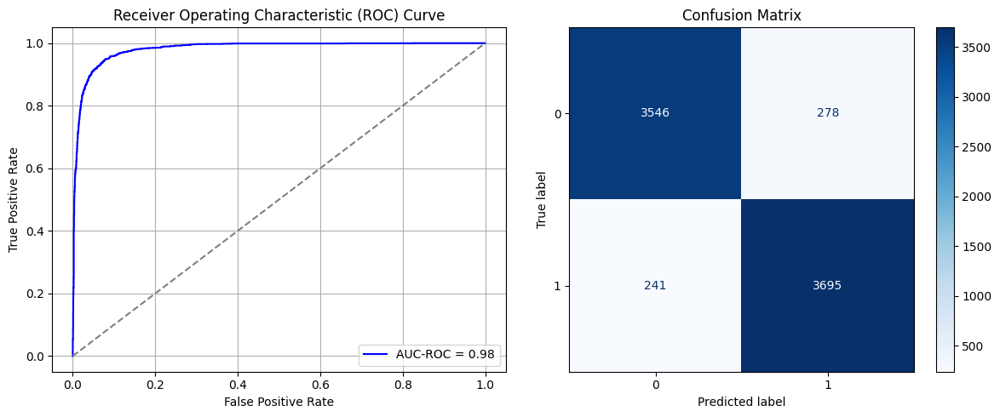

Best threshold based on F1-score: 0.4441187381744385
Time elapsed (performance): 66.43340727099985


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_64"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_448 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_449 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_450 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_451 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_452 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_453 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_454 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


205/205 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - AUC: 0.5355 - loss: 1.2516 - val_AUC: 0.0000e+00 - val_loss: 1.0091
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.5916 - loss: 0.6467 - val_AUC: 0.0000e+00 - val_loss: 0.8935
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6296 - loss: 0.6347 - val_AUC: 0.0000e+00 - val_loss: 0.8478
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6563 - loss: 0.6231 - val_AUC: 0.0000e+00 - val_loss: 0.8423
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6659 - loss: 0.6165 - val_AUC: 0.0000e+00 - val_loss: 0.8087
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6658 - loss: 0.6098 - val_AUC: 0.0000e+00 - val_loss: 0.8744
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6806 - loss: 0.6041 - val_AUC: 0.0000e+00 - val_loss: 1.0814
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6847 - loss: 0.6091 - val_AUC: 0.0000e+00 - val_loss: 0.8681
Epoch 9/10
205/205 ━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_65"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_455 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_456 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_457 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_458 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_459 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_460 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_461 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.5465 - loss: 1.1752 - val_AUC: 0.0000e+00 - val_loss: 0.9472
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.5840 - loss: 0.6578 - val_AUC: 0.0000e+00 - val_loss: 0.8356
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6427 - loss: 0.6361 - val_AUC: 0.0000e+00 - val_loss: 1.0006
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6616 - loss: 0.6231 - val_AUC: 0.0000e+00 - val_loss: 0.8845
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6720 - loss: 0.6184 - val_AUC: 0.0000e+00 - val_loss: 0.9398
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6811 - loss: 0.6090 - val_AUC: 0.0000e+00 - val_loss: 0.9783
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6942 - loss: 0.5982 - val_AUC: 0.0000e+00 - val_loss: 0.9609
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_66"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_462 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_463 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_464 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_465 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_466 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_467 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_468 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.5306 - loss: 1.2623 - val_AUC: 0.0000e+00 - val_loss: 0.9222
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.5807 - loss: 0.6533 - val_AUC: 0.0000e+00 - val_loss: 0.9221
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6328 - loss: 0.6364 - val_AUC: 0.0000e+00 - val_loss: 0.8811
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6602 - loss: 0.6231 - val_AUC: 0.0000e+00 - val_loss: 0.8565
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6677 - loss: 0.6195 - val_AUC: 0.0000e+00 - val_loss: 0.8523
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.6707 - loss: 0.6114 - val_AUC: 0.0000e+00 - val_loss: 1.0363
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6845 - loss: 0.6015 - val_AUC: 0.0000e+00 - val_loss: 0.8529
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6998 - loss: 0.5998 - val_AUC: 0.0000e+00 - val_loss: 0.8468
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_67"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_469 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_470 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_471 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_472 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_473 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_474 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_475 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.5278 - loss: 1.2518 - val_AUC: 0.0000e+00 - val_loss: 0.8932
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.5869 - loss: 0.6505 - val_AUC: 0.0000e+00 - val_loss: 0.9265
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.6273 - loss: 0.6339 - val_AUC: 0.0000e+00 - val_loss: 0.9809
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6540 - loss: 0.6294 - val_AUC: 0.0000e+00 - val_loss: 0.9571
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6727 - loss: 0.6148 - val_AUC: 0.0000e+00 - val_loss: 0.9360
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6891 - loss: 0.6103 - val_AUC: 0.0000e+00 - val_loss: 0.8746
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6776 - loss: 0.6066 - val_AUC: 0.0000e+00 - val_loss: 0.9179
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6944 - loss: 0.6018 - val_AUC: 0.0000e+00 - val_loss: 0.8282
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_68"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_476 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_477 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_478 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_479 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_480 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_481 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_482 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - AUC: 0.5245 - loss: 1.2411 - val_AUC: 0.0000e+00 - val_loss: 0.8695
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6047 - loss: 0.6441 - val_AUC: 0.0000e+00 - val_loss: 1.0116
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6457 - loss: 0.6342 - val_AUC: 0.0000e+00 - val_loss: 1.0252
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6597 - loss: 0.6268 - val_AUC: 0.0000e+00 - val_loss: 0.8749
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6653 - loss: 0.6157 - val_AUC: 0.0000e+00 - val_loss: 0.9232
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6838 - loss: 0.6079 - val_AUC: 0.0000e+00 - val_loss: 0.9297
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6860 - loss: 0.6094 - val_AUC: 0.0000e+00 - val_loss: 1.0538
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6951 - loss: 0.5998 - val_AUC: 0.0000e+00 - val_loss: 1.0022
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_69"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_483 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_484 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_485 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_486 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_487 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_488 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_489 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.5381 - loss: 1.2236 - val_AUC: 0.0000e+00 - val_loss: 0.8650
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.5917 - loss: 0.6532 - val_AUC: 0.0000e+00 - val_loss: 0.9294
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6381 - loss: 0.6390 - val_AUC: 0.0000e+00 - val_loss: 0.9670
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6615 - loss: 0.6231 - val_AUC: 0.0000e+00 - val_loss: 1.0253
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6781 - loss: 0.6125 - val_AUC: 0.0000e+00 - val_loss: 0.8093
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.6952 - loss: 0.6020 - val_AUC: 0.0000e+00 - val_loss: 0.8434
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.6899 - loss: 0.6034 - val_AUC: 0.0000e+00 - val_loss: 0.9389
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7022 - loss: 0.5919 - val_AUC: 0.0000e+00 - val_loss: 0.8245
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_70"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_490 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_491 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_492 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_493 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_494 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_495 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_496 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 7s 13ms/step - AUC: 0.5288 - loss: 1.2681 - val_AUC: 0.0000e+00 - val_loss: 0.9316
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.5920 - loss: 0.6529 - val_AUC: 0.0000e+00 - val_loss: 0.8664
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6342 - loss: 0.6373 - val_AUC: 0.0000e+00 - val_loss: 0.9697
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.6599 - loss: 0.6275 - val_AUC: 0.0000e+00 - val_loss: 0.8820
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.6661 - loss: 0.6193 - val_AUC: 0.0000e+00 - val_loss: 0.8982
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.6634 - loss: 0.6182 - val_AUC: 0.0000e+00 - val_loss: 0.8916
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.6912 - loss: 0.6004 - val_AUC: 0.0000e+00 - val_loss: 0.8972
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - AUC: 0.6881 - loss: 0.6076 - val_AUC: 0.0000e+00 - val_loss: 0.8250
Epoch 9/10
205/205 ━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_71"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_497 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_498 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_499 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_500 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_501 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_502 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_503 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.5420 - loss: 1.1821 - val_AUC: 0.0000e+00 - val_loss: 0.9774
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.5694 - loss: 0.6581 - val_AUC: 0.0000e+00 - val_loss: 0.9829
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6218 - loss: 0.6415 - val_AUC: 0.0000e+00 - val_loss: 0.8883
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.6633 - loss: 0.6238 - val_AUC: 0.0000e+00 - val_loss: 0.8538
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6742 - loss: 0.6151 - val_AUC: 0.0000e+00 - val_loss: 0.8018
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6803 - loss: 0.6080 - val_AUC: 0.0000e+00 - val_loss: 0.9564
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.6916 - loss: 0.6077 - val_AUC: 0.0000e+00 - val_loss: 0.9877
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7042 - loss: 0.5913 - val_AUC: 0.0000e+00 - val_loss: 0.9124
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_72"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_504 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_505 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_506 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_507 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_508 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_509 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_510 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - AUC: 0.5402 - loss: 1.2232 - val_AUC: 0.0000e+00 - val_loss: 0.9775
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.5785 - loss: 0.6556 - val_AUC: 0.0000e+00 - val_loss: 0.9512
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6273 - loss: 0.6370 - val_AUC: 0.0000e+00 - val_loss: 0.9718
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6509 - loss: 0.6260 - val_AUC: 0.0000e+00 - val_loss: 0.9661
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.6682 - loss: 0.6193 - val_AUC: 0.0000e+00 - val_loss: 0.9477
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.6758 - loss: 0.6053 - val_AUC: 0.0000e+00 - val_loss: 0.8903
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.6736 - loss: 0.6078 - val_AUC: 0.0000e+00 - val_loss: 0.9490
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7010 - loss: 0.5961 - val_AUC: 0.0000e+00 - val_loss: 0.8747
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_73"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_511 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_512 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_513 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_514 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_515 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_516 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_517 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.5375 - loss: 1.2160 - val_AUC: 0.0000e+00 - val_loss: 1.0238
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.5739 - loss: 0.6585 - val_AUC: 0.0000e+00 - val_loss: 1.0310
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.6246 - loss: 0.6363 - val_AUC: 0.0000e+00 - val_loss: 0.9765
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.6506 - loss: 0.6275 - val_AUC: 0.0000e+00 - val_loss: 1.0023
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6609 - loss: 0.6149 - val_AUC: 0.0000e+00 - val_loss: 0.9891
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6662 - loss: 0.6137 - val_AUC: 0.0000e+00 - val_loss: 0.8209
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6845 - loss: 0.6111 - val_AUC: 0.0000e+00 - val_loss: 0.9034
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7029 - loss: 0.5906 - val_AUC: 0.0000e+00 - val_loss: 0.9433
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_74"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_518 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_519 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_520 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_521 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_522 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_523 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_524 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - AUC: 0.5495 - loss: 1.1973 - val_AUC: 0.0000e+00 - val_loss: 0.9970
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.5754 - loss: 0.6576 - val_AUC: 0.0000e+00 - val_loss: 0.9753
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6267 - loss: 0.6393 - val_AUC: 0.0000e+00 - val_loss: 0.9338
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6659 - loss: 0.6242 - val_AUC: 0.0000e+00 - val_loss: 0.9888
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6691 - loss: 0.6168 - val_AUC: 0.0000e+00 - val_loss: 0.9019
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.6791 - loss: 0.6133 - val_AUC: 0.0000e+00 - val_loss: 0.8887
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6813 - loss: 0.6075 - val_AUC: 0.0000e+00 - val_loss: 0.8686
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6898 - loss: 0.6008 - val_AUC: 0.0000e+00 - val_loss: 0.9015
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_75"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_525 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_526 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_527 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_528 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_529 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_530 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_531 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.5534 - loss: 1.1924 - val_AUC: 0.0000e+00 - val_loss: 0.9050
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.5838 - loss: 0.6483 - val_AUC: 0.0000e+00 - val_loss: 1.0416
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6235 - loss: 0.6435 - val_AUC: 0.0000e+00 - val_loss: 0.9035
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6553 - loss: 0.6179 - val_AUC: 0.0000e+00 - val_loss: 0.9621
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.6605 - loss: 0.6213 - val_AUC: 0.0000e+00 - val_loss: 0.9408
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6952 - loss: 0.6045 - val_AUC: 0.0000e+00 - val_loss: 0.9982
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6872 - loss: 0.6048 - val_AUC: 0.0000e+00 - val_loss: 1.1091
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7032 - loss: 0.5984 - val_AUC: 0.0000e+00 - val_loss: 0.8689
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_76"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_532 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_533 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_534 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_535 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_536 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_537 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_538 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - AUC: 0.5283 - loss: 1.2607 - val_AUC: 0.0000e+00 - val_loss: 0.9597
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.5846 - loss: 0.6561 - val_AUC: 0.0000e+00 - val_loss: 0.8878
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6317 - loss: 0.6328 - val_AUC: 0.0000e+00 - val_loss: 0.9962
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6388 - loss: 0.6342 - val_AUC: 0.0000e+00 - val_loss: 0.8946
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6654 - loss: 0.6166 - val_AUC: 0.0000e+00 - val_loss: 1.0105
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.6668 - loss: 0.6127 - val_AUC: 0.0000e+00 - val_loss: 0.7724
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.6843 - loss: 0.6024 - val_AUC: 0.0000e+00 - val_loss: 1.0603
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.6924 - loss: 0.6040 - val_AUC: 0.0000e+00 - val_loss: 0.9302
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_77"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_539 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_540 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_541 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_542 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_543 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_544 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_545 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.5429 - loss: 1.2233 - val_AUC: 0.0000e+00 - val_loss: 0.9512
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.5784 - loss: 0.6517 - val_AUC: 0.0000e+00 - val_loss: 0.9535
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.6363 - loss: 0.6352 - val_AUC: 0.0000e+00 - val_loss: 0.9837
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6525 - loss: 0.6342 - val_AUC: 0.0000e+00 - val_loss: 0.9134
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6659 - loss: 0.6200 - val_AUC: 0.0000e+00 - val_loss: 0.9602
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6744 - loss: 0.6111 - val_AUC: 0.0000e+00 - val_loss: 0.9536
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6871 - loss: 0.6026 - val_AUC: 0.0000e+00 - val_loss: 1.0063
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6877 - loss: 0.6022 - val_AUC: 0.0000e+00 - val_loss: 0.9442
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_78"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_546 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_547 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_548 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_549 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_550 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_551 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_552 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.5450 - loss: 1.1753 - val_AUC: 0.0000e+00 - val_loss: 0.9505
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.5931 - loss: 0.6493 - val_AUC: 0.0000e+00 - val_loss: 0.9783
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6418 - loss: 0.6341 - val_AUC: 0.0000e+00 - val_loss: 1.0387
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6481 - loss: 0.6330 - val_AUC: 0.0000e+00 - val_loss: 1.0188
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6724 - loss: 0.6140 - val_AUC: 0.0000e+00 - val_loss: 0.9505
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6875 - loss: 0.6059 - val_AUC: 0.0000e+00 - val_loss: 0.7758
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6978 - loss: 0.5976 - val_AUC: 0.0000e+00 - val_loss: 0.9392
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.6994 - loss: 0.5924 - val_AUC: 0.0000e+00 - val_loss: 0.7376
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_79"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_553 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_554 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_555 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_556 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_557 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_558 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_559 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - AUC: 0.5414 - loss: 1.2171 - val_AUC: 0.0000e+00 - val_loss: 0.9250
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.5846 - loss: 0.6536 - val_AUC: 0.0000e+00 - val_loss: 0.9049
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6244 - loss: 0.6361 - val_AUC: 0.0000e+00 - val_loss: 0.9406
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6482 - loss: 0.6298 - val_AUC: 0.0000e+00 - val_loss: 0.9302
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6727 - loss: 0.6147 - val_AUC: 0.0000e+00 - val_loss: 0.9818
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6726 - loss: 0.6146 - val_AUC: 0.0000e+00 - val_loss: 0.8565
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6686 - loss: 0.6119 - val_AUC: 0.0000e+00 - val_loss: 0.9741
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6957 - loss: 0.6026 - val_AUC: 0.0000e+00 - val_loss: 1.0681
Epoch 9/10
205/205 ━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_80"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_560 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_561 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_562 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_563 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_564 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_565 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_566 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - AUC: 0.5577 - loss: 1.1588 - val_AUC: 0.0000e+00 - val_loss: 0.9212
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.5926 - loss: 0.6509 - val_AUC: 0.0000e+00 - val_loss: 0.9509
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6647 - loss: 0.6302 - val_AUC: 0.0000e+00 - val_loss: 0.8720
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6521 - loss: 0.6233 - val_AUC: 0.0000e+00 - val_loss: 0.8962
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6836 - loss: 0.6105 - val_AUC: 0.0000e+00 - val_loss: 0.8958
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6852 - loss: 0.6076 - val_AUC: 0.0000e+00 - val_loss: 0.9285
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6936 - loss: 0.6009 - val_AUC: 0.0000e+00 - val_loss: 0.7922
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6951 - loss: 0.6001 - val_AUC: 0.0000e+00 - val_loss: 0.9568
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_81"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_567 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_568 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_569 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_570 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_571 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_572 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_573 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.5406 - loss: 1.2113 - val_AUC: 0.0000e+00 - val_loss: 0.9142
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.5826 - loss: 0.6529 - val_AUC: 0.0000e+00 - val_loss: 0.8911
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6272 - loss: 0.6412 - val_AUC: 0.0000e+00 - val_loss: 1.0192
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6545 - loss: 0.6242 - val_AUC: 0.0000e+00 - val_loss: 0.9240
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6833 - loss: 0.6132 - val_AUC: 0.0000e+00 - val_loss: 0.9759
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.6801 - loss: 0.6082 - val_AUC: 0.0000e+00 - val_loss: 1.0300
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6889 - loss: 0.6053 - val_AUC: 0.0000e+00 - val_loss: 0.8163
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6901 - loss: 0.6006 - val_AUC: 0.0000e+00 - val_loss: 0.9275
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_82"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_574 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_575 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_576 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_577 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_578 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_579 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_580 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.5327 - loss: 1.2522 - val_AUC: 0.0000e+00 - val_loss: 0.9007
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.5984 - loss: 0.6494 - val_AUC: 0.0000e+00 - val_loss: 1.0095
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6273 - loss: 0.6407 - val_AUC: 0.0000e+00 - val_loss: 0.7936
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6491 - loss: 0.6241 - val_AUC: 0.0000e+00 - val_loss: 1.1078
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6793 - loss: 0.6171 - val_AUC: 0.0000e+00 - val_loss: 0.8512
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6766 - loss: 0.6053 - val_AUC: 0.0000e+00 - val_loss: 0.8796
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6977 - loss: 0.6004 - val_AUC: 0.0000e+00 - val_loss: 0.8275
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6890 - loss: 0.6055 - val_AUC: 0.0000e+00 - val_loss: 1.0174
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_83"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_581 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_582 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_583 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_584 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_585 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_586 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_587 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - AUC: 0.5399 - loss: 1.2189 - val_AUC: 0.0000e+00 - val_loss: 1.0275
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.5908 - loss: 0.6531 - val_AUC: 0.0000e+00 - val_loss: 0.8511
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6422 - loss: 0.6325 - val_AUC: 0.0000e+00 - val_loss: 0.9279
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6606 - loss: 0.6242 - val_AUC: 0.0000e+00 - val_loss: 0.9188
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6700 - loss: 0.6089 - val_AUC: 0.0000e+00 - val_loss: 0.8210
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6697 - loss: 0.6161 - val_AUC: 0.0000e+00 - val_loss: 0.8923
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6833 - loss: 0.6075 - val_AUC: 0.0000e+00 - val_loss: 0.9248
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_84"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_588 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_589 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_590 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_591 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_592 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_593 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_594 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 8s 6ms/step - AUC: 0.7676 - loss: 0.5621 - val_AUC: 0.9334 - val_loss: 0.3850
Epoch 2/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - AUC: 0.9328 - loss: 0.3306 - val_AUC: 0.9572 - val_loss: 0.2691
Epoch 3/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.9582 - loss: 0.2620 - val_AUC: 0.9688 - val_loss: 0.2263
Epoch 4/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.9670 - loss: 0.2322 - val_AUC: 0.9745 - val_loss: 0.2282
Epoch 5/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 10s 6ms/step - AUC: 0.9714 - loss: 0.2165 - val_AUC: 0.9776 - val_loss: 0.2123
Epoch 6/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - AUC: 0.9761 - loss: 0.1958 - val_AUC: 0.9733 - val_loss: 0.2175
Epoch 7/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.9785 - loss: 0.1850 - val_AUC: 0.9823 - val_loss: 0.1715
Epoch 8/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.9800 - loss: 0.1788 - val_AUC: 0.9787 - val_loss: 0.1877
Epoch 9/10
776/776 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step -

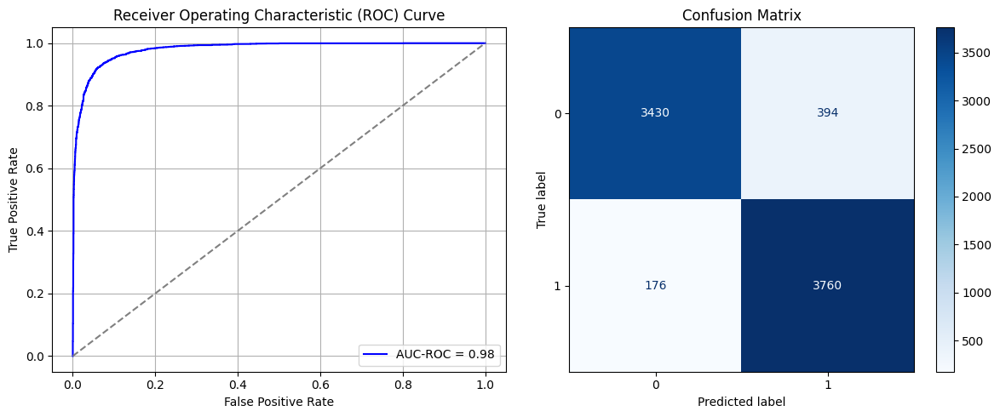

Best threshold based on F1-score: 0.6530545353889465
Time elapsed (performance): 68.20535900600044


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_85"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_595 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_596 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_597 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_598 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_599 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_600 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_601 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.6895 - loss: 0.7782 - val_AUC: 0.0000e+00 - val_loss: 0.7358
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7157 - loss: 0.5788 - val_AUC: 0.0000e+00 - val_loss: 0.8711
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7476 - loss: 0.5551 - val_AUC: 0.0000e+00 - val_loss: 0.8851
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7593 - loss: 0.5516 - val_AUC: 0.0000e+00 - val_loss: 0.9271
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7501 - loss: 0.5519 - val_AUC: 0.0000e+00 - val_loss: 0.7634
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7541 - loss: 0.5502 - val_AUC: 0.0000e+00 - val_loss: 0.9015
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.7561 - loss: 0.5430 - val_AUC: 0.0000e+00 - val_loss: 0.7230
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_86"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_602 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_603 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_604 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_605 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_606 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_607 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_608 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - AUC: 0.6880 - loss: 0.8010 - val_AUC: 0.0000e+00 - val_loss: 0.8516
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7290 - loss: 0.5734 - val_AUC: 0.0000e+00 - val_loss: 0.7769
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7423 - loss: 0.5546 - val_AUC: 0.0000e+00 - val_loss: 0.7299
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7581 - loss: 0.5459 - val_AUC: 0.0000e+00 - val_loss: 0.7572
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7552 - loss: 0.5477 - val_AUC: 0.0000e+00 - val_loss: 0.7685
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7614 - loss: 0.5371 - val_AUC: 0.0000e+00 - val_loss: 0.7666
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7486 - loss: 0.5510 - val_AUC: 0.0000e+00 - val_loss: 0.8050
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_87"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_609 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_610 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_611 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_612 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_613 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_614 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_615 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.6848 - loss: 0.7936 - val_AUC: 0.0000e+00 - val_loss: 0.9147
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7216 - loss: 0.5813 - val_AUC: 0.0000e+00 - val_loss: 0.8155
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7357 - loss: 0.5628 - val_AUC: 0.0000e+00 - val_loss: 0.8840
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7529 - loss: 0.5483 - val_AUC: 0.0000e+00 - val_loss: 0.9293
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7647 - loss: 0.5394 - val_AUC: 0.0000e+00 - val_loss: 0.7739
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7576 - loss: 0.5406 - val_AUC: 0.0000e+00 - val_loss: 0.7815
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7644 - loss: 0.5324 - val_AUC: 0.0000e+00 - val_loss: 0.8283
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7670 - loss: 0.5291 - val_AUC: 0.0000e+00 - val_loss: 0.7598
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_88"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_616 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_617 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_618 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_619 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_620 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_621 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_622 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - AUC: 0.6892 - loss: 0.8003 - val_AUC: 0.0000e+00 - val_loss: 0.9463
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7233 - loss: 0.5727 - val_AUC: 0.0000e+00 - val_loss: 0.7688
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7435 - loss: 0.5576 - val_AUC: 0.0000e+00 - val_loss: 0.8080
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7490 - loss: 0.5502 - val_AUC: 0.0000e+00 - val_loss: 0.7989
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7648 - loss: 0.5429 - val_AUC: 0.0000e+00 - val_loss: 0.8659
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7708 - loss: 0.5373 - val_AUC: 0.0000e+00 - val_loss: 0.7983
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7537 - loss: 0.5478 - val_AUC: 0.0000e+00 - val_loss: 0.7809
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7634 - loss: 0.5336 - val_AUC: 0.0000e+00 - val_loss: 0.7770
Epoch 9/10
205/205 ━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_89"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_623 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_624 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_625 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_626 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_627 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_628 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_629 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.6842 - loss: 0.8034 - val_AUC: 0.0000e+00 - val_loss: 0.8841
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7171 - loss: 0.5740 - val_AUC: 0.0000e+00 - val_loss: 0.8055
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.7335 - loss: 0.5655 - val_AUC: 0.0000e+00 - val_loss: 0.7989
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7570 - loss: 0.5413 - val_AUC: 0.0000e+00 - val_loss: 0.8081
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7592 - loss: 0.5424 - val_AUC: 0.0000e+00 - val_loss: 0.7838
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7691 - loss: 0.5397 - val_AUC: 0.0000e+00 - val_loss: 0.9509
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7674 - loss: 0.5388 - val_AUC: 0.0000e+00 - val_loss: 0.8315
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7636 - loss: 0.5311 - val_AUC: 0.0000e+00 - val_loss: 0.8182
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_90"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_630 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_631 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_632 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_633 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_634 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_635 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_636 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - AUC: 0.6930 - loss: 0.7612 - val_AUC: 0.0000e+00 - val_loss: 0.7473
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7265 - loss: 0.5718 - val_AUC: 0.0000e+00 - val_loss: 0.8187
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7390 - loss: 0.5549 - val_AUC: 0.0000e+00 - val_loss: 0.7764
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7505 - loss: 0.5513 - val_AUC: 0.0000e+00 - val_loss: 0.7589
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7632 - loss: 0.5381 - val_AUC: 0.0000e+00 - val_loss: 0.6836
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7721 - loss: 0.5349 - val_AUC: 0.0000e+00 - val_loss: 0.8579
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7575 - loss: 0.5377 - val_AUC: 0.0000e+00 - val_loss: 0.7216
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7678 - loss: 0.5372 - val_AUC: 0.0000e+00 - val_loss: 0.8838
Epoch 9/10
205/205 ━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_91"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_637 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_638 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_639 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_640 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_641 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_642 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_643 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.6921 - loss: 0.7896 - val_AUC: 0.0000e+00 - val_loss: 0.8241
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7253 - loss: 0.5722 - val_AUC: 0.0000e+00 - val_loss: 0.9197
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7343 - loss: 0.5594 - val_AUC: 0.0000e+00 - val_loss: 0.8156
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7504 - loss: 0.5514 - val_AUC: 0.0000e+00 - val_loss: 0.7794
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7664 - loss: 0.5399 - val_AUC: 0.0000e+00 - val_loss: 0.7495
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7651 - loss: 0.5374 - val_AUC: 0.0000e+00 - val_loss: 0.7783
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7662 - loss: 0.5334 - val_AUC: 0.0000e+00 - val_loss: 0.8206
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7689 - loss: 0.5377 - val_AUC: 0.0000e+00 - val_loss: 0.9020
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_92"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_644 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_645 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_646 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_647 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_648 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_649 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_650 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.6969 - loss: 0.7484 - val_AUC: 0.0000e+00 - val_loss: 0.8220
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7286 - loss: 0.5718 - val_AUC: 0.0000e+00 - val_loss: 0.8813
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7420 - loss: 0.5611 - val_AUC: 0.0000e+00 - val_loss: 0.8662
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7536 - loss: 0.5444 - val_AUC: 0.0000e+00 - val_loss: 0.8249
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7588 - loss: 0.5429 - val_AUC: 0.0000e+00 - val_loss: 0.6766
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7597 - loss: 0.5390 - val_AUC: 0.0000e+00 - val_loss: 0.7321
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7742 - loss: 0.5272 - val_AUC: 0.0000e+00 - val_loss: 0.7723
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7627 - loss: 0.5374 - val_AUC: 0.0000e+00 - val_loss: 0.7338
Epoch 9/10
205/205 ━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_93"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_651 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_652 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_653 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_654 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_655 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_656 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_657 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.6913 - loss: 0.7439 - val_AUC: 0.0000e+00 - val_loss: 0.8426
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7101 - loss: 0.5778 - val_AUC: 0.0000e+00 - val_loss: 0.7419
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7432 - loss: 0.5580 - val_AUC: 0.0000e+00 - val_loss: 0.7807
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7522 - loss: 0.5468 - val_AUC: 0.0000e+00 - val_loss: 0.7605
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7625 - loss: 0.5457 - val_AUC: 0.0000e+00 - val_loss: 0.8035
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7624 - loss: 0.5454 - val_AUC: 0.0000e+00 - val_loss: 0.8672
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7635 - loss: 0.5387 - val_AUC: 0.0000e+00 - val_loss: 0.7443
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7626 - loss: 0.5361 - val_AUC: 0.0000e+00 - val_loss: 0.6807
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_94"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_658 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_659 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_660 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_661 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_662 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_663 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_664 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.6784 - loss: 0.8272 - val_AUC: 0.0000e+00 - val_loss: 0.7856
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7126 - loss: 0.5804 - val_AUC: 0.0000e+00 - val_loss: 0.7855
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7420 - loss: 0.5576 - val_AUC: 0.0000e+00 - val_loss: 0.8611
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7546 - loss: 0.5520 - val_AUC: 0.0000e+00 - val_loss: 0.7199
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7562 - loss: 0.5455 - val_AUC: 0.0000e+00 - val_loss: 0.7760
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7545 - loss: 0.5374 - val_AUC: 0.0000e+00 - val_loss: 0.7342
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7607 - loss: 0.5406 - val_AUC: 0.0000e+00 - val_loss: 0.8171
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7628 - loss: 0.5387 - val_AUC: 0.0000e+00 - val_loss: 0.7009
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_95"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_665 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_666 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_667 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_668 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_669 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_670 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_671 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.6903 - loss: 0.7779 - val_AUC: 0.0000e+00 - val_loss: 0.7231
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7225 - loss: 0.5801 - val_AUC: 0.0000e+00 - val_loss: 0.8346
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7340 - loss: 0.5664 - val_AUC: 0.0000e+00 - val_loss: 0.7965
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7537 - loss: 0.5493 - val_AUC: 0.0000e+00 - val_loss: 0.8360
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7580 - loss: 0.5447 - val_AUC: 0.0000e+00 - val_loss: 0.9017
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7559 - loss: 0.5413 - val_AUC: 0.0000e+00 - val_loss: 0.6974
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7587 - loss: 0.5427 - val_AUC: 0.0000e+00 - val_loss: 0.7066
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7656 - loss: 0.5370 - val_AUC: 0.0000e+00 - val_loss: 0.8117
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_96"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_672 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_673 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_674 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_675 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_676 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_677 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_678 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.6819 - loss: 0.8176 - val_AUC: 0.0000e+00 - val_loss: 0.7954
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7177 - loss: 0.5785 - val_AUC: 0.0000e+00 - val_loss: 0.9801
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7321 - loss: 0.5694 - val_AUC: 0.0000e+00 - val_loss: 0.8732
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7386 - loss: 0.5624 - val_AUC: 0.0000e+00 - val_loss: 0.7165
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7482 - loss: 0.5484 - val_AUC: 0.0000e+00 - val_loss: 0.8765
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7576 - loss: 0.5448 - val_AUC: 0.0000e+00 - val_loss: 0.7956
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7575 - loss: 0.5408 - val_AUC: 0.0000e+00 - val_loss: 0.8812
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7682 - loss: 0.5320 - val_AUC: 0.0000e+00 - val_loss: 0.7252
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_97"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_679 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_680 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_681 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_682 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_683 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_684 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_685 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.6884 - loss: 0.7881 - val_AUC: 0.0000e+00 - val_loss: 0.8366
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7181 - loss: 0.5795 - val_AUC: 0.0000e+00 - val_loss: 0.7940
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7470 - loss: 0.5540 - val_AUC: 0.0000e+00 - val_loss: 0.8081
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7447 - loss: 0.5536 - val_AUC: 0.0000e+00 - val_loss: 0.7606
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7596 - loss: 0.5364 - val_AUC: 0.0000e+00 - val_loss: 0.7985
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7636 - loss: 0.5363 - val_AUC: 0.0000e+00 - val_loss: 0.8023
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7595 - loss: 0.5413 - val_AUC: 0.0000e+00 - val_loss: 0.7765
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7660 - loss: 0.5352 - val_AUC: 0.0000e+00 - val_loss: 0.7481
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_98"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_686 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_687 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_688 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_689 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_690 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_691 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_692 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - AUC: 0.6932 - loss: 0.7881 - val_AUC: 0.0000e+00 - val_loss: 0.7746
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7066 - loss: 0.5811 - val_AUC: 0.0000e+00 - val_loss: 0.8152
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7426 - loss: 0.5568 - val_AUC: 0.0000e+00 - val_loss: 0.9404
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7501 - loss: 0.5538 - val_AUC: 0.0000e+00 - val_loss: 0.9410
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7571 - loss: 0.5460 - val_AUC: 0.0000e+00 - val_loss: 0.7906
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7562 - loss: 0.5508 - val_AUC: 0.0000e+00 - val_loss: 0.8087
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7632 - loss: 0.5428 - val_AUC: 0.0000e+00 - val_loss: 0.8184
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7618 - loss: 0.5371 - val_AUC: 0.0000e+00 - val_loss: 0.6756
Epoch 9/10
205/205 ━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_99"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_693 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_694 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_695 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_696 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_697 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_698 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_699 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - AUC: 0.6792 - loss: 0.8050 - val_AUC: 0.0000e+00 - val_loss: 0.8998
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7209 - loss: 0.5767 - val_AUC: 0.0000e+00 - val_loss: 0.7294
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7415 - loss: 0.5601 - val_AUC: 0.0000e+00 - val_loss: 0.8127
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7588 - loss: 0.5470 - val_AUC: 0.0000e+00 - val_loss: 0.7417
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7663 - loss: 0.5369 - val_AUC: 0.0000e+00 - val_loss: 0.7859
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7693 - loss: 0.5339 - val_AUC: 0.0000e+00 - val_loss: 0.7707
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7596 - loss: 0.5419 - val_AUC: 0.0000e+00 - val_loss: 0.7839
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_100"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_700 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_701 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_702 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_703 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_704 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_705 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_706 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.6740 - loss: 0.8218 - val_AUC: 0.0000e+00 - val_loss: 0.7047
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7189 - loss: 0.5765 - val_AUC: 0.0000e+00 - val_loss: 0.8164
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7407 - loss: 0.5577 - val_AUC: 0.0000e+00 - val_loss: 0.7283
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7558 - loss: 0.5472 - val_AUC: 0.0000e+00 - val_loss: 0.8679
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7476 - loss: 0.5541 - val_AUC: 0.0000e+00 - val_loss: 0.8591
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7548 - loss: 0.5445 - val_AUC: 0.0000e+00 - val_loss: 0.7183
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7631 - loss: 0.5379 - val_AUC: 0.0000e+00 - val_loss: 0.7819
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7661 - loss: 0.5400 - val_AUC: 0.0000e+00 - val_loss: 0.7393
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_101"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_707 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_708 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_709 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_710 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_711 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_712 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_713 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.6931 - loss: 0.7610 - val_AUC: 0.0000e+00 - val_loss: 0.7794
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7413 - loss: 0.5642 - val_AUC: 0.0000e+00 - val_loss: 0.9338
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7480 - loss: 0.5577 - val_AUC: 0.0000e+00 - val_loss: 0.7746
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7491 - loss: 0.5512 - val_AUC: 0.0000e+00 - val_loss: 0.7050
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7505 - loss: 0.5491 - val_AUC: 0.0000e+00 - val_loss: 0.8161
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7642 - loss: 0.5404 - val_AUC: 0.0000e+00 - val_loss: 0.7235
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7644 - loss: 0.5355 - val_AUC: 0.0000e+00 - val_loss: 0.6972
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7605 - loss: 0.5416 - val_AUC: 0.0000e+00 - val_loss: 0.8071
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_102"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_714 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_715 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_716 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_717 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_718 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_719 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_720 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - AUC: 0.6816 - loss: 0.7811 - val_AUC: 0.0000e+00 - val_loss: 0.8061
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7239 - loss: 0.5732 - val_AUC: 0.0000e+00 - val_loss: 0.8055
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7436 - loss: 0.5555 - val_AUC: 0.0000e+00 - val_loss: 0.8067
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7543 - loss: 0.5464 - val_AUC: 0.0000e+00 - val_loss: 0.7325
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7569 - loss: 0.5434 - val_AUC: 0.0000e+00 - val_loss: 0.7814
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7447 - loss: 0.5572 - val_AUC: 0.0000e+00 - val_loss: 0.8579
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7586 - loss: 0.5381 - val_AUC: 0.0000e+00 - val_loss: 0.8346
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7781 - loss: 0.5235 - val_AUC: 0.0000e+00 - val_loss: 0.8238
Epoch 9/10
205/205 ━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_103"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_721 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_722 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_723 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_724 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_725 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_726 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_727 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.6844 - loss: 0.7692 - val_AUC: 0.0000e+00 - val_loss: 0.7581
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7124 - loss: 0.5803 - val_AUC: 0.0000e+00 - val_loss: 0.9536
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7385 - loss: 0.5603 - val_AUC: 0.0000e+00 - val_loss: 0.6898
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7491 - loss: 0.5491 - val_AUC: 0.0000e+00 - val_loss: 0.8143
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7527 - loss: 0.5501 - val_AUC: 0.0000e+00 - val_loss: 0.8538
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7564 - loss: 0.5447 - val_AUC: 0.0000e+00 - val_loss: 0.8068
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7777 - loss: 0.5284 - val_AUC: 0.0000e+00 - val_loss: 0.7799
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7593 - loss: 0.5360 - val_AUC: 0.0000e+00 - val_loss: 0.7042
Epoch 9/10
205/205 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_104"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_728 (Dense)               │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_729 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_730 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_731 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_732 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_733 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_734 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.6872 - loss: 0.8038 - val_AUC: 0.0000e+00 - val_loss: 0.8888
Epoch 2/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7279 - loss: 0.5732 - val_AUC: 0.0000e+00 - val_loss: 0.8702
Epoch 3/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7506 - loss: 0.5523 - val_AUC: 0.0000e+00 - val_loss: 0.7075
Epoch 4/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7493 - loss: 0.5483 - val_AUC: 0.0000e+00 - val_loss: 0.8820
Epoch 5/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7565 - loss: 0.5428 - val_AUC: 0.0000e+00 - val_loss: 0.9436
Epoch 6/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.7632 - loss: 0.5351 - val_AUC: 0.0000e+00 - val_loss: 0.7211
Epoch 7/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7637 - loss: 0.5355 - val_AUC: 0.0000e+00 - val_loss: 0.7900
Epoch 8/10
205/205 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7677 - loss: 0.5282 - val_AUC: 0.0000e+00 - val_loss: 0.6821
Epoch 9/10
205/205 ━━━━━

In [34]:
times_train = 5
times_fine_tune = 20

FPR = []
FNR = []

for i in range(times_train):
  model_source_SRS_ROS = create_dnn_model(X_S_train.shape[1])
  train_and_evaluate(model_source_SRS_ROS, X_S_train, X_S_test, y_S_train, y_S_test, "Source")
  for j in range(times_fine_tune):
    fpr, fnr = fine_tuning(X_T_train_SRS, X_T_test, y_T_train_SRS, y_T_test, 0, 4)
    # print(output)
    FPR.append(fpr)
    FNR.append(fnr)

ParamFit = pd.DataFrame([FPR, FNR]).T
ParamFit.columns=['FPR', 'FNR']

# fine_tuning(X_T_train_SRS, X_T_test, y_T_train_SRS, y_T_test, 0, 4)

In [35]:
print('Mean:', ParamFit['FNR'].mean())
print('Var:', ParamFit['FNR'].var())

Mean: 0.5521107266435985
Var: 0.009062335862062877


In [36]:
print(ParamFit)
ParamFit.to_csv('SRS_ROS_Fine_Tuning.csv')

         FPR       FNR
0   0.145853  0.435986
1   0.087703  0.508651
2   0.108675  0.463668
3   0.108675  0.474048
4   0.073403  0.519031
..       ...       ...
95  0.059104  0.577855
96  0.088656  0.519031
97  0.089609  0.522491
98  0.066730  0.567474
99  0.085796  0.536332

[100 rows x 2 columns]


## Systematic Resampling:

In this case, we examine the possibility of performing Random Oversampling on the minority class using systematic sampling. For this purpose, taking a sampling interval of $k$, we would compile a total of $k*\frac{N_0-N_1}{N_1}$ systematic samples from the minority class in order to balance the dataset. We sample the starting point from 1 to $k$ *with replacement*, since a highly imbalanced dataset will require sampling with replacement in order to achieve a balanced dataset.

In particular, we take $k=10$ for the source data sampling, and take $k=20$ for the target training data resampling.

In [42]:
X_S_Sy, y_S_Sy = systematic_resampler(data_S_full, data_S_full.iloc[:, -1], 10)
print(y_S_Sy)

X_S_train, X_S_test, y_S_train, y_S_test = train_test_split(X_S_Sy, y_S_Sy, test_size=0.20, random_state=0)
X_T_train, X_T_test, y_T_train, y_T_test = train_test_split(data_T_X, data_T_y, test_size=0.20, random_state=0)
T_train = pd.concat([X_T_train, y_T_train], axis=1)

X_T_train_Sy, y_T_train_Sy = systematic_resampler(T_train, T_train.iloc[:, -1], 20)
print(y_T_train_Sy)

3910
19400
Nsamples= 39.61636828644501
0        0
1        0
2        0
3        0
4        0
        ..
23260    1
23270    1
23280    1
23290    1
23300    1
Name: Y2, Length: 38559, dtype: int64
1262
4090
Nsamples= 44.817749603803485
601     0
172     0
5113    0
3875    0
3981    0
       ..
5840    1
6107    1
5661    1
2646    1
5795    1
Name: Y, Length: 8124, dtype: int64


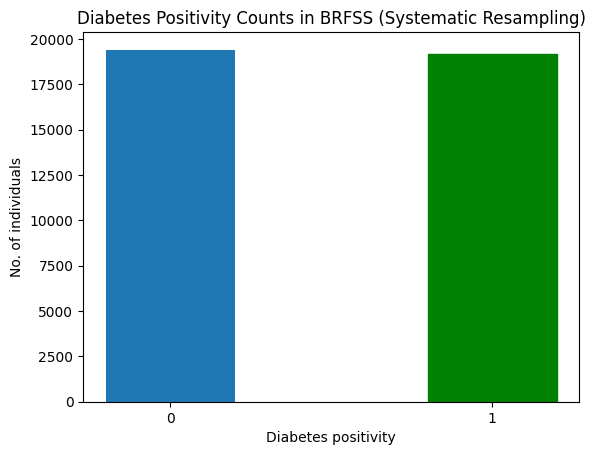

In [43]:
barlist = plt.bar([str(0),str(1)], y_S_Sy.value_counts(), width = 0.4)
barlist[1].set_color('g')

plt.xlabel("Diabetes positivity")
plt.ylabel("No. of individuals")
plt.title("Diabetes Positivity Counts in BRFSS (Systematic Resampling)")
plt.show()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_210"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1470 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1471 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1472 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1473 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1474 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1475 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1476 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 8s 5ms/step - AUC: 0.7634 - loss: 0.5665 - val_AUC: 0.9405 - val_loss: 0.3199
Epoch 2/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - AUC: 0.9293 - loss: 0.3391 - val_AUC: 0.9509 - val_loss: 0.3032
Epoch 3/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.9477 - loss: 0.2940 - val_AUC: 0.9615 - val_loss: 0.2723
Epoch 4/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.9589 - loss: 0.2595 - val_AUC: 0.9680 - val_loss: 0.2387
Epoch 5/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - AUC: 0.9604 - loss: 0.2546 - val_AUC: 0.9682 - val_loss: 0.2798
Epoch 6/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step - AUC: 0.9667 - loss: 0.2350 - val_AUC: 0.9676 - val_loss: 0.2638
Epoch 7/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.9694 - loss: 0.2227 - val_AUC: 0.9773 - val_loss: 0.1959
Epoch 8/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.9736 - loss: 0.2068 - val_AUC: 0.9755 - val_loss: 0.1992
Epoch 9/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - 

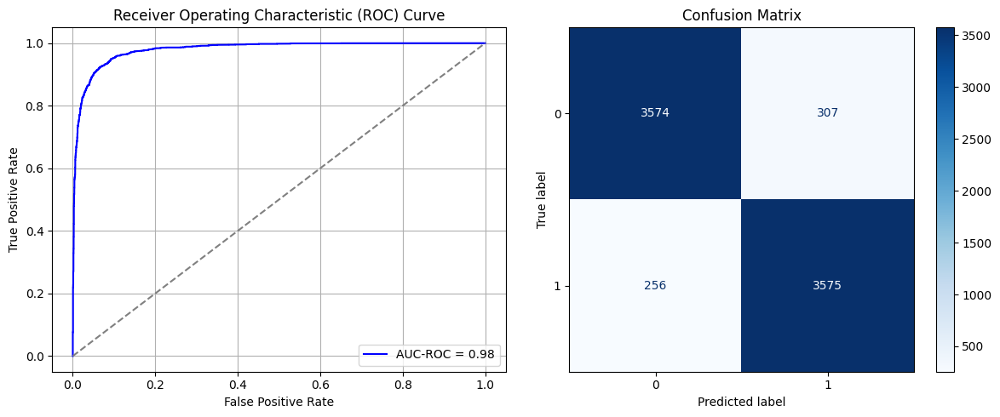

Best threshold based on F1-score: 0.41891559958457947
Time elapsed (performance): 46.613574095999866


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_211"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1477 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1478 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1479 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1480 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1481 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1482 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1483 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.6401 - loss: 0.8655 - val_AUC: 0.0000e+00 - val_loss: 0.8933
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7106 - loss: 0.5844 - val_AUC: 0.0000e+00 - val_loss: 0.9116
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7105 - loss: 0.5838 - val_AUC: 0.0000e+00 - val_loss: 0.8747
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7206 - loss: 0.5764 - val_AUC: 0.0000e+00 - val_loss: 0.9660
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7138 - loss: 0.5806 - val_AUC: 0.0000e+00 - val_loss: 0.8075
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7304 - loss: 0.5644 - val_AUC: 0.0000e+00 - val_loss: 0.8936
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7376 - loss: 0.5610 - val_AUC: 0.0000e+00 - val_loss: 0.8557
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7455 - loss: 0.5584 - val_AUC: 0.0000e+00 - val_loss: 0.8197
Epoch 9/10
204/204 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_212"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1484 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1485 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1486 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1487 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1488 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1489 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1490 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.6437 - loss: 0.8409 - val_AUC: 0.0000e+00 - val_loss: 0.7379
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7015 - loss: 0.5933 - val_AUC: 0.0000e+00 - val_loss: 0.8239
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7187 - loss: 0.5789 - val_AUC: 0.0000e+00 - val_loss: 0.7762
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7168 - loss: 0.5791 - val_AUC: 0.0000e+00 - val_loss: 0.9090
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7277 - loss: 0.5685 - val_AUC: 0.0000e+00 - val_loss: 0.7323
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7352 - loss: 0.5674 - val_AUC: 0.0000e+00 - val_loss: 0.8303
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7313 - loss: 0.5654 - val_AUC: 0.0000e+00 - val_loss: 0.9347
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7448 - loss: 0.5508 - val_AUC: 0.0000e+00 - val_loss: 0.7590
Epoch 9/10
204/204 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_213"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1491 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1492 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1493 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1494 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1495 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1496 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1497 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6534 - loss: 0.8295 - val_AUC: 0.0000e+00 - val_loss: 0.9124
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7049 - loss: 0.5856 - val_AUC: 0.0000e+00 - val_loss: 0.8924
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7251 - loss: 0.5789 - val_AUC: 0.0000e+00 - val_loss: 0.8736
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7130 - loss: 0.5787 - val_AUC: 0.0000e+00 - val_loss: 0.8505
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7219 - loss: 0.5736 - val_AUC: 0.0000e+00 - val_loss: 0.8538
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7251 - loss: 0.5677 - val_AUC: 0.0000e+00 - val_loss: 0.8417
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7319 - loss: 0.5672 - val_AUC: 0.0000e+00 - val_loss: 0.8833
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_214"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1498 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1499 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1500 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1501 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1502 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1503 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1504 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.6400 - loss: 0.8490 - val_AUC: 0.0000e+00 - val_loss: 0.9196
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6983 - loss: 0.5904 - val_AUC: 0.0000e+00 - val_loss: 0.8790
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7160 - loss: 0.5745 - val_AUC: 0.0000e+00 - val_loss: 0.8449
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7195 - loss: 0.5771 - val_AUC: 0.0000e+00 - val_loss: 0.8661
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7284 - loss: 0.5681 - val_AUC: 0.0000e+00 - val_loss: 0.8240
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7366 - loss: 0.5585 - val_AUC: 0.0000e+00 - val_loss: 0.8541
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7524 - loss: 0.5517 - val_AUC: 0.0000e+00 - val_loss: 0.8391
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_215"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1505 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1506 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1507 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1508 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1509 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1510 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1511 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.6511 - loss: 0.8374 - val_AUC: 0.0000e+00 - val_loss: 0.7978
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7076 - loss: 0.5813 - val_AUC: 0.0000e+00 - val_loss: 0.7789
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7078 - loss: 0.5844 - val_AUC: 0.0000e+00 - val_loss: 0.8343
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7073 - loss: 0.5810 - val_AUC: 0.0000e+00 - val_loss: 0.8916
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7308 - loss: 0.5695 - val_AUC: 0.0000e+00 - val_loss: 0.7017
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7353 - loss: 0.5673 - val_AUC: 0.0000e+00 - val_loss: 0.8581
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7365 - loss: 0.5607 - val_AUC: 0.0000e+00 - val_loss: 0.8849
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_216"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1512 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1513 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1514 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1515 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1516 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1517 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1518 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6610 - loss: 0.8005 - val_AUC: 0.0000e+00 - val_loss: 0.8387
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6957 - loss: 0.5940 - val_AUC: 0.0000e+00 - val_loss: 0.8979
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7131 - loss: 0.5818 - val_AUC: 0.0000e+00 - val_loss: 0.9311
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7124 - loss: 0.5731 - val_AUC: 0.0000e+00 - val_loss: 0.8908
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7184 - loss: 0.5762 - val_AUC: 0.0000e+00 - val_loss: 0.8259
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7326 - loss: 0.5639 - val_AUC: 0.0000e+00 - val_loss: 0.9529
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7308 - loss: 0.5640 - val_AUC: 0.0000e+00 - val_loss: 0.9002
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7373 - loss: 0.5644 - val_AUC: 0.0000e+00 - val_loss: 0.8677
Epoch 9/10
204/204 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_217"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1519 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1520 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1521 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1522 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1523 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1524 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1525 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.6685 - loss: 0.7948 - val_AUC: 0.0000e+00 - val_loss: 0.9433
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7007 - loss: 0.5905 - val_AUC: 0.0000e+00 - val_loss: 0.8471
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7095 - loss: 0.5802 - val_AUC: 0.0000e+00 - val_loss: 0.9649
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7239 - loss: 0.5689 - val_AUC: 0.0000e+00 - val_loss: 0.9034
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7299 - loss: 0.5641 - val_AUC: 0.0000e+00 - val_loss: 0.8771
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7440 - loss: 0.5539 - val_AUC: 0.0000e+00 - val_loss: 0.7884
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7228 - loss: 0.5642 - val_AUC: 0.0000e+00 - val_loss: 0.8303
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7338 - loss: 0.5635 - val_AUC: 0.0000e+00 - val_loss: 0.8497
Epoch 9/10
204/204 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_218"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1526 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1527 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1528 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1529 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1530 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1531 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1532 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6326 - loss: 0.8705 - val_AUC: 0.0000e+00 - val_loss: 0.8723
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7093 - loss: 0.5836 - val_AUC: 0.0000e+00 - val_loss: 0.8707
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7102 - loss: 0.5796 - val_AUC: 0.0000e+00 - val_loss: 0.9053
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7376 - loss: 0.5718 - val_AUC: 0.0000e+00 - val_loss: 0.9231
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7262 - loss: 0.5710 - val_AUC: 0.0000e+00 - val_loss: 0.9033
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7370 - loss: 0.5618 - val_AUC: 0.0000e+00 - val_loss: 0.8896
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7414 - loss: 0.5576 - val_AUC: 0.0000e+00 - val_loss: 0.7483
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7355 - loss: 0.5544 - val_AUC: 0.0000e+00 - val_loss: 0.7714
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_219"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1533 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1534 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1535 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1536 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1537 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1538 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1539 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - AUC: 0.6546 - loss: 0.8526 - val_AUC: 0.0000e+00 - val_loss: 0.8550
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7104 - loss: 0.5829 - val_AUC: 0.0000e+00 - val_loss: 0.8839
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7014 - loss: 0.5927 - val_AUC: 0.0000e+00 - val_loss: 1.0145
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7188 - loss: 0.5743 - val_AUC: 0.0000e+00 - val_loss: 0.9060
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7313 - loss: 0.5647 - val_AUC: 0.0000e+00 - val_loss: 0.8545
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7366 - loss: 0.5575 - val_AUC: 0.0000e+00 - val_loss: 0.9555
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7381 - loss: 0.5617 - val_AUC: 0.0000e+00 - val_loss: 0.8417
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7335 - loss: 0.5618 - val_AUC: 0.0000e+00 - val_loss: 0.8977
Epoch 9/10
204/204 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_220"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1540 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1541 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1542 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1543 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1544 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1545 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1546 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - AUC: 0.6568 - loss: 0.8015 - val_AUC: 0.0000e+00 - val_loss: 0.8827
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6999 - loss: 0.5914 - val_AUC: 0.0000e+00 - val_loss: 0.8552
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7171 - loss: 0.5693 - val_AUC: 0.0000e+00 - val_loss: 0.8875
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7187 - loss: 0.5743 - val_AUC: 0.0000e+00 - val_loss: 0.7996
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7183 - loss: 0.5731 - val_AUC: 0.0000e+00 - val_loss: 0.9005
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7291 - loss: 0.5718 - val_AUC: 0.0000e+00 - val_loss: 0.7941
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7394 - loss: 0.5654 - val_AUC: 0.0000e+00 - val_loss: 0.8633
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7433 - loss: 0.5516 - val_AUC: 0.0000e+00 - val_loss: 0.8260
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_221"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1547 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1548 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1549 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1550 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1551 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1552 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1553 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.6504 - loss: 0.8397 - val_AUC: 0.0000e+00 - val_loss: 0.8345
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7011 - loss: 0.5889 - val_AUC: 0.0000e+00 - val_loss: 1.0005
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7135 - loss: 0.5756 - val_AUC: 0.0000e+00 - val_loss: 0.7102
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7191 - loss: 0.5758 - val_AUC: 0.0000e+00 - val_loss: 0.8365
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7232 - loss: 0.5701 - val_AUC: 0.0000e+00 - val_loss: 0.8663
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7372 - loss: 0.5631 - val_AUC: 0.0000e+00 - val_loss: 0.8447
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7207 - loss: 0.5739 - val_AUC: 0.0000e+00 - val_loss: 0.9184
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7430 - loss: 0.5492 - val_AUC: 0.0000e+00 - val_loss: 0.8417
Epoch 9/10
204/204 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_222"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1554 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1555 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1556 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1557 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1558 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1559 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1560 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.6473 - loss: 0.8395 - val_AUC: 0.0000e+00 - val_loss: 0.8640
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6976 - loss: 0.5957 - val_AUC: 0.0000e+00 - val_loss: 0.9787
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7150 - loss: 0.5821 - val_AUC: 0.0000e+00 - val_loss: 0.8440
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7256 - loss: 0.5702 - val_AUC: 0.0000e+00 - val_loss: 0.9287
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7274 - loss: 0.5617 - val_AUC: 0.0000e+00 - val_loss: 0.7940
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7272 - loss: 0.5633 - val_AUC: 0.0000e+00 - val_loss: 0.8376
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7329 - loss: 0.5642 - val_AUC: 0.0000e+00 - val_loss: 0.8321
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7473 - loss: 0.5508 - val_AUC: 0.0000e+00 - val_loss: 0.8310
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_223"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1561 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1562 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1563 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1564 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1565 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1566 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1567 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.6482 - loss: 0.8396 - val_AUC: 0.0000e+00 - val_loss: 0.8476
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6979 - loss: 0.5912 - val_AUC: 0.0000e+00 - val_loss: 0.9360
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7217 - loss: 0.5786 - val_AUC: 0.0000e+00 - val_loss: 0.9743
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7286 - loss: 0.5651 - val_AUC: 0.0000e+00 - val_loss: 0.8330
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7243 - loss: 0.5743 - val_AUC: 0.0000e+00 - val_loss: 0.9107
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7386 - loss: 0.5632 - val_AUC: 0.0000e+00 - val_loss: 0.8467
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7353 - loss: 0.5669 - val_AUC: 0.0000e+00 - val_loss: 0.9039
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7381 - loss: 0.5620 - val_AUC: 0.0000e+00 - val_loss: 0.9441
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_224"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1568 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1569 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1570 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1571 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1572 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1573 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1574 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.6516 - loss: 0.8415 - val_AUC: 0.0000e+00 - val_loss: 0.9297
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6987 - loss: 0.5925 - val_AUC: 0.0000e+00 - val_loss: 0.9831
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7128 - loss: 0.5763 - val_AUC: 0.0000e+00 - val_loss: 0.8207
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7285 - loss: 0.5728 - val_AUC: 0.0000e+00 - val_loss: 0.8664
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7316 - loss: 0.5689 - val_AUC: 0.0000e+00 - val_loss: 0.9175
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7315 - loss: 0.5629 - val_AUC: 0.0000e+00 - val_loss: 0.8916
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7269 - loss: 0.5739 - val_AUC: 0.0000e+00 - val_loss: 0.8413
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7364 - loss: 0.5578 - val_AUC: 0.0000e+00 - val_loss: 0.9476
Epoch 9/10
204/204 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_225"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1575 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1576 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1577 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1578 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1579 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1580 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1581 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 9s 8ms/step - AUC: 0.6376 - loss: 0.8598 - val_AUC: 0.0000e+00 - val_loss: 0.9404
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6989 - loss: 0.5925 - val_AUC: 0.0000e+00 - val_loss: 0.8973
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7171 - loss: 0.5802 - val_AUC: 0.0000e+00 - val_loss: 0.8952
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7261 - loss: 0.5721 - val_AUC: 0.0000e+00 - val_loss: 0.8163
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7117 - loss: 0.5772 - val_AUC: 0.0000e+00 - val_loss: 0.8888
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7362 - loss: 0.5524 - val_AUC: 0.0000e+00 - val_loss: 0.9003
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7248 - loss: 0.5726 - val_AUC: 0.0000e+00 - val_loss: 0.9186
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7338 - loss: 0.5600 - val_AUC: 0.0000e+00 - val_loss: 0.8894
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_226"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1582 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1583 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1584 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1585 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1586 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1587 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1588 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6614 - loss: 0.8437 - val_AUC: 0.0000e+00 - val_loss: 0.9508
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7046 - loss: 0.5936 - val_AUC: 0.0000e+00 - val_loss: 0.8747
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7227 - loss: 0.5769 - val_AUC: 0.0000e+00 - val_loss: 0.8427
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7260 - loss: 0.5675 - val_AUC: 0.0000e+00 - val_loss: 0.8195
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7250 - loss: 0.5669 - val_AUC: 0.0000e+00 - val_loss: 0.8513
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7370 - loss: 0.5610 - val_AUC: 0.0000e+00 - val_loss: 0.7470
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7323 - loss: 0.5673 - val_AUC: 0.0000e+00 - val_loss: 0.8977
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7342 - loss: 0.5727 - val_AUC: 0.0000e+00 - val_loss: 0.9270
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_227"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1589 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1590 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1591 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1592 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1593 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1594 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1595 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.6458 - loss: 0.8352 - val_AUC: 0.0000e+00 - val_loss: 0.9134
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.6947 - loss: 0.5963 - val_AUC: 0.0000e+00 - val_loss: 0.8268
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7062 - loss: 0.5833 - val_AUC: 0.0000e+00 - val_loss: 0.8144
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7143 - loss: 0.5792 - val_AUC: 0.0000e+00 - val_loss: 0.7529
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7220 - loss: 0.5721 - val_AUC: 0.0000e+00 - val_loss: 0.9317
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7200 - loss: 0.5714 - val_AUC: 0.0000e+00 - val_loss: 0.9200
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7371 - loss: 0.5604 - val_AUC: 0.0000e+00 - val_loss: 0.7710
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7362 - loss: 0.5604 - val_AUC: 0.0000e+00 - val_loss: 0.8321
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_228"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1596 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1597 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1598 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1599 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1600 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1601 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1602 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - AUC: 0.6492 - loss: 0.8194 - val_AUC: 0.0000e+00 - val_loss: 0.8501
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7056 - loss: 0.5882 - val_AUC: 0.0000e+00 - val_loss: 0.8209
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7092 - loss: 0.5822 - val_AUC: 0.0000e+00 - val_loss: 0.8715
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7206 - loss: 0.5745 - val_AUC: 0.0000e+00 - val_loss: 0.8743
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7212 - loss: 0.5725 - val_AUC: 0.0000e+00 - val_loss: 0.8354
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7299 - loss: 0.5654 - val_AUC: 0.0000e+00 - val_loss: 0.8284
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7396 - loss: 0.5568 - val_AUC: 0.0000e+00 - val_loss: 0.8088
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7392 - loss: 0.5548 - val_AUC: 0.0000e+00 - val_loss: 0.7922
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_229"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1603 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1604 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1605 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1606 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1607 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1608 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1609 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6469 - loss: 0.8565 - val_AUC: 0.0000e+00 - val_loss: 0.8459
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7011 - loss: 0.5947 - val_AUC: 0.0000e+00 - val_loss: 0.9312
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7098 - loss: 0.5761 - val_AUC: 0.0000e+00 - val_loss: 0.8238
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7195 - loss: 0.5791 - val_AUC: 0.0000e+00 - val_loss: 0.9188
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7321 - loss: 0.5686 - val_AUC: 0.0000e+00 - val_loss: 0.9273
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7285 - loss: 0.5657 - val_AUC: 0.0000e+00 - val_loss: 0.8773
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7277 - loss: 0.5707 - val_AUC: 0.0000e+00 - val_loss: 0.8232
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7361 - loss: 0.5601 - val_AUC: 0.0000e+00 - val_loss: 0.7944
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_230"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1610 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1611 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1612 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1613 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1614 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1615 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1616 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6415 - loss: 0.8651 - val_AUC: 0.0000e+00 - val_loss: 0.8466
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7043 - loss: 0.5919 - val_AUC: 0.0000e+00 - val_loss: 0.9048
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7049 - loss: 0.5834 - val_AUC: 0.0000e+00 - val_loss: 0.9145
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7121 - loss: 0.5743 - val_AUC: 0.0000e+00 - val_loss: 0.8334
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7339 - loss: 0.5670 - val_AUC: 0.0000e+00 - val_loss: 0.8692
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7365 - loss: 0.5633 - val_AUC: 0.0000e+00 - val_loss: 0.8467
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7214 - loss: 0.5708 - val_AUC: 0.0000e+00 - val_loss: 0.8674
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7358 - loss: 0.5571 - val_AUC: 0.0000e+00 - val_loss: 0.7164
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_231"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1617 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1618 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1619 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1620 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1621 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1622 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1623 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - AUC: 0.7719 - loss: 0.5571 - val_AUC: 0.9366 - val_loss: 0.3270
Epoch 2/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.9294 - loss: 0.3388 - val_AUC: 0.9543 - val_loss: 0.2775
Epoch 3/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.9490 - loss: 0.2886 - val_AUC: 0.9597 - val_loss: 0.2589
Epoch 4/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.9588 - loss: 0.2598 - val_AUC: 0.9672 - val_loss: 0.2826
Epoch 5/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.9663 - loss: 0.2349 - val_AUC: 0.9726 - val_loss: 0.2115
Epoch 6/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 6s 6ms/step - AUC: 0.9696 - loss: 0.2224 - val_AUC: 0.9732 - val_loss: 0.2102
Epoch 7/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.9744 - loss: 0.2016 - val_AUC: 0.9767 - val_loss: 0.1921
Epoch 8/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - AUC: 0.9753 - loss: 0.1991 - val_AUC: 0.9728 - val_loss: 0.2118
Epoch 9/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - 

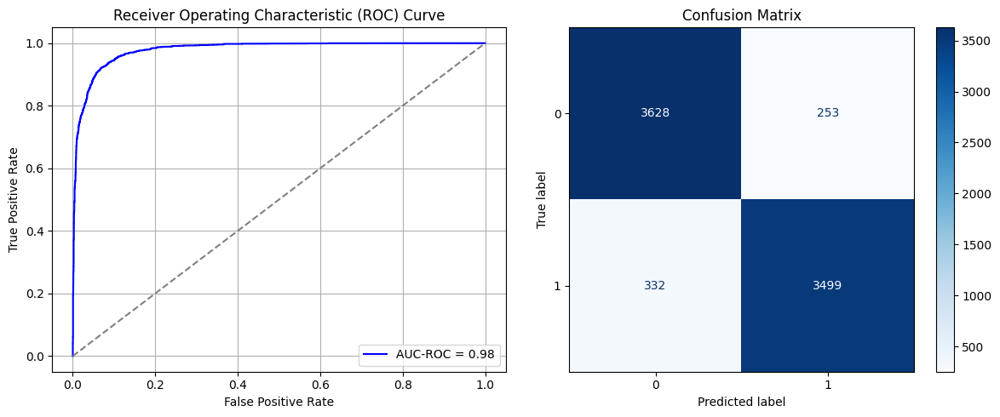

Best threshold based on F1-score: 0.3862503170967102
Time elapsed (performance): 58.08720021999943


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_232"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1624 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1625 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1626 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1627 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1628 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1629 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1630 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6417 - loss: 0.9141 - val_AUC: 0.0000e+00 - val_loss: 0.8407
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.6971 - loss: 0.6009 - val_AUC: 0.0000e+00 - val_loss: 0.8770
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7013 - loss: 0.5973 - val_AUC: 0.0000e+00 - val_loss: 0.8206
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6975 - loss: 0.5966 - val_AUC: 0.0000e+00 - val_loss: 0.9360
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7152 - loss: 0.5867 - val_AUC: 0.0000e+00 - val_loss: 0.9116
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7158 - loss: 0.5806 - val_AUC: 0.0000e+00 - val_loss: 0.7642
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7190 - loss: 0.5770 - val_AUC: 0.0000e+00 - val_loss: 0.9126
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_233"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1631 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1632 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1633 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1634 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1635 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1636 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1637 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6394 - loss: 0.9273 - val_AUC: 0.0000e+00 - val_loss: 0.9283
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6869 - loss: 0.6112 - val_AUC: 0.0000e+00 - val_loss: 0.8633
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6922 - loss: 0.5964 - val_AUC: 0.0000e+00 - val_loss: 0.8588
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6937 - loss: 0.5901 - val_AUC: 0.0000e+00 - val_loss: 0.9926
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7138 - loss: 0.5788 - val_AUC: 0.0000e+00 - val_loss: 0.9493
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7103 - loss: 0.5819 - val_AUC: 0.0000e+00 - val_loss: 0.7908
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7210 - loss: 0.5700 - val_AUC: 0.0000e+00 - val_loss: 0.8740
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7290 - loss: 0.5707 - val_AUC: 0.0000e+00 - val_loss: 0.8378
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_234"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1638 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1639 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1640 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1641 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1642 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1643 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1644 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - AUC: 0.6587 - loss: 0.9164 - val_AUC: 0.0000e+00 - val_loss: 0.9600
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6888 - loss: 0.5966 - val_AUC: 0.0000e+00 - val_loss: 0.8606
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6839 - loss: 0.6048 - val_AUC: 0.0000e+00 - val_loss: 0.9391
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6998 - loss: 0.5924 - val_AUC: 0.0000e+00 - val_loss: 0.8654
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7096 - loss: 0.5798 - val_AUC: 0.0000e+00 - val_loss: 0.8322
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7024 - loss: 0.5832 - val_AUC: 0.0000e+00 - val_loss: 0.8099
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7079 - loss: 0.5789 - val_AUC: 0.0000e+00 - val_loss: 0.9772
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7169 - loss: 0.5788 - val_AUC: 0.0000e+00 - val_loss: 0.8652
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_235"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1645 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1646 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1647 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1648 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1649 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1650 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1651 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6556 - loss: 0.8885 - val_AUC: 0.0000e+00 - val_loss: 0.8861
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7087 - loss: 0.5894 - val_AUC: 0.0000e+00 - val_loss: 0.8645
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6904 - loss: 0.6031 - val_AUC: 0.0000e+00 - val_loss: 0.8755
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7128 - loss: 0.5853 - val_AUC: 0.0000e+00 - val_loss: 0.8004
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7245 - loss: 0.5758 - val_AUC: 0.0000e+00 - val_loss: 0.8278
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7149 - loss: 0.5795 - val_AUC: 0.0000e+00 - val_loss: 0.8517
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7188 - loss: 0.5787 - val_AUC: 0.0000e+00 - val_loss: 0.8499
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7279 - loss: 0.5704 - val_AUC: 0.0000e+00 - val_loss: 0.8295
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_236"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1652 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1653 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1654 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1655 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1656 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1657 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1658 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6478 - loss: 0.9248 - val_AUC: 0.0000e+00 - val_loss: 1.0452
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6891 - loss: 0.5995 - val_AUC: 0.0000e+00 - val_loss: 0.9087
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6958 - loss: 0.5945 - val_AUC: 0.0000e+00 - val_loss: 0.9455
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7100 - loss: 0.5826 - val_AUC: 0.0000e+00 - val_loss: 0.7901
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7067 - loss: 0.5831 - val_AUC: 0.0000e+00 - val_loss: 0.8425
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7118 - loss: 0.5819 - val_AUC: 0.0000e+00 - val_loss: 0.8321
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7153 - loss: 0.5774 - val_AUC: 0.0000e+00 - val_loss: 0.7697
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7281 - loss: 0.5663 - val_AUC: 0.0000e+00 - val_loss: 0.8211
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_237"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1659 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1660 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1661 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1662 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1663 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1664 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1665 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6368 - loss: 0.9396 - val_AUC: 0.0000e+00 - val_loss: 0.9403
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6945 - loss: 0.6043 - val_AUC: 0.0000e+00 - val_loss: 0.9207
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6901 - loss: 0.5948 - val_AUC: 0.0000e+00 - val_loss: 0.9296
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7067 - loss: 0.5872 - val_AUC: 0.0000e+00 - val_loss: 0.6947
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7022 - loss: 0.5894 - val_AUC: 0.0000e+00 - val_loss: 0.8710
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7170 - loss: 0.5786 - val_AUC: 0.0000e+00 - val_loss: 0.8489
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7105 - loss: 0.5795 - val_AUC: 0.0000e+00 - val_loss: 0.8265
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7205 - loss: 0.5686 - val_AUC: 0.0000e+00 - val_loss: 0.7945
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_238"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1666 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1667 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1668 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1669 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1670 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1671 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1672 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6474 - loss: 0.9247 - val_AUC: 0.0000e+00 - val_loss: 0.9129
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6948 - loss: 0.6041 - val_AUC: 0.0000e+00 - val_loss: 0.8150
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6940 - loss: 0.6018 - val_AUC: 0.0000e+00 - val_loss: 0.7986
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7122 - loss: 0.5829 - val_AUC: 0.0000e+00 - val_loss: 0.9374
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7123 - loss: 0.5830 - val_AUC: 0.0000e+00 - val_loss: 0.7811
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7106 - loss: 0.5834 - val_AUC: 0.0000e+00 - val_loss: 0.8715
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7188 - loss: 0.5766 - val_AUC: 0.0000e+00 - val_loss: 1.0080
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7280 - loss: 0.5771 - val_AUC: 0.0000e+00 - val_loss: 0.9292
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_239"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1673 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1674 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1675 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1676 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1677 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1678 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1679 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6413 - loss: 0.9132 - val_AUC: 0.0000e+00 - val_loss: 0.9023
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6823 - loss: 0.6048 - val_AUC: 0.0000e+00 - val_loss: 0.8071
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7055 - loss: 0.5929 - val_AUC: 0.0000e+00 - val_loss: 0.8459
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7059 - loss: 0.5904 - val_AUC: 0.0000e+00 - val_loss: 0.7892
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7225 - loss: 0.5755 - val_AUC: 0.0000e+00 - val_loss: 0.8739
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7230 - loss: 0.5762 - val_AUC: 0.0000e+00 - val_loss: 0.7962
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7251 - loss: 0.5707 - val_AUC: 0.0000e+00 - val_loss: 0.8948
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7202 - loss: 0.5676 - val_AUC: 0.0000e+00 - val_loss: 0.7938
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_240"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1680 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1681 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1682 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1683 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1684 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1685 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1686 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.6305 - loss: 0.9558 - val_AUC: 0.0000e+00 - val_loss: 0.9138
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6978 - loss: 0.5960 - val_AUC: 0.0000e+00 - val_loss: 0.9183
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7028 - loss: 0.5878 - val_AUC: 0.0000e+00 - val_loss: 0.8615
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7011 - loss: 0.5862 - val_AUC: 0.0000e+00 - val_loss: 0.8475
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7136 - loss: 0.5820 - val_AUC: 0.0000e+00 - val_loss: 0.9121
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7191 - loss: 0.5720 - val_AUC: 0.0000e+00 - val_loss: 0.8504
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7166 - loss: 0.5723 - val_AUC: 0.0000e+00 - val_loss: 0.8888
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7179 - loss: 0.5734 - val_AUC: 0.0000e+00 - val_loss: 0.8199
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_241"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1687 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1688 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1689 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1690 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1691 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1692 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1693 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.6382 - loss: 0.9211 - val_AUC: 0.0000e+00 - val_loss: 0.8284
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6956 - loss: 0.6005 - val_AUC: 0.0000e+00 - val_loss: 0.8505
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6985 - loss: 0.5901 - val_AUC: 0.0000e+00 - val_loss: 0.8667
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6959 - loss: 0.5881 - val_AUC: 0.0000e+00 - val_loss: 0.8969
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7076 - loss: 0.5789 - val_AUC: 0.0000e+00 - val_loss: 0.8510
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7199 - loss: 0.5759 - val_AUC: 0.0000e+00 - val_loss: 0.7302
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7119 - loss: 0.5825 - val_AUC: 0.0000e+00 - val_loss: 0.8524
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7174 - loss: 0.5693 - val_AUC: 0.0000e+00 - val_loss: 0.9589
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_242"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1694 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1695 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1696 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1697 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1698 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1699 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1700 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - AUC: 0.6664 - loss: 0.8943 - val_AUC: 0.0000e+00 - val_loss: 0.8984
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6741 - loss: 0.6108 - val_AUC: 0.0000e+00 - val_loss: 0.7649
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6949 - loss: 0.5957 - val_AUC: 0.0000e+00 - val_loss: 0.7268
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6912 - loss: 0.5966 - val_AUC: 0.0000e+00 - val_loss: 0.8533
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7108 - loss: 0.5821 - val_AUC: 0.0000e+00 - val_loss: 0.8324
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7204 - loss: 0.5755 - val_AUC: 0.0000e+00 - val_loss: 0.8017
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7220 - loss: 0.5718 - val_AUC: 0.0000e+00 - val_loss: 0.7855
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7163 - loss: 0.5779 - val_AUC: 0.0000e+00 - val_loss: 0.8634
Epoch 9/10
204/204 ━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_243"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1701 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1702 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1703 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1704 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1705 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1706 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1707 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.6502 - loss: 0.9157 - val_AUC: 0.0000e+00 - val_loss: 0.8154
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6942 - loss: 0.5979 - val_AUC: 0.0000e+00 - val_loss: 0.7960
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6966 - loss: 0.5932 - val_AUC: 0.0000e+00 - val_loss: 0.8371
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7077 - loss: 0.5829 - val_AUC: 0.0000e+00 - val_loss: 0.8750
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7052 - loss: 0.5842 - val_AUC: 0.0000e+00 - val_loss: 0.7924
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7162 - loss: 0.5791 - val_AUC: 0.0000e+00 - val_loss: 0.8064
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7262 - loss: 0.5731 - val_AUC: 0.0000e+00 - val_loss: 0.8444
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7141 - loss: 0.5799 - val_AUC: 0.0000e+00 - val_loss: 0.8965
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_244"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1708 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1709 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1710 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1711 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1712 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1713 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1714 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6416 - loss: 0.9508 - val_AUC: 0.0000e+00 - val_loss: 0.8499
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6871 - loss: 0.6037 - val_AUC: 0.0000e+00 - val_loss: 1.0133
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7025 - loss: 0.5925 - val_AUC: 0.0000e+00 - val_loss: 0.8320
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7037 - loss: 0.5921 - val_AUC: 0.0000e+00 - val_loss: 0.8912
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6971 - loss: 0.5863 - val_AUC: 0.0000e+00 - val_loss: 0.8741
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7195 - loss: 0.5777 - val_AUC: 0.0000e+00 - val_loss: 0.9456
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7189 - loss: 0.5835 - val_AUC: 0.0000e+00 - val_loss: 0.9012
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7357 - loss: 0.5666 - val_AUC: 0.0000e+00 - val_loss: 0.8469
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_245"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1715 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1716 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1717 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1718 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1719 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1720 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1721 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - AUC: 0.6374 - loss: 0.9305 - val_AUC: 0.0000e+00 - val_loss: 0.9386
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6914 - loss: 0.6052 - val_AUC: 0.0000e+00 - val_loss: 0.9338
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6972 - loss: 0.5932 - val_AUC: 0.0000e+00 - val_loss: 0.7525
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7045 - loss: 0.5906 - val_AUC: 0.0000e+00 - val_loss: 0.8390
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7169 - loss: 0.5777 - val_AUC: 0.0000e+00 - val_loss: 0.8675
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7186 - loss: 0.5813 - val_AUC: 0.0000e+00 - val_loss: 0.8286
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7263 - loss: 0.5668 - val_AUC: 0.0000e+00 - val_loss: 0.7603
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7204 - loss: 0.5642 - val_AUC: 0.0000e+00 - val_loss: 0.9464
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_246"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1722 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1723 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1724 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1725 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1726 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1727 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1728 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6468 - loss: 0.9207 - val_AUC: 0.0000e+00 - val_loss: 0.9203
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6916 - loss: 0.6101 - val_AUC: 0.0000e+00 - val_loss: 1.0232
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6998 - loss: 0.5972 - val_AUC: 0.0000e+00 - val_loss: 0.8437
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7103 - loss: 0.5853 - val_AUC: 0.0000e+00 - val_loss: 0.8811
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7294 - loss: 0.5626 - val_AUC: 0.0000e+00 - val_loss: 0.8758
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7048 - loss: 0.5774 - val_AUC: 0.0000e+00 - val_loss: 0.8964
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7332 - loss: 0.5647 - val_AUC: 0.0000e+00 - val_loss: 0.8714
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7110 - loss: 0.5748 - val_AUC: 0.0000e+00 - val_loss: 0.7912
Epoch 9/10
204/204 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_247"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1729 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1730 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1731 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1732 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1733 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1734 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1735 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6554 - loss: 0.8933 - val_AUC: 0.0000e+00 - val_loss: 0.9045
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7022 - loss: 0.5970 - val_AUC: 0.0000e+00 - val_loss: 0.9140
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6881 - loss: 0.6046 - val_AUC: 0.0000e+00 - val_loss: 0.8265
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7026 - loss: 0.5875 - val_AUC: 0.0000e+00 - val_loss: 1.0136
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7038 - loss: 0.5920 - val_AUC: 0.0000e+00 - val_loss: 0.9283
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7114 - loss: 0.5731 - val_AUC: 0.0000e+00 - val_loss: 0.8626
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7166 - loss: 0.5787 - val_AUC: 0.0000e+00 - val_loss: 0.8971
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7208 - loss: 0.5744 - val_AUC: 0.0000e+00 - val_loss: 0.8661
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_248"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1736 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1737 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1738 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1739 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1740 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1741 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1742 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6367 - loss: 0.9287 - val_AUC: 0.0000e+00 - val_loss: 0.8372
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6904 - loss: 0.6001 - val_AUC: 0.0000e+00 - val_loss: 0.9008
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6947 - loss: 0.5955 - val_AUC: 0.0000e+00 - val_loss: 0.8076
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7012 - loss: 0.5908 - val_AUC: 0.0000e+00 - val_loss: 0.9145
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7068 - loss: 0.5829 - val_AUC: 0.0000e+00 - val_loss: 0.8613
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7047 - loss: 0.5867 - val_AUC: 0.0000e+00 - val_loss: 0.7934
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7129 - loss: 0.5777 - val_AUC: 0.0000e+00 - val_loss: 0.8808
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7228 - loss: 0.5727 - val_AUC: 0.0000e+00 - val_loss: 0.7758
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_249"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1743 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1744 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1745 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1746 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1747 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1748 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1749 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6508 - loss: 0.8990 - val_AUC: 0.0000e+00 - val_loss: 0.8427
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6883 - loss: 0.6021 - val_AUC: 0.0000e+00 - val_loss: 0.8552
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7014 - loss: 0.5874 - val_AUC: 0.0000e+00 - val_loss: 0.9967
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6996 - loss: 0.5870 - val_AUC: 0.0000e+00 - val_loss: 0.8539
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7105 - loss: 0.5838 - val_AUC: 0.0000e+00 - val_loss: 0.8312
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7115 - loss: 0.5809 - val_AUC: 0.0000e+00 - val_loss: 0.9088
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7214 - loss: 0.5720 - val_AUC: 0.0000e+00 - val_loss: 0.8003
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7185 - loss: 0.5758 - val_AUC: 0.0000e+00 - val_loss: 0.8126
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_250"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1750 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1751 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1752 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1753 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1754 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1755 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1756 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - AUC: 0.6596 - loss: 0.8831 - val_AUC: 0.0000e+00 - val_loss: 0.9150
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6854 - loss: 0.6042 - val_AUC: 0.0000e+00 - val_loss: 0.8459
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7040 - loss: 0.5894 - val_AUC: 0.0000e+00 - val_loss: 0.8970
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6952 - loss: 0.5966 - val_AUC: 0.0000e+00 - val_loss: 0.7910
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7144 - loss: 0.5809 - val_AUC: 0.0000e+00 - val_loss: 0.8687
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7083 - loss: 0.5856 - val_AUC: 0.0000e+00 - val_loss: 0.8551
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7050 - loss: 0.5890 - val_AUC: 0.0000e+00 - val_loss: 0.9119
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7197 - loss: 0.5637 - val_AUC: 0.0000e+00 - val_loss: 0.8270
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_251"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1757 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1758 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1759 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1760 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1761 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1762 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1763 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6345 - loss: 0.9495 - val_AUC: 0.0000e+00 - val_loss: 0.9439
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6963 - loss: 0.5967 - val_AUC: 0.0000e+00 - val_loss: 0.8698
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6992 - loss: 0.5904 - val_AUC: 0.0000e+00 - val_loss: 0.8677
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7131 - loss: 0.5846 - val_AUC: 0.0000e+00 - val_loss: 0.7794
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7109 - loss: 0.5862 - val_AUC: 0.0000e+00 - val_loss: 0.9447
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7264 - loss: 0.5712 - val_AUC: 0.0000e+00 - val_loss: 0.8581
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7216 - loss: 0.5722 - val_AUC: 0.0000e+00 - val_loss: 0.8214
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_252"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1764 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1765 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1766 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1767 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1768 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1769 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1770 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 8s 6ms/step - AUC: 0.7486 - loss: 0.5852 - val_AUC: 0.9136 - val_loss: 0.4298
Epoch 2/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.9074 - loss: 0.3864 - val_AUC: 0.9517 - val_loss: 0.2847
Epoch 3/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.9445 - loss: 0.3010 - val_AUC: 0.9637 - val_loss: 0.2720
Epoch 4/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.9594 - loss: 0.2583 - val_AUC: 0.9606 - val_loss: 0.2610
Epoch 5/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.9662 - loss: 0.2352 - val_AUC: 0.9755 - val_loss: 0.2025
Epoch 6/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.9701 - loss: 0.2201 - val_AUC: 0.9741 - val_loss: 0.2088
Epoch 7/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - AUC: 0.9725 - loss: 0.2117 - val_AUC: 0.9767 - val_loss: 0.1949
Epoch 8/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 6s 6ms/step - AUC: 0.9768 - loss: 0.1937 - val_AUC: 0.9763 - val_loss: 0.2003
Epoch 9/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - 

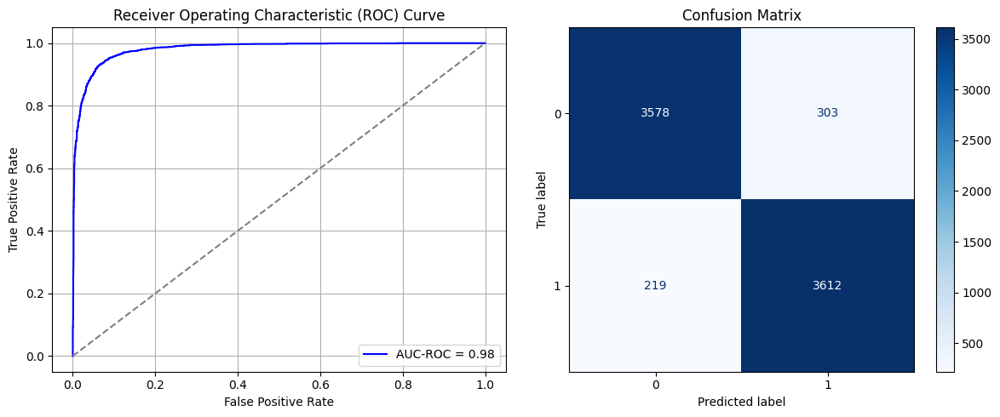

Best threshold based on F1-score: 0.4976755380630493
Time elapsed (performance): 50.67607526399843


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_253"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1771 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1772 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1773 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1774 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1775 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1776 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1777 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7180 - loss: 0.7649 - val_AUC: 0.0000e+00 - val_loss: 0.8728
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7366 - loss: 0.5668 - val_AUC: 0.0000e+00 - val_loss: 0.8326
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7347 - loss: 0.5563 - val_AUC: 0.0000e+00 - val_loss: 0.7935
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7520 - loss: 0.5450 - val_AUC: 0.0000e+00 - val_loss: 0.8735
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7492 - loss: 0.5432 - val_AUC: 0.0000e+00 - val_loss: 0.7806
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7615 - loss: 0.5289 - val_AUC: 0.0000e+00 - val_loss: 0.8600
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7504 - loss: 0.5419 - val_AUC: 0.0000e+00 - val_loss: 0.8392
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_254"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1778 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1779 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1780 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1781 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1782 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1783 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1784 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7080 - loss: 0.7635 - val_AUC: 0.0000e+00 - val_loss: 0.8083
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7380 - loss: 0.5525 - val_AUC: 0.0000e+00 - val_loss: 0.8273
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7532 - loss: 0.5399 - val_AUC: 0.0000e+00 - val_loss: 0.7161
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7427 - loss: 0.5467 - val_AUC: 0.0000e+00 - val_loss: 0.9264
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7624 - loss: 0.5299 - val_AUC: 0.0000e+00 - val_loss: 0.7977
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7565 - loss: 0.5253 - val_AUC: 0.0000e+00 - val_loss: 0.7765
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7564 - loss: 0.5222 - val_AUC: 0.0000e+00 - val_loss: 0.9183
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7469 - loss: 0.5338 - val_AUC: 0.0000e+00 - val_loss: 0.8306
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_255"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1785 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1786 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1787 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1788 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1789 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1790 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1791 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7295 - loss: 0.7421 - val_AUC: 0.0000e+00 - val_loss: 0.8404
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7343 - loss: 0.5585 - val_AUC: 0.0000e+00 - val_loss: 0.7968
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7448 - loss: 0.5494 - val_AUC: 0.0000e+00 - val_loss: 0.7913
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7561 - loss: 0.5374 - val_AUC: 0.0000e+00 - val_loss: 0.8760
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7525 - loss: 0.5398 - val_AUC: 0.0000e+00 - val_loss: 0.8367
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7546 - loss: 0.5364 - val_AUC: 0.0000e+00 - val_loss: 0.7687
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7629 - loss: 0.5286 - val_AUC: 0.0000e+00 - val_loss: 0.8475
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7539 - loss: 0.5372 - val_AUC: 0.0000e+00 - val_loss: 0.9216
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_256"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1792 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1793 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1794 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1795 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1796 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1797 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1798 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - AUC: 0.7175 - loss: 0.7358 - val_AUC: 0.0000e+00 - val_loss: 0.8553
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7423 - loss: 0.5558 - val_AUC: 0.0000e+00 - val_loss: 0.7423
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7504 - loss: 0.5474 - val_AUC: 0.0000e+00 - val_loss: 0.8684
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7457 - loss: 0.5502 - val_AUC: 0.0000e+00 - val_loss: 0.8737
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7565 - loss: 0.5317 - val_AUC: 0.0000e+00 - val_loss: 0.9430
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7560 - loss: 0.5325 - val_AUC: 0.0000e+00 - val_loss: 0.8357
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7614 - loss: 0.5254 - val_AUC: 0.0000e+00 - val_loss: 0.7723
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7712 - loss: 0.5263 - val_AUC: 0.0000e+00 - val_loss: 0.7789
Epoch 9/10
204/204 ━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_257"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1799 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1800 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1801 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1802 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1803 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1804 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1805 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7225 - loss: 0.7424 - val_AUC: 0.0000e+00 - val_loss: 0.8807
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7524 - loss: 0.5476 - val_AUC: 0.0000e+00 - val_loss: 0.7366
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7529 - loss: 0.5446 - val_AUC: 0.0000e+00 - val_loss: 0.8706
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7586 - loss: 0.5347 - val_AUC: 0.0000e+00 - val_loss: 0.7192
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7584 - loss: 0.5381 - val_AUC: 0.0000e+00 - val_loss: 0.9365
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7575 - loss: 0.5352 - val_AUC: 0.0000e+00 - val_loss: 0.8703
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7543 - loss: 0.5321 - val_AUC: 0.0000e+00 - val_loss: 0.9019
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7540 - loss: 0.5400 - val_AUC: 0.0000e+00 - val_loss: 0.9304
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_258"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1806 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1807 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1808 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1809 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1810 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1811 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1812 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7145 - loss: 0.7741 - val_AUC: 0.0000e+00 - val_loss: 0.8383
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7408 - loss: 0.5544 - val_AUC: 0.0000e+00 - val_loss: 0.8517
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7418 - loss: 0.5546 - val_AUC: 0.0000e+00 - val_loss: 0.8836
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7511 - loss: 0.5424 - val_AUC: 0.0000e+00 - val_loss: 0.8115
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7566 - loss: 0.5404 - val_AUC: 0.0000e+00 - val_loss: 0.8034
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7527 - loss: 0.5438 - val_AUC: 0.0000e+00 - val_loss: 0.7652
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7580 - loss: 0.5285 - val_AUC: 0.0000e+00 - val_loss: 0.9377
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7490 - loss: 0.5431 - val_AUC: 0.0000e+00 - val_loss: 0.8709
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_259"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1813 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1814 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1815 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1816 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1817 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1818 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1819 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7258 - loss: 0.7168 - val_AUC: 0.0000e+00 - val_loss: 0.8311
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7460 - loss: 0.5516 - val_AUC: 0.0000e+00 - val_loss: 0.8880
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7466 - loss: 0.5490 - val_AUC: 0.0000e+00 - val_loss: 0.9171
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7554 - loss: 0.5456 - val_AUC: 0.0000e+00 - val_loss: 0.9803
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7446 - loss: 0.5426 - val_AUC: 0.0000e+00 - val_loss: 0.8207
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7624 - loss: 0.5332 - val_AUC: 0.0000e+00 - val_loss: 0.6702
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7503 - loss: 0.5377 - val_AUC: 0.0000e+00 - val_loss: 0.6495
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7570 - loss: 0.5313 - val_AUC: 0.0000e+00 - val_loss: 0.7615
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_260"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1820 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1821 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1822 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1823 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1824 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1825 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1826 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7174 - loss: 0.7400 - val_AUC: 0.0000e+00 - val_loss: 0.7978
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7456 - loss: 0.5512 - val_AUC: 0.0000e+00 - val_loss: 0.9206
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7329 - loss: 0.5621 - val_AUC: 0.0000e+00 - val_loss: 0.8607
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7528 - loss: 0.5415 - val_AUC: 0.0000e+00 - val_loss: 0.7373
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7547 - loss: 0.5367 - val_AUC: 0.0000e+00 - val_loss: 0.8095
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7443 - loss: 0.5441 - val_AUC: 0.0000e+00 - val_loss: 0.7922
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7550 - loss: 0.5399 - val_AUC: 0.0000e+00 - val_loss: 0.7536
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7615 - loss: 0.5275 - val_AUC: 0.0000e+00 - val_loss: 0.8254
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_261"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1827 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1828 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1829 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1830 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1831 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1832 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1833 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7070 - loss: 0.7860 - val_AUC: 0.0000e+00 - val_loss: 0.7869
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7315 - loss: 0.5648 - val_AUC: 0.0000e+00 - val_loss: 0.7733
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7473 - loss: 0.5530 - val_AUC: 0.0000e+00 - val_loss: 0.7931
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7513 - loss: 0.5437 - val_AUC: 0.0000e+00 - val_loss: 0.8195
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7565 - loss: 0.5389 - val_AUC: 0.0000e+00 - val_loss: 0.7762
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7578 - loss: 0.5334 - val_AUC: 0.0000e+00 - val_loss: 0.7951
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7689 - loss: 0.5289 - val_AUC: 0.0000e+00 - val_loss: 0.8006
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7648 - loss: 0.5264 - val_AUC: 0.0000e+00 - val_loss: 0.7456
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_262"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1834 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1835 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1836 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1837 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1838 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1839 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1840 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - AUC: 0.7429 - loss: 0.7000 - val_AUC: 0.0000e+00 - val_loss: 0.8313
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7380 - loss: 0.5589 - val_AUC: 0.0000e+00 - val_loss: 0.8937
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7488 - loss: 0.5491 - val_AUC: 0.0000e+00 - val_loss: 0.8255
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7513 - loss: 0.5426 - val_AUC: 0.0000e+00 - val_loss: 0.7680
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7524 - loss: 0.5386 - val_AUC: 0.0000e+00 - val_loss: 0.8527
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7575 - loss: 0.5350 - val_AUC: 0.0000e+00 - val_loss: 0.8370
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7610 - loss: 0.5273 - val_AUC: 0.0000e+00 - val_loss: 0.8317
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7654 - loss: 0.5273 - val_AUC: 0.0000e+00 - val_loss: 0.8764
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_263"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1841 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1842 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1843 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1844 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1845 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1846 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1847 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7237 - loss: 0.7348 - val_AUC: 0.0000e+00 - val_loss: 0.7799
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7363 - loss: 0.5550 - val_AUC: 0.0000e+00 - val_loss: 0.8976
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7486 - loss: 0.5513 - val_AUC: 0.0000e+00 - val_loss: 0.8579
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7524 - loss: 0.5430 - val_AUC: 0.0000e+00 - val_loss: 0.8473
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7475 - loss: 0.5409 - val_AUC: 0.0000e+00 - val_loss: 0.7385
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7538 - loss: 0.5345 - val_AUC: 0.0000e+00 - val_loss: 0.8433
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7635 - loss: 0.5309 - val_AUC: 0.0000e+00 - val_loss: 0.7523
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_264"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1848 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1849 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1850 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1851 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1852 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1853 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1854 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7335 - loss: 0.7085 - val_AUC: 0.0000e+00 - val_loss: 0.8747
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7387 - loss: 0.5558 - val_AUC: 0.0000e+00 - val_loss: 0.8017
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7506 - loss: 0.5453 - val_AUC: 0.0000e+00 - val_loss: 0.8878
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7374 - loss: 0.5537 - val_AUC: 0.0000e+00 - val_loss: 0.7939
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7462 - loss: 0.5455 - val_AUC: 0.0000e+00 - val_loss: 0.7902
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7645 - loss: 0.5289 - val_AUC: 0.0000e+00 - val_loss: 0.8303
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7612 - loss: 0.5295 - val_AUC: 0.0000e+00 - val_loss: 0.7131
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7566 - loss: 0.5305 - val_AUC: 0.0000e+00 - val_loss: 0.7513
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_265"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1855 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1856 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1857 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1858 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1859 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1860 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1861 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7194 - loss: 0.7214 - val_AUC: 0.0000e+00 - val_loss: 0.8113
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7373 - loss: 0.5548 - val_AUC: 0.0000e+00 - val_loss: 0.7392
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7596 - loss: 0.5361 - val_AUC: 0.0000e+00 - val_loss: 0.8120
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7631 - loss: 0.5253 - val_AUC: 0.0000e+00 - val_loss: 0.7796
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7507 - loss: 0.5442 - val_AUC: 0.0000e+00 - val_loss: 0.7990
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7530 - loss: 0.5346 - val_AUC: 0.0000e+00 - val_loss: 0.7830
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7600 - loss: 0.5193 - val_AUC: 0.0000e+00 - val_loss: 0.8176
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7568 - loss: 0.5337 - val_AUC: 0.0000e+00 - val_loss: 0.8533
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_266"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1862 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1863 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1864 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1865 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1866 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1867 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1868 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


204/204 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - AUC: 0.7341 - loss: 0.6932 - val_AUC: 0.0000e+00 - val_loss: 0.7779
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7400 - loss: 0.5593 - val_AUC: 0.0000e+00 - val_loss: 0.7752
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7413 - loss: 0.5482 - val_AUC: 0.0000e+00 - val_loss: 0.7251
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7404 - loss: 0.5548 - val_AUC: 0.0000e+00 - val_loss: 0.7962
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7643 - loss: 0.5267 - val_AUC: 0.0000e+00 - val_loss: 0.7784
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7629 - loss: 0.5328 - val_AUC: 0.0000e+00 - val_loss: 0.7960
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7566 - loss: 0.5308 - val_AUC: 0.0000e+00 - val_loss: 0.8809
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7664 - loss: 0.5244 - val_AUC: 0.0000e+00 - val_loss: 0.7708
Epoch 9/10
204/204 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_267"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1869 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1870 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1871 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1872 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1873 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1874 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1875 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7172 - loss: 0.7399 - val_AUC: 0.0000e+00 - val_loss: 0.8196
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7371 - loss: 0.5647 - val_AUC: 0.0000e+00 - val_loss: 0.9118
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7401 - loss: 0.5558 - val_AUC: 0.0000e+00 - val_loss: 0.8412
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7594 - loss: 0.5349 - val_AUC: 0.0000e+00 - val_loss: 0.8777
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7617 - loss: 0.5339 - val_AUC: 0.0000e+00 - val_loss: 0.8125
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7522 - loss: 0.5394 - val_AUC: 0.0000e+00 - val_loss: 0.7436
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7529 - loss: 0.5337 - val_AUC: 0.0000e+00 - val_loss: 0.7138
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7640 - loss: 0.5241 - val_AUC: 0.0000e+00 - val_loss: 0.8734
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_268"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1876 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1877 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1878 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1879 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1880 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1881 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1882 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - AUC: 0.7139 - loss: 0.7410 - val_AUC: 0.0000e+00 - val_loss: 0.8023
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7495 - loss: 0.5488 - val_AUC: 0.0000e+00 - val_loss: 0.8679
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7602 - loss: 0.5422 - val_AUC: 0.0000e+00 - val_loss: 0.7349
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7693 - loss: 0.5257 - val_AUC: 0.0000e+00 - val_loss: 0.7762
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7599 - loss: 0.5324 - val_AUC: 0.0000e+00 - val_loss: 0.9168
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7688 - loss: 0.5186 - val_AUC: 0.0000e+00 - val_loss: 0.6936
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7552 - loss: 0.5326 - val_AUC: 0.0000e+00 - val_loss: 0.7919
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7613 - loss: 0.5301 - val_AUC: 0.0000e+00 - val_loss: 0.8472
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_269"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1883 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1884 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1885 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1886 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1887 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1888 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1889 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7176 - loss: 0.7382 - val_AUC: 0.0000e+00 - val_loss: 0.8062
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7377 - loss: 0.5571 - val_AUC: 0.0000e+00 - val_loss: 0.7744
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7566 - loss: 0.5386 - val_AUC: 0.0000e+00 - val_loss: 0.7729
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7509 - loss: 0.5420 - val_AUC: 0.0000e+00 - val_loss: 0.7597
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7594 - loss: 0.5336 - val_AUC: 0.0000e+00 - val_loss: 0.8266
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7437 - loss: 0.5477 - val_AUC: 0.0000e+00 - val_loss: 0.8150
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7582 - loss: 0.5336 - val_AUC: 0.0000e+00 - val_loss: 0.9049
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7531 - loss: 0.5404 - val_AUC: 0.0000e+00 - val_loss: 0.7622
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_270"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1890 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1891 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1892 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1893 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1894 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1895 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1896 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - AUC: 0.7116 - loss: 0.7667 - val_AUC: 0.0000e+00 - val_loss: 0.8136
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7397 - loss: 0.5599 - val_AUC: 0.0000e+00 - val_loss: 0.9074
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7438 - loss: 0.5462 - val_AUC: 0.0000e+00 - val_loss: 0.7996
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7577 - loss: 0.5383 - val_AUC: 0.0000e+00 - val_loss: 0.8724
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7490 - loss: 0.5401 - val_AUC: 0.0000e+00 - val_loss: 0.7201
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7625 - loss: 0.5263 - val_AUC: 0.0000e+00 - val_loss: 0.8579
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7685 - loss: 0.5256 - val_AUC: 0.0000e+00 - val_loss: 0.8682
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7583 - loss: 0.5310 - val_AUC: 0.0000e+00 - val_loss: 0.6990
Epoch 9/10
204/204 ━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_271"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1897 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1898 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1899 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1900 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1901 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1902 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1903 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable

/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))



Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - AUC: 0.7162 - loss: 0.7701 - val_AUC: 0.0000e+00 - val_loss: 0.7636
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7411 - loss: 0.5546 - val_AUC: 0.0000e+00 - val_loss: 0.7245
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7427 - loss: 0.5510 - val_AUC: 0.0000e+00 - val_loss: 0.8828
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7538 - loss: 0.5390 - val_AUC: 0.0000e+00 - val_loss: 0.7775
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7508 - loss: 0.5389 - val_AUC: 0.0000e+00 - val_loss: 0.7321
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7492 - loss: 0.5409 - val_AUC: 0.0000e+00 - val_loss: 0.6900
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7566 - loss: 0.5340 - val_AUC: 0.0000e+00 - val_loss: 0.9035
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7587 - l

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_272"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1904 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1905 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1906 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1907 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1908 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1909 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1910 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7262 - loss: 0.7144 - val_AUC: 0.0000e+00 - val_loss: 0.8590
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7373 - loss: 0.5583 - val_AUC: 0.0000e+00 - val_loss: 0.7700
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7416 - loss: 0.5518 - val_AUC: 0.0000e+00 - val_loss: 0.8367
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7518 - loss: 0.5404 - val_AUC: 0.0000e+00 - val_loss: 0.6607
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7440 - loss: 0.5436 - val_AUC: 0.0000e+00 - val_loss: 0.8449
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7592 - loss: 0.5345 - val_AUC: 0.0000e+00 - val_loss: 0.8499
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7717 - loss: 0.5188 - val_AUC: 0.0000e+00 - val_loss: 0.8782
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7699 - loss: 0.5228 - val_AUC: 0.0000e+00 - val_loss: 0.7800
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_273"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1911 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1912 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1913 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1914 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1915 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1916 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1917 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - AUC: 0.7517 - loss: 0.5720 - val_AUC: 0.9267 - val_loss: 0.3458
Epoch 2/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.9234 - loss: 0.3515 - val_AUC: 0.9612 - val_loss: 0.2566
Epoch 3/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.9589 - loss: 0.2589 - val_AUC: 0.9707 - val_loss: 0.2209
Epoch 4/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.9643 - loss: 0.2415 - val_AUC: 0.9748 - val_loss: 0.2135
Epoch 5/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 7s 8ms/step - AUC: 0.9702 - loss: 0.2200 - val_AUC: 0.9772 - val_loss: 0.1920
Epoch 6/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.9721 - loss: 0.2121 - val_AUC: 0.9781 - val_loss: 0.1892
Epoch 7/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.9759 - loss: 0.1958 - val_AUC: 0.9789 - val_loss: 0.1856
Epoch 8/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - AUC: 0.9781 - loss: 0.1877 - val_AUC: 0.9815 - val_loss: 0.1741
Epoch 9/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - 

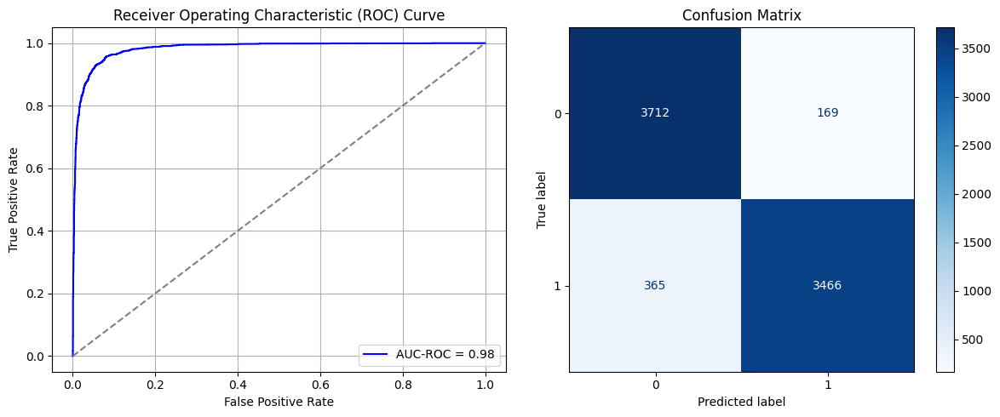

Best threshold based on F1-score: 0.2499828040599823
Time elapsed (performance): 69.67070059899925


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_274"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1918 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1919 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1920 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1921 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1922 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1923 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1924 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7263 - loss: 0.7009 - val_AUC: 0.0000e+00 - val_loss: 0.8401
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7519 - loss: 0.5453 - val_AUC: 0.0000e+00 - val_loss: 0.7471
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7723 - loss: 0.5295 - val_AUC: 0.0000e+00 - val_loss: 0.7864
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7688 - loss: 0.5280 - val_AUC: 0.0000e+00 - val_loss: 0.8090
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7886 - loss: 0.5070 - val_AUC: 0.0000e+00 - val_loss: 0.7448
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7797 - loss: 0.5199 - val_AUC: 0.0000e+00 - val_loss: 0.7825
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7780 - loss: 0.5176 - val_AUC: 0.0000e+00 - val_loss: 0.7849
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_275"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1925 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1926 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1927 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1928 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1929 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1930 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1931 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7261 - loss: 0.7183 - val_AUC: 0.0000e+00 - val_loss: 0.8742
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7417 - loss: 0.5586 - val_AUC: 0.0000e+00 - val_loss: 0.8460
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7654 - loss: 0.5293 - val_AUC: 0.0000e+00 - val_loss: 0.7717
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7720 - loss: 0.5275 - val_AUC: 0.0000e+00 - val_loss: 0.7869
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7735 - loss: 0.5240 - val_AUC: 0.0000e+00 - val_loss: 0.7744
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7865 - loss: 0.5151 - val_AUC: 0.0000e+00 - val_loss: 0.8661
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7771 - loss: 0.5183 - val_AUC: 0.0000e+00 - val_loss: 0.7054
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7866 - loss: 0.5131 - val_AUC: 0.0000e+00 - val_loss: 0.7914
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_276"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1932 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1933 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1934 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1935 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1936 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1937 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1938 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - AUC: 0.7223 - loss: 0.7276 - val_AUC: 0.0000e+00 - val_loss: 0.7777
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7602 - loss: 0.5484 - val_AUC: 0.0000e+00 - val_loss: 0.8205
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7647 - loss: 0.5418 - val_AUC: 0.0000e+00 - val_loss: 0.8037
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7780 - loss: 0.5226 - val_AUC: 0.0000e+00 - val_loss: 0.8356
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7775 - loss: 0.5160 - val_AUC: 0.0000e+00 - val_loss: 0.8205
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7826 - loss: 0.5171 - val_AUC: 0.0000e+00 - val_loss: 0.7373
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7744 - loss: 0.5196 - val_AUC: 0.0000e+00 - val_loss: 0.8358
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7778 - loss: 0.5155 - val_AUC: 0.0000e+00 - val_loss: 0.8921
Epoch 9/10
204/204 ━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_277"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1939 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1940 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1941 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1942 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1943 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1944 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1945 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7245 - loss: 0.7040 - val_AUC: 0.0000e+00 - val_loss: 0.8288
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7665 - loss: 0.5363 - val_AUC: 0.0000e+00 - val_loss: 0.8066
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7772 - loss: 0.5273 - val_AUC: 0.0000e+00 - val_loss: 0.7532
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7758 - loss: 0.5197 - val_AUC: 0.0000e+00 - val_loss: 0.7500
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7705 - loss: 0.5278 - val_AUC: 0.0000e+00 - val_loss: 0.8209
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7753 - loss: 0.5247 - val_AUC: 0.0000e+00 - val_loss: 0.7708
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7861 - loss: 0.5143 - val_AUC: 0.0000e+00 - val_loss: 0.7658
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7905 - loss: 0.5090 - val_AUC: 0.0000e+00 - val_loss: 0.7416
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_278"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1946 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1947 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1948 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1949 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1950 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1951 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1952 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7318 - loss: 0.7018 - val_AUC: 0.0000e+00 - val_loss: 0.9163
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7632 - loss: 0.5408 - val_AUC: 0.0000e+00 - val_loss: 0.8242
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7600 - loss: 0.5344 - val_AUC: 0.0000e+00 - val_loss: 0.7284
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7749 - loss: 0.5241 - val_AUC: 0.0000e+00 - val_loss: 0.7688
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7797 - loss: 0.5203 - val_AUC: 0.0000e+00 - val_loss: 0.7206
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7703 - loss: 0.5189 - val_AUC: 0.0000e+00 - val_loss: 0.7811
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7852 - loss: 0.5144 - val_AUC: 0.0000e+00 - val_loss: 0.7175
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7800 - loss: 0.5169 - val_AUC: 0.0000e+00 - val_loss: 0.8607
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_279"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1953 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1954 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1955 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1956 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1957 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1958 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1959 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - AUC: 0.7201 - loss: 0.7333 - val_AUC: 0.0000e+00 - val_loss: 0.8568
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7601 - loss: 0.5440 - val_AUC: 0.0000e+00 - val_loss: 0.8224
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7742 - loss: 0.5247 - val_AUC: 0.0000e+00 - val_loss: 0.8059
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7691 - loss: 0.5301 - val_AUC: 0.0000e+00 - val_loss: 0.7562
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7637 - loss: 0.5348 - val_AUC: 0.0000e+00 - val_loss: 0.7656
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7768 - loss: 0.5249 - val_AUC: 0.0000e+00 - val_loss: 0.8422
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7817 - loss: 0.5255 - val_AUC: 0.0000e+00 - val_loss: 0.7276
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7839 - loss: 0.5113 - val_AUC: 0.0000e+00 - val_loss: 0.7972
Epoch 9/10
204/204 ━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_280"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1960 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1961 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1962 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1963 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1964 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1965 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1966 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7422 - loss: 0.6724 - val_AUC: 0.0000e+00 - val_loss: 0.8207
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7591 - loss: 0.5454 - val_AUC: 0.0000e+00 - val_loss: 0.8738
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7608 - loss: 0.5388 - val_AUC: 0.0000e+00 - val_loss: 0.8567
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7702 - loss: 0.5256 - val_AUC: 0.0000e+00 - val_loss: 0.7662
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7773 - loss: 0.5226 - val_AUC: 0.0000e+00 - val_loss: 0.8956
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7932 - loss: 0.4976 - val_AUC: 0.0000e+00 - val_loss: 0.8160
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7860 - loss: 0.5133 - val_AUC: 0.0000e+00 - val_loss: 0.7219
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7855 - loss: 0.5068 - val_AUC: 0.0000e+00 - val_loss: 0.8442
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_281"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1967 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1968 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1969 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1970 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1971 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1972 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1973 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7322 - loss: 0.6980 - val_AUC: 0.0000e+00 - val_loss: 0.8034
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7604 - loss: 0.5387 - val_AUC: 0.0000e+00 - val_loss: 0.8074
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7747 - loss: 0.5231 - val_AUC: 0.0000e+00 - val_loss: 0.8544
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7621 - loss: 0.5388 - val_AUC: 0.0000e+00 - val_loss: 0.8439
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7762 - loss: 0.5227 - val_AUC: 0.0000e+00 - val_loss: 0.8551
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7857 - loss: 0.5177 - val_AUC: 0.0000e+00 - val_loss: 0.8693
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7828 - loss: 0.5146 - val_AUC: 0.0000e+00 - val_loss: 0.8100
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7802 - loss: 0.5101 - val_AUC: 0.0000e+00 - val_loss: 0.7372
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_282"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1974 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1975 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1976 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1977 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1978 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1979 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1980 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - AUC: 0.7307 - loss: 0.7238 - val_AUC: 0.0000e+00 - val_loss: 0.8439
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7502 - loss: 0.5535 - val_AUC: 0.0000e+00 - val_loss: 0.7967
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7636 - loss: 0.5298 - val_AUC: 0.0000e+00 - val_loss: 0.7580
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7727 - loss: 0.5201 - val_AUC: 0.0000e+00 - val_loss: 0.7810
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7704 - loss: 0.5241 - val_AUC: 0.0000e+00 - val_loss: 0.7605
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7754 - loss: 0.5194 - val_AUC: 0.0000e+00 - val_loss: 0.8287
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7765 - loss: 0.5181 - val_AUC: 0.0000e+00 - val_loss: 0.7735
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7881 - loss: 0.5081 - val_AUC: 0.0000e+00 - val_loss: 0.8975
Epoch 9/10
204/204 ━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_283"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1981 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1982 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1983 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1984 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1985 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1986 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1987 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - AUC: 0.7269 - loss: 0.7211 - val_AUC: 0.0000e+00 - val_loss: 0.7477
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7650 - loss: 0.5373 - val_AUC: 0.0000e+00 - val_loss: 0.7590
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7695 - loss: 0.5310 - val_AUC: 0.0000e+00 - val_loss: 0.7072
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7828 - loss: 0.5172 - val_AUC: 0.0000e+00 - val_loss: 0.6946
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7795 - loss: 0.5248 - val_AUC: 0.0000e+00 - val_loss: 0.8160
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7785 - loss: 0.5203 - val_AUC: 0.0000e+00 - val_loss: 0.7501
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7779 - loss: 0.5223 - val_AUC: 0.0000e+00 - val_loss: 0.7157
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7819 - loss: 0.5150 - val_AUC: 0.0000e+00 - val_loss: 0.8422
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_284"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1988 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1989 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1990 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1991 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1992 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1993 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1994 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7148 - loss: 0.7383 - val_AUC: 0.0000e+00 - val_loss: 0.7919
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7487 - loss: 0.5516 - val_AUC: 0.0000e+00 - val_loss: 0.8021
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7662 - loss: 0.5306 - val_AUC: 0.0000e+00 - val_loss: 0.8231
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7766 - loss: 0.5146 - val_AUC: 0.0000e+00 - val_loss: 0.8790
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7756 - loss: 0.5253 - val_AUC: 0.0000e+00 - val_loss: 0.7843
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7728 - loss: 0.5175 - val_AUC: 0.0000e+00 - val_loss: 0.7300
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7780 - loss: 0.5238 - val_AUC: 0.0000e+00 - val_loss: 0.7708
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7768 - loss: 0.5121 - val_AUC: 0.0000e+00 - val_loss: 0.7896
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_285"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1995 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1996 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1997 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1998 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1999 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2000 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2001 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7268 - loss: 0.7154 - val_AUC: 0.0000e+00 - val_loss: 0.7994
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7618 - loss: 0.5412 - val_AUC: 0.0000e+00 - val_loss: 0.8414
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7725 - loss: 0.5334 - val_AUC: 0.0000e+00 - val_loss: 0.8248
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7755 - loss: 0.5205 - val_AUC: 0.0000e+00 - val_loss: 0.7769
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7768 - loss: 0.5233 - val_AUC: 0.0000e+00 - val_loss: 0.7753
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7794 - loss: 0.5140 - val_AUC: 0.0000e+00 - val_loss: 0.7285
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7847 - loss: 0.5128 - val_AUC: 0.0000e+00 - val_loss: 0.7421
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7856 - loss: 0.5054 - val_AUC: 0.0000e+00 - val_loss: 0.8432
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_286"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2002 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2003 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2004 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2005 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2006 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2007 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2008 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7239 - loss: 0.7147 - val_AUC: 0.0000e+00 - val_loss: 0.7951
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7581 - loss: 0.5435 - val_AUC: 0.0000e+00 - val_loss: 0.8817
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7722 - loss: 0.5296 - val_AUC: 0.0000e+00 - val_loss: 0.8176
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7628 - loss: 0.5326 - val_AUC: 0.0000e+00 - val_loss: 0.7603
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7772 - loss: 0.5196 - val_AUC: 0.0000e+00 - val_loss: 0.8473
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7709 - loss: 0.5283 - val_AUC: 0.0000e+00 - val_loss: 0.7333
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7771 - loss: 0.5159 - val_AUC: 0.0000e+00 - val_loss: 0.7208
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7826 - loss: 0.5170 - val_AUC: 0.0000e+00 - val_loss: 0.8702
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_287"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2009 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2010 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2011 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2012 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2013 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2014 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2015 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7244 - loss: 0.7266 - val_AUC: 0.0000e+00 - val_loss: 0.8117
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7419 - loss: 0.5547 - val_AUC: 0.0000e+00 - val_loss: 0.7419
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7673 - loss: 0.5319 - val_AUC: 0.0000e+00 - val_loss: 0.8014
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7783 - loss: 0.5233 - val_AUC: 0.0000e+00 - val_loss: 0.8804
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7679 - loss: 0.5285 - val_AUC: 0.0000e+00 - val_loss: 0.8453
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7807 - loss: 0.5204 - val_AUC: 0.0000e+00 - val_loss: 0.7741
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7843 - loss: 0.5137 - val_AUC: 0.0000e+00 - val_loss: 0.6818
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7793 - loss: 0.5163 - val_AUC: 0.0000e+00 - val_loss: 0.8115
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_288"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2016 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2017 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2018 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2019 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2020 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2021 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2022 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7201 - loss: 0.7459 - val_AUC: 0.0000e+00 - val_loss: 0.8198
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7445 - loss: 0.5560 - val_AUC: 0.0000e+00 - val_loss: 0.7954
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7701 - loss: 0.5273 - val_AUC: 0.0000e+00 - val_loss: 0.8337
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7832 - loss: 0.5180 - val_AUC: 0.0000e+00 - val_loss: 0.7834
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7693 - loss: 0.5275 - val_AUC: 0.0000e+00 - val_loss: 0.8659
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7744 - loss: 0.5210 - val_AUC: 0.0000e+00 - val_loss: 0.6821
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7846 - loss: 0.5127 - val_AUC: 0.0000e+00 - val_loss: 0.7687
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7769 - loss: 0.5241 - val_AUC: 0.0000e+00 - val_loss: 0.7180
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_289"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2023 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2024 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2025 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2026 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2027 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2028 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2029 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7241 - loss: 0.7242 - val_AUC: 0.0000e+00 - val_loss: 0.8225
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7625 - loss: 0.5385 - val_AUC: 0.0000e+00 - val_loss: 0.7839
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7535 - loss: 0.5384 - val_AUC: 0.0000e+00 - val_loss: 0.6969
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7637 - loss: 0.5394 - val_AUC: 0.0000e+00 - val_loss: 0.8224
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7799 - loss: 0.5228 - val_AUC: 0.0000e+00 - val_loss: 0.8350
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7666 - loss: 0.5286 - val_AUC: 0.0000e+00 - val_loss: 0.7001
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7770 - loss: 0.5202 - val_AUC: 0.0000e+00 - val_loss: 0.8170
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7832 - loss: 0.5200 - val_AUC: 0.0000e+00 - val_loss: 0.7927
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_290"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2030 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2031 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2032 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2033 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2034 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2035 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2036 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - AUC: 0.7259 - loss: 0.7328 - val_AUC: 0.0000e+00 - val_loss: 0.8890
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7529 - loss: 0.5508 - val_AUC: 0.0000e+00 - val_loss: 0.8080
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7739 - loss: 0.5240 - val_AUC: 0.0000e+00 - val_loss: 0.8821
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7708 - loss: 0.5295 - val_AUC: 0.0000e+00 - val_loss: 0.7265
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7757 - loss: 0.5329 - val_AUC: 0.0000e+00 - val_loss: 0.7579
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7779 - loss: 0.5223 - val_AUC: 0.0000e+00 - val_loss: 0.8174
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7717 - loss: 0.5205 - val_AUC: 0.0000e+00 - val_loss: 0.7983
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7868 - loss: 0.5042 - val_AUC: 0.0000e+00 - val_loss: 0.8147
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_291"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2037 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2038 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2039 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2040 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2041 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2042 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2043 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7319 - loss: 0.7127 - val_AUC: 0.0000e+00 - val_loss: 0.8313
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7624 - loss: 0.5420 - val_AUC: 0.0000e+00 - val_loss: 0.8974
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7737 - loss: 0.5263 - val_AUC: 0.0000e+00 - val_loss: 0.8091
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7665 - loss: 0.5299 - val_AUC: 0.0000e+00 - val_loss: 0.7321
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7849 - loss: 0.5126 - val_AUC: 0.0000e+00 - val_loss: 0.7755
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7851 - loss: 0.5151 - val_AUC: 0.0000e+00 - val_loss: 0.7689
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7641 - loss: 0.5285 - val_AUC: 0.0000e+00 - val_loss: 0.6946
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7769 - loss: 0.5149 - val_AUC: 0.0000e+00 - val_loss: 0.8211
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_292"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2044 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2045 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2046 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2047 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2048 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2049 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2050 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7345 - loss: 0.6991 - val_AUC: 0.0000e+00 - val_loss: 0.8162
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7736 - loss: 0.5325 - val_AUC: 0.0000e+00 - val_loss: 0.8134
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7724 - loss: 0.5263 - val_AUC: 0.0000e+00 - val_loss: 0.8071
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7644 - loss: 0.5338 - val_AUC: 0.0000e+00 - val_loss: 0.8736
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7776 - loss: 0.5206 - val_AUC: 0.0000e+00 - val_loss: 0.8578
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7874 - loss: 0.5148 - val_AUC: 0.0000e+00 - val_loss: 0.8594
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7795 - loss: 0.5153 - val_AUC: 0.0000e+00 - val_loss: 0.7246
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7881 - loss: 0.5045 - val_AUC: 0.0000e+00 - val_loss: 0.7342
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_293"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2051 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2052 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2053 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2054 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2055 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2056 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2057 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.7375 - loss: 0.6996 - val_AUC: 0.0000e+00 - val_loss: 0.7911
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7737 - loss: 0.5303 - val_AUC: 0.0000e+00 - val_loss: 0.7862
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7675 - loss: 0.5338 - val_AUC: 0.0000e+00 - val_loss: 0.8031
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7700 - loss: 0.5282 - val_AUC: 0.0000e+00 - val_loss: 0.8286
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7605 - loss: 0.5370 - val_AUC: 0.0000e+00 - val_loss: 0.8691
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7719 - loss: 0.5296 - val_AUC: 0.0000e+00 - val_loss: 0.8763
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7779 - loss: 0.5239 - val_AUC: 0.0000e+00 - val_loss: 0.7888
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7708 - loss: 0.5227 - val_AUC: 0.0000e+00 - val_loss: 0.7829
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_294"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2058 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2059 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2060 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2061 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2062 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2063 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2064 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 8s 6ms/step - AUC: 0.7505 - loss: 0.5743 - val_AUC: 0.9345 - val_loss: 0.3314
Epoch 2/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.9257 - loss: 0.3475 - val_AUC: 0.9514 - val_loss: 0.3076
Epoch 3/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - AUC: 0.9496 - loss: 0.2878 - val_AUC: 0.9672 - val_loss: 0.2331
Epoch 4/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 8s 5ms/step - AUC: 0.9614 - loss: 0.2511 - val_AUC: 0.9738 - val_loss: 0.2104
Epoch 5/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.9694 - loss: 0.2231 - val_AUC: 0.9761 - val_loss: 0.1969
Epoch 6/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.9731 - loss: 0.2091 - val_AUC: 0.9768 - val_loss: 0.1906
Epoch 7/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.9749 - loss: 0.2013 - val_AUC: 0.9803 - val_loss: 0.2066
Epoch 8/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - AUC: 0.9785 - loss: 0.1867 - val_AUC: 0.9810 - val_loss: 0.1882
Epoch 9/10
772/772 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - 

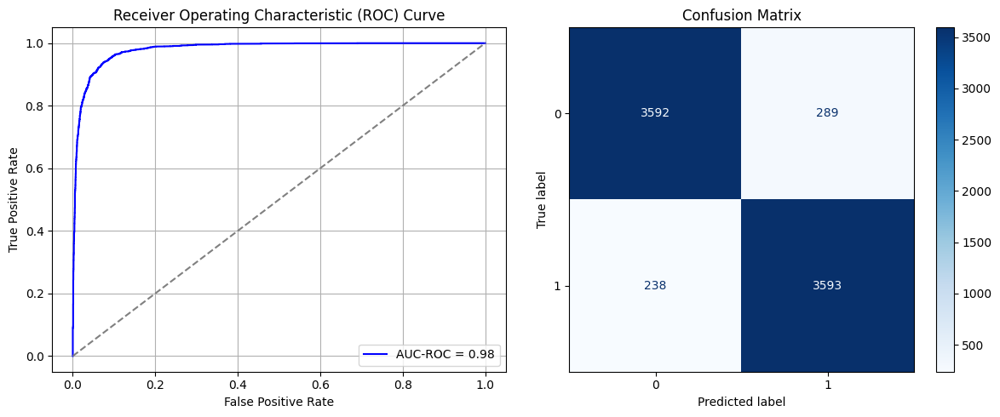

Best threshold based on F1-score: 0.3695448935031891
Time elapsed (performance): 58.43496822399902


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_295"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2065 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2066 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2067 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2068 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2069 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2070 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2071 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - AUC: 0.5982 - loss: 1.0564 - val_AUC: 0.0000e+00 - val_loss: 0.8249
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6243 - loss: 0.6337 - val_AUC: 0.0000e+00 - val_loss: 0.8496
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6925 - loss: 0.6058 - val_AUC: 0.0000e+00 - val_loss: 0.7998
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7197 - loss: 0.5923 - val_AUC: 0.0000e+00 - val_loss: 0.9076
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7478 - loss: 0.5655 - val_AUC: 0.0000e+00 - val_loss: 0.7512
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7484 - loss: 0.5579 - val_AUC: 0.0000e+00 - val_loss: 0.8934
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7553 - loss: 0.5467 - val_AUC: 0.0000e+00 - val_loss: 0.7940
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_296"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2072 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2073 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2074 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2075 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2076 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2077 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2078 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.5890 - loss: 1.0640 - val_AUC: 0.0000e+00 - val_loss: 0.8735
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6194 - loss: 0.6372 - val_AUC: 0.0000e+00 - val_loss: 0.8774
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6849 - loss: 0.6068 - val_AUC: 0.0000e+00 - val_loss: 0.8633
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7266 - loss: 0.5844 - val_AUC: 0.0000e+00 - val_loss: 0.7753
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7321 - loss: 0.5770 - val_AUC: 0.0000e+00 - val_loss: 0.8330
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7512 - loss: 0.5580 - val_AUC: 0.0000e+00 - val_loss: 0.8551
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7596 - loss: 0.5474 - val_AUC: 0.0000e+00 - val_loss: 0.8732
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7642 - loss: 0.5452 - val_AUC: 0.0000e+00 - val_loss: 0.7210
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_297"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2079 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2080 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2081 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2082 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2083 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2084 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2085 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.5972 - loss: 1.0350 - val_AUC: 0.0000e+00 - val_loss: 0.9366
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6320 - loss: 0.6294 - val_AUC: 0.0000e+00 - val_loss: 0.8934
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7025 - loss: 0.6001 - val_AUC: 0.0000e+00 - val_loss: 0.8378
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7363 - loss: 0.5818 - val_AUC: 0.0000e+00 - val_loss: 0.8251
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7582 - loss: 0.5580 - val_AUC: 0.0000e+00 - val_loss: 0.8213
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7507 - loss: 0.5606 - val_AUC: 0.0000e+00 - val_loss: 0.7717
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7631 - loss: 0.5485 - val_AUC: 0.0000e+00 - val_loss: 0.9396
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7573 - loss: 0.5569 - val_AUC: 0.0000e+00 - val_loss: 0.9118
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_298"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2086 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2087 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2088 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2089 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2090 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2091 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2092 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.6115 - loss: 0.9951 - val_AUC: 0.0000e+00 - val_loss: 0.8702
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.6381 - loss: 0.6222 - val_AUC: 0.0000e+00 - val_loss: 0.8483
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6879 - loss: 0.6104 - val_AUC: 0.0000e+00 - val_loss: 0.9002
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7420 - loss: 0.5710 - val_AUC: 0.0000e+00 - val_loss: 0.8167
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7595 - loss: 0.5563 - val_AUC: 0.0000e+00 - val_loss: 0.8053
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7561 - loss: 0.5561 - val_AUC: 0.0000e+00 - val_loss: 0.7451
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7654 - loss: 0.5443 - val_AUC: 0.0000e+00 - val_loss: 0.9167
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7570 - loss: 0.5414 - val_AUC: 0.0000e+00 - val_loss: 0.9687
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_299"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2093 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2094 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2095 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2096 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2097 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2098 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2099 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.6004 - loss: 1.0246 - val_AUC: 0.0000e+00 - val_loss: 0.8528
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6386 - loss: 0.6278 - val_AUC: 0.0000e+00 - val_loss: 0.9335
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7004 - loss: 0.6041 - val_AUC: 0.0000e+00 - val_loss: 0.8567
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7381 - loss: 0.5806 - val_AUC: 0.0000e+00 - val_loss: 0.9160
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7541 - loss: 0.5639 - val_AUC: 0.0000e+00 - val_loss: 1.0024
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7469 - loss: 0.5569 - val_AUC: 0.0000e+00 - val_loss: 0.9182
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7635 - loss: 0.5437 - val_AUC: 0.0000e+00 - val_loss: 0.7980
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7732 - loss: 0.5286 - val_AUC: 0.0000e+00 - val_loss: 0.7151
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_300"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2100 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2101 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2102 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2103 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2104 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2105 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2106 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.5906 - loss: 1.0465 - val_AUC: 0.0000e+00 - val_loss: 0.9902
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6232 - loss: 0.6349 - val_AUC: 0.0000e+00 - val_loss: 0.9252
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6984 - loss: 0.6052 - val_AUC: 0.0000e+00 - val_loss: 0.7687
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7229 - loss: 0.5830 - val_AUC: 0.0000e+00 - val_loss: 0.8354
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7460 - loss: 0.5668 - val_AUC: 0.0000e+00 - val_loss: 0.8467
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7560 - loss: 0.5532 - val_AUC: 0.0000e+00 - val_loss: 0.7611
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7599 - loss: 0.5450 - val_AUC: 0.0000e+00 - val_loss: 0.7583
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7678 - loss: 0.5375 - val_AUC: 0.0000e+00 - val_loss: 0.7240
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_301"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2107 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2108 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2109 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2110 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2111 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2112 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2113 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - AUC: 0.6001 - loss: 1.0312 - val_AUC: 0.0000e+00 - val_loss: 1.0267
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6073 - loss: 0.6400 - val_AUC: 0.0000e+00 - val_loss: 0.8621
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7039 - loss: 0.6034 - val_AUC: 0.0000e+00 - val_loss: 0.8821
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7326 - loss: 0.5772 - val_AUC: 0.0000e+00 - val_loss: 0.7977
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7443 - loss: 0.5664 - val_AUC: 0.0000e+00 - val_loss: 0.9033
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7603 - loss: 0.5525 - val_AUC: 0.0000e+00 - val_loss: 0.8176
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7621 - loss: 0.5432 - val_AUC: 0.0000e+00 - val_loss: 0.7599
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7492 - loss: 0.5544 - val_AUC: 0.0000e+00 - val_loss: 0.8342
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_302"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2114 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2115 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2116 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2117 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2118 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2119 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2120 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.5961 - loss: 1.0228 - val_AUC: 0.0000e+00 - val_loss: 0.9101
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6326 - loss: 0.6257 - val_AUC: 0.0000e+00 - val_loss: 0.9386
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7002 - loss: 0.5961 - val_AUC: 0.0000e+00 - val_loss: 0.7387
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7386 - loss: 0.5746 - val_AUC: 0.0000e+00 - val_loss: 0.9029
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7545 - loss: 0.5608 - val_AUC: 0.0000e+00 - val_loss: 0.8267
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7772 - loss: 0.5389 - val_AUC: 0.0000e+00 - val_loss: 0.8018
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7561 - loss: 0.5564 - val_AUC: 0.0000e+00 - val_loss: 0.9050
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_303"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2121 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2122 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2123 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2124 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2125 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2126 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2127 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.5973 - loss: 1.0470 - val_AUC: 0.0000e+00 - val_loss: 0.9135
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.6415 - loss: 0.6290 - val_AUC: 0.0000e+00 - val_loss: 0.9106
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7032 - loss: 0.6042 - val_AUC: 0.0000e+00 - val_loss: 0.9123
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7351 - loss: 0.5800 - val_AUC: 0.0000e+00 - val_loss: 0.7986
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7558 - loss: 0.5599 - val_AUC: 0.0000e+00 - val_loss: 0.7810
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7520 - loss: 0.5547 - val_AUC: 0.0000e+00 - val_loss: 0.7549
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7549 - loss: 0.5528 - val_AUC: 0.0000e+00 - val_loss: 0.8262
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7791 - loss: 0.5321 - val_AUC: 0.0000e+00 - val_loss: 0.7984
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_304"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2128 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2129 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2130 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2131 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2132 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2133 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2134 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6012 - loss: 0.9998 - val_AUC: 0.0000e+00 - val_loss: 1.0041
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6329 - loss: 0.6304 - val_AUC: 0.0000e+00 - val_loss: 0.9492
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.6887 - loss: 0.6024 - val_AUC: 0.0000e+00 - val_loss: 0.8751
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7291 - loss: 0.5805 - val_AUC: 0.0000e+00 - val_loss: 0.8262
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7481 - loss: 0.5651 - val_AUC: 0.0000e+00 - val_loss: 0.9750
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7378 - loss: 0.5658 - val_AUC: 0.0000e+00 - val_loss: 0.8385
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7630 - loss: 0.5384 - val_AUC: 0.0000e+00 - val_loss: 0.7641
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7594 - loss: 0.5456 - val_AUC: 0.0000e+00 - val_loss: 0.7676
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_305"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2135 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2136 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2137 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2138 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2139 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2140 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2141 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - AUC: 0.5958 - loss: 1.0326 - val_AUC: 0.0000e+00 - val_loss: 0.9364
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.6354 - loss: 0.6310 - val_AUC: 0.0000e+00 - val_loss: 0.8509
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7007 - loss: 0.6048 - val_AUC: 0.0000e+00 - val_loss: 0.8271
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7382 - loss: 0.5767 - val_AUC: 0.0000e+00 - val_loss: 0.7227
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7508 - loss: 0.5607 - val_AUC: 0.0000e+00 - val_loss: 0.8953
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7568 - loss: 0.5488 - val_AUC: 0.0000e+00 - val_loss: 0.7710
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7669 - loss: 0.5394 - val_AUC: 0.0000e+00 - val_loss: 0.8469
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7676 - loss: 0.5431 - val_AUC: 0.0000e+00 - val_loss: 0.9055
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_306"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2142 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2143 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2144 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2145 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2146 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2147 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2148 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.5877 - loss: 1.0528 - val_AUC: 0.0000e+00 - val_loss: 0.8542
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6305 - loss: 0.6261 - val_AUC: 0.0000e+00 - val_loss: 0.8173
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6942 - loss: 0.6050 - val_AUC: 0.0000e+00 - val_loss: 0.7447
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7379 - loss: 0.5806 - val_AUC: 0.0000e+00 - val_loss: 0.7543
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7497 - loss: 0.5568 - val_AUC: 0.0000e+00 - val_loss: 0.7242
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7573 - loss: 0.5567 - val_AUC: 0.0000e+00 - val_loss: 0.7720
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7574 - loss: 0.5520 - val_AUC: 0.0000e+00 - val_loss: 0.9718
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7573 - loss: 0.5474 - val_AUC: 0.0000e+00 - val_loss: 0.7674
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_307"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2149 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2150 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2151 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2152 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2153 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2154 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2155 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.5931 - loss: 1.0306 - val_AUC: 0.0000e+00 - val_loss: 0.9490
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6378 - loss: 0.6286 - val_AUC: 0.0000e+00 - val_loss: 0.8218
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6856 - loss: 0.6066 - val_AUC: 0.0000e+00 - val_loss: 0.8395
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7288 - loss: 0.5822 - val_AUC: 0.0000e+00 - val_loss: 0.7205
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7498 - loss: 0.5625 - val_AUC: 0.0000e+00 - val_loss: 0.9383
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7599 - loss: 0.5487 - val_AUC: 0.0000e+00 - val_loss: 0.8841
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7675 - loss: 0.5441 - val_AUC: 0.0000e+00 - val_loss: 0.8108
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7683 - loss: 0.5417 - val_AUC: 0.0000e+00 - val_loss: 0.8969
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_308"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2156 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2157 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2158 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2159 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2160 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2161 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2162 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.6010 - loss: 1.0286 - val_AUC: 0.0000e+00 - val_loss: 0.8861
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6347 - loss: 0.6274 - val_AUC: 0.0000e+00 - val_loss: 0.9160
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7099 - loss: 0.5982 - val_AUC: 0.0000e+00 - val_loss: 0.7884
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7366 - loss: 0.5809 - val_AUC: 0.0000e+00 - val_loss: 0.8661
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7437 - loss: 0.5639 - val_AUC: 0.0000e+00 - val_loss: 0.7479
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7561 - loss: 0.5560 - val_AUC: 0.0000e+00 - val_loss: 0.9399
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7611 - loss: 0.5452 - val_AUC: 0.0000e+00 - val_loss: 0.7071
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7719 - loss: 0.5376 - val_AUC: 0.0000e+00 - val_loss: 0.8491
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_309"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2163 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2164 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2165 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2166 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2167 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2168 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2169 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - AUC: 0.6049 - loss: 1.0207 - val_AUC: 0.0000e+00 - val_loss: 0.8897
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6214 - loss: 0.6380 - val_AUC: 0.0000e+00 - val_loss: 0.9844
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6868 - loss: 0.6057 - val_AUC: 0.0000e+00 - val_loss: 0.8015
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7282 - loss: 0.5808 - val_AUC: 0.0000e+00 - val_loss: 0.8200
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7490 - loss: 0.5610 - val_AUC: 0.0000e+00 - val_loss: 0.7466
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7421 - loss: 0.5591 - val_AUC: 0.0000e+00 - val_loss: 0.8533
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7664 - loss: 0.5443 - val_AUC: 0.0000e+00 - val_loss: 0.7688
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7716 - loss: 0.5436 - val_AUC: 0.0000e+00 - val_loss: 0.8898
Epoch 9/10
204/204 ━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_310"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2170 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2171 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2172 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2173 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2174 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2175 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2176 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.5939 - loss: 1.0331 - val_AUC: 0.0000e+00 - val_loss: 0.8591
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6262 - loss: 0.6335 - val_AUC: 0.0000e+00 - val_loss: 0.8397
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6854 - loss: 0.6071 - val_AUC: 0.0000e+00 - val_loss: 0.7938
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7249 - loss: 0.5857 - val_AUC: 0.0000e+00 - val_loss: 0.8329
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7434 - loss: 0.5700 - val_AUC: 0.0000e+00 - val_loss: 0.8209
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7602 - loss: 0.5476 - val_AUC: 0.0000e+00 - val_loss: 0.7920
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7582 - loss: 0.5436 - val_AUC: 0.0000e+00 - val_loss: 0.8295
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7721 - loss: 0.5413 - val_AUC: 0.0000e+00 - val_loss: 0.9140
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_311"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2177 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2178 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2179 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2180 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2181 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2182 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2183 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.5994 - loss: 1.0394 - val_AUC: 0.0000e+00 - val_loss: 0.9827
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6036 - loss: 0.6436 - val_AUC: 0.0000e+00 - val_loss: 0.8681
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6788 - loss: 0.6109 - val_AUC: 0.0000e+00 - val_loss: 0.9188
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7092 - loss: 0.5918 - val_AUC: 0.0000e+00 - val_loss: 0.8338
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7531 - loss: 0.5625 - val_AUC: 0.0000e+00 - val_loss: 0.8008
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7519 - loss: 0.5555 - val_AUC: 0.0000e+00 - val_loss: 0.9115
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7726 - loss: 0.5403 - val_AUC: 0.0000e+00 - val_loss: 0.6379
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7563 - loss: 0.5544 - val_AUC: 0.0000e+00 - val_loss: 1.0087
Epoch 9/10
204/204 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_312"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2184 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2185 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2186 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2187 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2188 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2189 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2190 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 11s 9ms/step - AUC: 0.6010 - loss: 1.0242 - val_AUC: 0.0000e+00 - val_loss: 0.8953
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.6195 - loss: 0.6369 - val_AUC: 0.0000e+00 - val_loss: 0.9094
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.6915 - loss: 0.6069 - val_AUC: 0.0000e+00 - val_loss: 0.8501
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7292 - loss: 0.5852 - val_AUC: 0.0000e+00 - val_loss: 0.7964
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7421 - loss: 0.5663 - val_AUC: 0.0000e+00 - val_loss: 0.8555
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7540 - loss: 0.5548 - val_AUC: 0.0000e+00 - val_loss: 0.7993
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7605 - loss: 0.5437 - val_AUC: 0.0000e+00 - val_loss: 0.7785
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7588 - loss: 0.5467 - val_AUC: 0.0000e+00 - val_loss: 0.8218
Epoch 9/10
204/204 ━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_313"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2191 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2192 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2193 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2194 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2195 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2196 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2197 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - AUC: 0.5939 - loss: 1.0453 - val_AUC: 0.0000e+00 - val_loss: 0.9653
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6420 - loss: 0.6260 - val_AUC: 0.0000e+00 - val_loss: 0.8797
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7063 - loss: 0.6002 - val_AUC: 0.0000e+00 - val_loss: 0.9028
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7278 - loss: 0.5820 - val_AUC: 0.0000e+00 - val_loss: 0.7500
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7439 - loss: 0.5643 - val_AUC: 0.0000e+00 - val_loss: 0.7718
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7700 - loss: 0.5442 - val_AUC: 0.0000e+00 - val_loss: 0.7396
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7666 - loss: 0.5437 - val_AUC: 0.0000e+00 - val_loss: 0.8927
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7538 - loss: 0.5512 - val_AUC: 0.0000e+00 - val_loss: 0.7756
Epoch 9/10
204/204 ━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_314"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2198 (Dense)              │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2199 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2200 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2201 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2202 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2203 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2204 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,681 (30.00 KB)

 Trainable params: 7,681 (30.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.5942 - loss: 1.0510 - val_AUC: 0.0000e+00 - val_loss: 0.9190
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6351 - loss: 0.6264 - val_AUC: 0.0000e+00 - val_loss: 0.8732
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6865 - loss: 0.6085 - val_AUC: 0.0000e+00 - val_loss: 0.8210
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7273 - loss: 0.5815 - val_AUC: 0.0000e+00 - val_loss: 0.8576
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - AUC: 0.7413 - loss: 0.5757 - val_AUC: 0.0000e+00 - val_loss: 0.8011
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7569 - loss: 0.5510 - val_AUC: 0.0000e+00 - val_loss: 0.7780
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7519 - loss: 0.5533 - val_AUC: 0.0000e+00 - val_loss: 1.0058
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7602 - loss: 0.5444 - val_AUC: 0.0000e+00 - val_loss: 0.8338
Epoch 9/10
204/204 ━━━━━

In [44]:
times_train = 5
times_fine_tune = 20

FPR = []
FNR = []

for i in range(times_train):
  model_source_Sy_ROS = create_dnn_model(X_S_train.shape[1])
  train_and_evaluate(model_source_Sy_ROS, X_S_train, X_S_test, y_S_train, y_S_test, "Source")
  for j in range(times_fine_tune):
    fpr, fnr = fine_tuning(X_T_train_Sy, X_T_test, y_T_train_Sy, y_T_test, 0, 4)
    FPR.append(fpr)
    FNR.append(fnr)

ParamFit = pd.DataFrame([FPR, FNR]).T
ParamFit.columns=['FPR', 'FNR']

# fine_tuning(X_T_train_Sy, X_T_test, y_T_train_Sy, y_T_test, 0, 4)

In [45]:
print('Mean:', ParamFit['FNR'].mean())
print('Var:', ParamFit['FNR'].var())

Mean: 0.566401384083045
Var: 0.004210565080166738


In [47]:
print(ParamFit)
ParamFit.to_csv('Sy_ROS_Fine_Tuning.csv')

         FPR       FNR
0   0.095329  0.557093
1   0.081983  0.570934
2   0.063870  0.626298
3   0.099142  0.553633
4   0.095329  0.557093
..       ...       ...
95  0.069590  0.581315
96  0.086749  0.557093
97  0.039085  0.674740
98  0.182078  0.380623
99  0.109628  0.498270

[100 rows x 2 columns]
